[View in Colaboratory](https://colab.research.google.com/github/123miles/AdaptiveSystems_project/blob/master/GAN_example.ipynb)

In [5]:
!pip install torchvision
!pip install tensorboardX
!pip install pillow

In [0]:
from PIL import Image
def register_extension(id, extension): Image.EXTENSION[extension.lower()] = id.upper()
Image.register_extension = register_extension
def register_extensions(id, extensions): 
  for extension in extensions: register_extension(id, extension)
Image.register_extensions = register_extensions

In [0]:
import os
import numpy as np
import errno
import torchvision.utils as vutils
from tensorboardX import SummaryWriter
from IPython import display
from matplotlib import pyplot as plt
import torch
from torch.autograd.variable import Variable


'''
    TensorBoard Data will be stored in './runs' path
'''


class Logger:

    def __init__(self, model_name, data_name):
        self.model_name = model_name
        self.data_name = data_name

        self.comment = '{}_{}'.format(model_name, data_name)
        self.data_subdir = '{}/{}'.format(model_name, data_name)

        # TensorBoard
        self.writer = SummaryWriter(comment=self.comment)

    def log(self, d_error, g_error, epoch, n_batch, num_batches):

        var_class = torch.autograd.Variable
        if type(d_error)==var_class:
            d_error = d_error.data.cpu().numpy()
        if type(g_error)==var_class:
            g_error = g_error.data.cpu().numpy()

        step = Logger._step(epoch, n_batch, num_batches)
        self.writer.add_scalar(
            '{}/D_error'.format(self.comment), d_error, step)
        self.writer.add_scalar(
            '{}/G_error'.format(self.comment), g_error, step)

    def log_images(self, images, num_images, epoch, n_batch, num_batches, format='NCHW', normalize=True):
        '''
        input images are expected in format (NCHW)
        '''
        if type(images) == np.ndarray:
            images = torch.from_numpy(images)

        if format=='NHWC':
            images = images.transpose(1,3)


        step = Logger._step(epoch, n_batch, num_batches)
        img_name = '{}/images{}'.format(self.comment, '')

        # Make horizontal grid from image tensor
        horizontal_grid = vutils.make_grid(
            images, normalize=normalize, scale_each=True)
        # Make vertical grid from image tensor
        nrows = int(np.sqrt(num_images))
        grid = vutils.make_grid(
            images, nrow=nrows, normalize=True, scale_each=True)

        # Add horizontal images to tensorboard
        self.writer.add_image(img_name, horizontal_grid, step)

        # Save plots
        self.save_torch_images(horizontal_grid, grid, epoch, n_batch)

    def save_torch_images(self, horizontal_grid, grid, epoch, n_batch, plot_horizontal=True):
        out_dir = './data/images/{}'.format(self.data_subdir)
        Logger._make_dir(out_dir)

        # Plot and save horizontal
        fig = plt.figure(figsize=(16, 16))
        plt.imshow(np.moveaxis(horizontal_grid.numpy(), 0, -1))
        plt.axis('off')
        if plot_horizontal:
            display.display(plt.gcf())
        self._save_images(fig, epoch, n_batch, 'hori')
        plt.close()

        # Save squared
        fig = plt.figure()
        plt.imshow(np.moveaxis(grid.numpy(), 0, -1))
        plt.axis('off')
        self._save_images(fig, epoch, n_batch)
        plt.close()

    def _save_images(self, fig, epoch, n_batch, comment=''):
        out_dir = './data/images/{}'.format(self.data_subdir)
        Logger._make_dir(out_dir)
        fig.savefig('{}/{}_epoch_{}_batch_{}.png'.format(out_dir,
                                                         comment, epoch, n_batch))

    def display_status(self, epoch, num_epochs, n_batch, num_batches, d_error, g_error, d_pred_real, d_pred_fake):

        var_class = torch.autograd.Variable
        if type(d_error)==var_class:
            d_error = d_error.data.cpu().numpy()[0]
        if type(g_error)==var_class:
            g_error = g_error.data.cpu().numpy()[0]
        if type(d_pred_real)==var_class:
            d_pred_real = d_pred_real.data
        if type(d_pred_fake)==var_class:
            d_pred_fake = d_pred_fake.data


        print('Epoch: [{}/{}], Batch Num: [{}/{}]'.format(
            epoch,num_epochs, n_batch, num_batches)
             )
        print('Discriminator Loss: {:.4f}, Generator Loss: {:.4f}'.format(d_error, g_error))
        print('D(x): {:.4f}, D(G(z)): {:.4f}'.format(d_pred_real.mean(), d_pred_fake.mean()))

    def save_models(self, generator, discriminator, epoch):
        out_dir = './data/models/{}'.format(self.data_subdir)
        Logger._make_dir(out_dir)
        torch.save(generator.state_dict(),
                   '{}/G_epoch_{}'.format(out_dir, epoch))
        torch.save(discriminator.state_dict(),
                   '{}/D_epoch_{}'.format(out_dir, epoch))

    def close(self):
        self.writer.close()

    # Private Functionality

    @staticmethod
    def _step(epoch, n_batch, num_batches):
        return epoch * num_batches + n_batch

    @staticmethod
    def _make_dir(directory):
        try:
            os.makedirs(directory)
        except OSError as e:
            if e.errno != errno.EEXIST:
                raise


In [0]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets

In [0]:
def mnist_data():
    compose = transforms.Compose(
        [transforms.ToTensor(),
         transforms.Normalize((.5, .5, .5), (.5, .5, .5))
        ])
    out_dir = './dataset'
    return datasets.MNIST(root=out_dir, train=True, transform=compose, download=True)

# Load data
data = mnist_data()

# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)

In [0]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x

discriminator = DiscriminatorNet()

In [0]:
 def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [0]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x

generator = GeneratorNet()

In [0]:
def noise(size):
    '''
    Generates a 1-d vector of gaussian sampled random values
    '''
    n = Variable(torch.randn(size, 100))
    return n

In [0]:
num_test_samples = 16
test_noise = noise(num_test_samples)

In [0]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)

In [0]:
loss = nn.BCELoss()

In [0]:
def ones_target(size):
    '''
    Tensor containing ones, with shape = size
    '''
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    '''
    Tensor containing zeros, with shape = size
    '''
    data = Variable(torch.zeros(size, 1))
    return data

In [0]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [0]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)

    # Reset gradients
    optimizer.zero_grad()

    # Sample noise and generate fake data
    prediction = discriminator(fake_data)

    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()

    # Update weights with gradients
    optimizer.step()

    # Return error
    return error

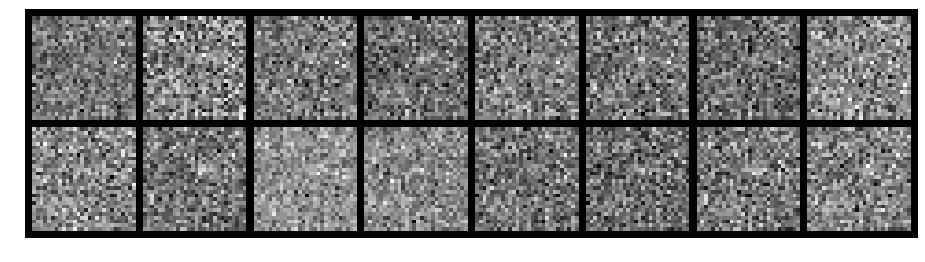

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3491, Generator Loss: 0.6808
D(x): 0.5259, D(G(z)): 0.5065


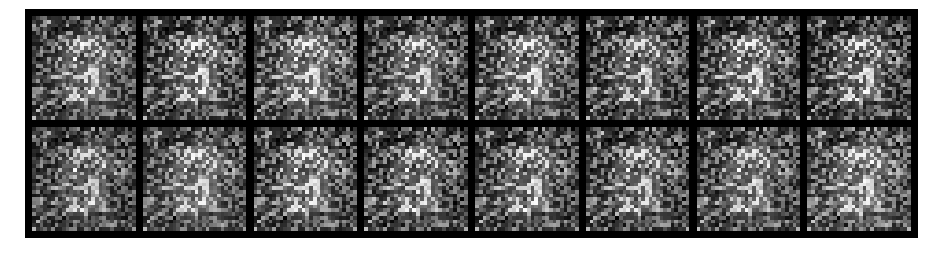

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 0.9128, Generator Loss: 1.6428
D(x): 0.8222, D(G(z)): 0.4220


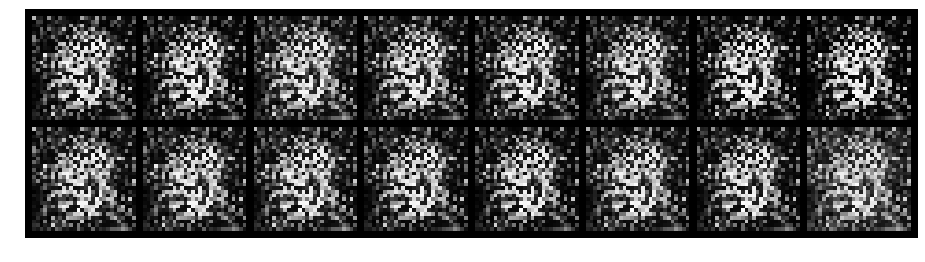

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.4065, Generator Loss: 2.7957
D(x): 0.8619, D(G(z)): 0.2053


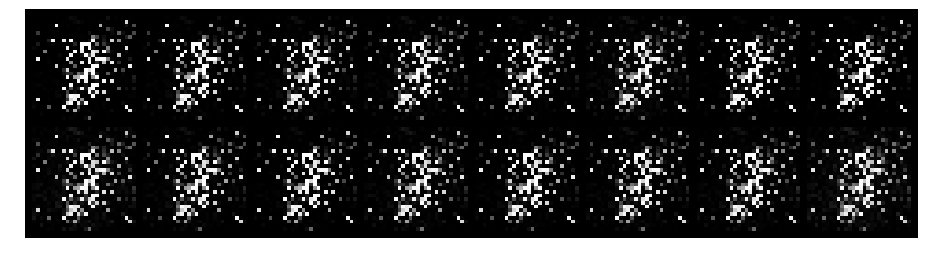

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.0937, Generator Loss: 5.4362
D(x): 0.9642, D(G(z)): 0.0512


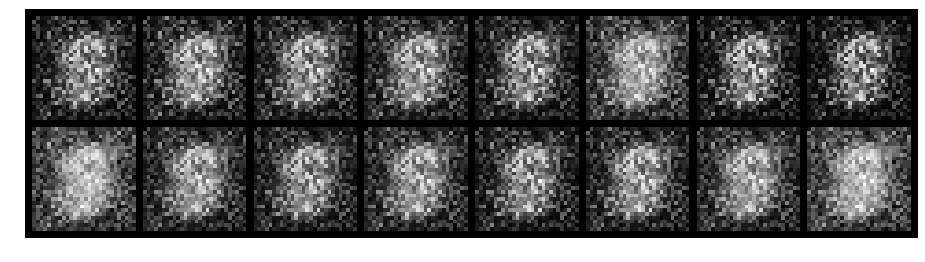

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 1.8571, Generator Loss: 1.2302
D(x): 0.6817, D(G(z)): 0.6960


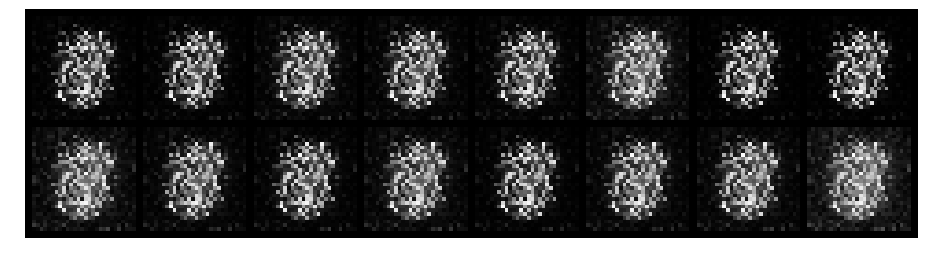

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 1.0268, Generator Loss: 1.5638
D(x): 0.6590, D(G(z)): 0.3693


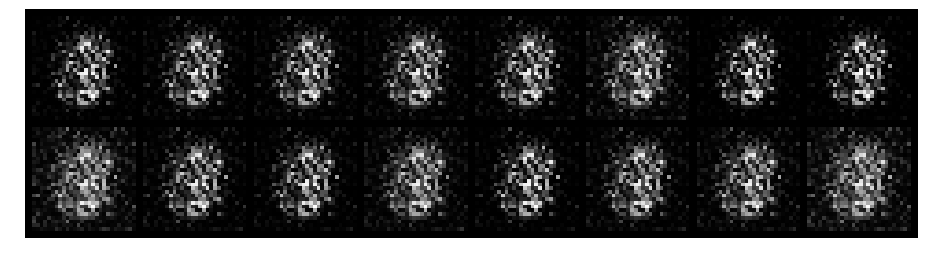

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 1.6134, Generator Loss: 0.7602
D(x): 0.5252, D(G(z)): 0.5581


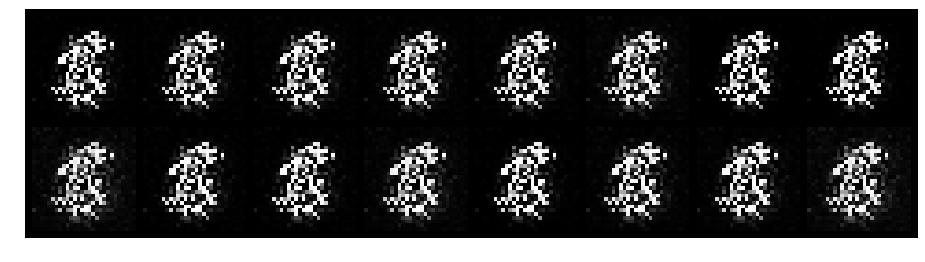

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 0.6196, Generator Loss: 3.4751
D(x): 0.8290, D(G(z)): 0.2612


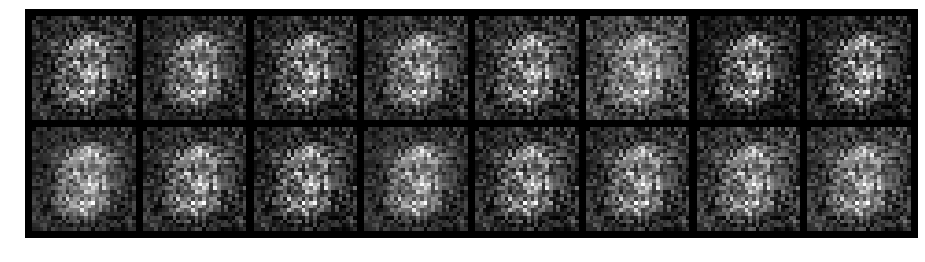

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 0.5526, Generator Loss: 2.3804
D(x): 0.7862, D(G(z)): 0.2245


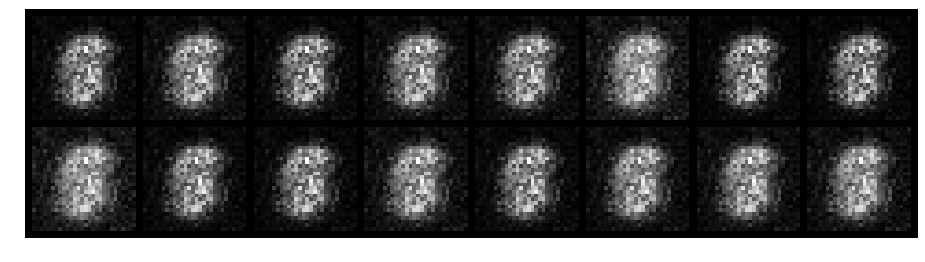

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 1.5835, Generator Loss: 0.5684
D(x): 0.5330, D(G(z)): 0.5895


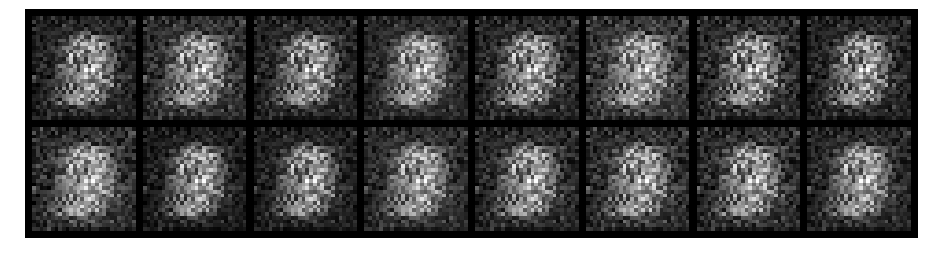

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 1.6526, Generator Loss: 0.4168
D(x): 0.7312, D(G(z)): 0.7175


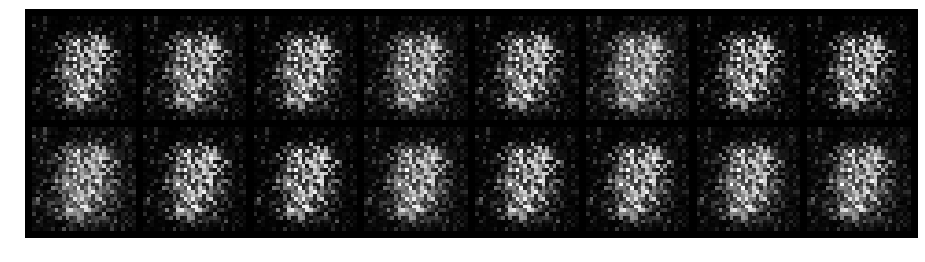

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 0.6228, Generator Loss: 3.0309
D(x): 0.7308, D(G(z)): 0.1961


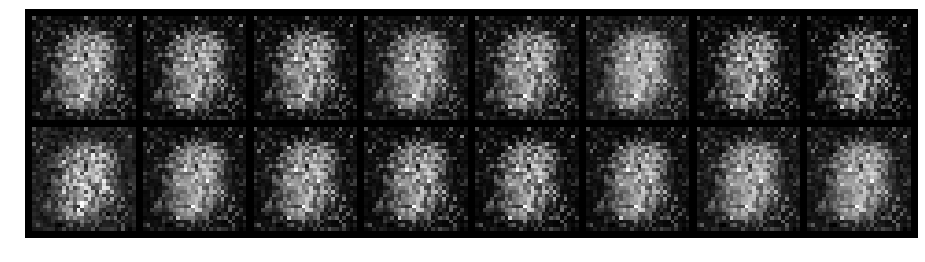

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 0.9087, Generator Loss: 2.6063
D(x): 0.6989, D(G(z)): 0.3430


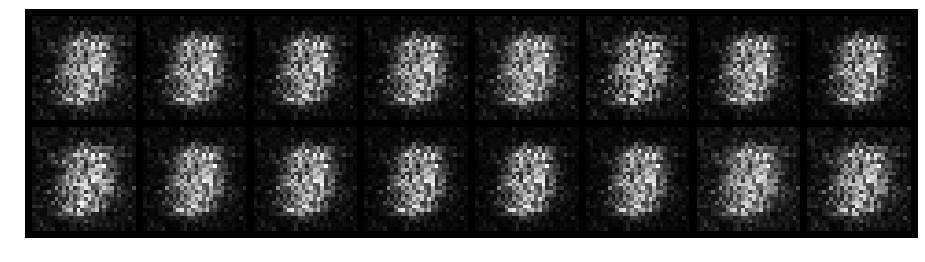

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 1.5856, Generator Loss: 1.4238
D(x): 0.5098, D(G(z)): 0.4254


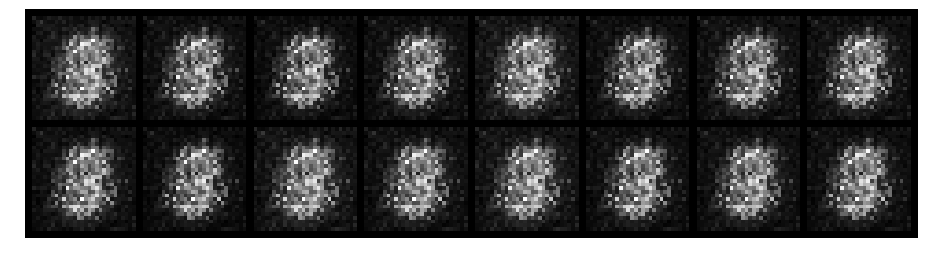

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.9546, Generator Loss: 1.6053
D(x): 0.7321, D(G(z)): 0.3630


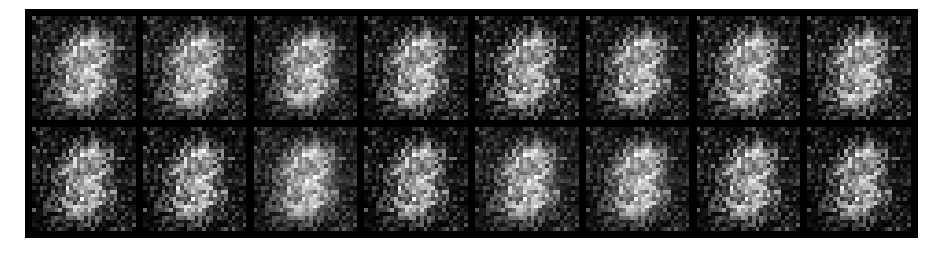

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 1.9008, Generator Loss: 1.4943
D(x): 0.5632, D(G(z)): 0.5927


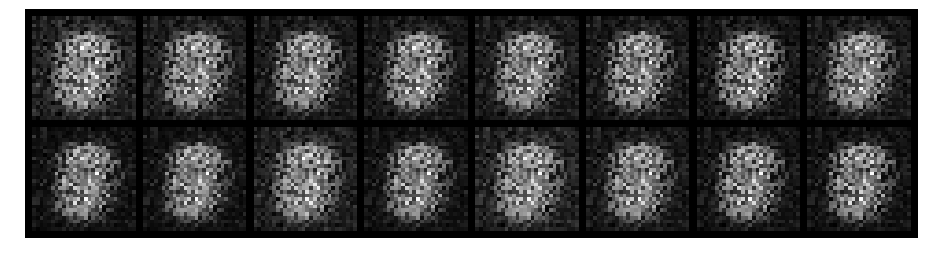

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 0.3261, Generator Loss: 2.7405
D(x): 0.8534, D(G(z)): 0.1240


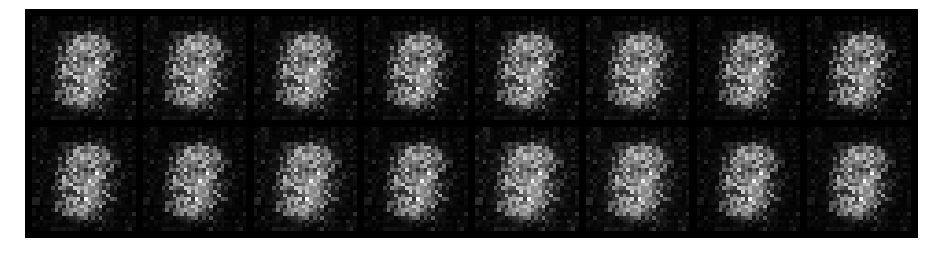

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 0.6817, Generator Loss: 1.6759
D(x): 0.8057, D(G(z)): 0.2922


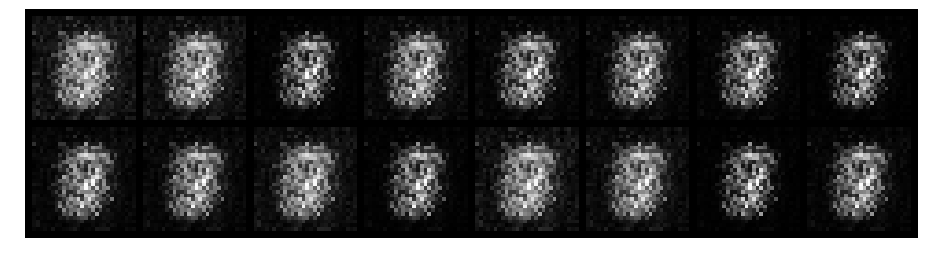

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 1.1401, Generator Loss: 1.4924
D(x): 0.6649, D(G(z)): 0.4086


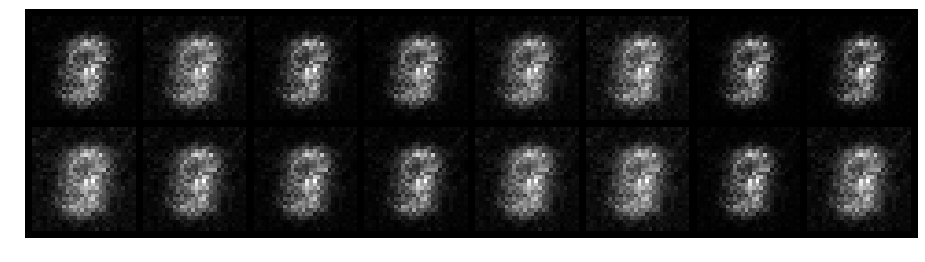

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.5878, Generator Loss: 1.9519
D(x): 0.8141, D(G(z)): 0.1659


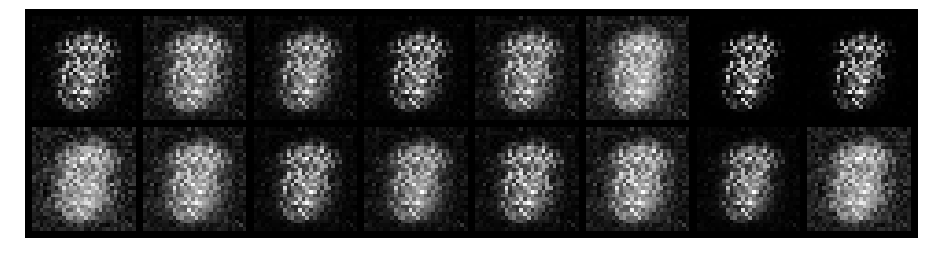

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.4242, Generator Loss: 3.0653
D(x): 0.8552, D(G(z)): 0.1455


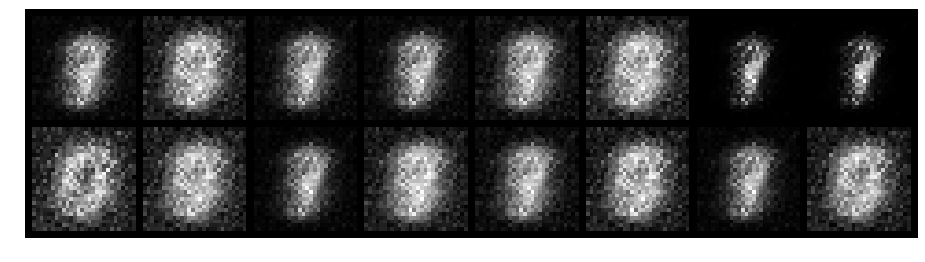

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.8357, Generator Loss: 1.7666
D(x): 0.7634, D(G(z)): 0.2109


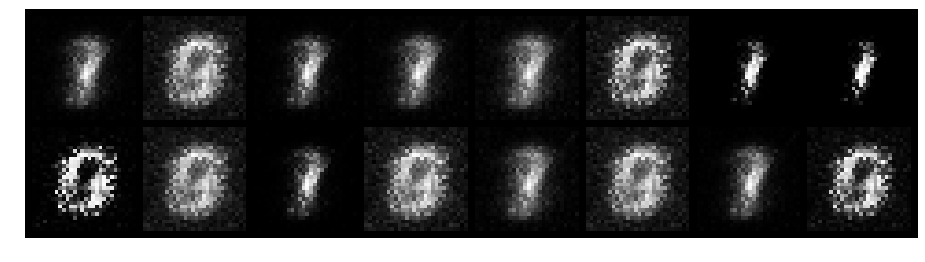

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.6367, Generator Loss: 2.9762
D(x): 0.7849, D(G(z)): 0.1988


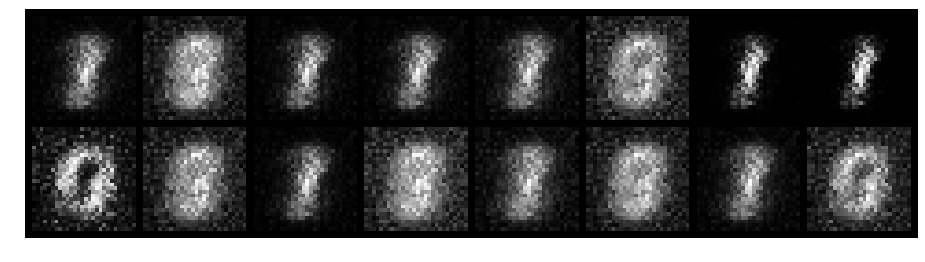

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.6375, Generator Loss: 1.8848
D(x): 0.8298, D(G(z)): 0.2457


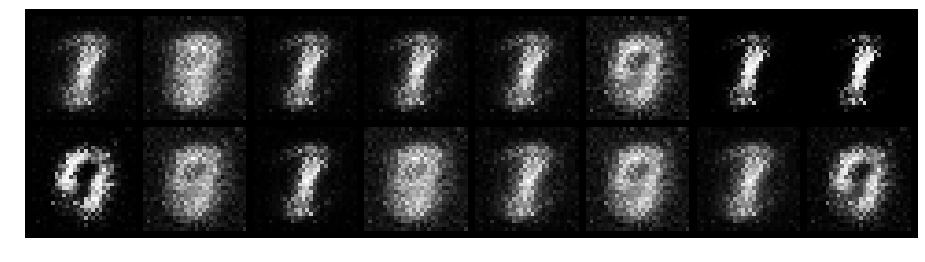

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.6458, Generator Loss: 2.3557
D(x): 0.8252, D(G(z)): 0.2275


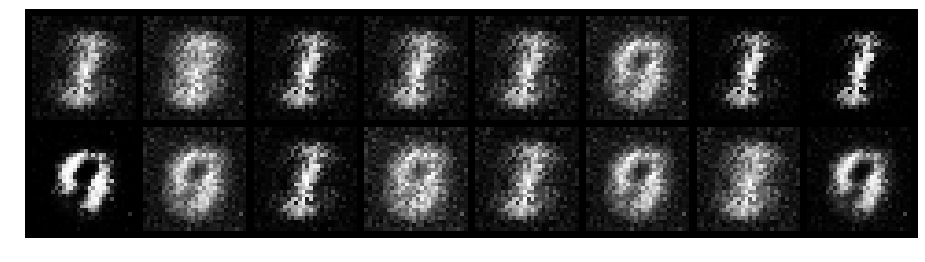

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.2396, Generator Loss: 2.9158
D(x): 0.9076, D(G(z)): 0.0847


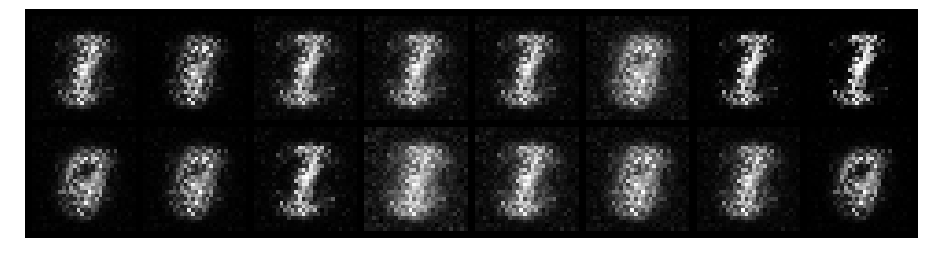

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.2262, Generator Loss: 3.7754
D(x): 0.9298, D(G(z)): 0.0824


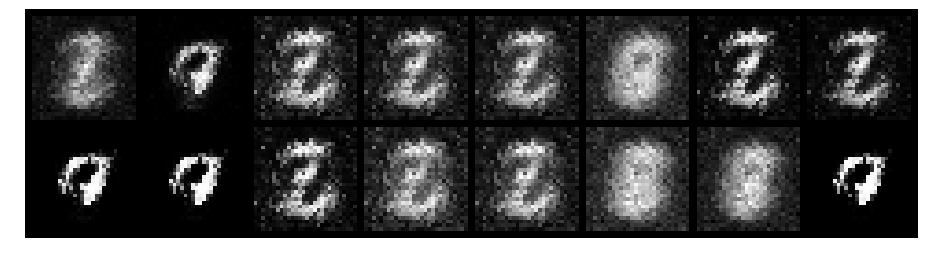

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.5044, Generator Loss: 2.9878
D(x): 0.8208, D(G(z)): 0.1183


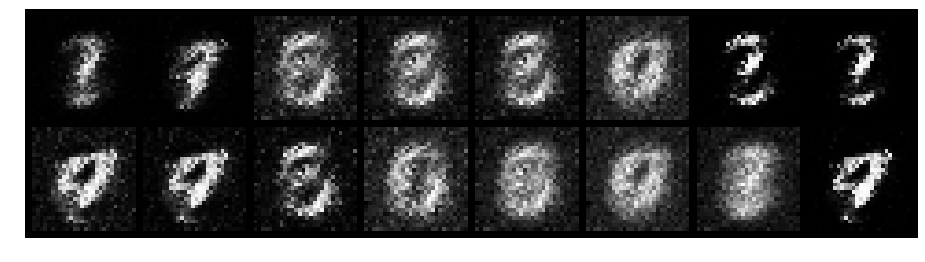

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.9020, Generator Loss: 2.3942
D(x): 0.8275, D(G(z)): 0.2728


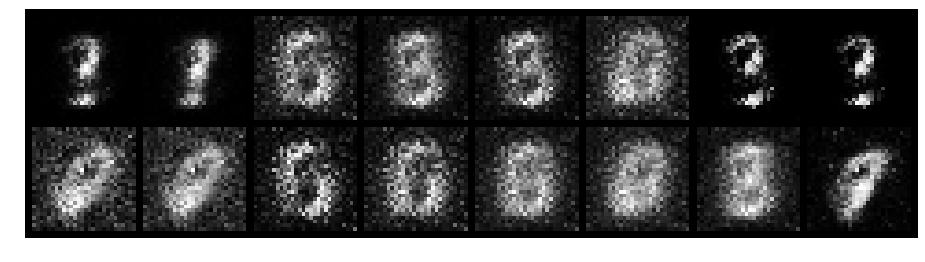

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.9610, Generator Loss: 1.9238
D(x): 0.6899, D(G(z)): 0.2295


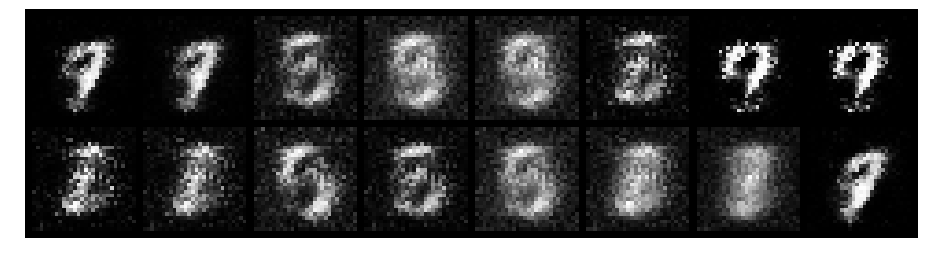

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.5868, Generator Loss: 1.9306
D(x): 0.7721, D(G(z)): 0.1591


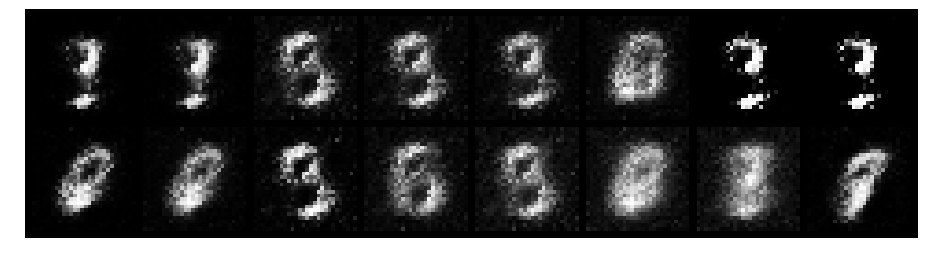

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.8374, Generator Loss: 2.0820
D(x): 0.7611, D(G(z)): 0.2197


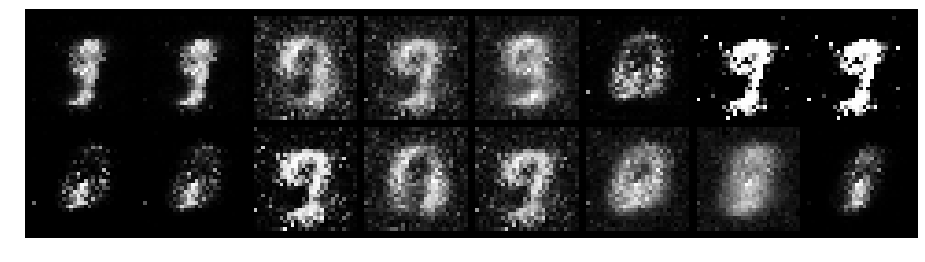

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.4356, Generator Loss: 2.8580
D(x): 0.8241, D(G(z)): 0.1255


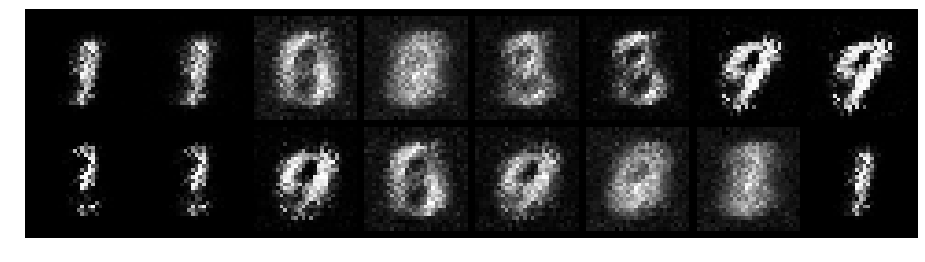

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.2174, Generator Loss: 2.9444
D(x): 0.9464, D(G(z)): 0.1006


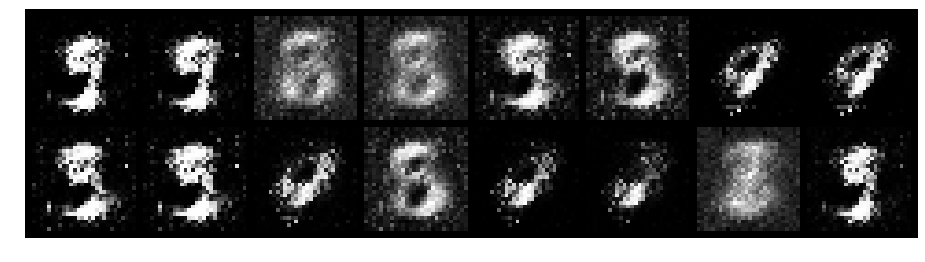

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.4368, Generator Loss: 3.2290
D(x): 0.8680, D(G(z)): 0.1262


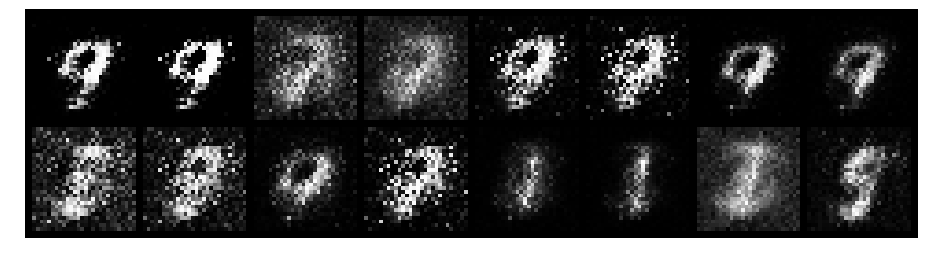

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.7351, Generator Loss: 2.5007
D(x): 0.8317, D(G(z)): 0.2477


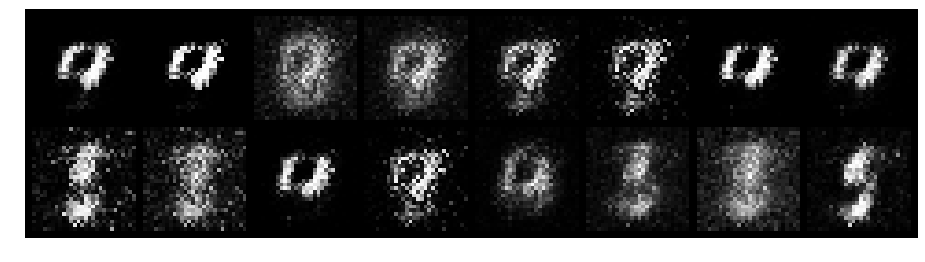

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.5397, Generator Loss: 2.3948
D(x): 0.8600, D(G(z)): 0.1947


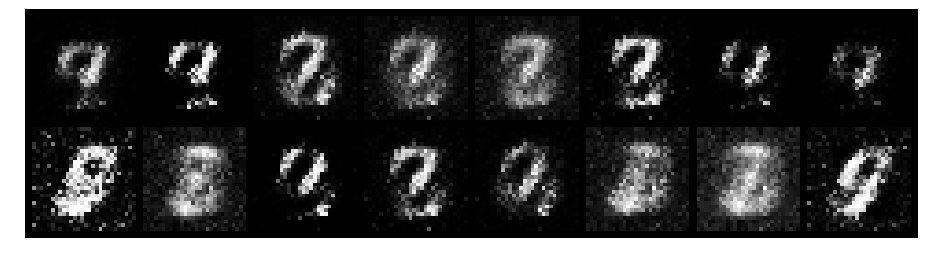

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.7837, Generator Loss: 1.7851
D(x): 0.8073, D(G(z)): 0.3051


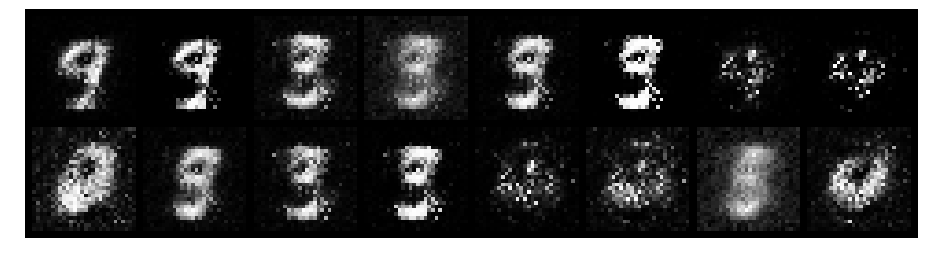

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.3592, Generator Loss: 3.4363
D(x): 0.8624, D(G(z)): 0.0870


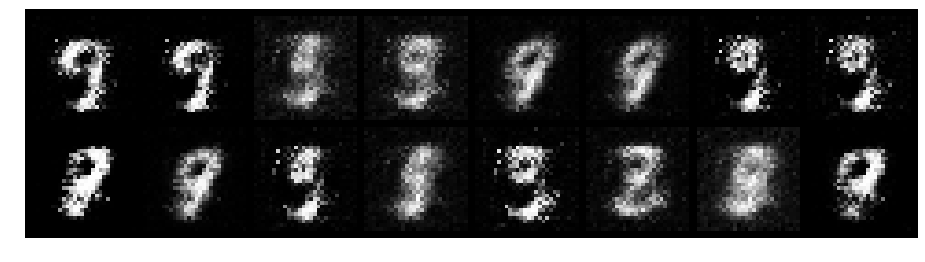

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.8440, Generator Loss: 2.6989
D(x): 0.7201, D(G(z)): 0.1325


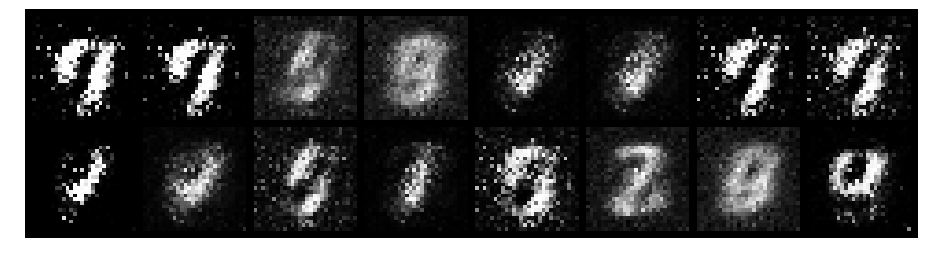

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.4236, Generator Loss: 2.3123
D(x): 0.9064, D(G(z)): 0.2025


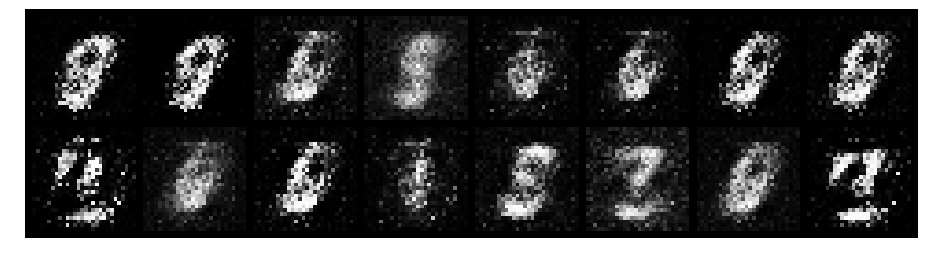

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.3908, Generator Loss: 3.2848
D(x): 0.8713, D(G(z)): 0.0873


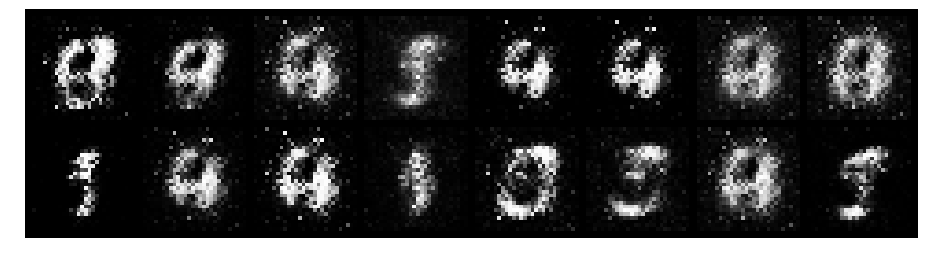

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.6118, Generator Loss: 3.0150
D(x): 0.8383, D(G(z)): 0.1702


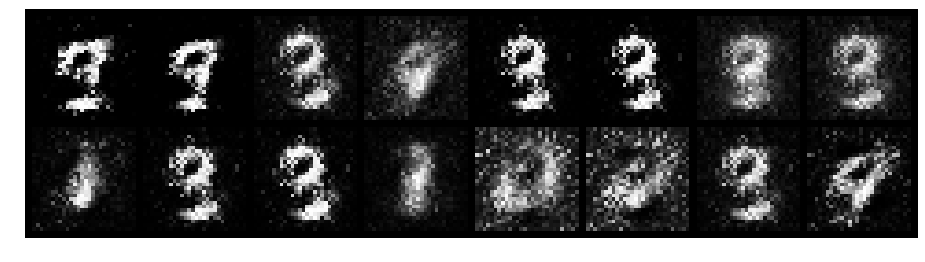

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.8580, Generator Loss: 2.3230
D(x): 0.8192, D(G(z)): 0.2907


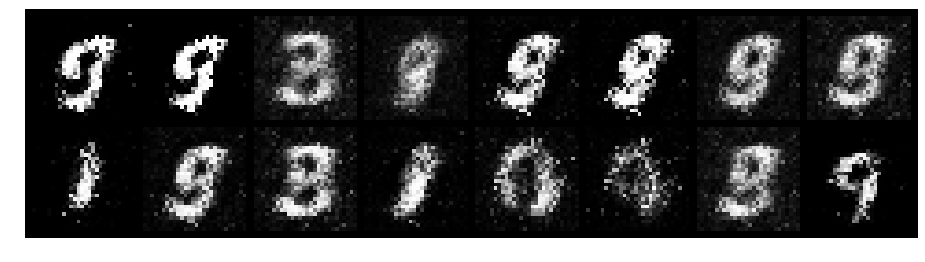

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.4484, Generator Loss: 2.6704
D(x): 0.8599, D(G(z)): 0.1568


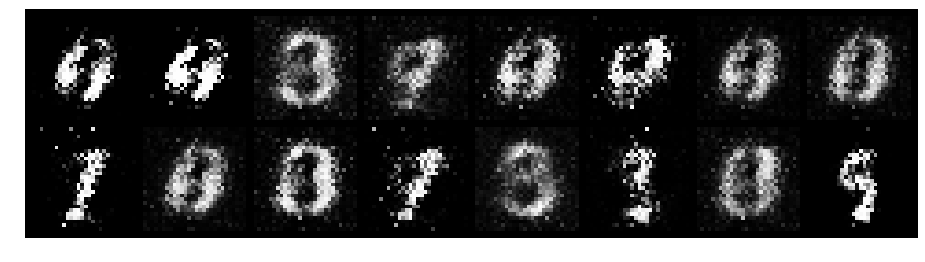

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.4597, Generator Loss: 2.9489
D(x): 0.7912, D(G(z)): 0.1015


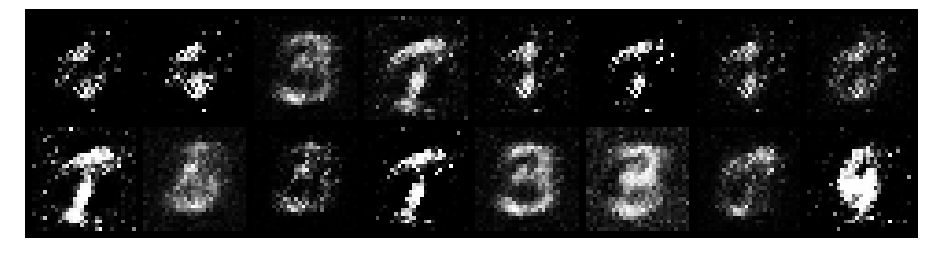

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.3857, Generator Loss: 2.3927
D(x): 0.8955, D(G(z)): 0.1673


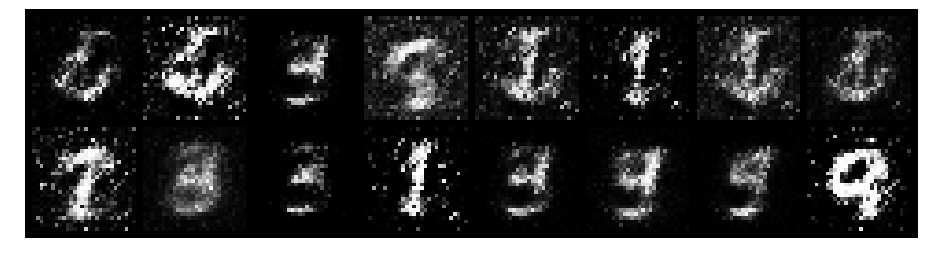

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.5692, Generator Loss: 3.0889
D(x): 0.8414, D(G(z)): 0.1829


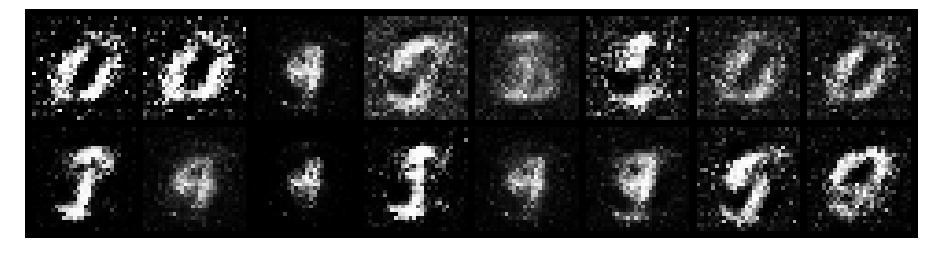

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.6104, Generator Loss: 3.5294
D(x): 0.8597, D(G(z)): 0.1987


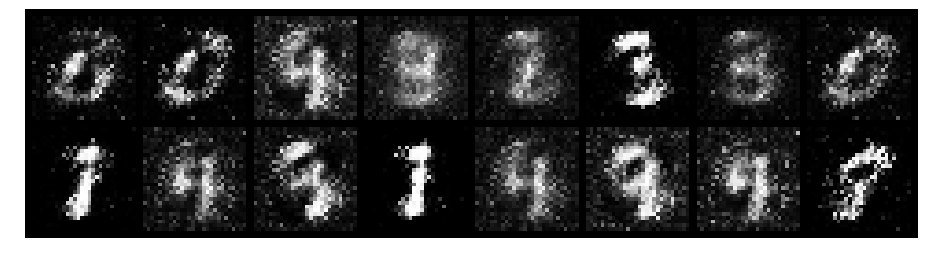

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.4187, Generator Loss: 3.5791
D(x): 0.7898, D(G(z)): 0.0510


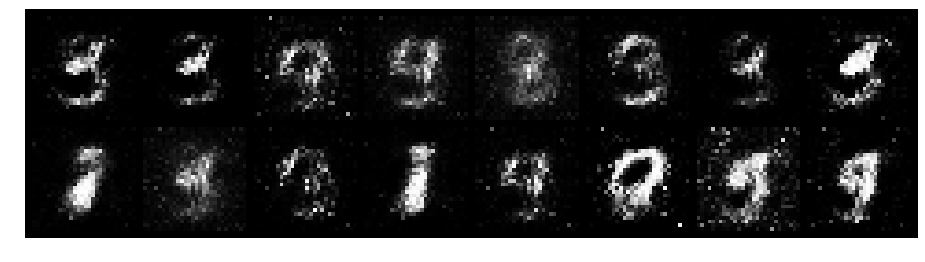

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.4830, Generator Loss: 2.5423
D(x): 0.8400, D(G(z)): 0.1489


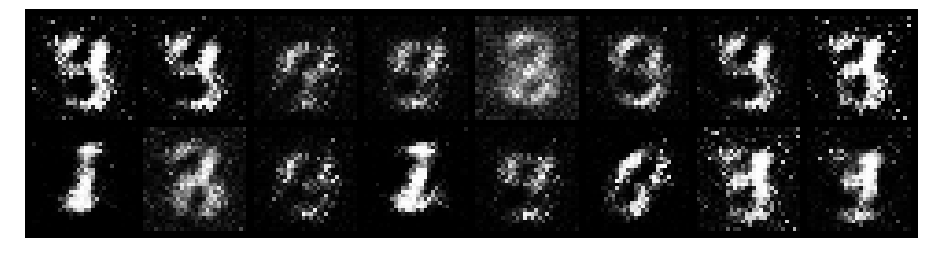

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.5676, Generator Loss: 2.7630
D(x): 0.8516, D(G(z)): 0.1982


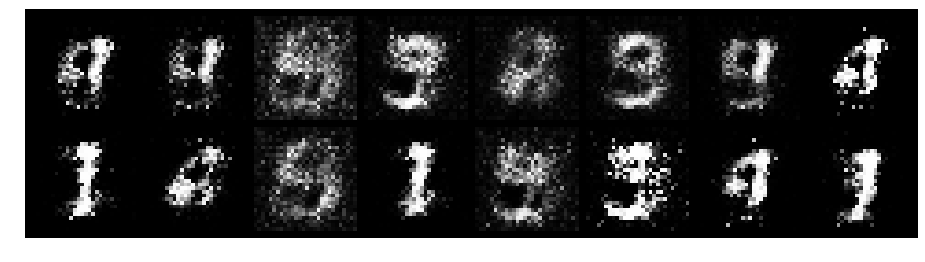

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.3585, Generator Loss: 3.7548
D(x): 0.9057, D(G(z)): 0.1418


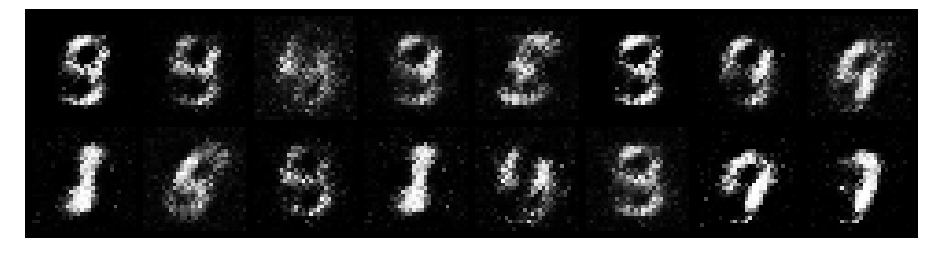

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.6784, Generator Loss: 2.4180
D(x): 0.8212, D(G(z)): 0.2686


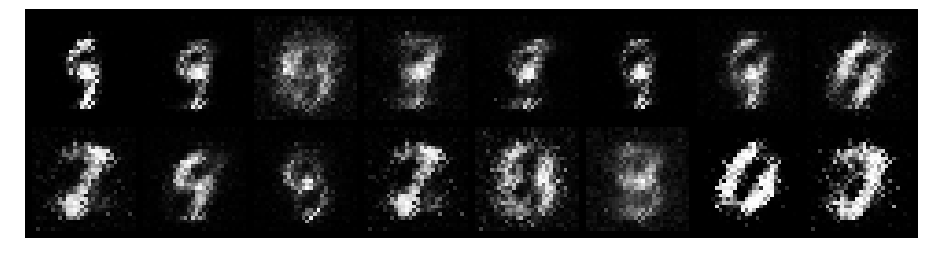

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.7707, Generator Loss: 2.3110
D(x): 0.7471, D(G(z)): 0.1799


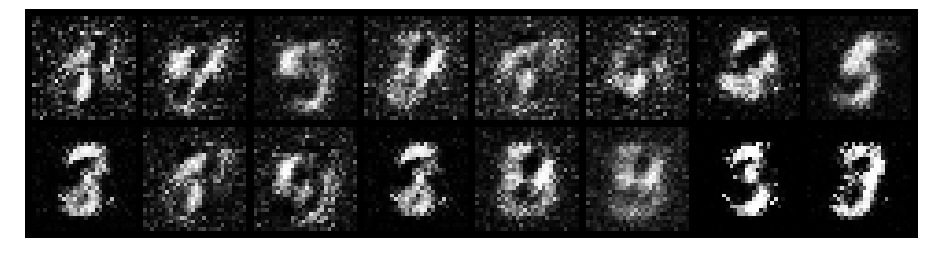

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.7875, Generator Loss: 1.8319
D(x): 0.7920, D(G(z)): 0.2891


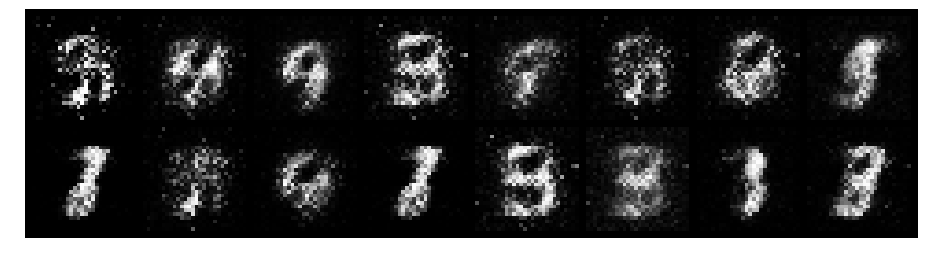

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.7162, Generator Loss: 1.8055
D(x): 0.7954, D(G(z)): 0.2855


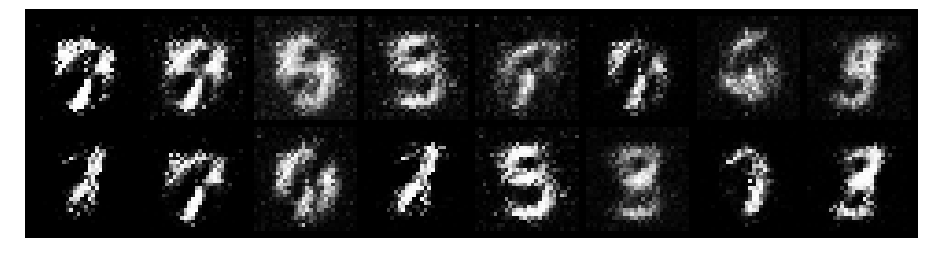

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.6371, Generator Loss: 2.7801
D(x): 0.7973, D(G(z)): 0.1628


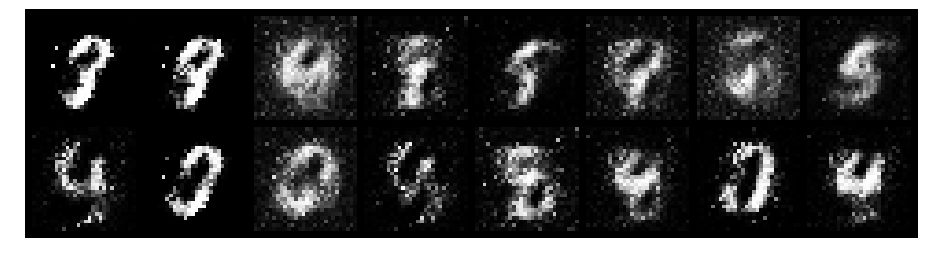

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.4885, Generator Loss: 2.6703
D(x): 0.8845, D(G(z)): 0.1810


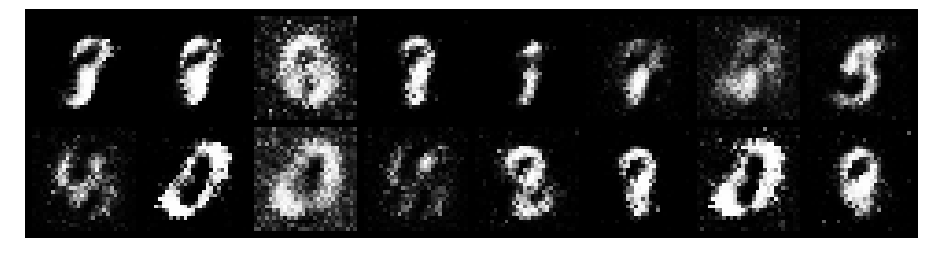

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.6033, Generator Loss: 2.5197
D(x): 0.8853, D(G(z)): 0.2562


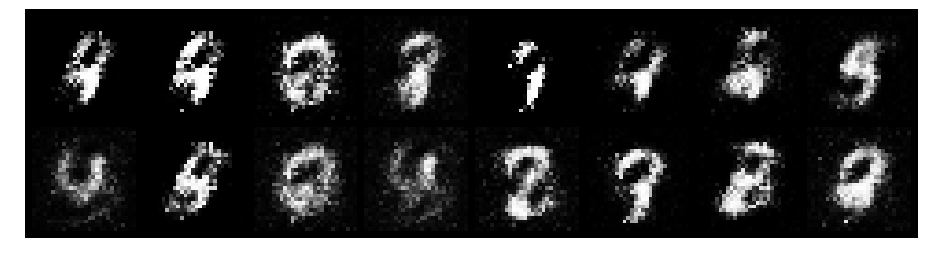

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.7428, Generator Loss: 2.0051
D(x): 0.7919, D(G(z)): 0.2474


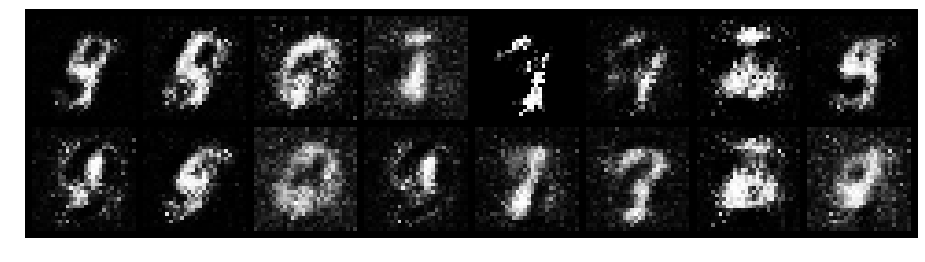

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.6812, Generator Loss: 2.5521
D(x): 0.8435, D(G(z)): 0.2984


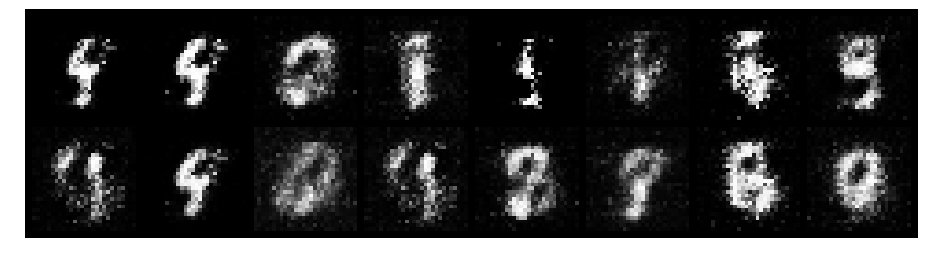

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.8358, Generator Loss: 1.9673
D(x): 0.7618, D(G(z)): 0.2436


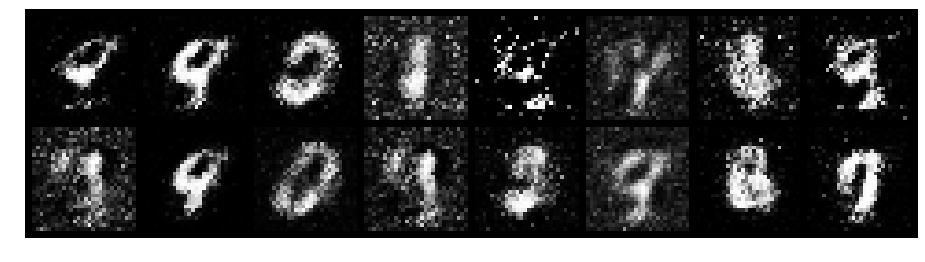

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.8498, Generator Loss: 2.1567
D(x): 0.7063, D(G(z)): 0.2231


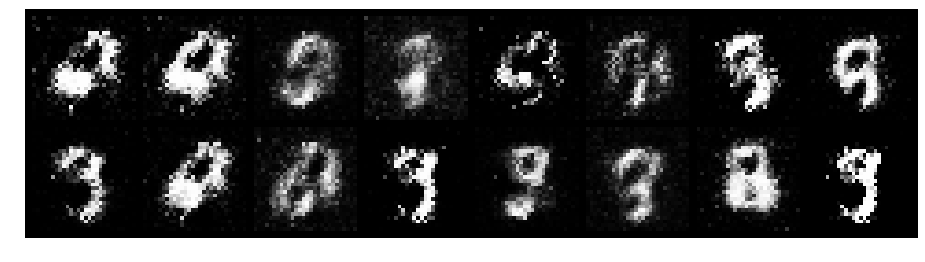

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.6411, Generator Loss: 2.3514
D(x): 0.7236, D(G(z)): 0.1190


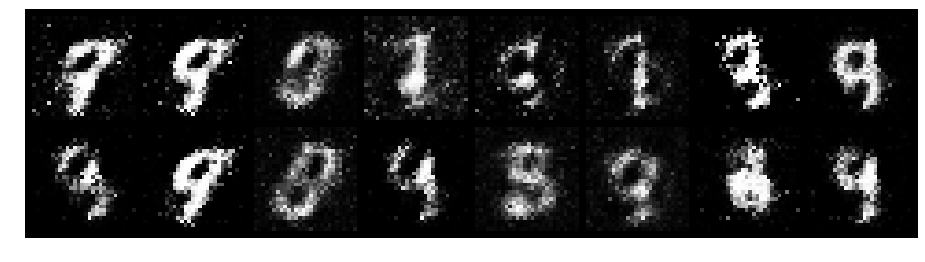

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.7587, Generator Loss: 2.5010
D(x): 0.7776, D(G(z)): 0.2279


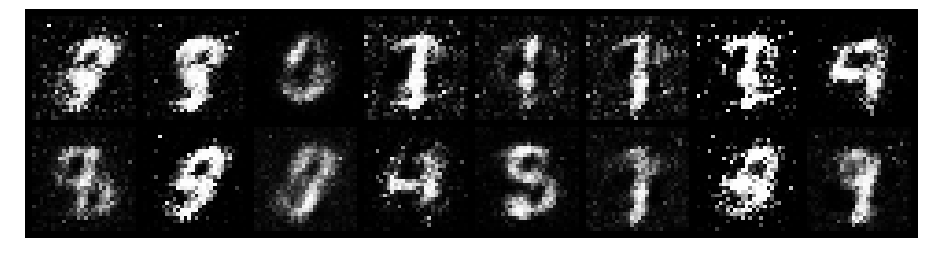

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.6654, Generator Loss: 2.7930
D(x): 0.8446, D(G(z)): 0.2887


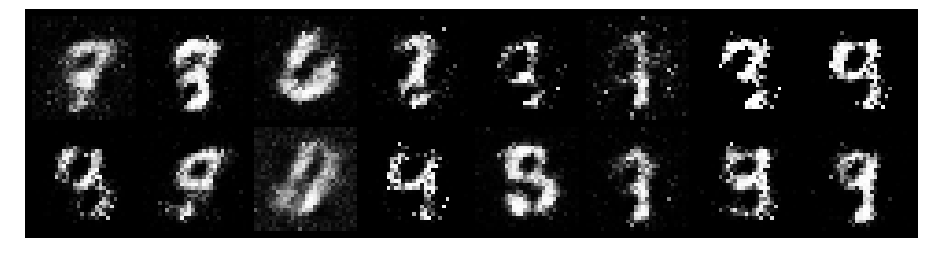

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.6400, Generator Loss: 2.6068
D(x): 0.8211, D(G(z)): 0.2109


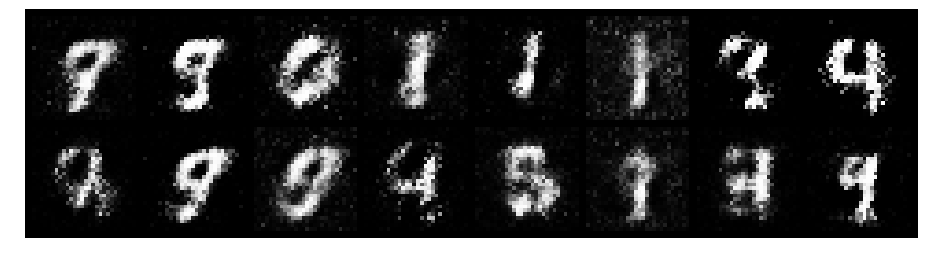

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.6502, Generator Loss: 2.4127
D(x): 0.7522, D(G(z)): 0.1555


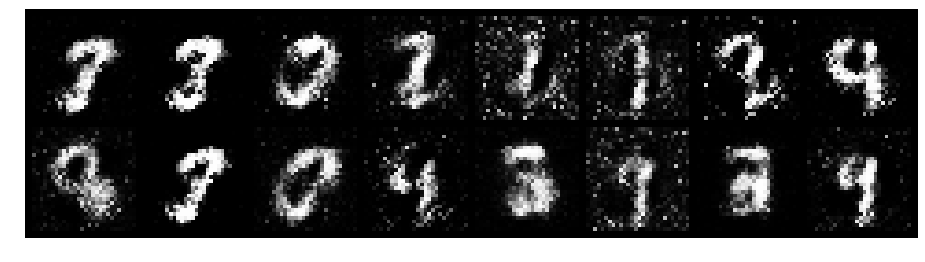

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.7975, Generator Loss: 1.8564
D(x): 0.7367, D(G(z)): 0.2669


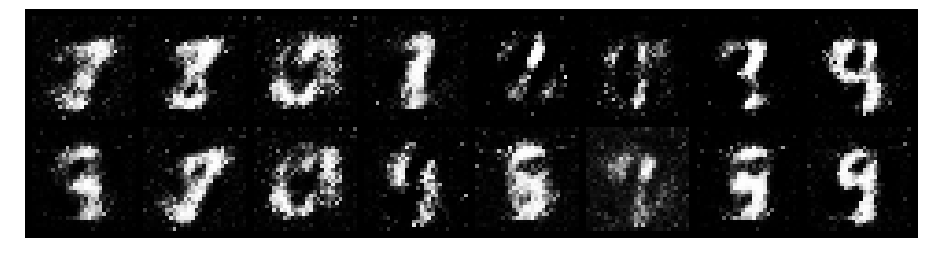

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.5108, Generator Loss: 2.2690
D(x): 0.8742, D(G(z)): 0.2391


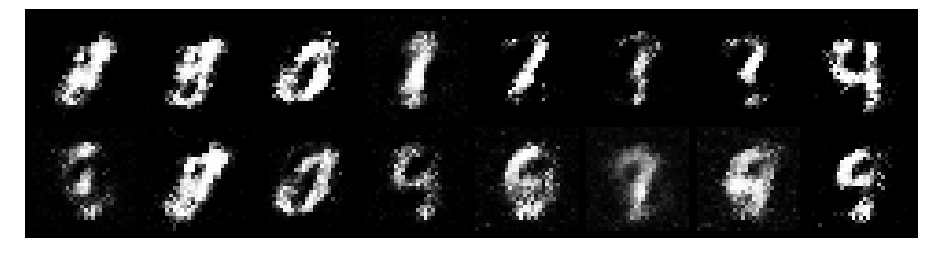

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.9557, Generator Loss: 1.4660
D(x): 0.6915, D(G(z)): 0.2757


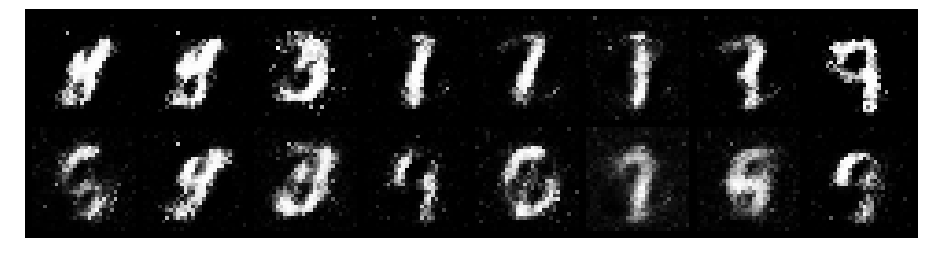

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.8702, Generator Loss: 1.9135
D(x): 0.7981, D(G(z)): 0.3405


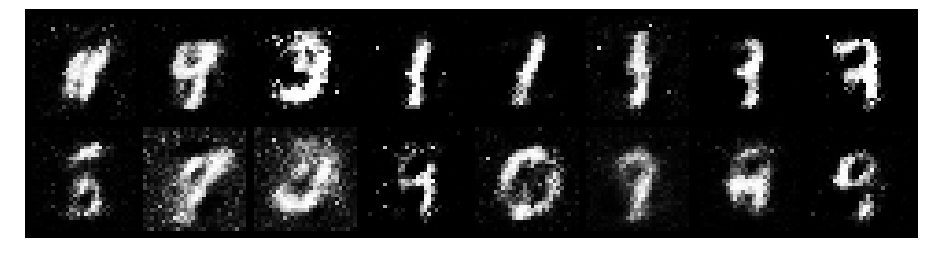

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.7996, Generator Loss: 2.2045
D(x): 0.7217, D(G(z)): 0.2082


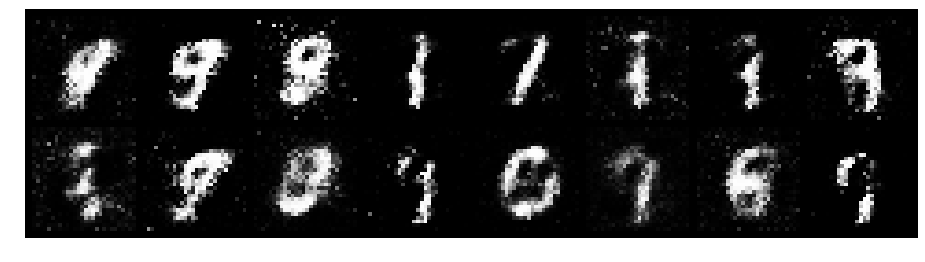

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.7553, Generator Loss: 2.2857
D(x): 0.7878, D(G(z)): 0.2228


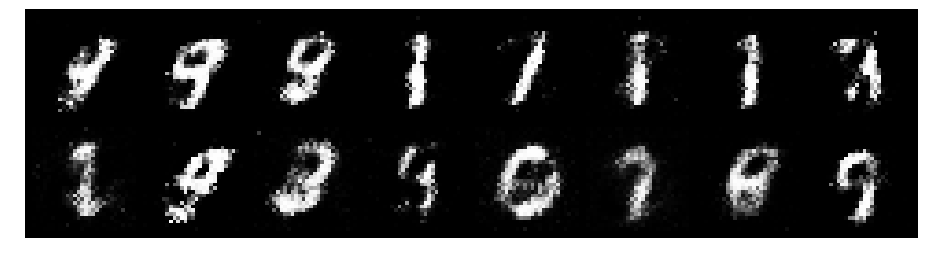

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.4207, Generator Loss: 2.8641
D(x): 0.8185, D(G(z)): 0.0962


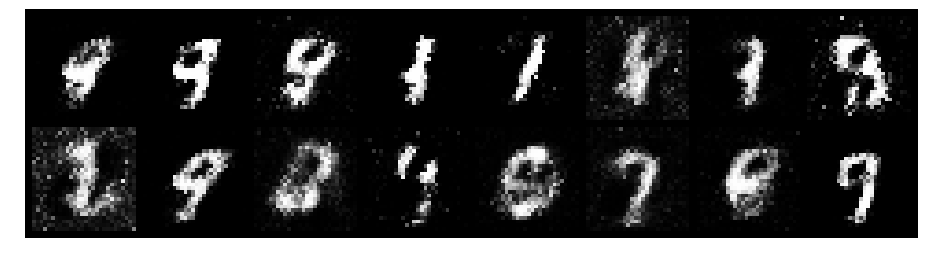

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.6928, Generator Loss: 2.5473
D(x): 0.7554, D(G(z)): 0.2037


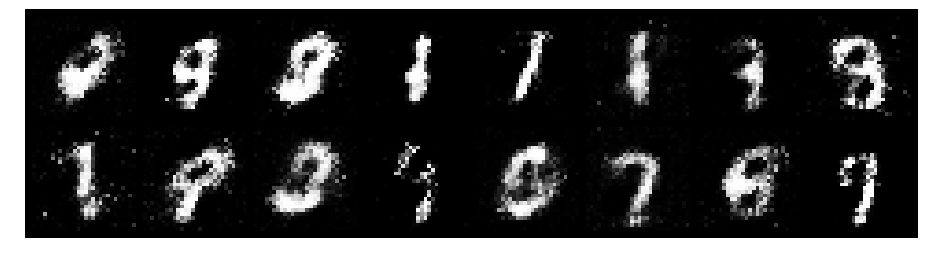

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.5319, Generator Loss: 2.5689
D(x): 0.8023, D(G(z)): 0.1742


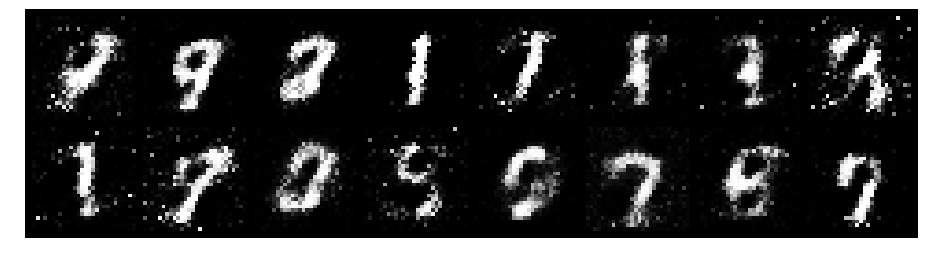

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.6349, Generator Loss: 2.0350
D(x): 0.7411, D(G(z)): 0.1709


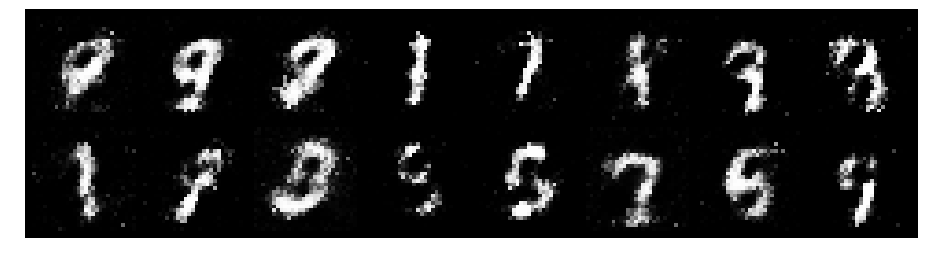

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.8821, Generator Loss: 2.1056
D(x): 0.6970, D(G(z)): 0.2247


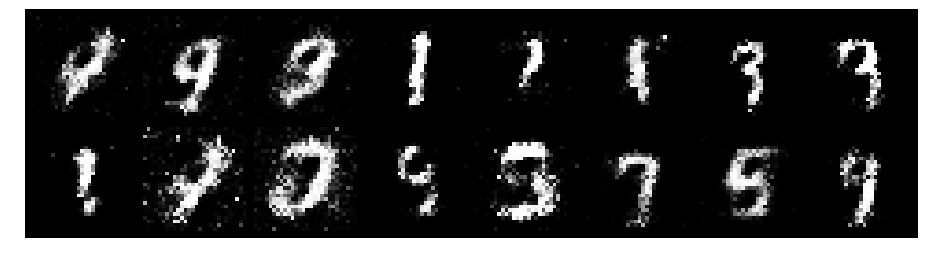

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.7851, Generator Loss: 1.7933
D(x): 0.7840, D(G(z)): 0.2894


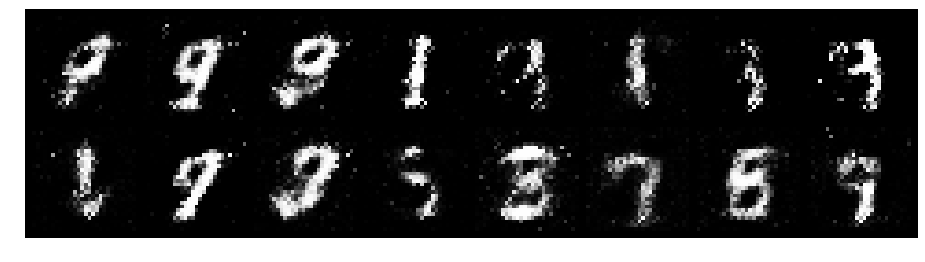

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.6945, Generator Loss: 2.2275
D(x): 0.8587, D(G(z)): 0.3038


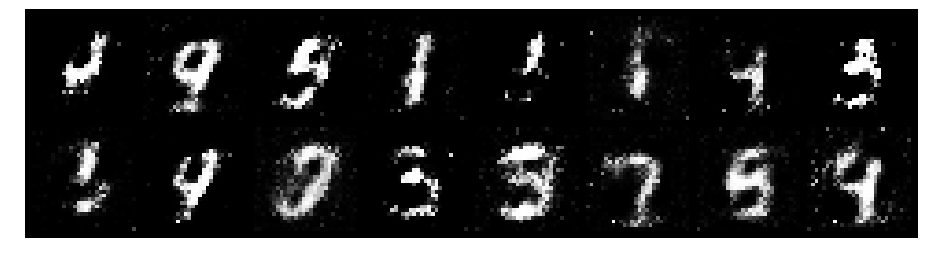

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.7729, Generator Loss: 2.4168
D(x): 0.7953, D(G(z)): 0.2576


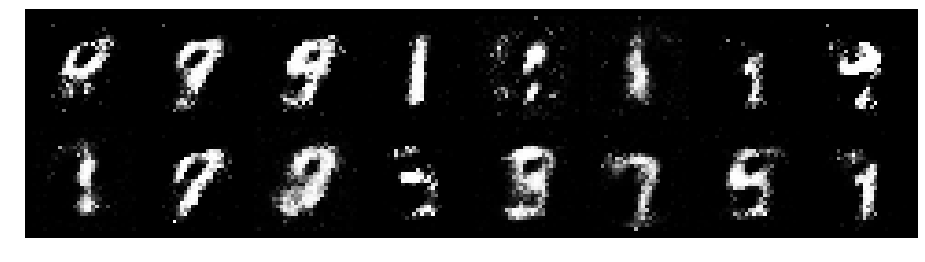

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.6892, Generator Loss: 1.9079
D(x): 0.8051, D(G(z)): 0.2715


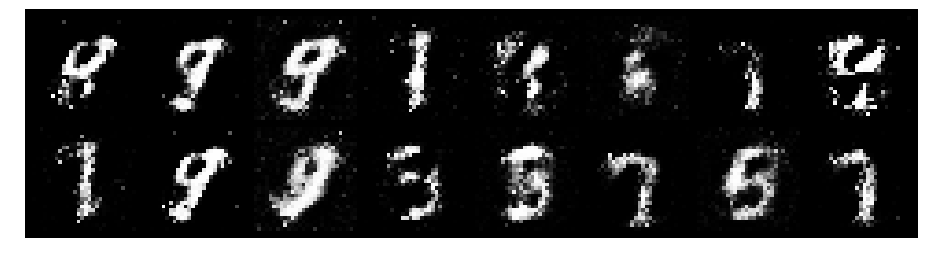

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.7546, Generator Loss: 2.0113
D(x): 0.7375, D(G(z)): 0.2068


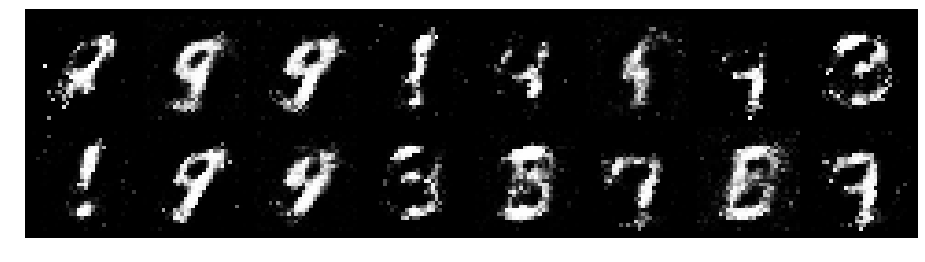

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.9573, Generator Loss: 2.3577
D(x): 0.6974, D(G(z)): 0.2378


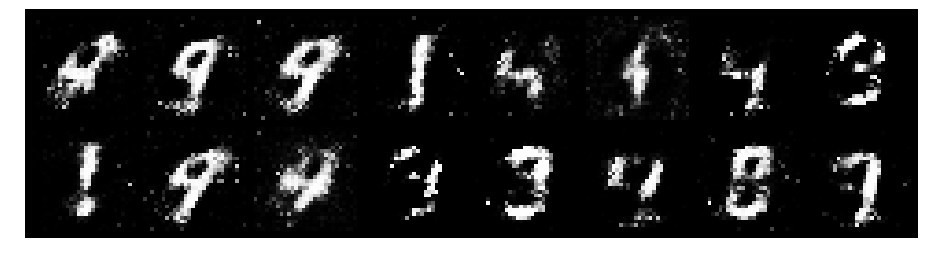

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.5246, Generator Loss: 3.0889
D(x): 0.8076, D(G(z)): 0.1796


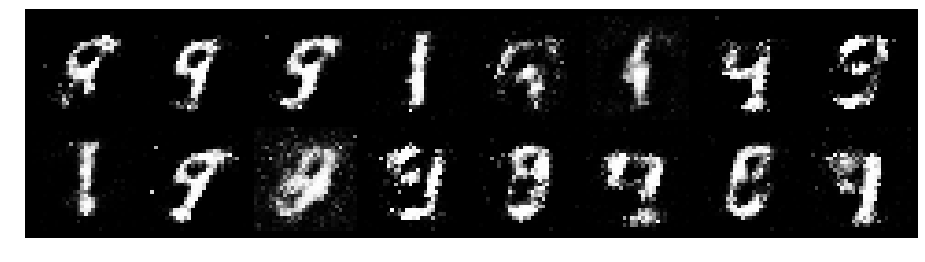

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.8182, Generator Loss: 1.3948
D(x): 0.7074, D(G(z)): 0.2752


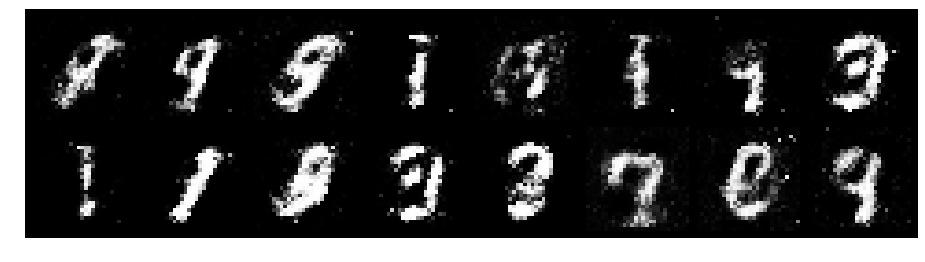

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.6895, Generator Loss: 1.6806
D(x): 0.7449, D(G(z)): 0.2136


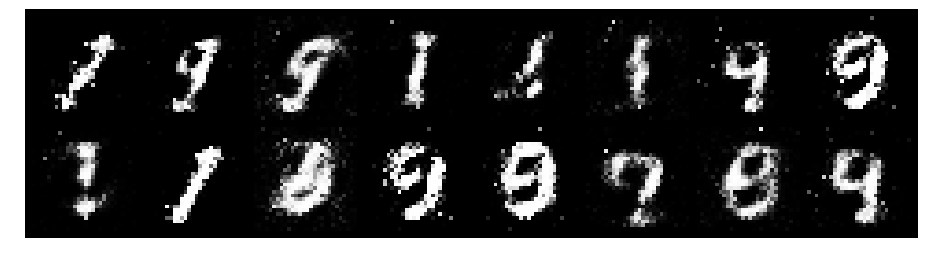

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.8914, Generator Loss: 1.7286
D(x): 0.7072, D(G(z)): 0.2773


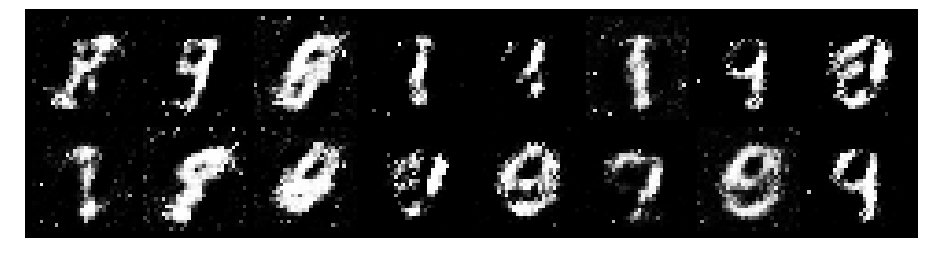

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.8438, Generator Loss: 1.8911
D(x): 0.6598, D(G(z)): 0.2042


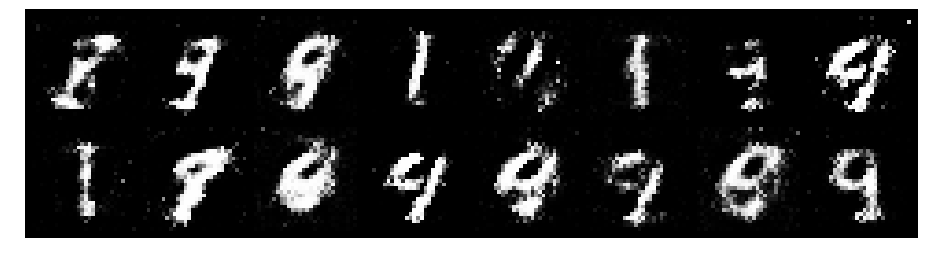

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 1.0162, Generator Loss: 1.5735
D(x): 0.7993, D(G(z)): 0.3957


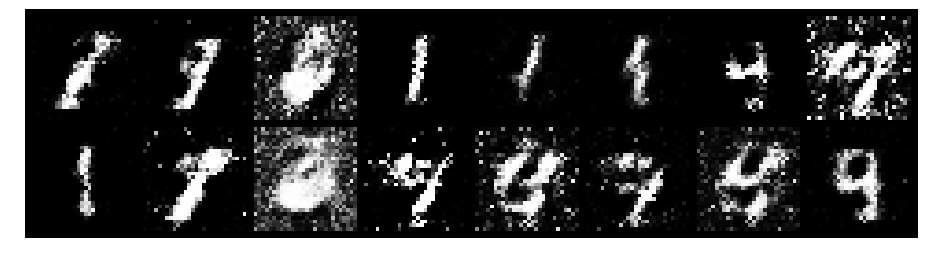

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.9060, Generator Loss: 1.2637
D(x): 0.7113, D(G(z)): 0.3198


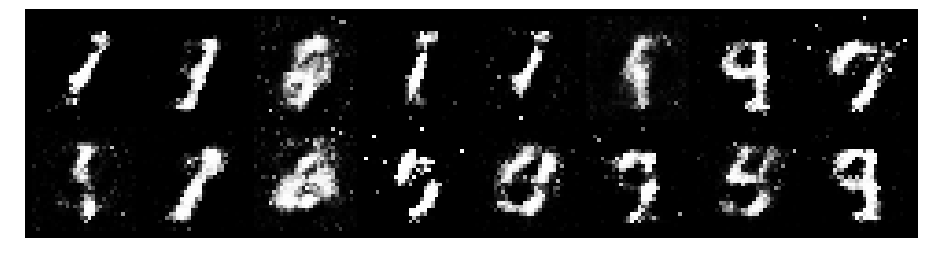

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.7226, Generator Loss: 2.0206
D(x): 0.7696, D(G(z)): 0.2270


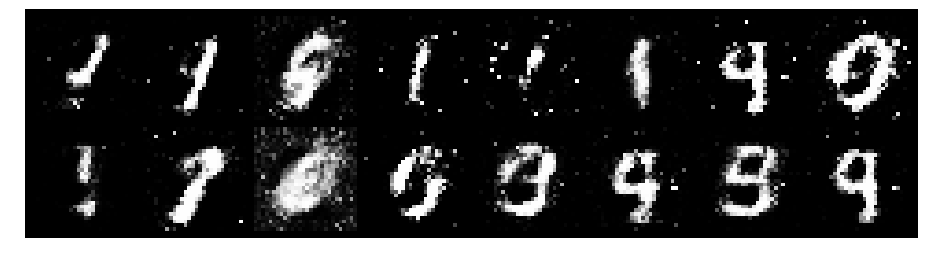

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.8631, Generator Loss: 2.4865
D(x): 0.8062, D(G(z)): 0.2751


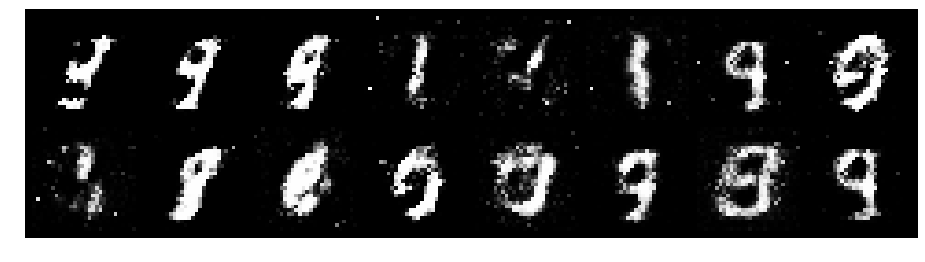

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 0.8870, Generator Loss: 1.5785
D(x): 0.6528, D(G(z)): 0.1636


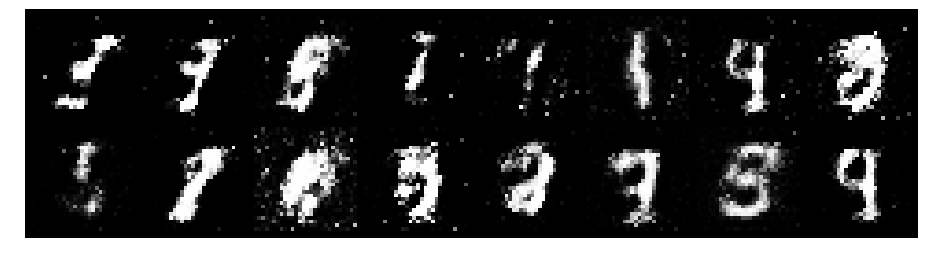

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.5564, Generator Loss: 2.4116
D(x): 0.7953, D(G(z)): 0.1730


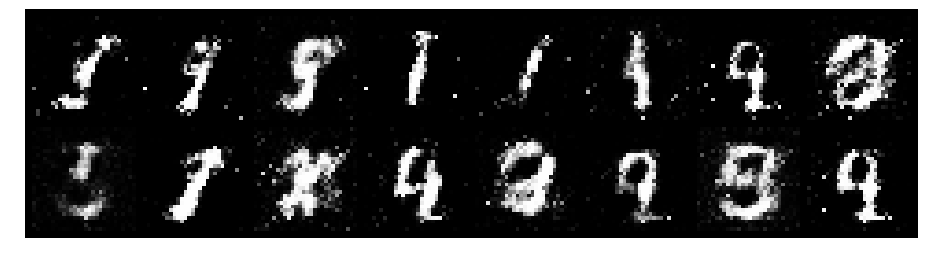

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.7043, Generator Loss: 2.7308
D(x): 0.8392, D(G(z)): 0.2813


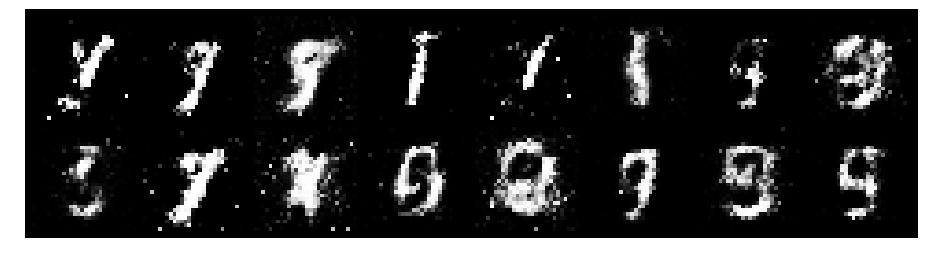

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.5375, Generator Loss: 2.1916
D(x): 0.8066, D(G(z)): 0.2063


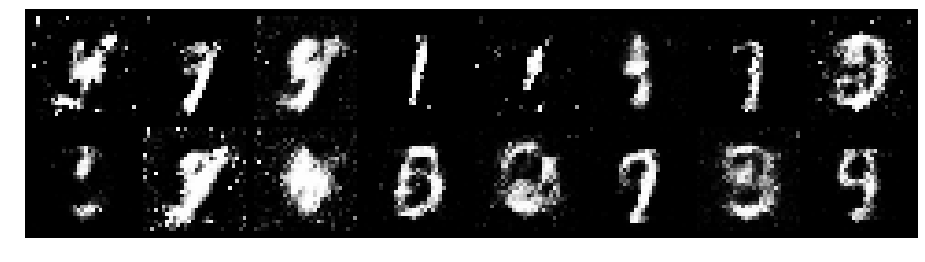

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.8984, Generator Loss: 1.6334
D(x): 0.6980, D(G(z)): 0.2651


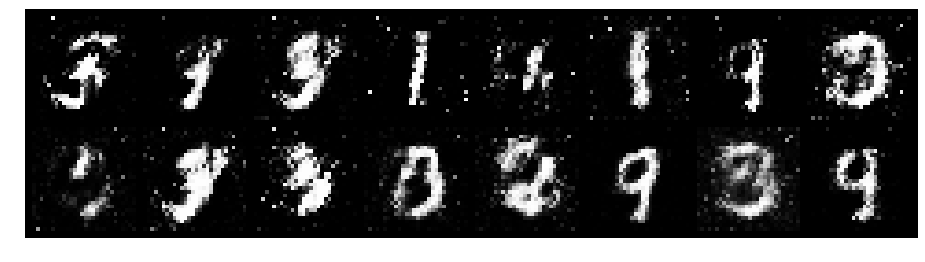

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.8027, Generator Loss: 1.9391
D(x): 0.7075, D(G(z)): 0.2396


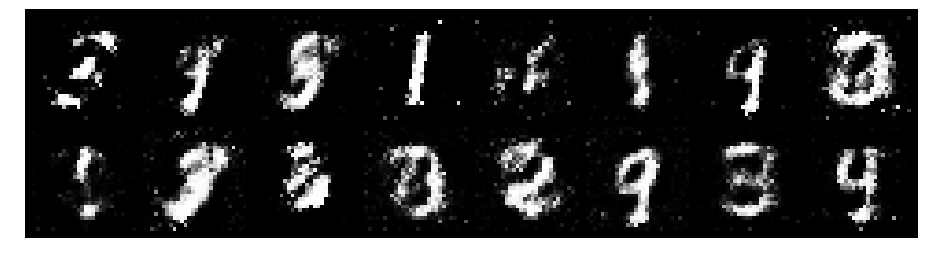

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.7154, Generator Loss: 2.0638
D(x): 0.7654, D(G(z)): 0.2330


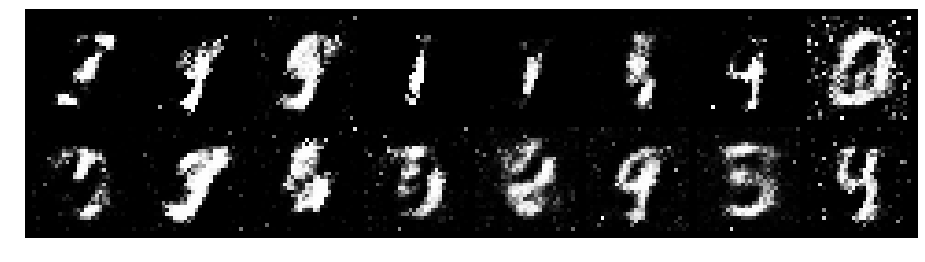

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.9949, Generator Loss: 2.0847
D(x): 0.7237, D(G(z)): 0.3551


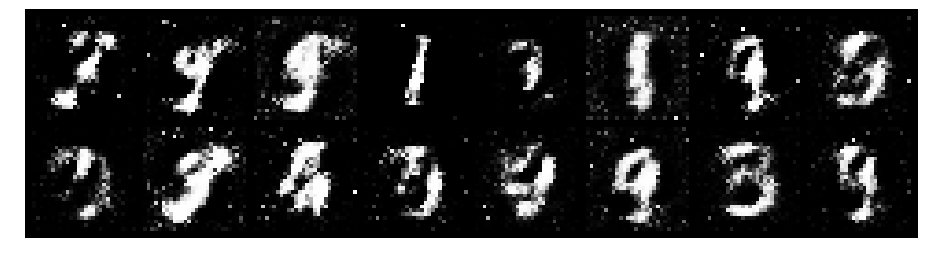

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.8963, Generator Loss: 1.5622
D(x): 0.7793, D(G(z)): 0.3111


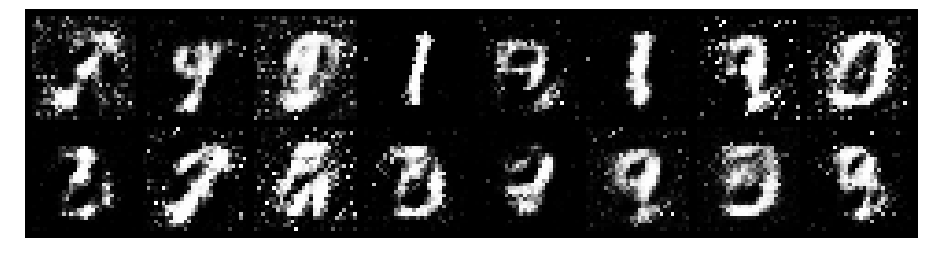

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.6777, Generator Loss: 1.8801
D(x): 0.7906, D(G(z)): 0.2457


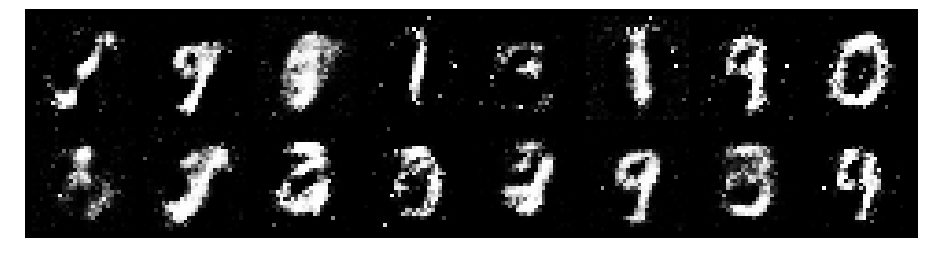

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 0.7565, Generator Loss: 1.4207
D(x): 0.7154, D(G(z)): 0.2318


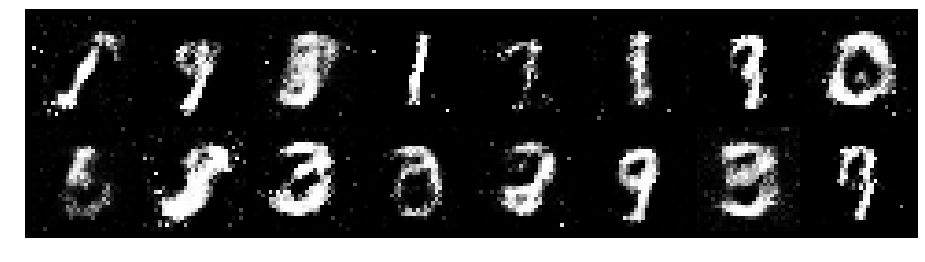

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 0.5776, Generator Loss: 2.4380
D(x): 0.8338, D(G(z)): 0.2368


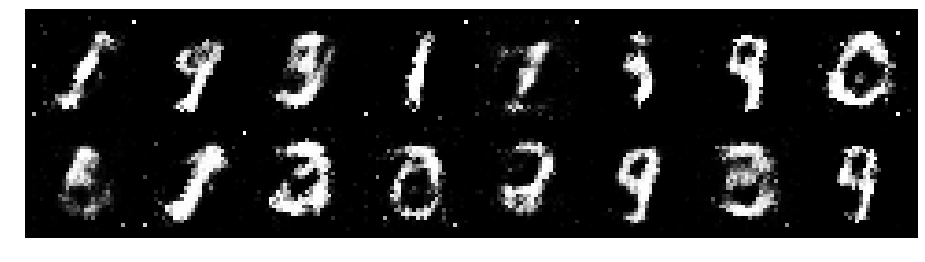

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 0.7861, Generator Loss: 1.5168
D(x): 0.7776, D(G(z)): 0.3140


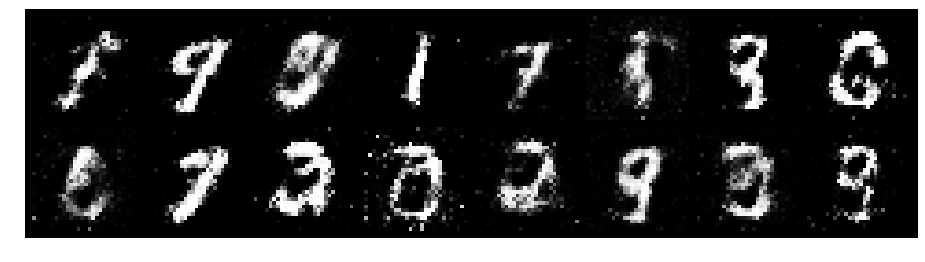

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.7990, Generator Loss: 1.9834
D(x): 0.7287, D(G(z)): 0.2364


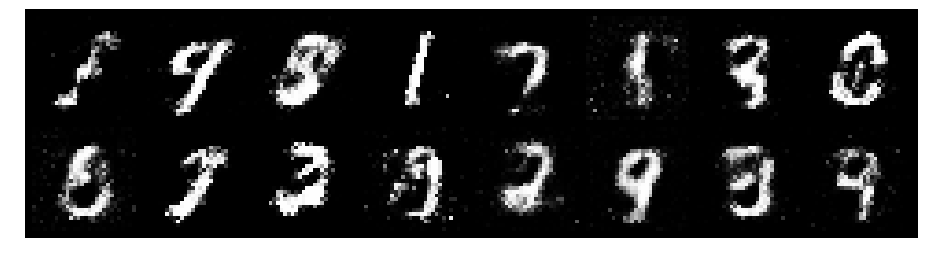

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 0.8565, Generator Loss: 2.0576
D(x): 0.6720, D(G(z)): 0.2159


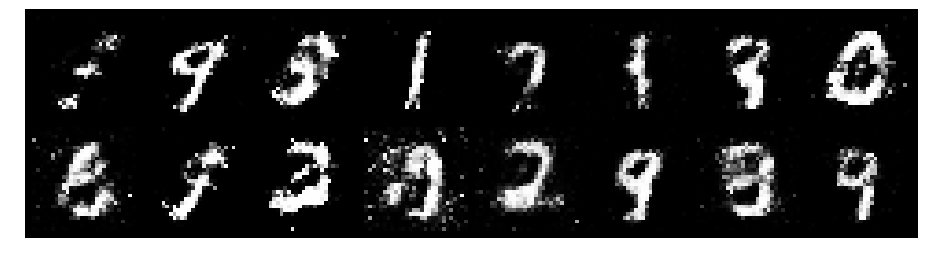

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 0.9483, Generator Loss: 1.3193
D(x): 0.6968, D(G(z)): 0.2945


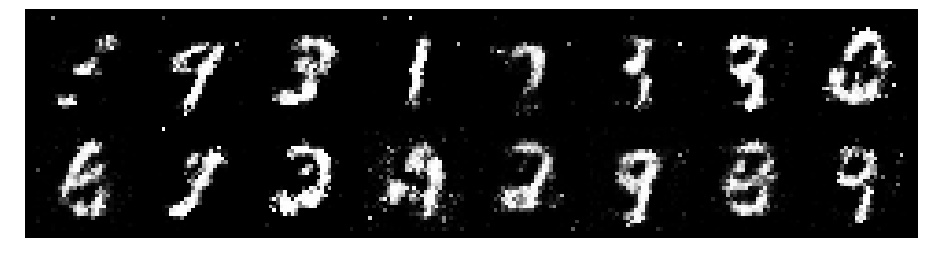

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.9689, Generator Loss: 1.5568
D(x): 0.8136, D(G(z)): 0.4006


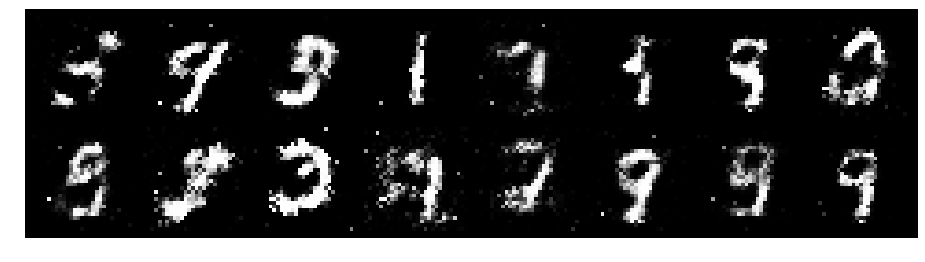

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.6642, Generator Loss: 2.0344
D(x): 0.8247, D(G(z)): 0.2678


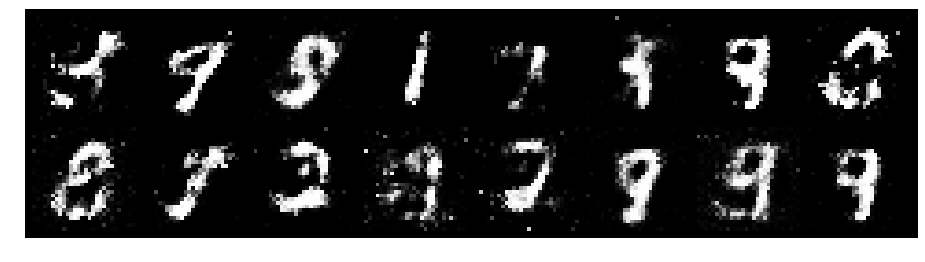

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 0.7840, Generator Loss: 1.8851
D(x): 0.8282, D(G(z)): 0.3149


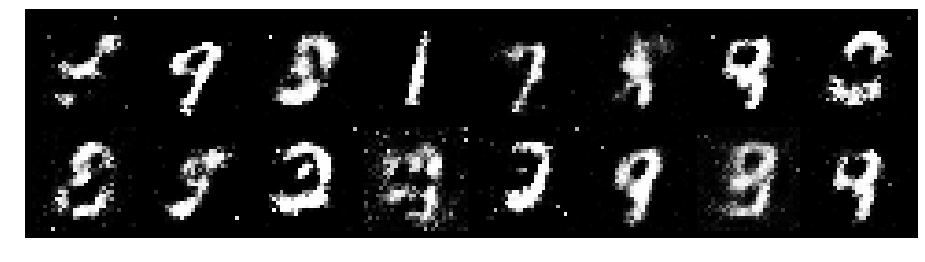

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.8652, Generator Loss: 1.7083
D(x): 0.7100, D(G(z)): 0.2934


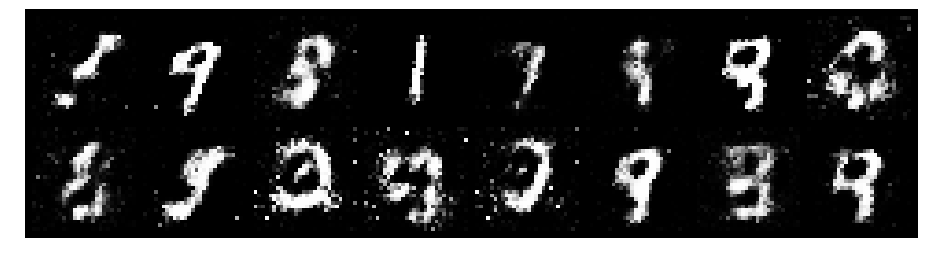

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 0.6877, Generator Loss: 1.8498
D(x): 0.7941, D(G(z)): 0.2517


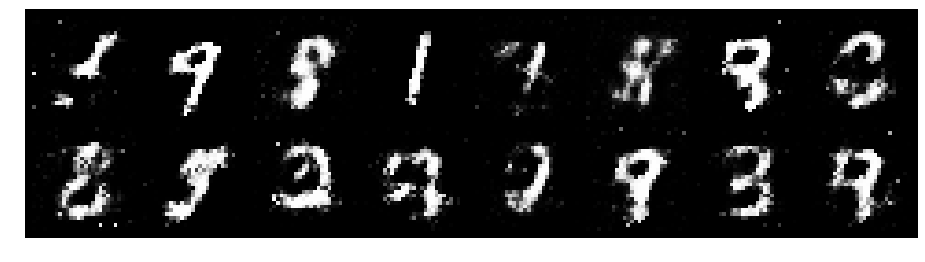

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.7814, Generator Loss: 1.8679
D(x): 0.7290, D(G(z)): 0.2241


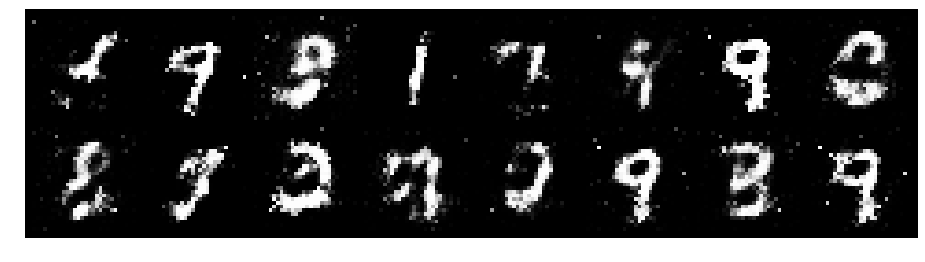

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 0.7666, Generator Loss: 1.7922
D(x): 0.7355, D(G(z)): 0.2532


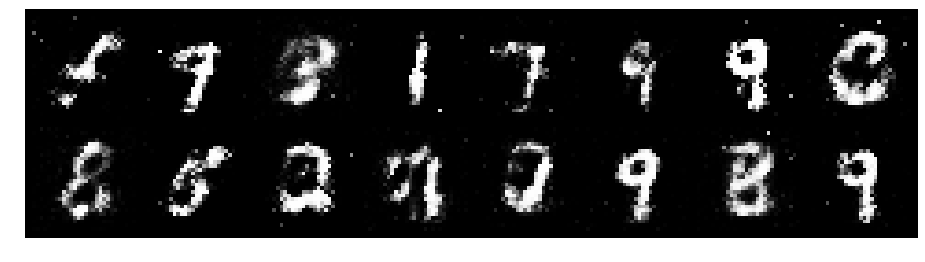

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 0.9061, Generator Loss: 1.6834
D(x): 0.6498, D(G(z)): 0.2081


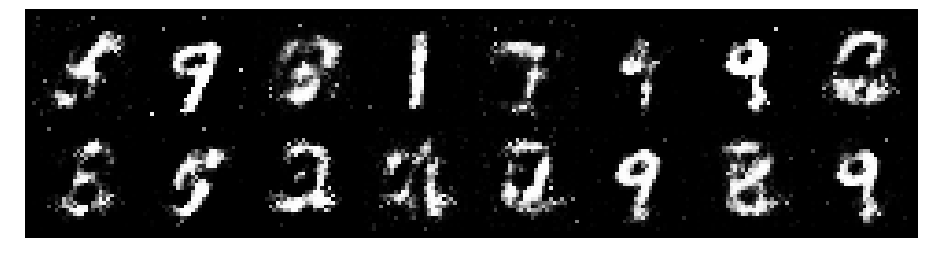

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 1.1043, Generator Loss: 1.6259
D(x): 0.6102, D(G(z)): 0.2716


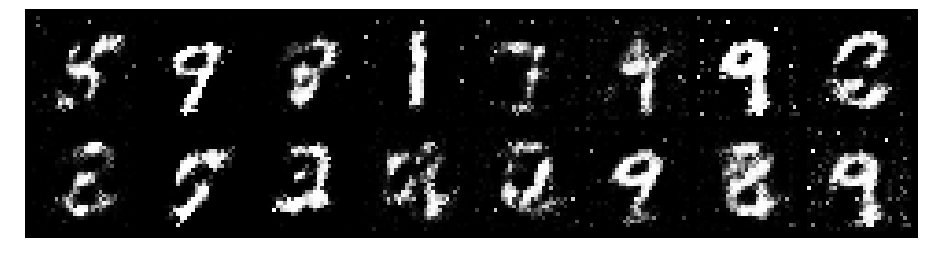

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 0.9681, Generator Loss: 1.8422
D(x): 0.7090, D(G(z)): 0.3259


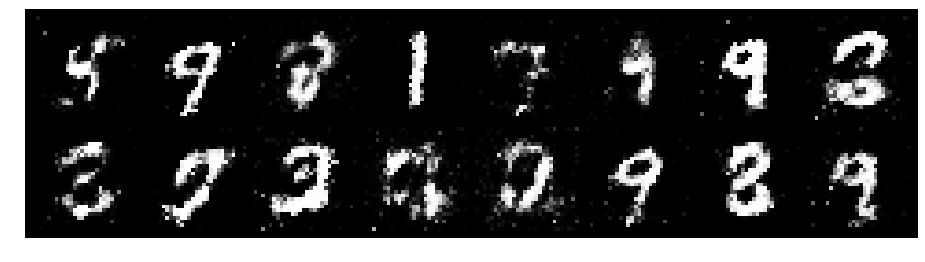

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 0.9351, Generator Loss: 1.8709
D(x): 0.7053, D(G(z)): 0.3062


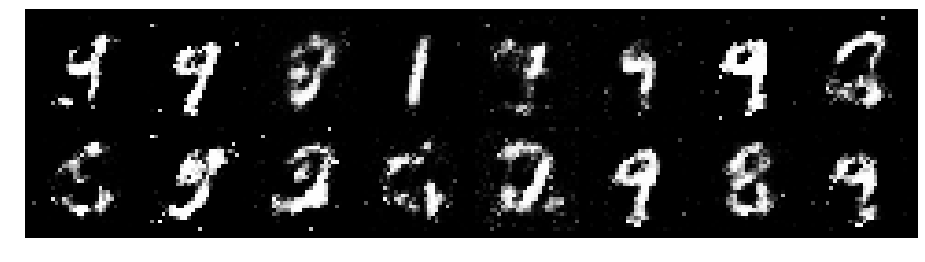

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 1.0729, Generator Loss: 1.3948
D(x): 0.6641, D(G(z)): 0.3781


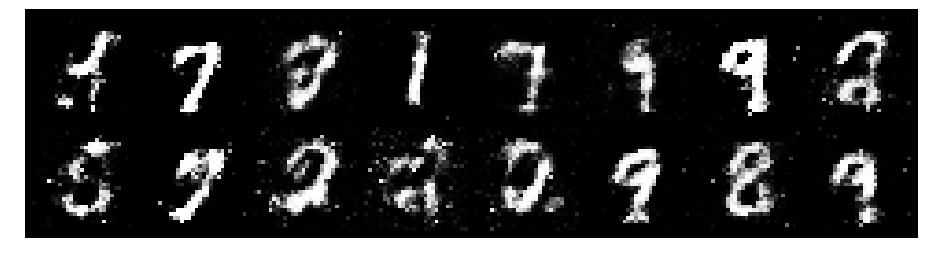

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 0.8964, Generator Loss: 1.5752
D(x): 0.6931, D(G(z)): 0.2893


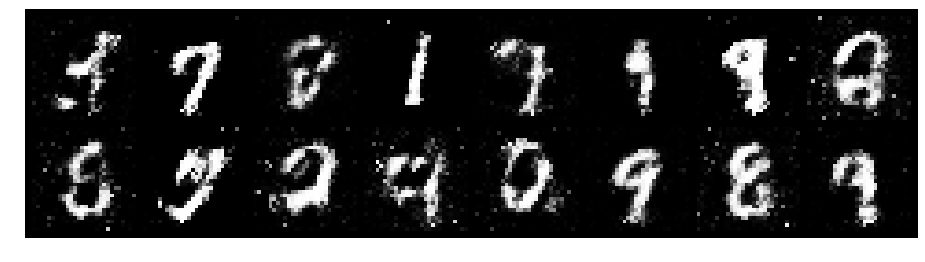

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 1.0647, Generator Loss: 1.4010
D(x): 0.6589, D(G(z)): 0.3534


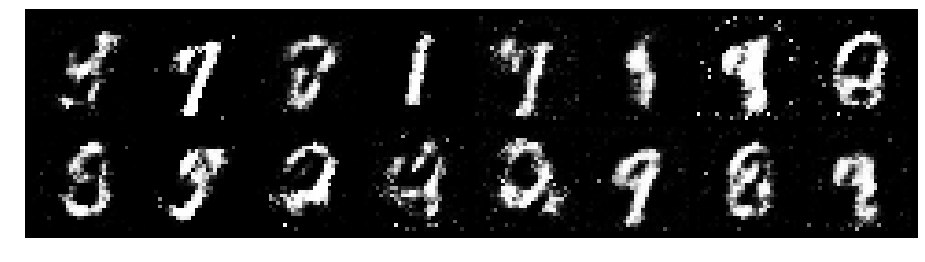

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 1.0198, Generator Loss: 1.4668
D(x): 0.6661, D(G(z)): 0.3221


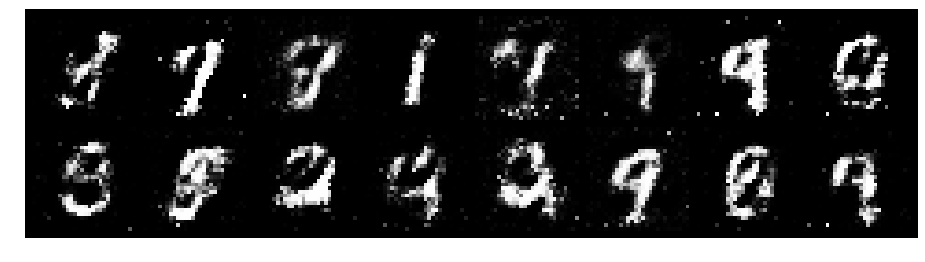

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.9066, Generator Loss: 1.6154
D(x): 0.7028, D(G(z)): 0.3067


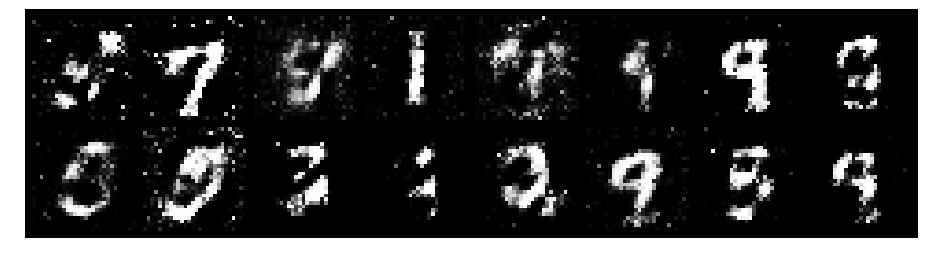

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 1.0313, Generator Loss: 1.8990
D(x): 0.6565, D(G(z)): 0.3039


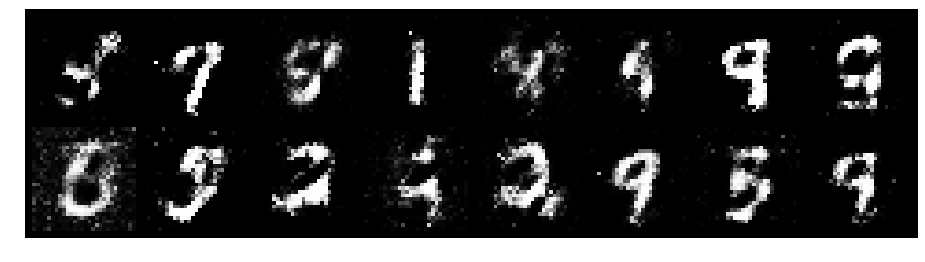

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 0.9445, Generator Loss: 1.3072
D(x): 0.6301, D(G(z)): 0.2910


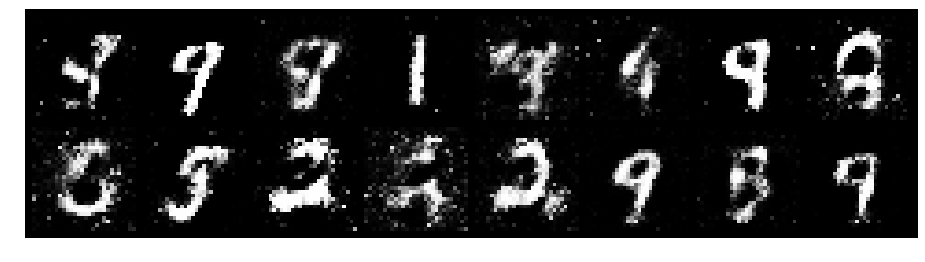

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 0.9939, Generator Loss: 1.3596
D(x): 0.7204, D(G(z)): 0.3408


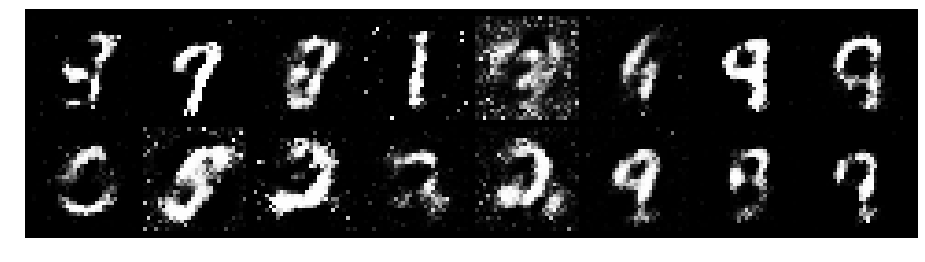

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 1.0629, Generator Loss: 1.3540
D(x): 0.6640, D(G(z)): 0.3552


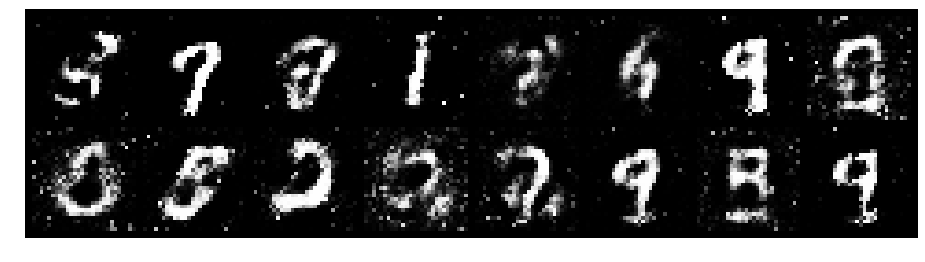

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 0.9660, Generator Loss: 1.2442
D(x): 0.6787, D(G(z)): 0.3411


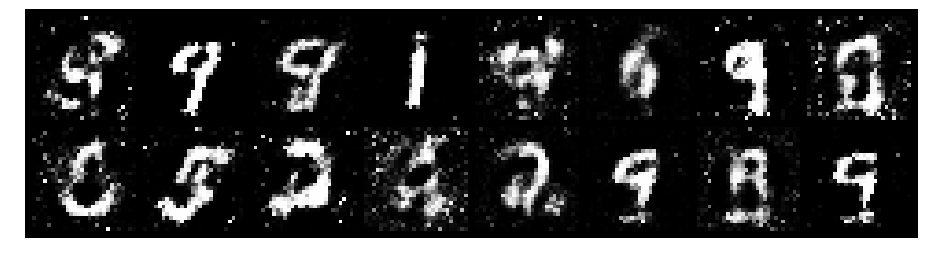

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.9672, Generator Loss: 1.6857
D(x): 0.6858, D(G(z)): 0.3060


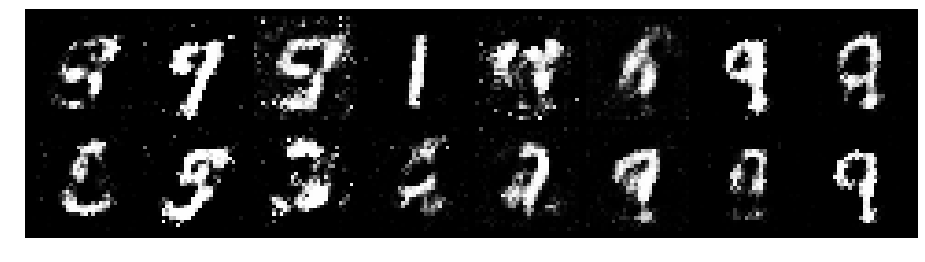

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.9044, Generator Loss: 2.1512
D(x): 0.6789, D(G(z)): 0.2688


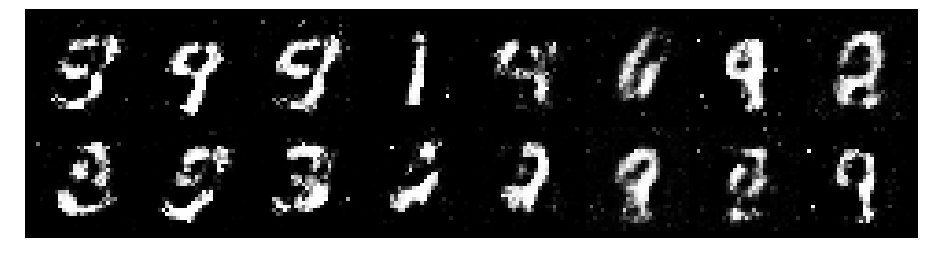

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.8662, Generator Loss: 1.5566
D(x): 0.7615, D(G(z)): 0.3324


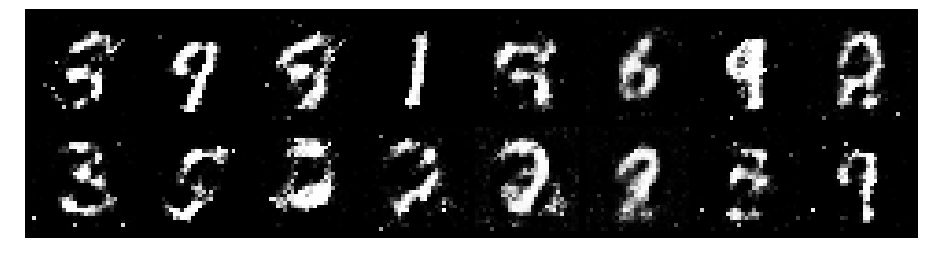

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 0.6972, Generator Loss: 1.5338
D(x): 0.7648, D(G(z)): 0.2454


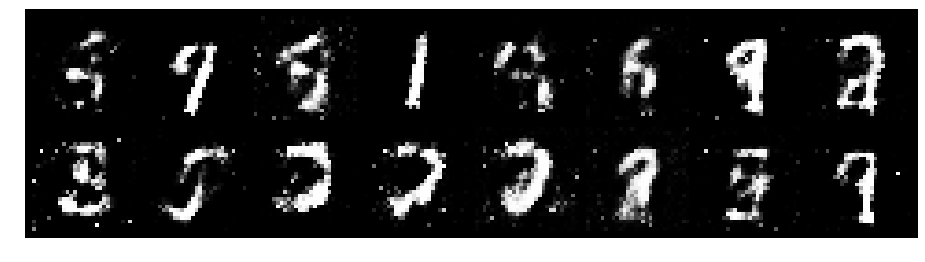

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 0.6874, Generator Loss: 2.5868
D(x): 0.7556, D(G(z)): 0.2168


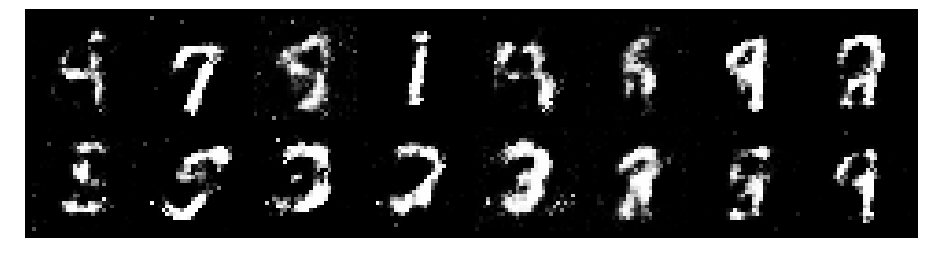

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 0.7467, Generator Loss: 1.4520
D(x): 0.8289, D(G(z)): 0.3206


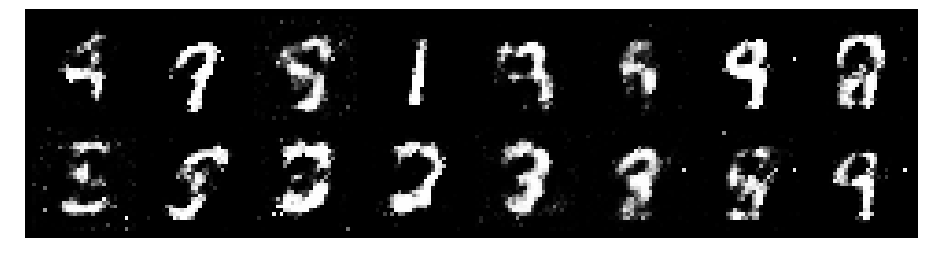

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 0.7960, Generator Loss: 2.2882
D(x): 0.7388, D(G(z)): 0.2295


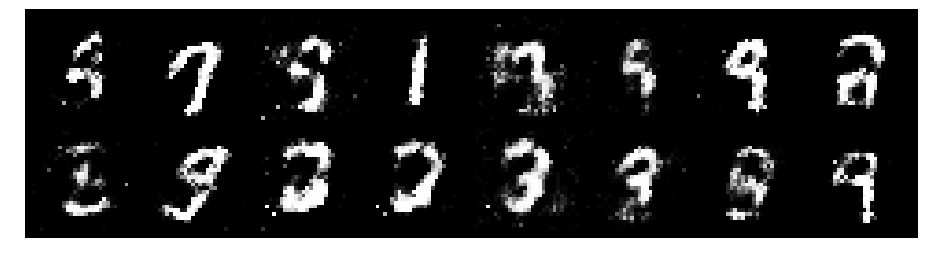

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 0.8377, Generator Loss: 1.8819
D(x): 0.6562, D(G(z)): 0.2087


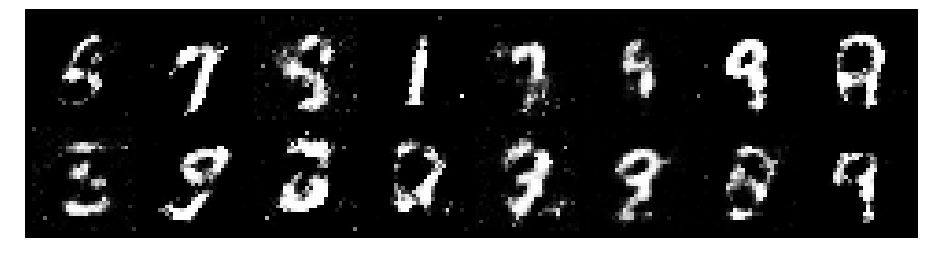

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 1.0143, Generator Loss: 2.0832
D(x): 0.6653, D(G(z)): 0.2235


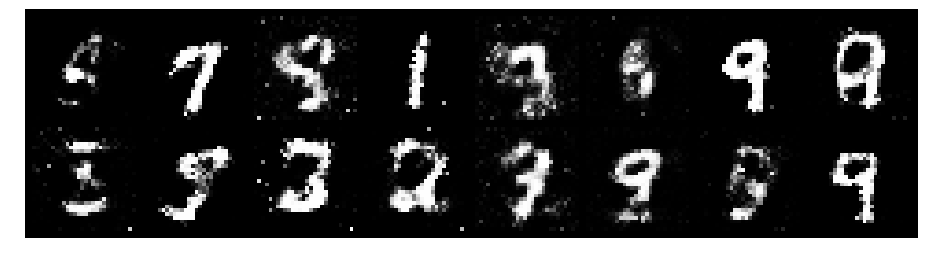

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 0.8194, Generator Loss: 1.3456
D(x): 0.7874, D(G(z)): 0.3585


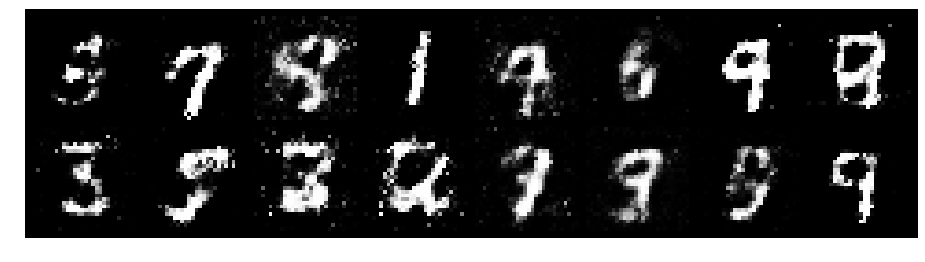

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 1.0853, Generator Loss: 1.5015
D(x): 0.6639, D(G(z)): 0.3036


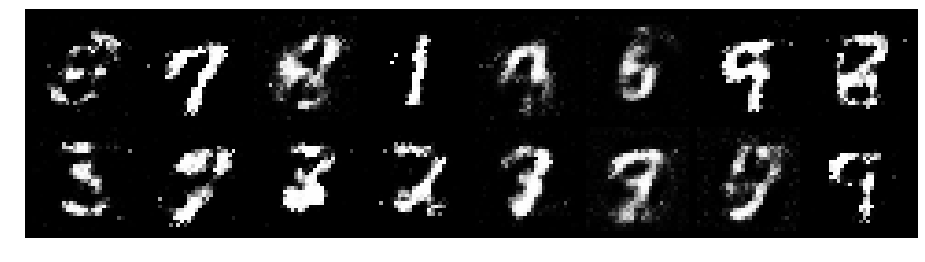

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 0.8721, Generator Loss: 1.5174
D(x): 0.6892, D(G(z)): 0.2760


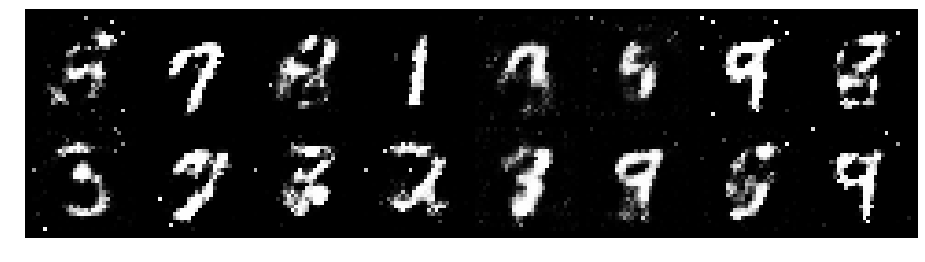

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 1.0087, Generator Loss: 1.1650
D(x): 0.6947, D(G(z)): 0.3601


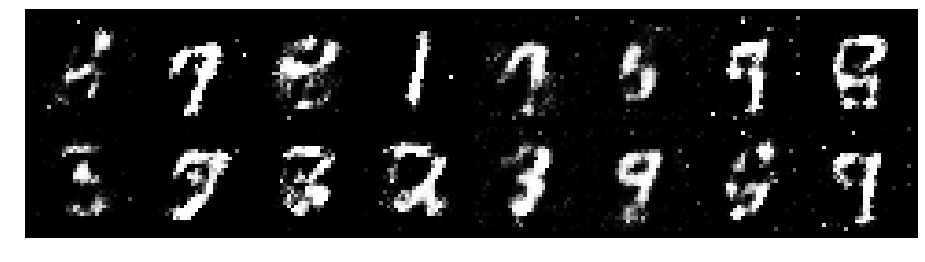

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 0.9055, Generator Loss: 1.5749
D(x): 0.6647, D(G(z)): 0.2806


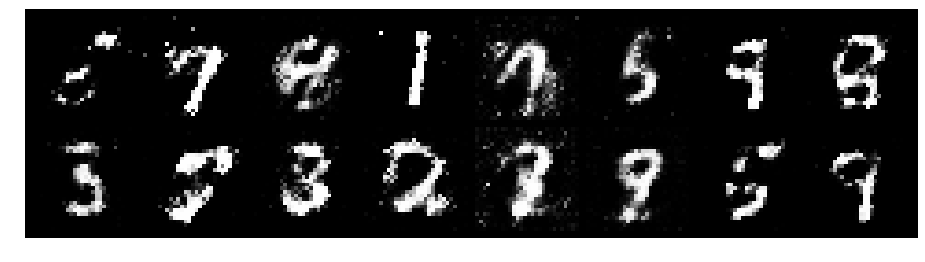

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 1.0444, Generator Loss: 1.3401
D(x): 0.6977, D(G(z)): 0.3680


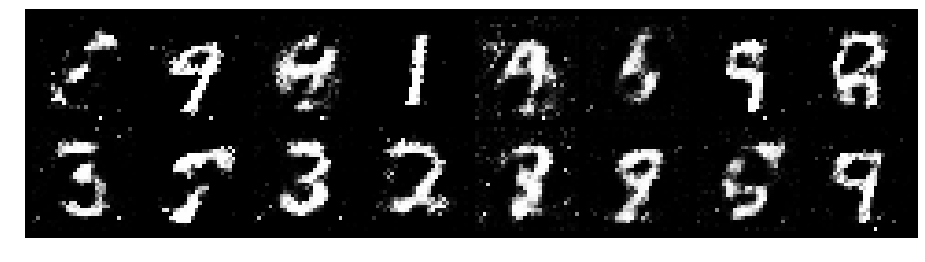

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 1.0119, Generator Loss: 1.2076
D(x): 0.6281, D(G(z)): 0.3337


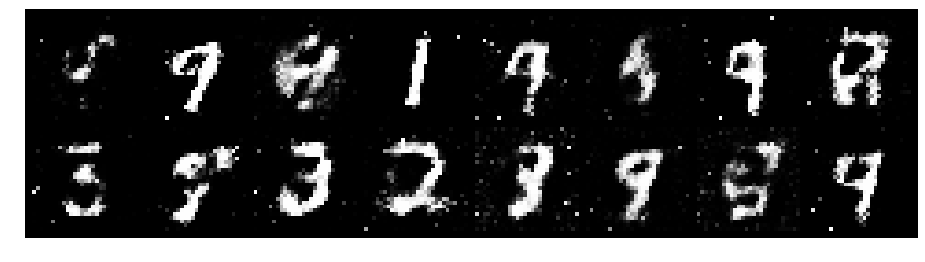

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 0.8739, Generator Loss: 1.7125
D(x): 0.6832, D(G(z)): 0.2571


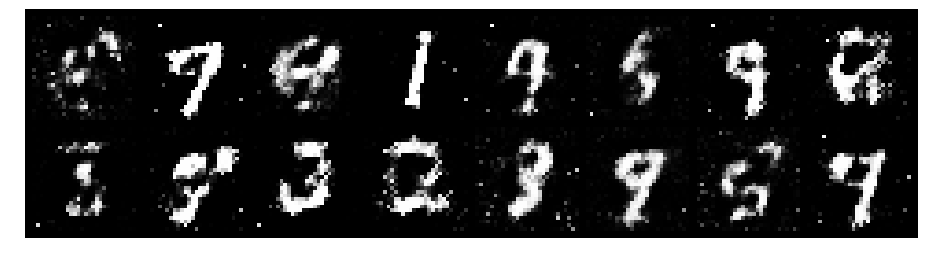

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 1.0277, Generator Loss: 1.1397
D(x): 0.6890, D(G(z)): 0.3882


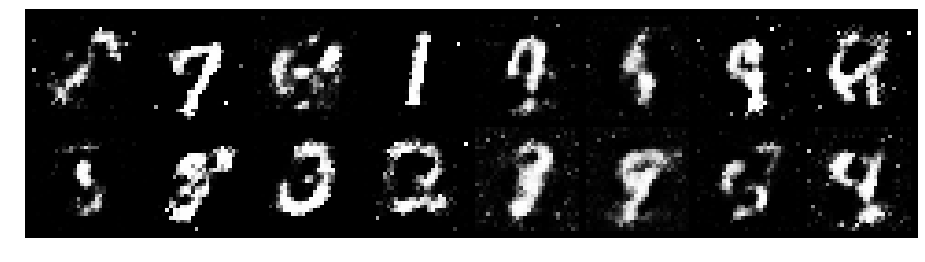

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 1.2251, Generator Loss: 1.0047
D(x): 0.6590, D(G(z)): 0.3972


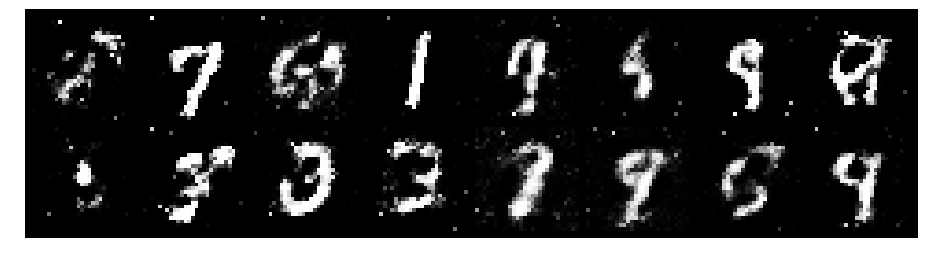

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 0.9760, Generator Loss: 1.5509
D(x): 0.6827, D(G(z)): 0.2845


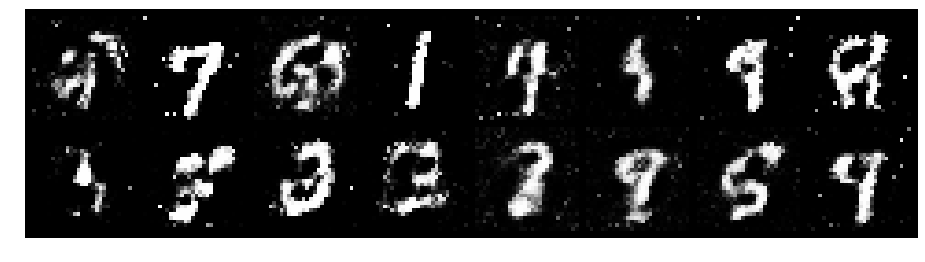

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 0.9841, Generator Loss: 1.6449
D(x): 0.6518, D(G(z)): 0.2977


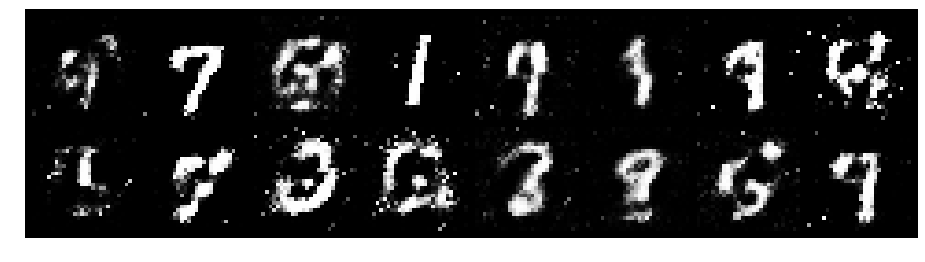

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 1.1208, Generator Loss: 1.4830
D(x): 0.6596, D(G(z)): 0.3786


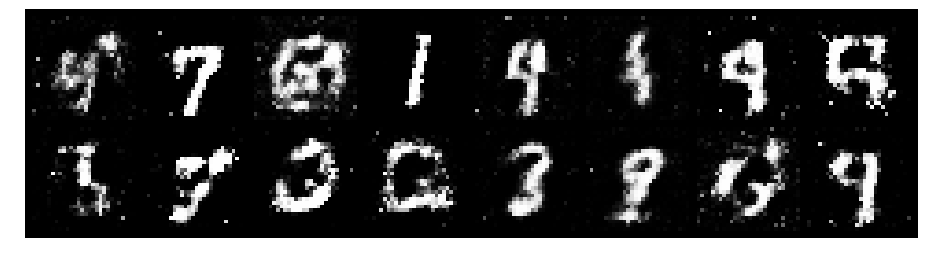

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 0.9236, Generator Loss: 1.6625
D(x): 0.7390, D(G(z)): 0.3331


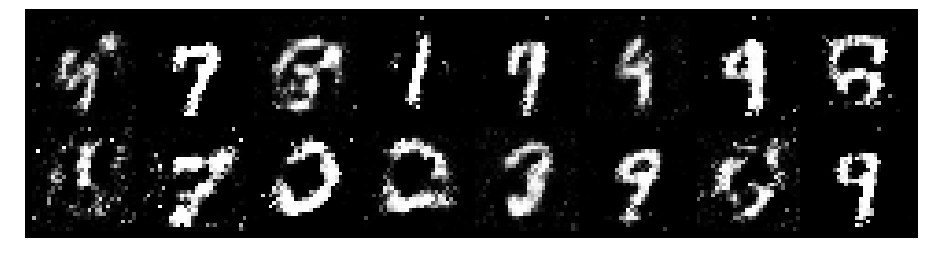

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 0.9055, Generator Loss: 1.7642
D(x): 0.7468, D(G(z)): 0.3511


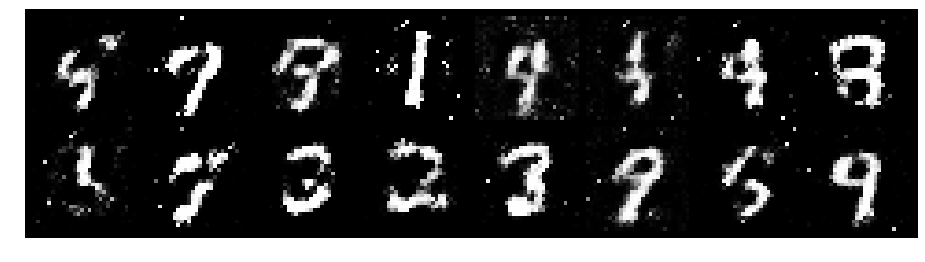

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 0.9492, Generator Loss: 1.4641
D(x): 0.6546, D(G(z)): 0.2908


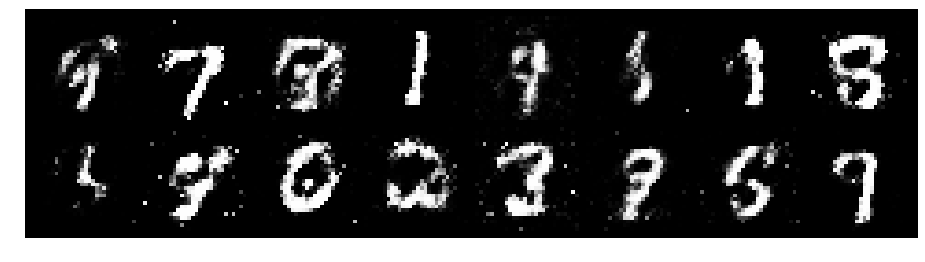

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 0.9775, Generator Loss: 1.4453
D(x): 0.6424, D(G(z)): 0.3159


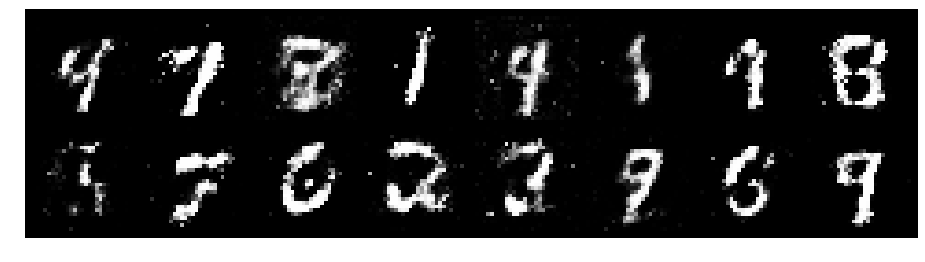

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 1.1494, Generator Loss: 1.5815
D(x): 0.5692, D(G(z)): 0.2672


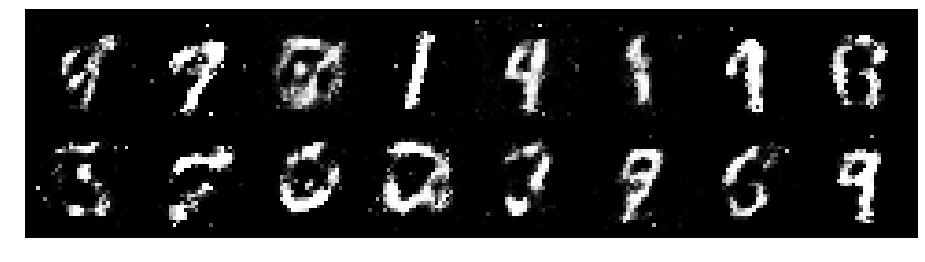

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 0.8167, Generator Loss: 1.7619
D(x): 0.8017, D(G(z)): 0.3350


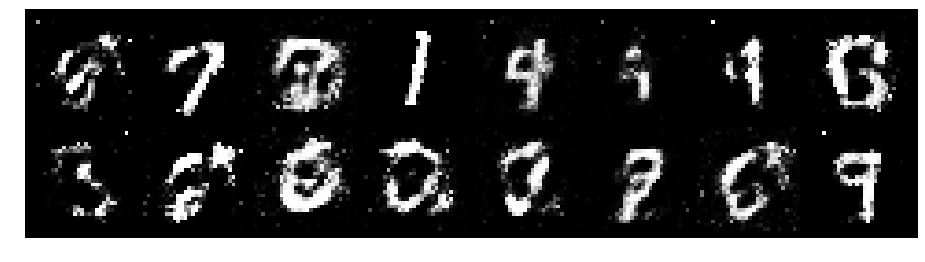

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 0.9235, Generator Loss: 1.4099
D(x): 0.7637, D(G(z)): 0.3544


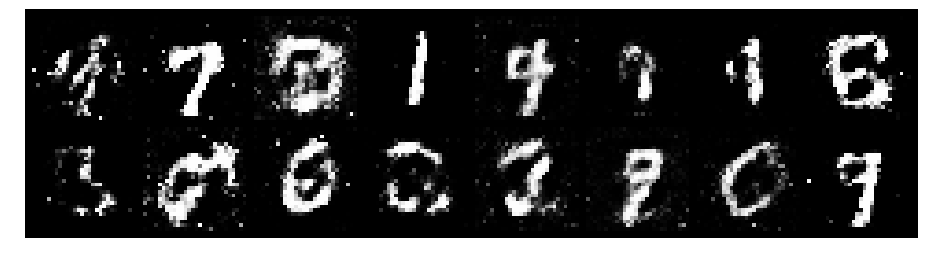

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 1.0943, Generator Loss: 1.4419
D(x): 0.6691, D(G(z)): 0.3389


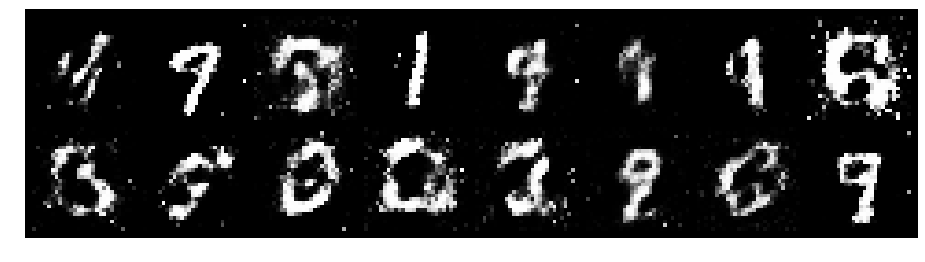

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 0.9306, Generator Loss: 1.2456
D(x): 0.7143, D(G(z)): 0.3236


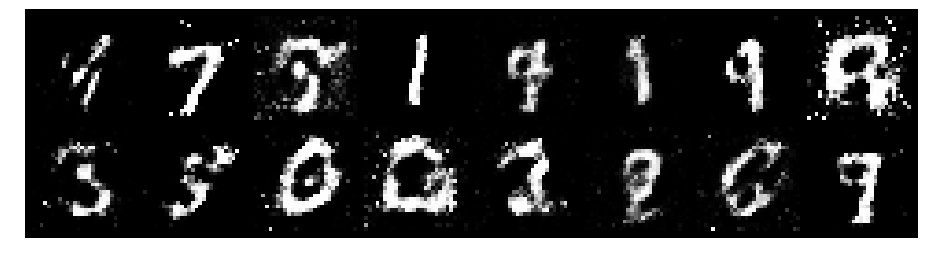

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 1.1139, Generator Loss: 1.0792
D(x): 0.6455, D(G(z)): 0.3865


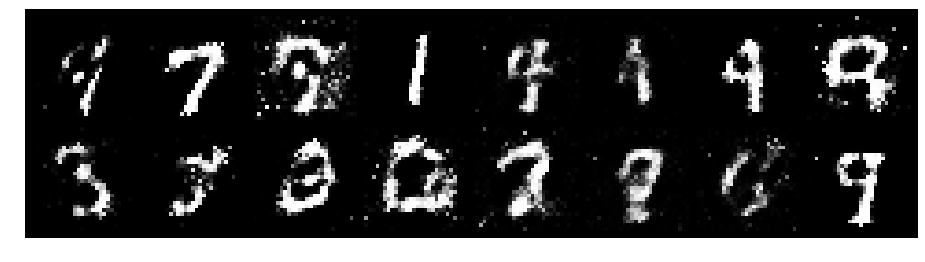

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 0.9420, Generator Loss: 1.3783
D(x): 0.6406, D(G(z)): 0.3058


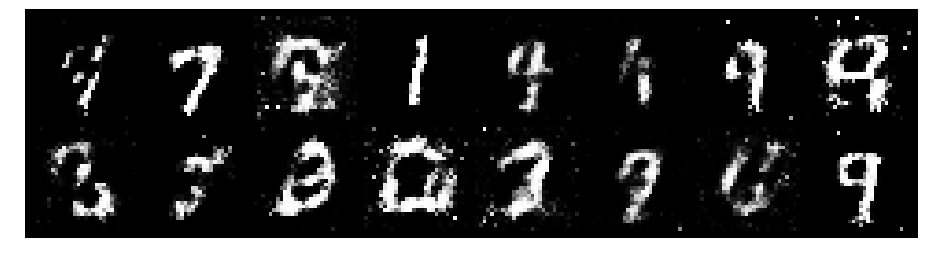

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 0.7955, Generator Loss: 1.6914
D(x): 0.6911, D(G(z)): 0.2619


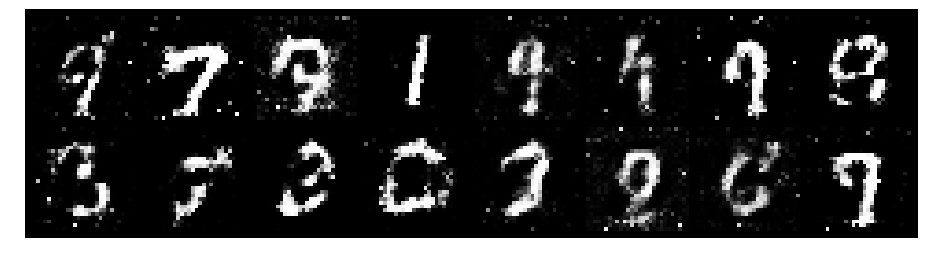

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 0.9325, Generator Loss: 1.6543
D(x): 0.6245, D(G(z)): 0.2519


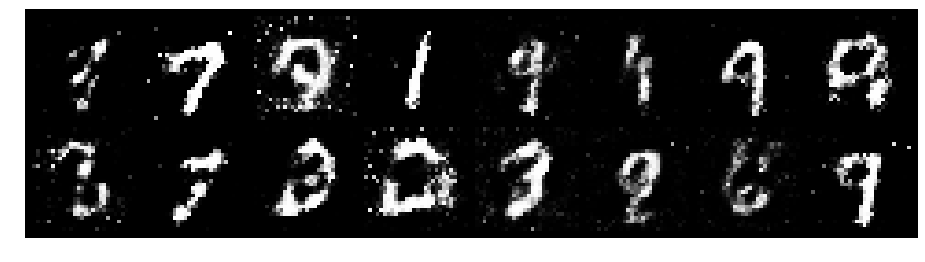

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 0.8733, Generator Loss: 1.8733
D(x): 0.6601, D(G(z)): 0.2484


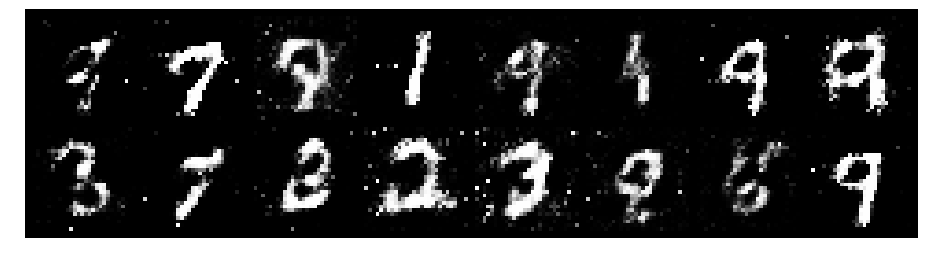

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 0.9676, Generator Loss: 2.1393
D(x): 0.7102, D(G(z)): 0.3080


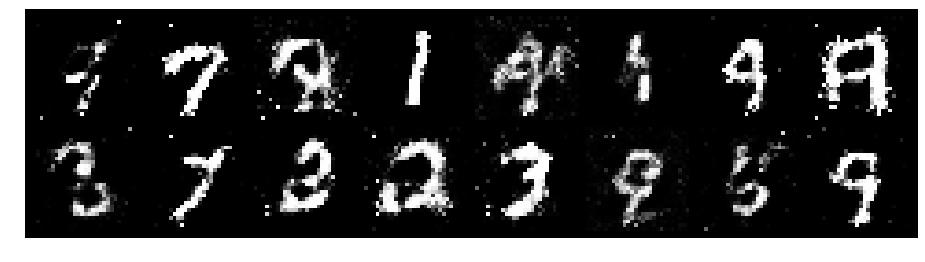

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 0.9890, Generator Loss: 1.1810
D(x): 0.7459, D(G(z)): 0.3914


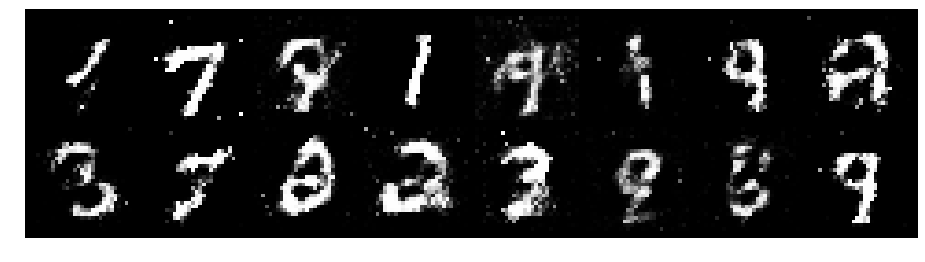

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 1.0043, Generator Loss: 1.7108
D(x): 0.7025, D(G(z)): 0.3467


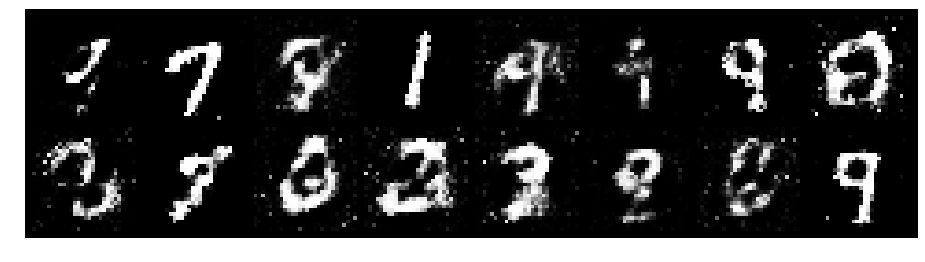

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 1.0630, Generator Loss: 1.3351
D(x): 0.7170, D(G(z)): 0.3833


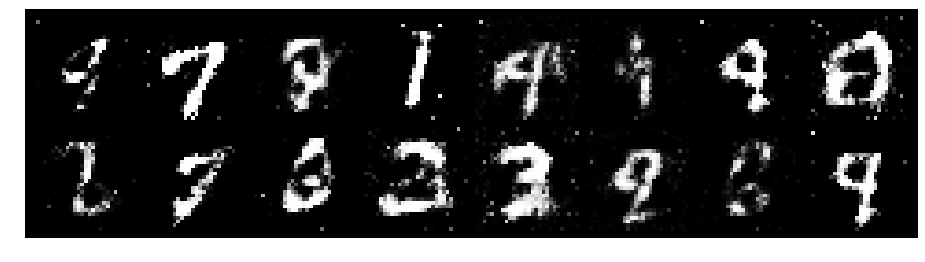

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 0.9165, Generator Loss: 1.5276
D(x): 0.6905, D(G(z)): 0.3152


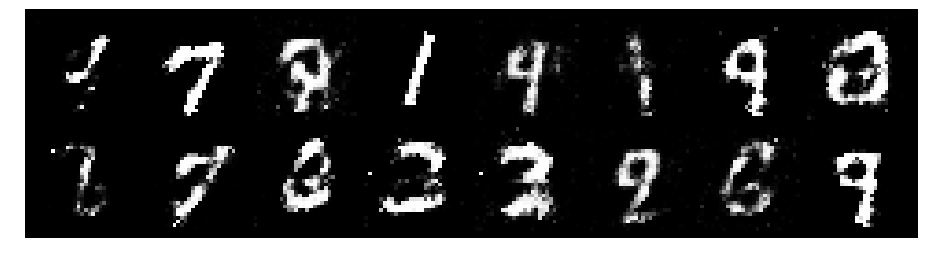

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 0.9852, Generator Loss: 1.7716
D(x): 0.6695, D(G(z)): 0.2695


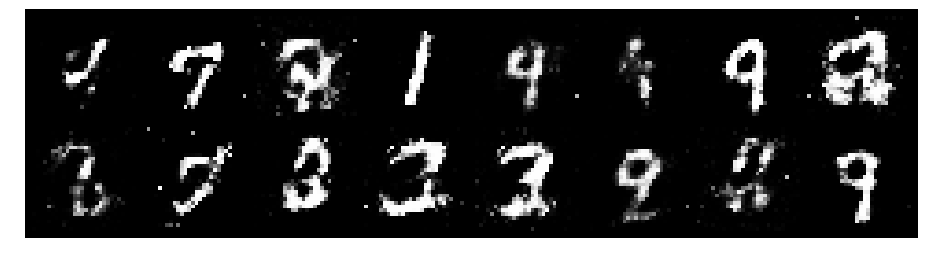

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 1.0125, Generator Loss: 1.5727
D(x): 0.7616, D(G(z)): 0.4107


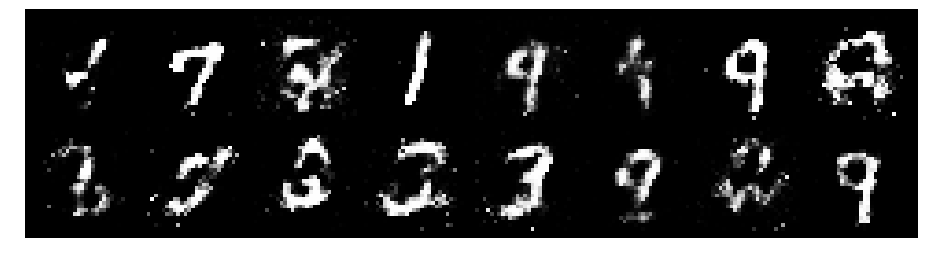

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 1.0717, Generator Loss: 1.7188
D(x): 0.6472, D(G(z)): 0.3015


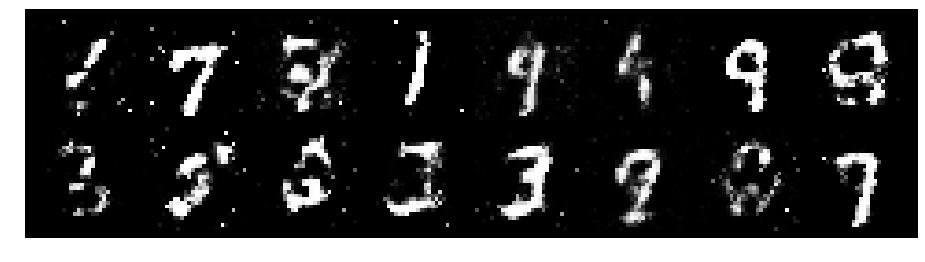

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 0.9329, Generator Loss: 1.4008
D(x): 0.6930, D(G(z)): 0.3337


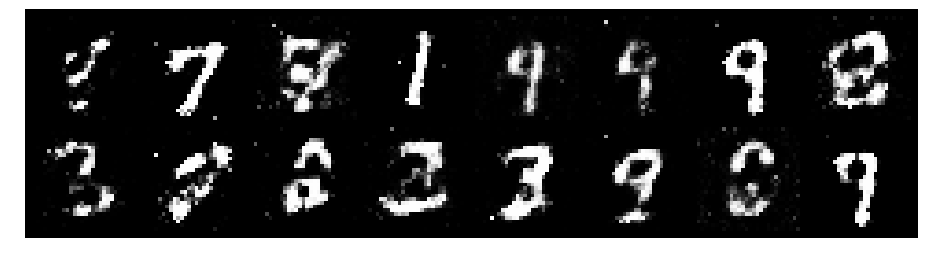

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 1.0262, Generator Loss: 1.4544
D(x): 0.7026, D(G(z)): 0.3646


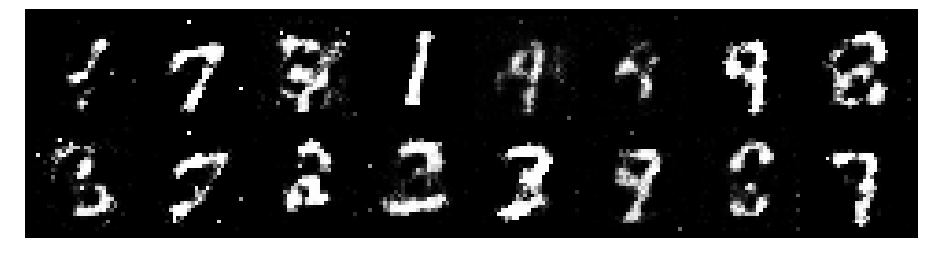

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 0.9781, Generator Loss: 1.4736
D(x): 0.6678, D(G(z)): 0.3223


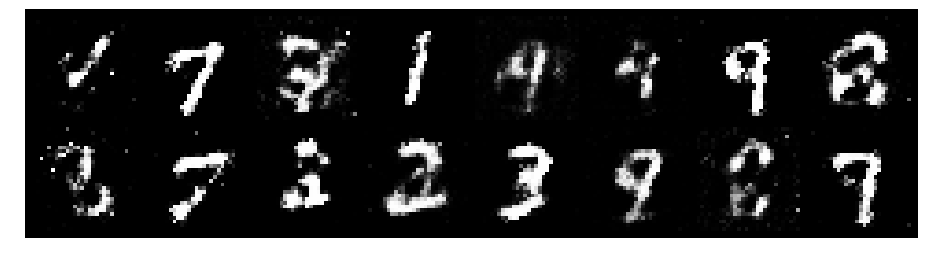

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 1.0870, Generator Loss: 1.2821
D(x): 0.6023, D(G(z)): 0.3304


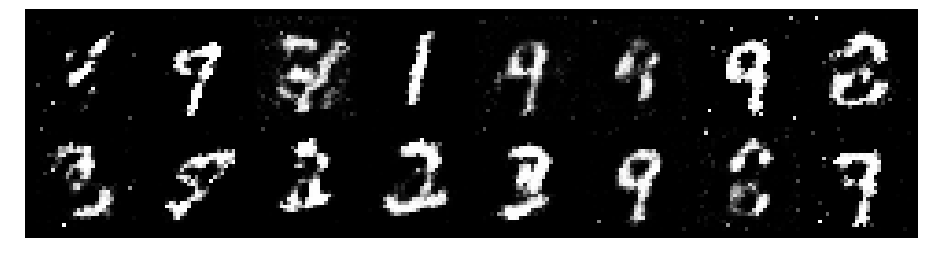

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 1.1347, Generator Loss: 1.2087
D(x): 0.6323, D(G(z)): 0.3512


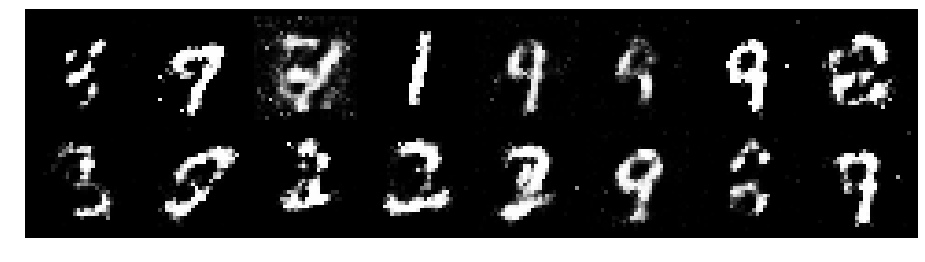

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 1.0720, Generator Loss: 1.4341
D(x): 0.6539, D(G(z)): 0.3669


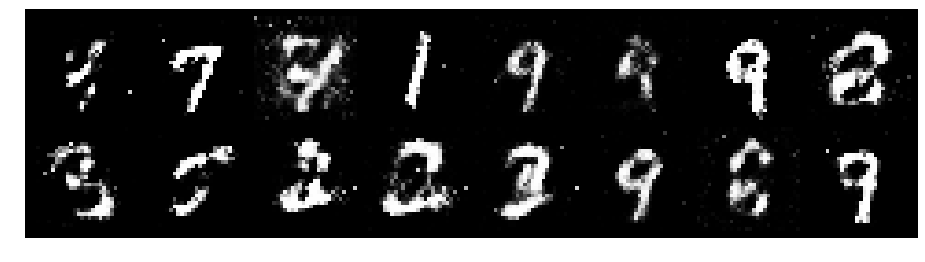

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 0.8244, Generator Loss: 1.4627
D(x): 0.7416, D(G(z)): 0.3159


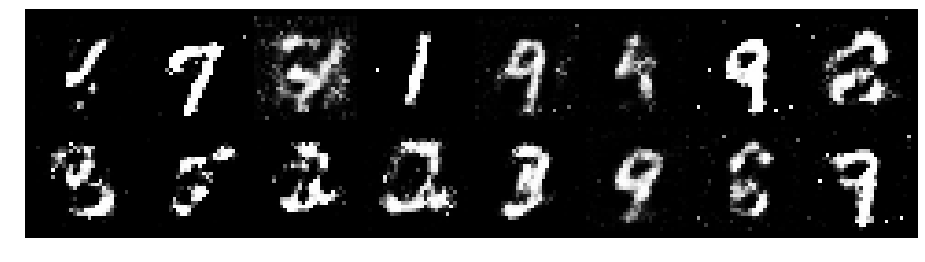

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 1.0362, Generator Loss: 1.6448
D(x): 0.6993, D(G(z)): 0.3608


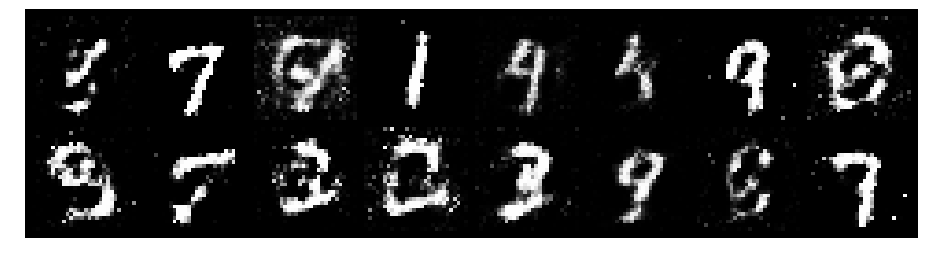

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 0.8390, Generator Loss: 1.5341
D(x): 0.7369, D(G(z)): 0.3278


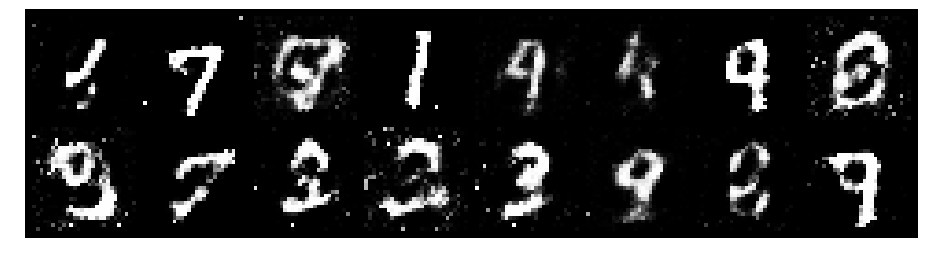

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 0.9389, Generator Loss: 1.3233
D(x): 0.6819, D(G(z)): 0.3065


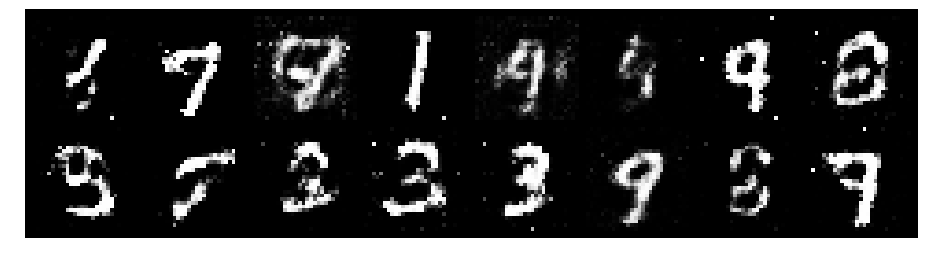

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 0.7966, Generator Loss: 1.5322
D(x): 0.6914, D(G(z)): 0.2547


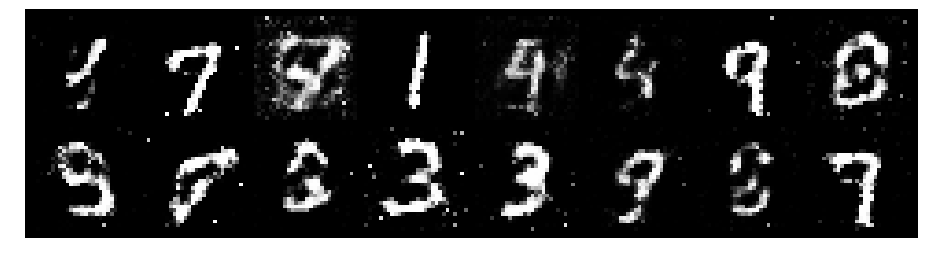

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 0.9699, Generator Loss: 1.6095
D(x): 0.6502, D(G(z)): 0.2994


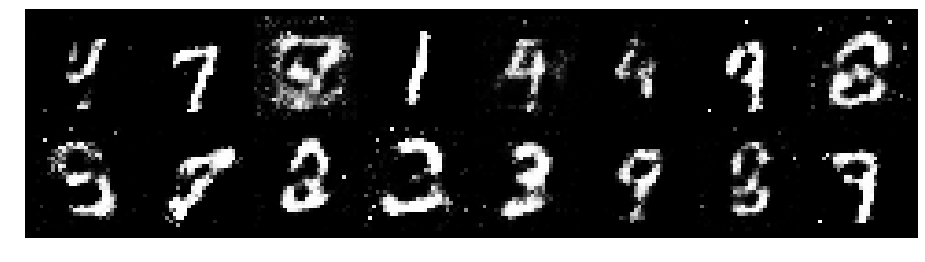

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 1.0043, Generator Loss: 1.2384
D(x): 0.6494, D(G(z)): 0.3220


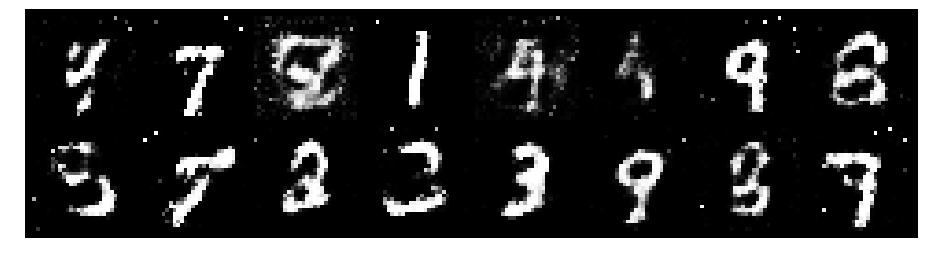

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 1.0639, Generator Loss: 1.1769
D(x): 0.7089, D(G(z)): 0.3997


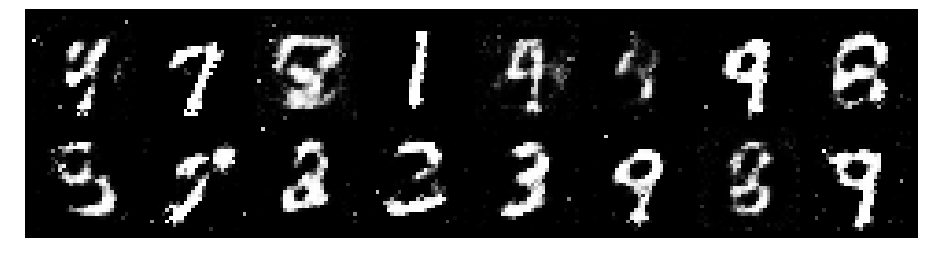

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 0.9895, Generator Loss: 1.4368
D(x): 0.6642, D(G(z)): 0.3276


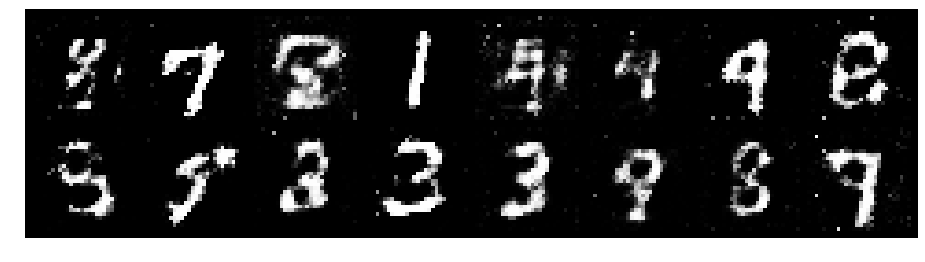

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 1.0085, Generator Loss: 1.4281
D(x): 0.6328, D(G(z)): 0.3143


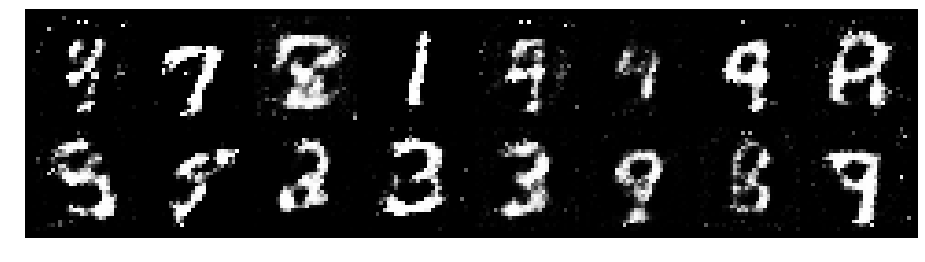

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 1.0320, Generator Loss: 1.4768
D(x): 0.5976, D(G(z)): 0.3104


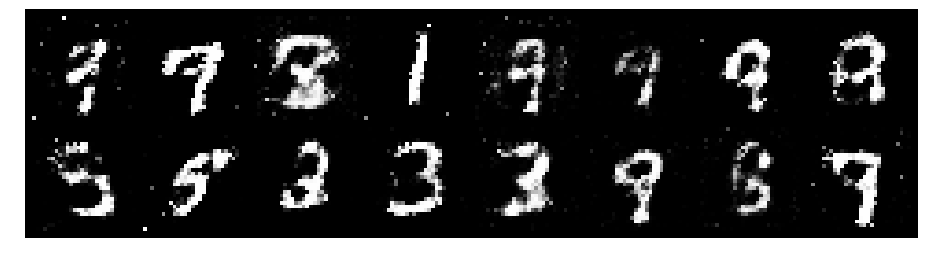

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 1.0458, Generator Loss: 1.1915
D(x): 0.6941, D(G(z)): 0.3788


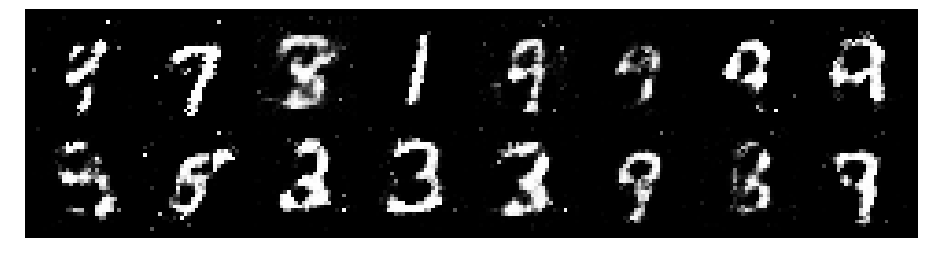

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 1.0525, Generator Loss: 1.3850
D(x): 0.6071, D(G(z)): 0.2937


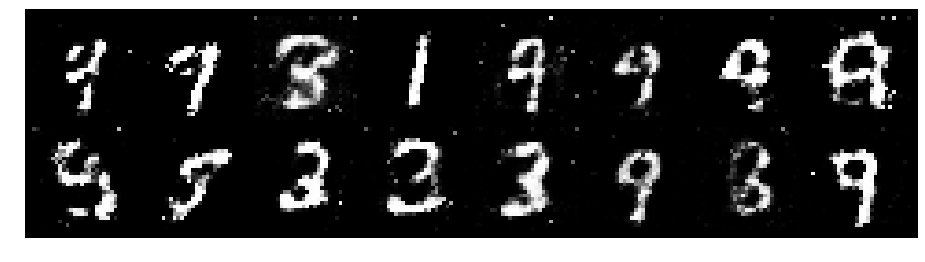

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 0.9837, Generator Loss: 1.1003
D(x): 0.6639, D(G(z)): 0.3362


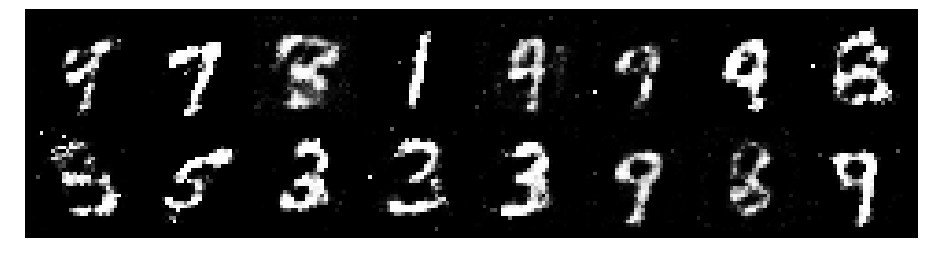

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 0.9394, Generator Loss: 0.9379
D(x): 0.6380, D(G(z)): 0.2708


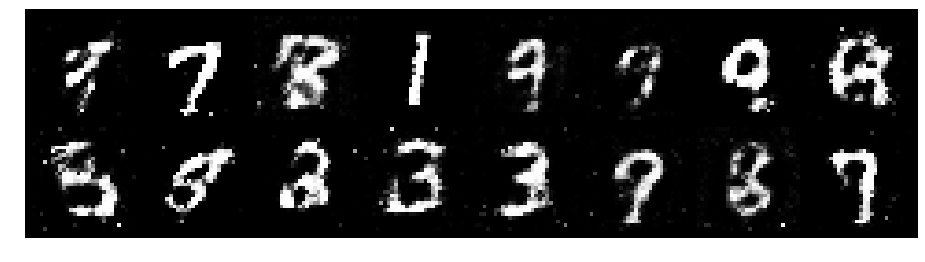

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 0.8295, Generator Loss: 1.4173
D(x): 0.7138, D(G(z)): 0.3046


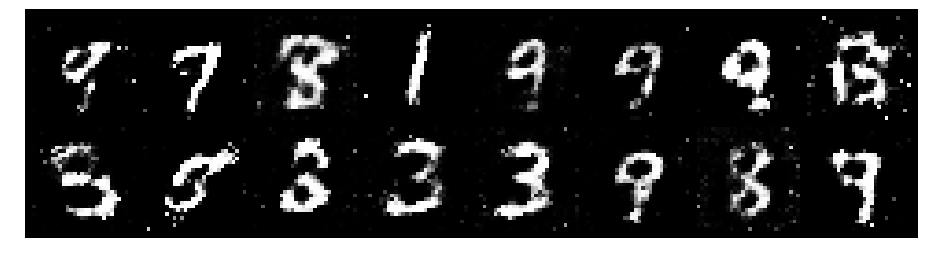

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 0.8872, Generator Loss: 1.7458
D(x): 0.6566, D(G(z)): 0.2472


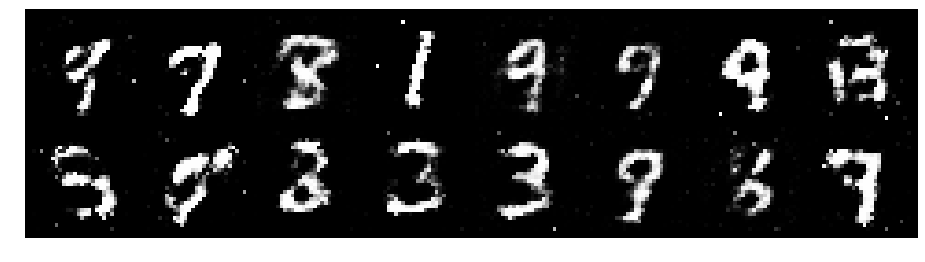

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 0.9969, Generator Loss: 1.4423
D(x): 0.6790, D(G(z)): 0.3311


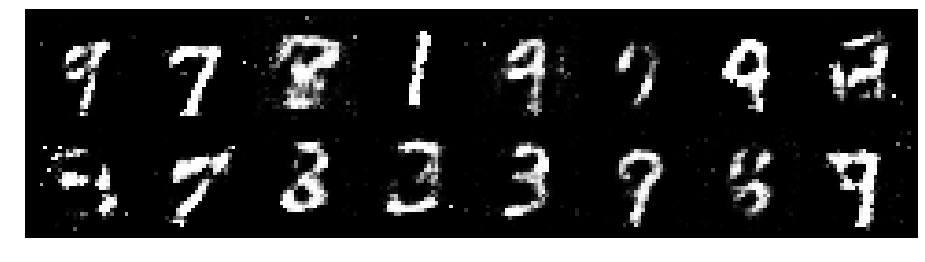

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 0.9941, Generator Loss: 1.5783
D(x): 0.7342, D(G(z)): 0.3433


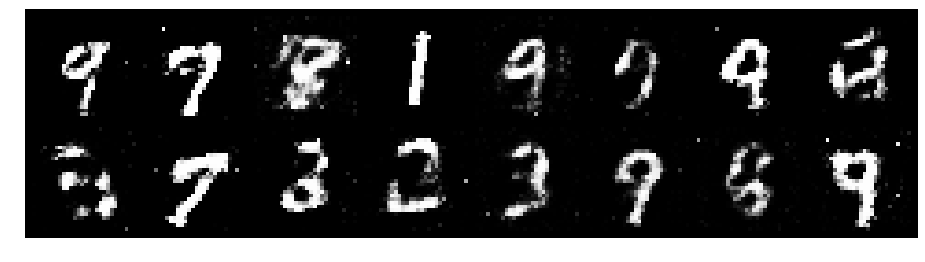

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 0.9236, Generator Loss: 1.5324
D(x): 0.6428, D(G(z)): 0.2349


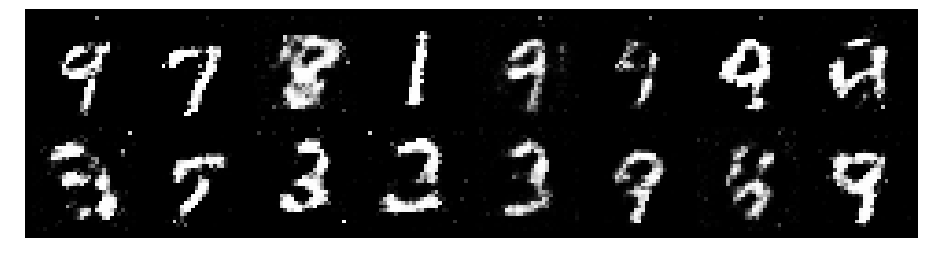

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 0.8296, Generator Loss: 1.5629
D(x): 0.7484, D(G(z)): 0.3220


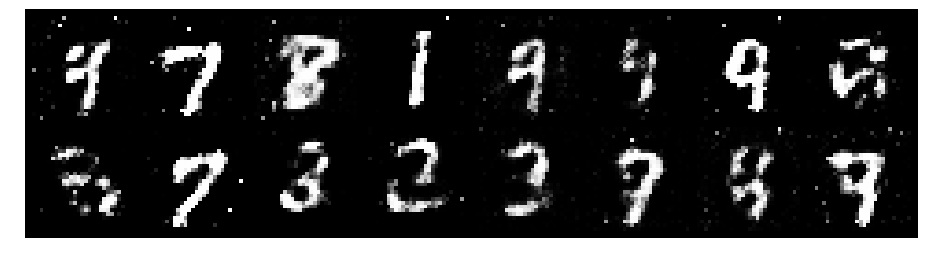

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 0.9007, Generator Loss: 1.3524
D(x): 0.6821, D(G(z)): 0.2868


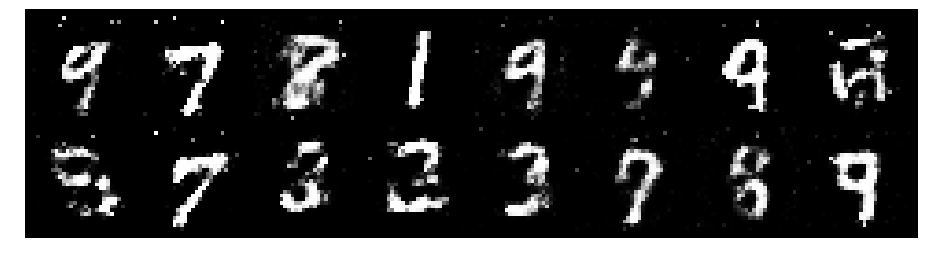

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 0.9578, Generator Loss: 1.5501
D(x): 0.6819, D(G(z)): 0.3377


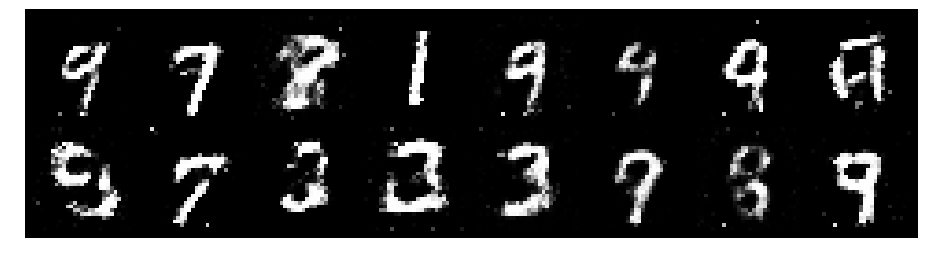

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 0.8632, Generator Loss: 1.6107
D(x): 0.7062, D(G(z)): 0.2907


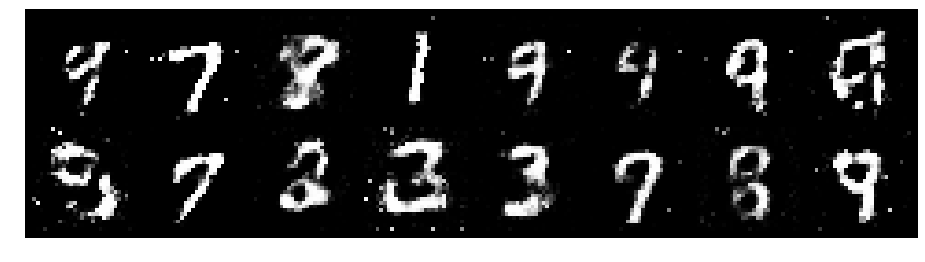

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 0.9829, Generator Loss: 1.6853
D(x): 0.6591, D(G(z)): 0.3172


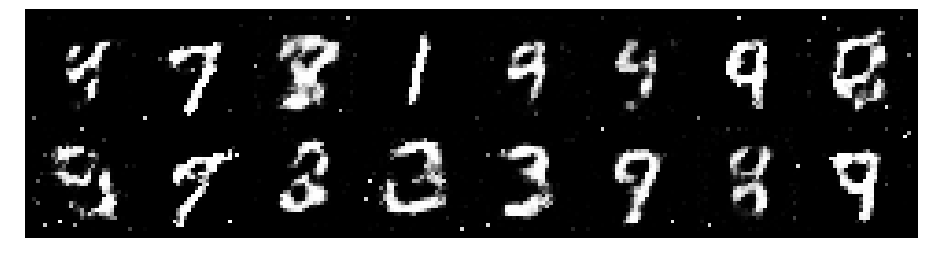

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 1.1286, Generator Loss: 1.4286
D(x): 0.5765, D(G(z)): 0.2795


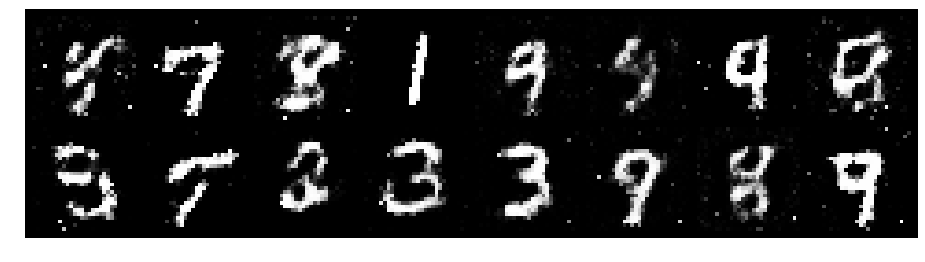

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 0.9143, Generator Loss: 1.5112
D(x): 0.6834, D(G(z)): 0.2814


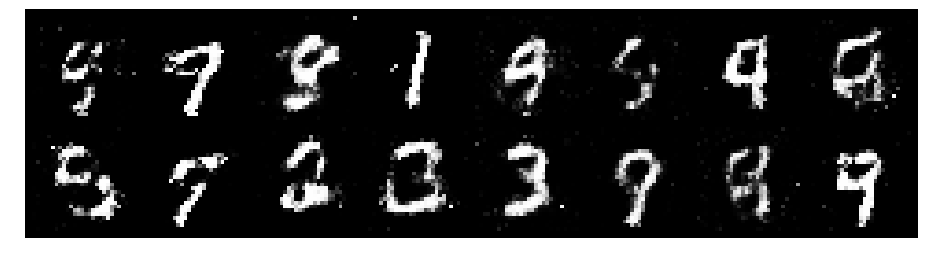

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 0.8631, Generator Loss: 1.2669
D(x): 0.6983, D(G(z)): 0.3005


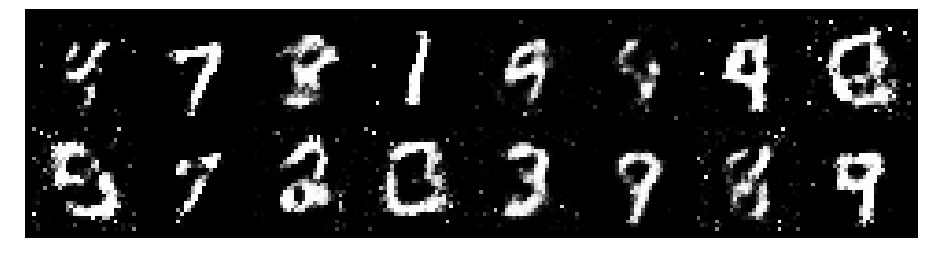

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 0.9757, Generator Loss: 1.1349
D(x): 0.6634, D(G(z)): 0.3592


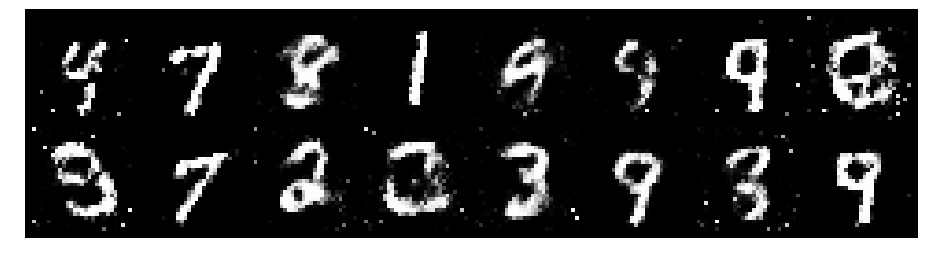

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 1.0865, Generator Loss: 1.0707
D(x): 0.6674, D(G(z)): 0.4067


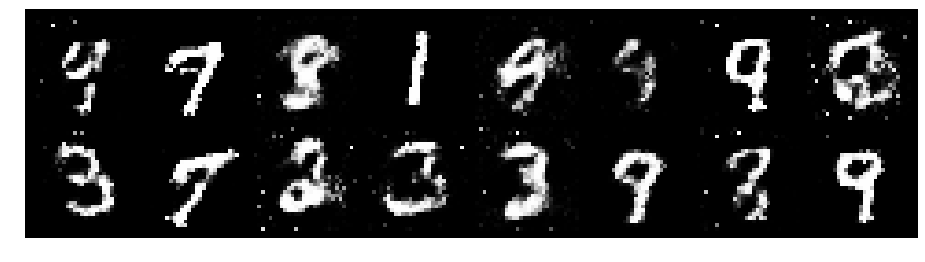

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 1.0916, Generator Loss: 1.3142
D(x): 0.6599, D(G(z)): 0.4032


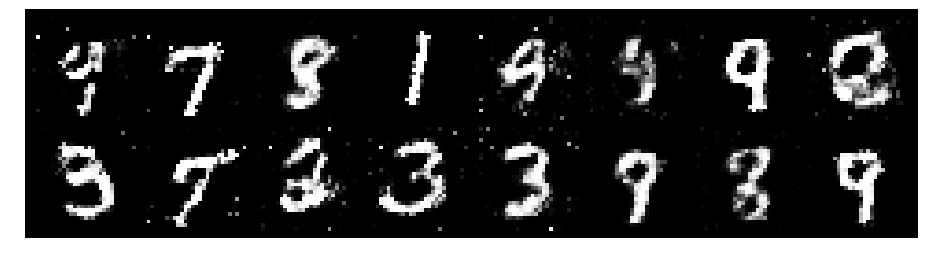

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 1.0554, Generator Loss: 1.5193
D(x): 0.6168, D(G(z)): 0.3178


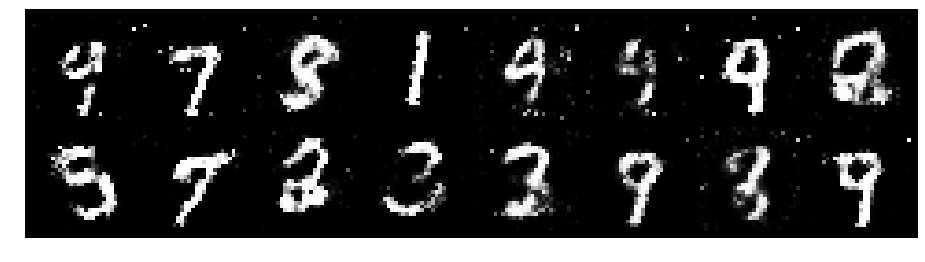

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 1.0991, Generator Loss: 1.3191
D(x): 0.5948, D(G(z)): 0.3226


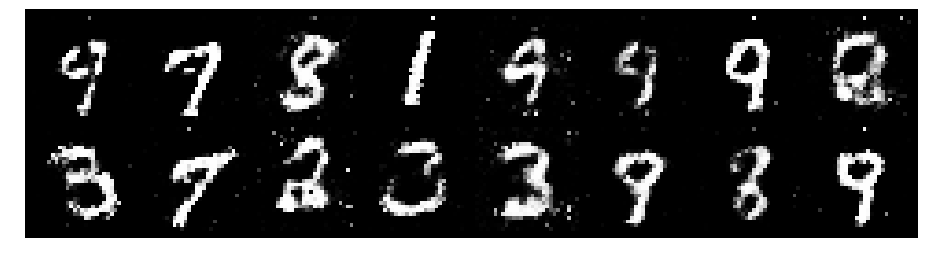

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 0.9912, Generator Loss: 1.2476
D(x): 0.6409, D(G(z)): 0.3510


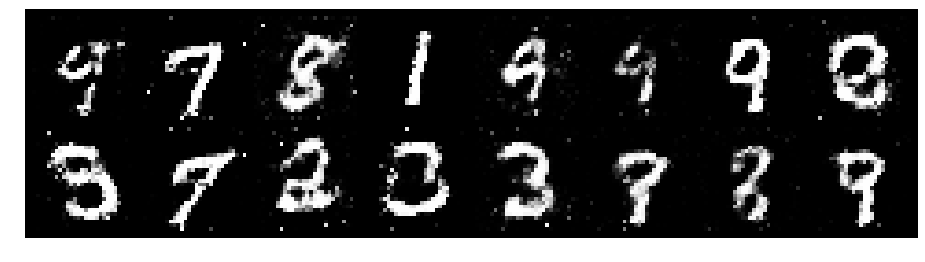

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.1040, Generator Loss: 1.0836
D(x): 0.5991, D(G(z)): 0.3741


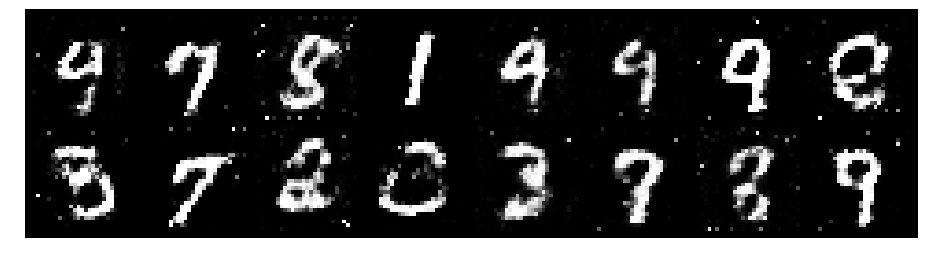

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.1555, Generator Loss: 1.0262
D(x): 0.6732, D(G(z)): 0.4052


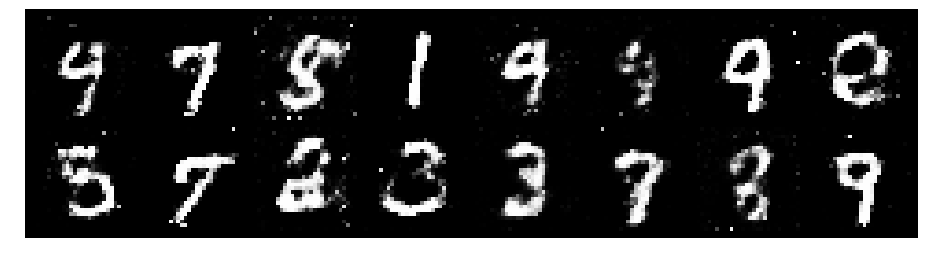

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.0827, Generator Loss: 1.0510
D(x): 0.6888, D(G(z)): 0.3780


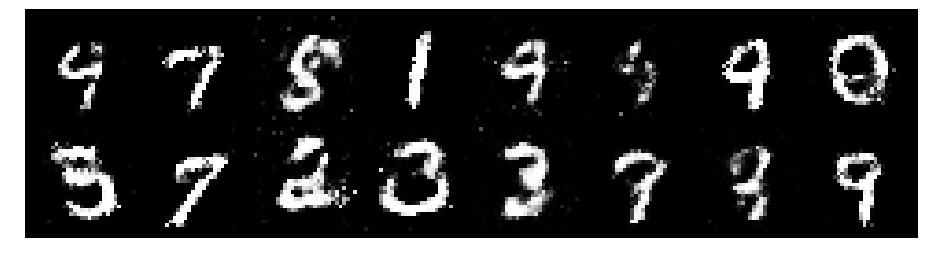

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 1.0856, Generator Loss: 1.0237
D(x): 0.6401, D(G(z)): 0.3847


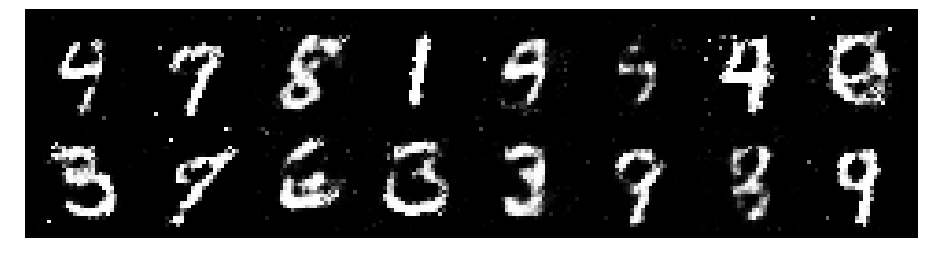

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 1.1924, Generator Loss: 0.9200
D(x): 0.5726, D(G(z)): 0.4104


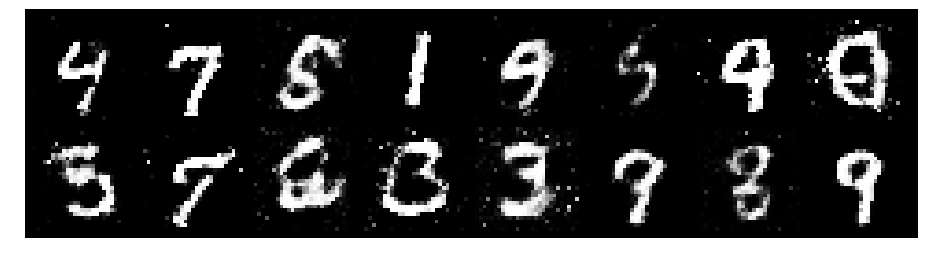

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 1.1553, Generator Loss: 1.1015
D(x): 0.6164, D(G(z)): 0.4030


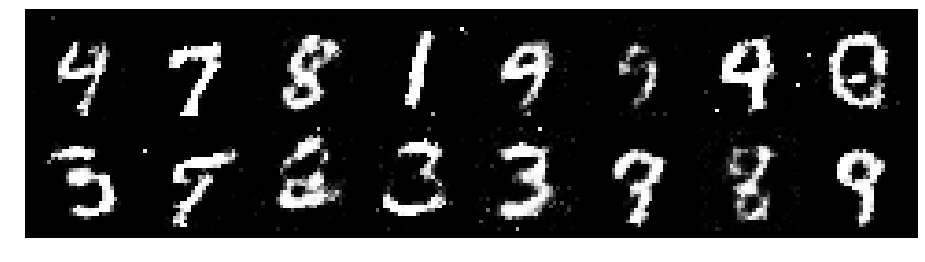

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.2579, Generator Loss: 1.1254
D(x): 0.6128, D(G(z)): 0.4170


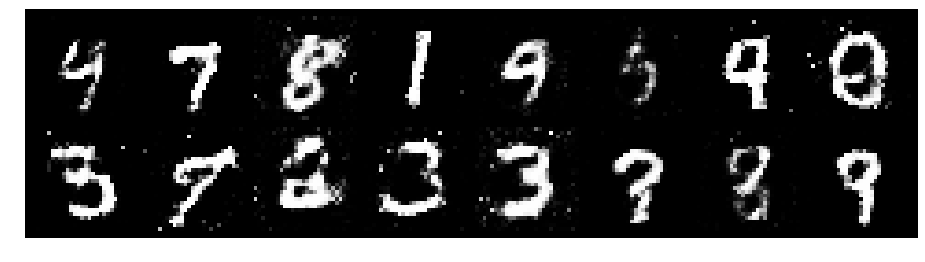

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 1.2864, Generator Loss: 1.1186
D(x): 0.5967, D(G(z)): 0.4089


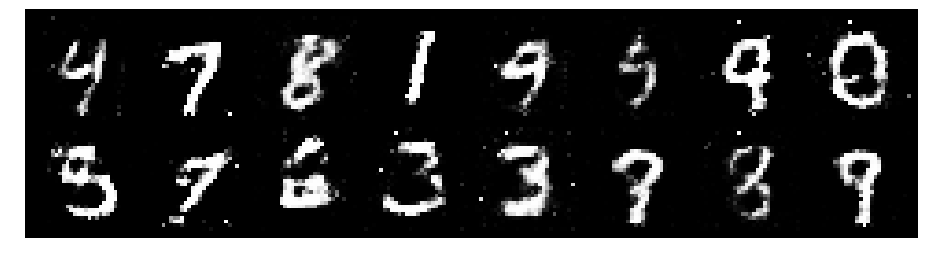

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 1.2106, Generator Loss: 1.3254
D(x): 0.6620, D(G(z)): 0.3978


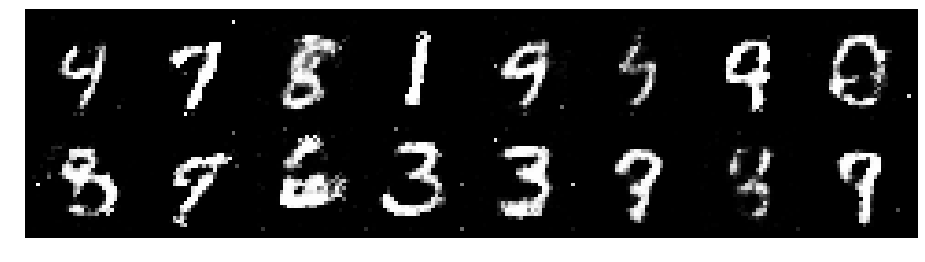

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 1.1146, Generator Loss: 1.1086
D(x): 0.6631, D(G(z)): 0.3980


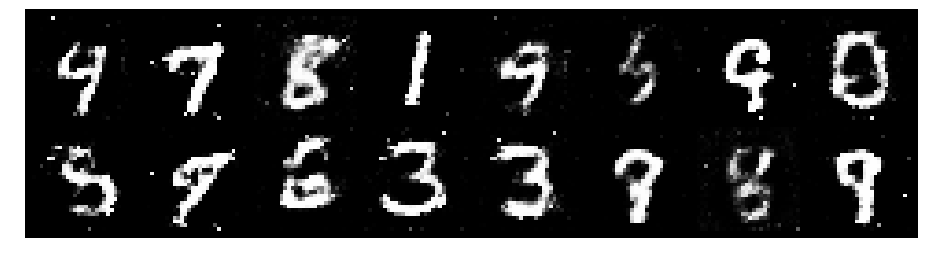

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 0.9055, Generator Loss: 1.3177
D(x): 0.7424, D(G(z)): 0.3859


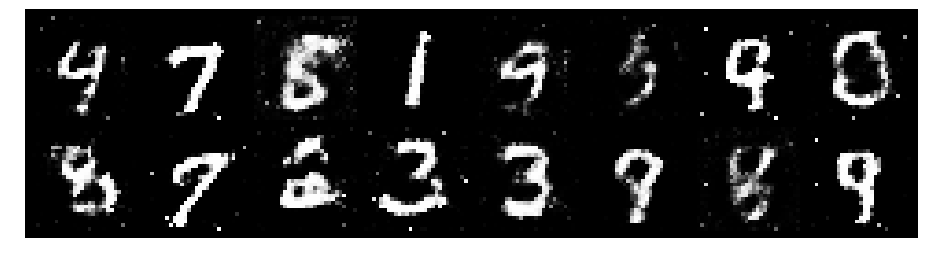

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 1.1211, Generator Loss: 1.4106
D(x): 0.5924, D(G(z)): 0.3309


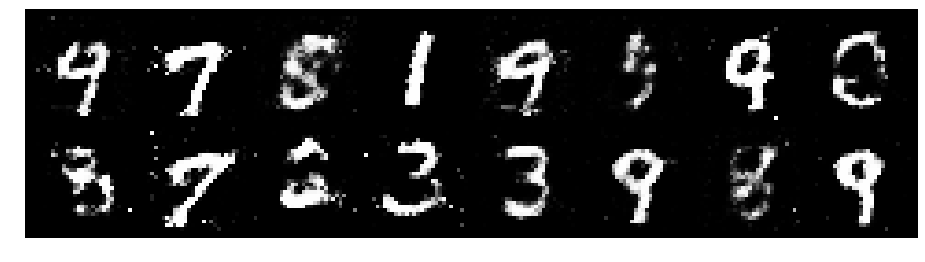

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 0.9346, Generator Loss: 1.0350
D(x): 0.7006, D(G(z)): 0.3880


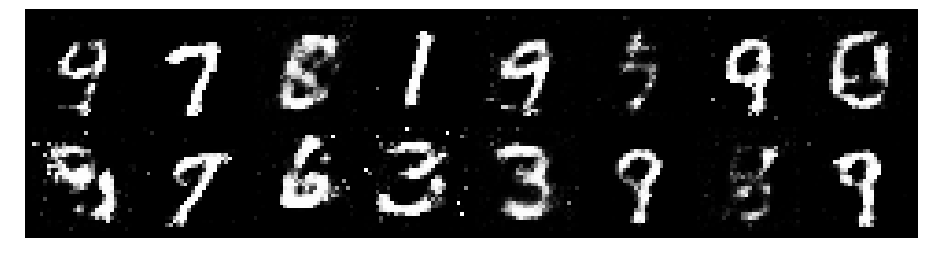

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.1288, Generator Loss: 0.9865
D(x): 0.6266, D(G(z)): 0.3890


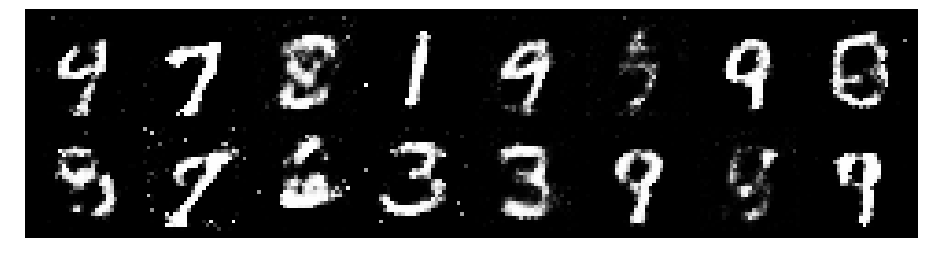

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 1.1689, Generator Loss: 1.2171
D(x): 0.5827, D(G(z)): 0.3629


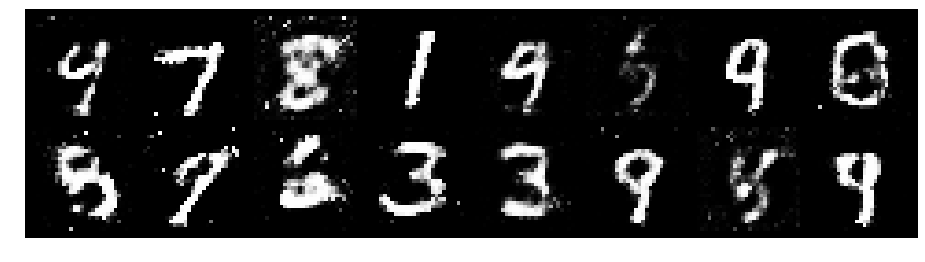

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.1418, Generator Loss: 1.0776
D(x): 0.5893, D(G(z)): 0.3647


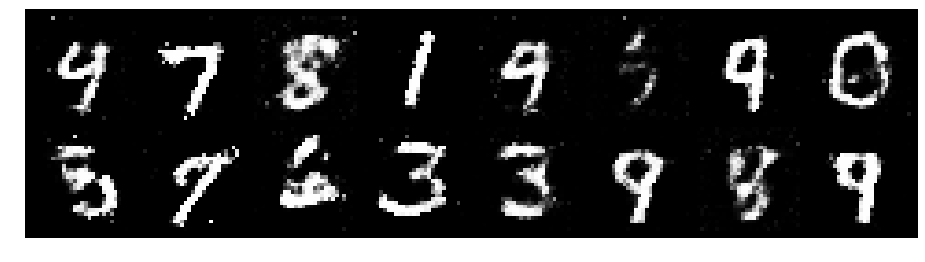

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.0539, Generator Loss: 1.0947
D(x): 0.6946, D(G(z)): 0.4217


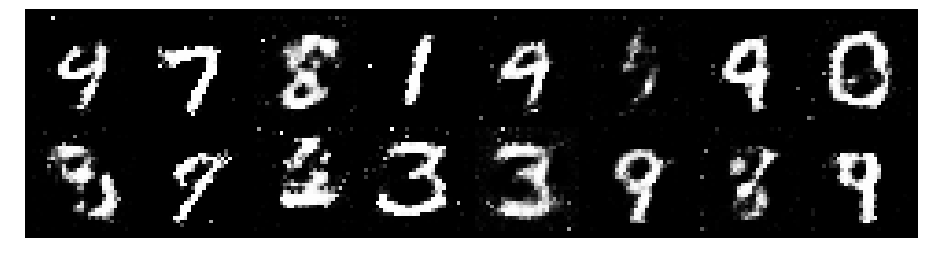

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.0502, Generator Loss: 1.3356
D(x): 0.6406, D(G(z)): 0.3547


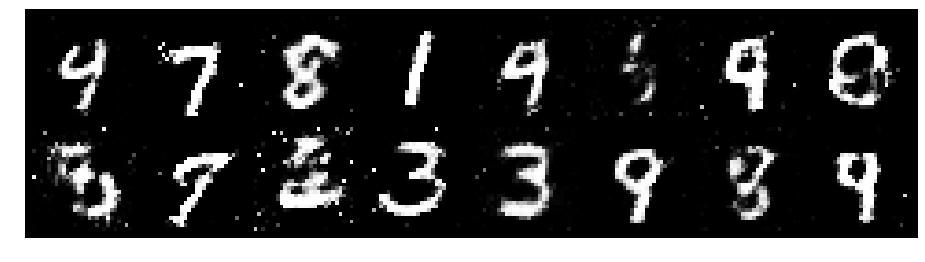

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.0925, Generator Loss: 1.3074
D(x): 0.5610, D(G(z)): 0.3027


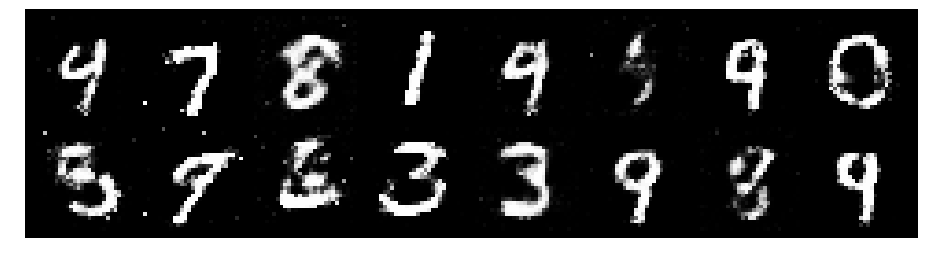

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.0679, Generator Loss: 1.3402
D(x): 0.6095, D(G(z)): 0.3437


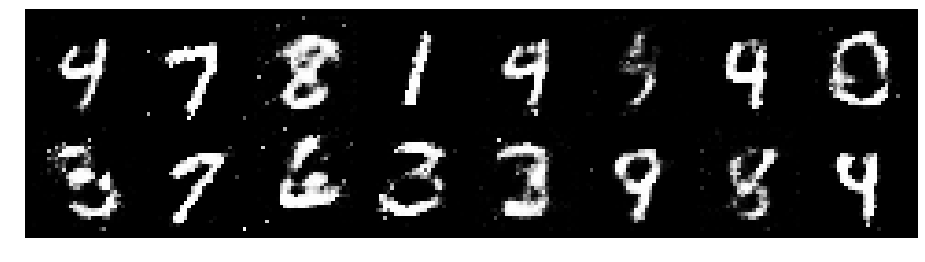

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 1.0336, Generator Loss: 1.2942
D(x): 0.6081, D(G(z)): 0.3298


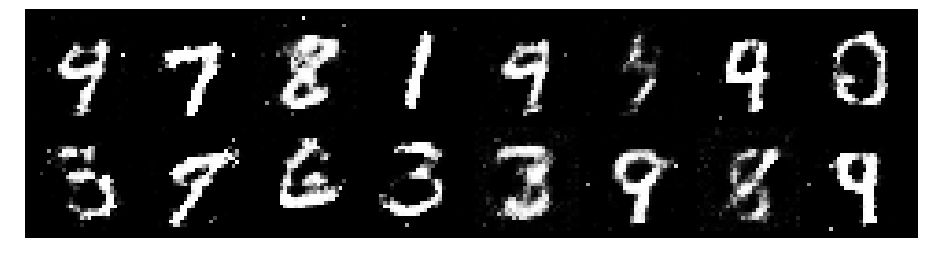

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.1296, Generator Loss: 1.2737
D(x): 0.5880, D(G(z)): 0.3379


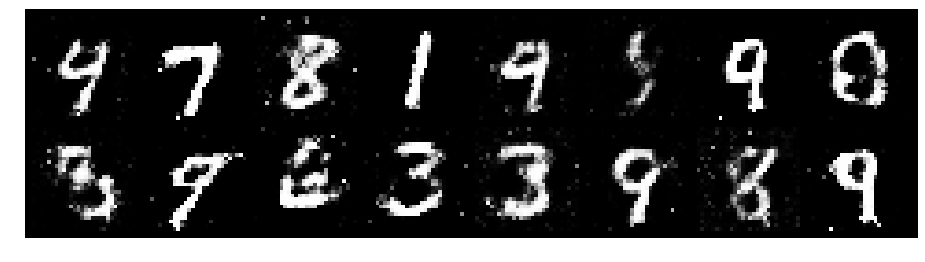

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.1385, Generator Loss: 1.2619
D(x): 0.6647, D(G(z)): 0.4337


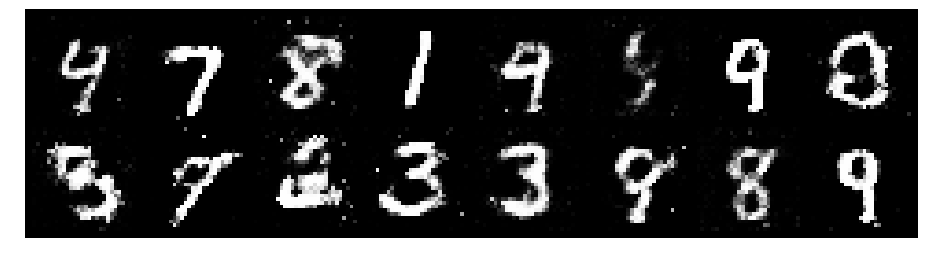

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.1889, Generator Loss: 1.0051
D(x): 0.6127, D(G(z)): 0.4214


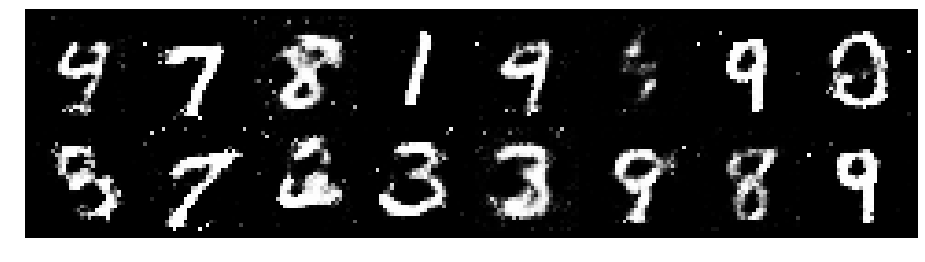

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.2370, Generator Loss: 1.2016
D(x): 0.6756, D(G(z)): 0.4591


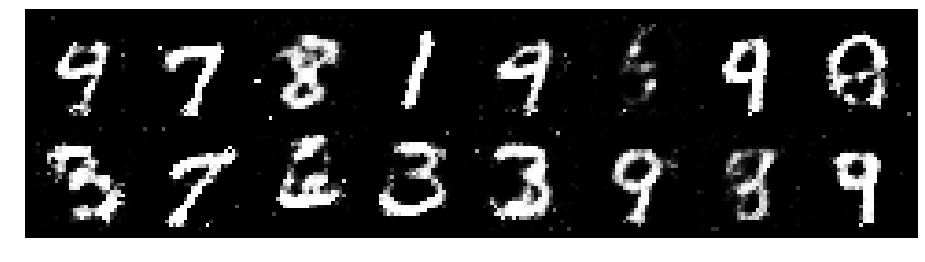

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.1321, Generator Loss: 0.9872
D(x): 0.5914, D(G(z)): 0.3601


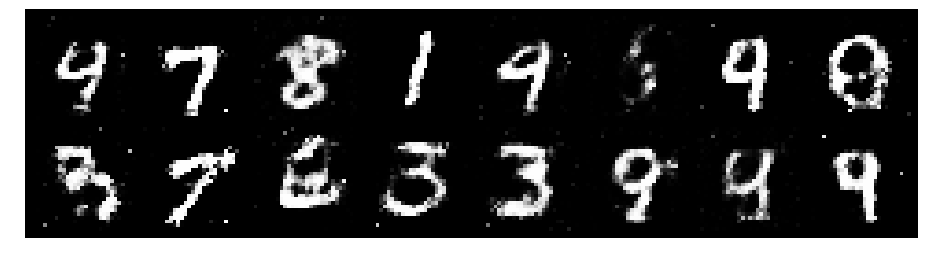

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.1296, Generator Loss: 1.2961
D(x): 0.6428, D(G(z)): 0.3888


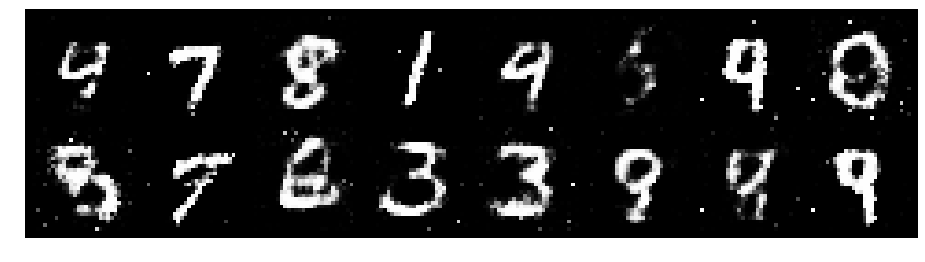

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.1882, Generator Loss: 1.2194
D(x): 0.5846, D(G(z)): 0.3789


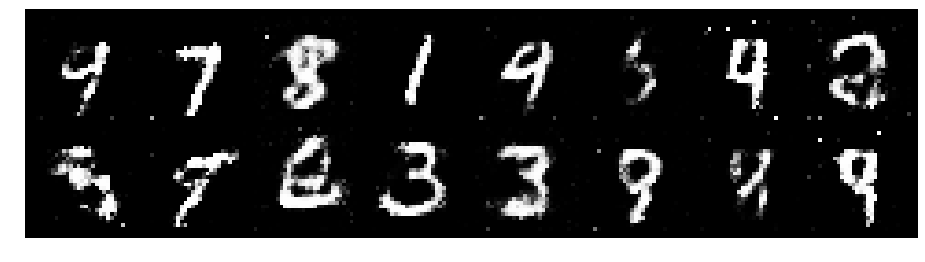

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.0220, Generator Loss: 1.0999
D(x): 0.6956, D(G(z)): 0.4162


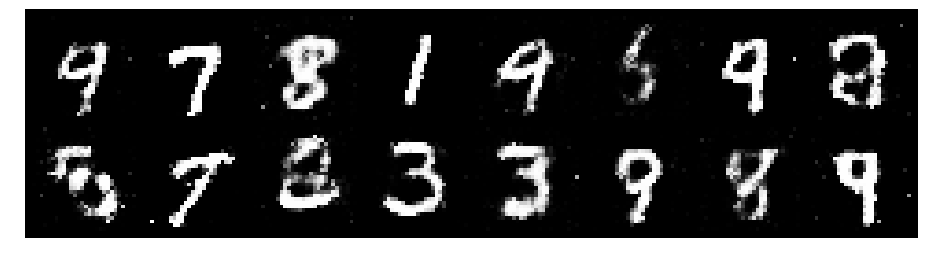

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.1413, Generator Loss: 1.2461
D(x): 0.6121, D(G(z)): 0.3646


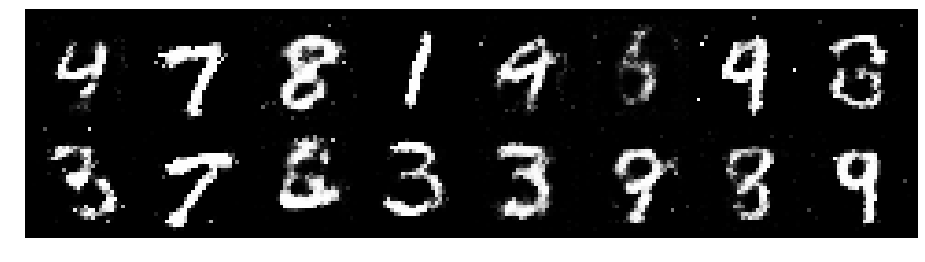

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 1.1000, Generator Loss: 1.3910
D(x): 0.6449, D(G(z)): 0.3602


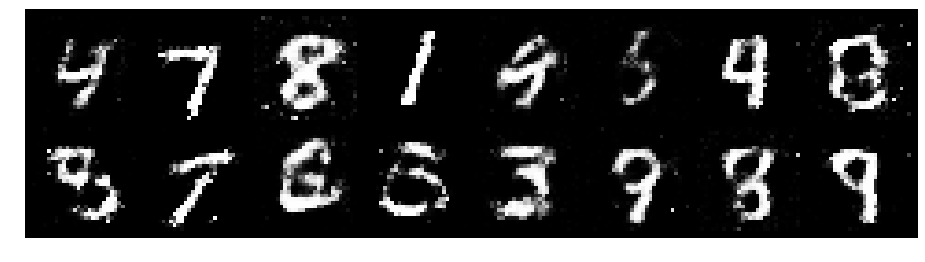

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.0728, Generator Loss: 1.2129
D(x): 0.6007, D(G(z)): 0.3489


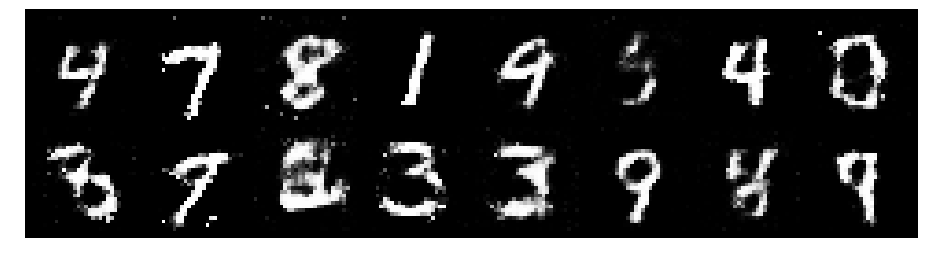

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 1.3903, Generator Loss: 1.0406
D(x): 0.5633, D(G(z)): 0.4610


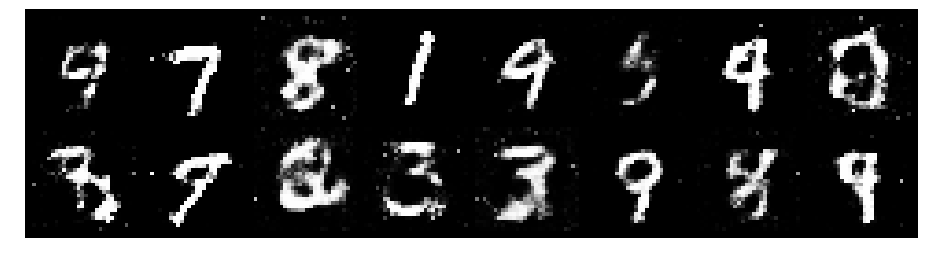

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.2865, Generator Loss: 1.0064
D(x): 0.6052, D(G(z)): 0.4544


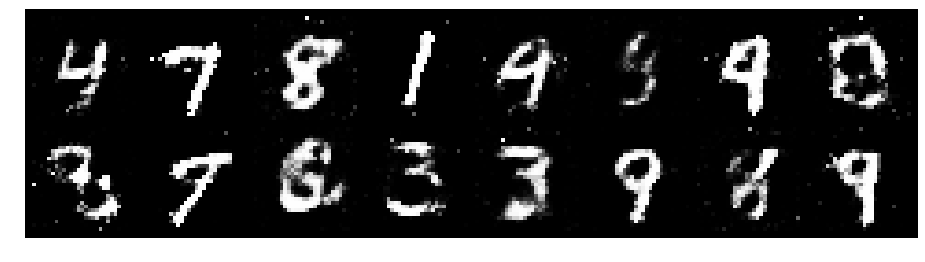

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 1.1375, Generator Loss: 1.3213
D(x): 0.6045, D(G(z)): 0.3361


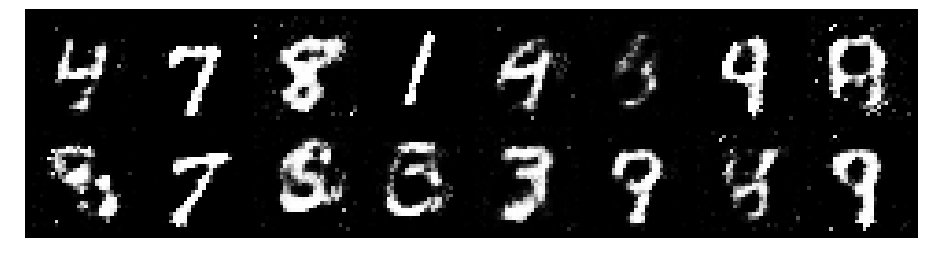

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 0.9892, Generator Loss: 1.3287
D(x): 0.6104, D(G(z)): 0.2934


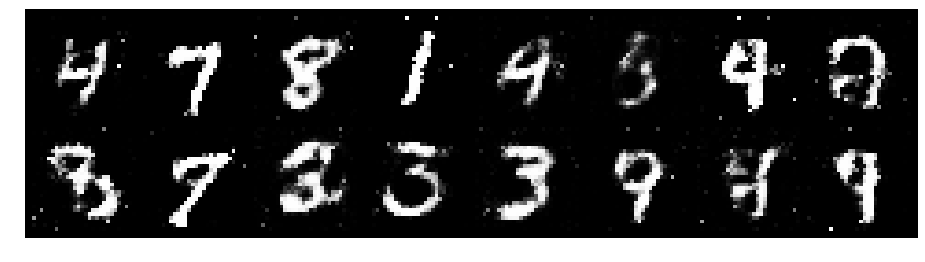

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.0056, Generator Loss: 1.0699
D(x): 0.6713, D(G(z)): 0.3801


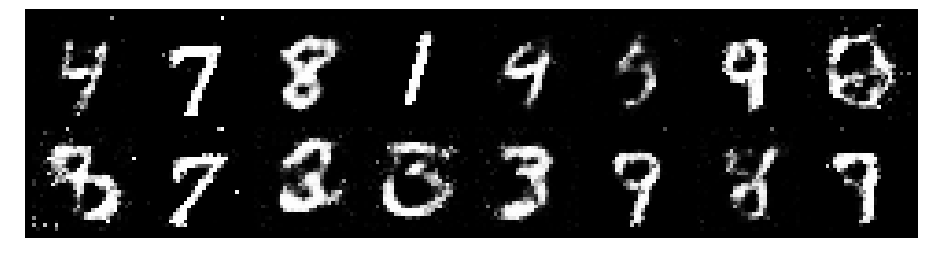

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.0224, Generator Loss: 1.0983
D(x): 0.6365, D(G(z)): 0.3488


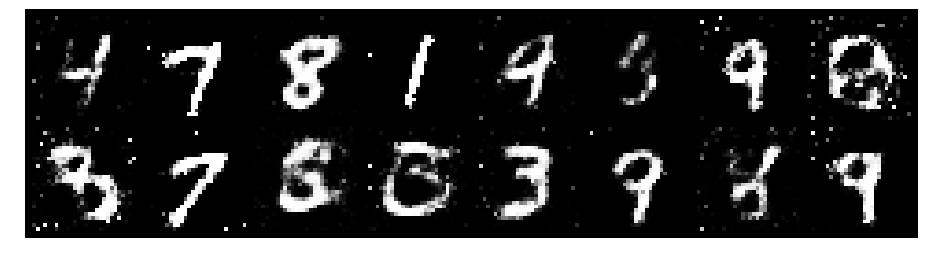

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.0719, Generator Loss: 1.2575
D(x): 0.5913, D(G(z)): 0.3260


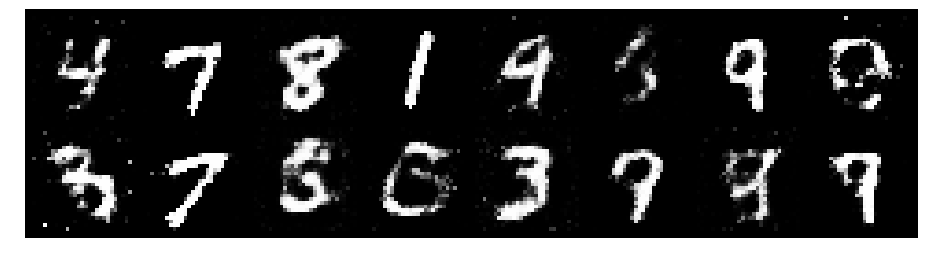

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.1403, Generator Loss: 1.1223
D(x): 0.6801, D(G(z)): 0.4385


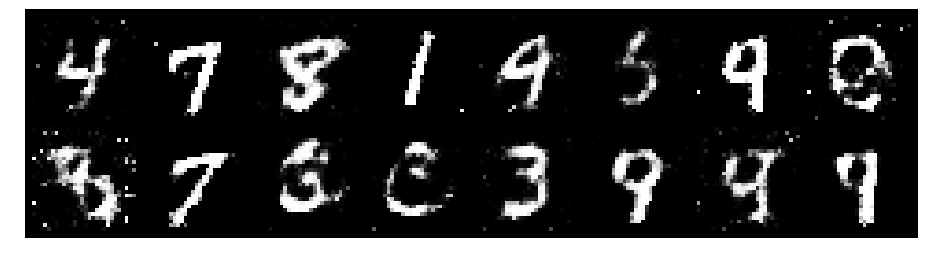

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.2303, Generator Loss: 1.2480
D(x): 0.6381, D(G(z)): 0.4236


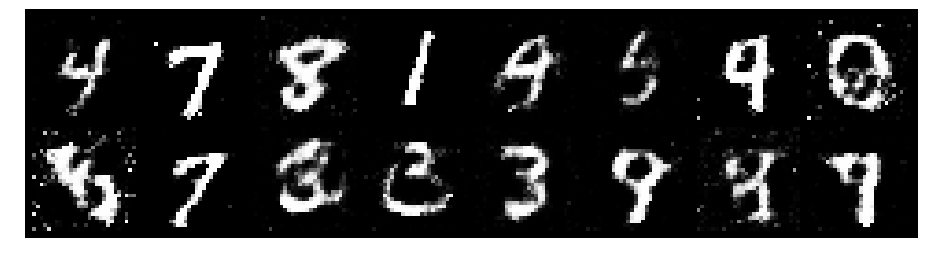

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.2640, Generator Loss: 1.2267
D(x): 0.5989, D(G(z)): 0.4212


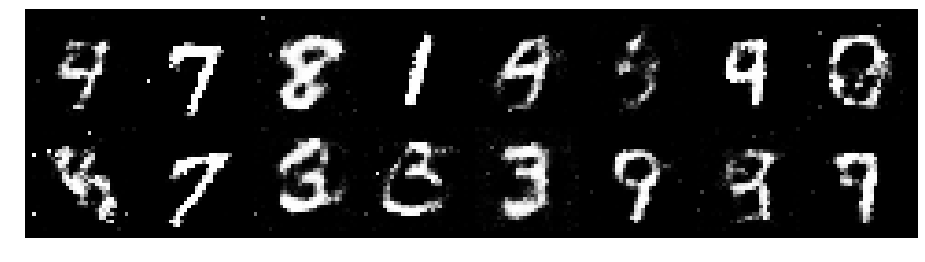

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.2155, Generator Loss: 1.1168
D(x): 0.5953, D(G(z)): 0.4096


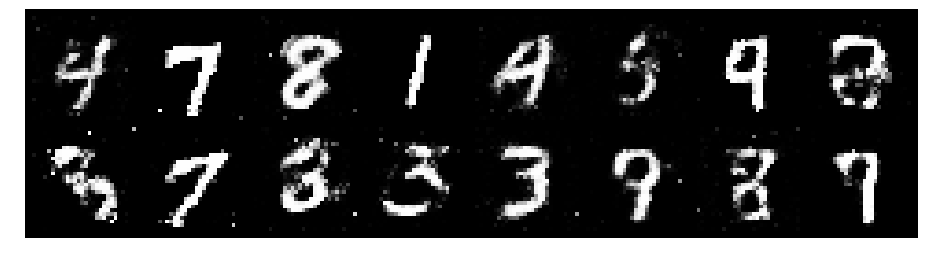

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.1628, Generator Loss: 1.1962
D(x): 0.5734, D(G(z)): 0.3763


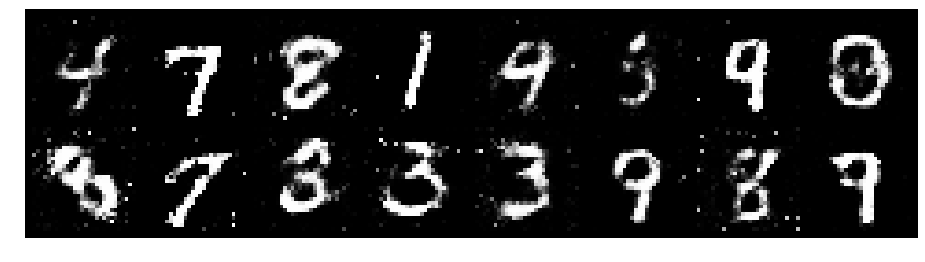

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.1795, Generator Loss: 1.1278
D(x): 0.5826, D(G(z)): 0.3925


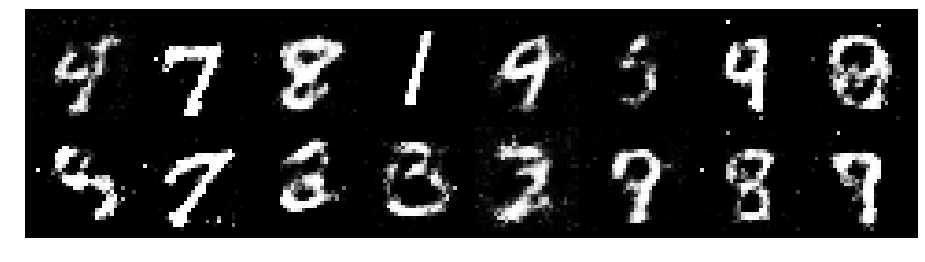

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.2516, Generator Loss: 1.1606
D(x): 0.5590, D(G(z)): 0.3665


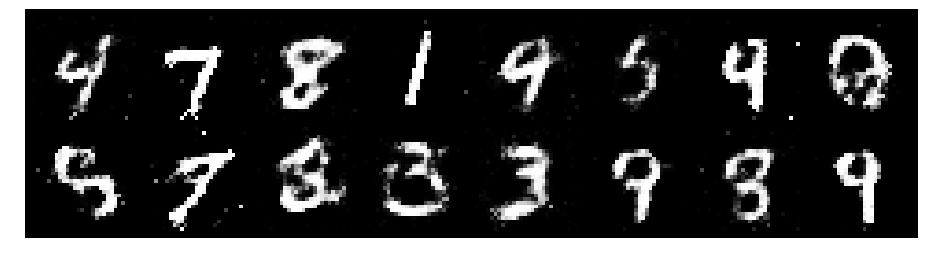

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.0789, Generator Loss: 1.1892
D(x): 0.6585, D(G(z)): 0.3816


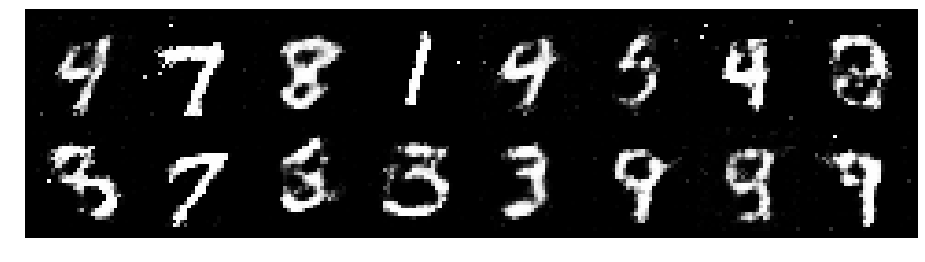

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.0469, Generator Loss: 1.2440
D(x): 0.6285, D(G(z)): 0.3397


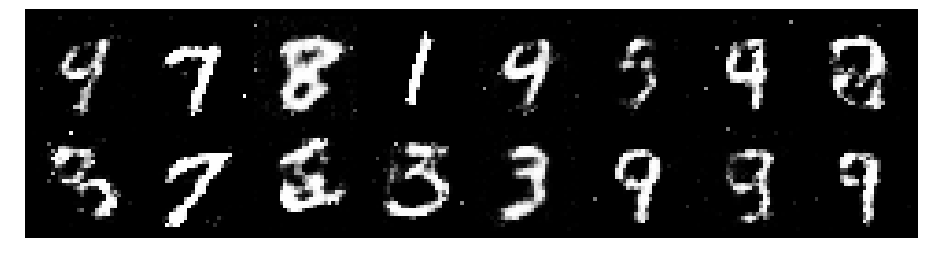

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.0118, Generator Loss: 1.1787
D(x): 0.7018, D(G(z)): 0.3793


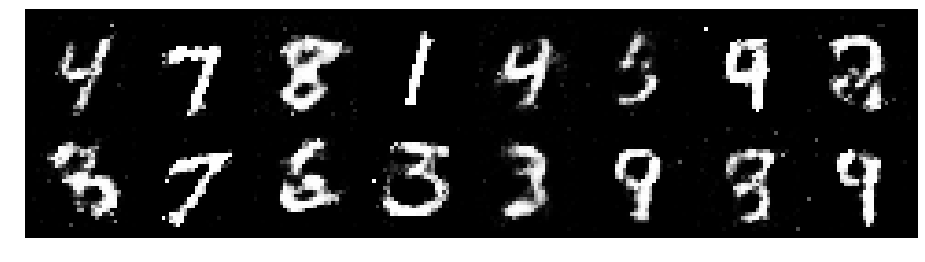

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.1583, Generator Loss: 1.3547
D(x): 0.5898, D(G(z)): 0.3573


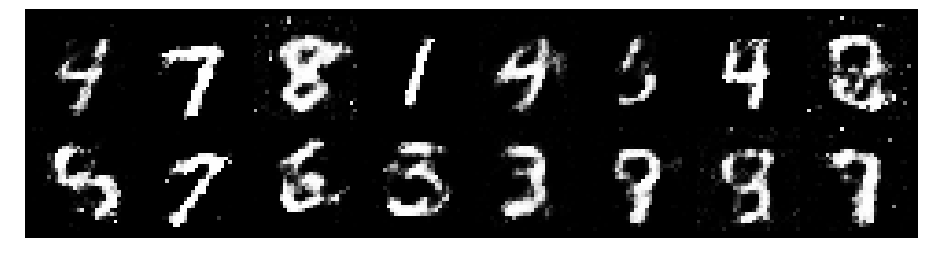

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.0578, Generator Loss: 1.4324
D(x): 0.6816, D(G(z)): 0.3865


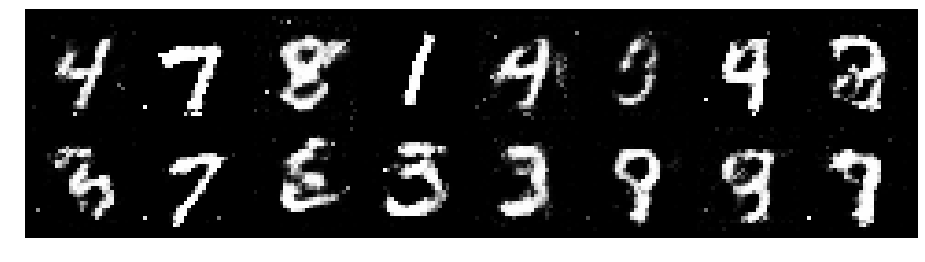

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.0903, Generator Loss: 0.9694
D(x): 0.6561, D(G(z)): 0.4198


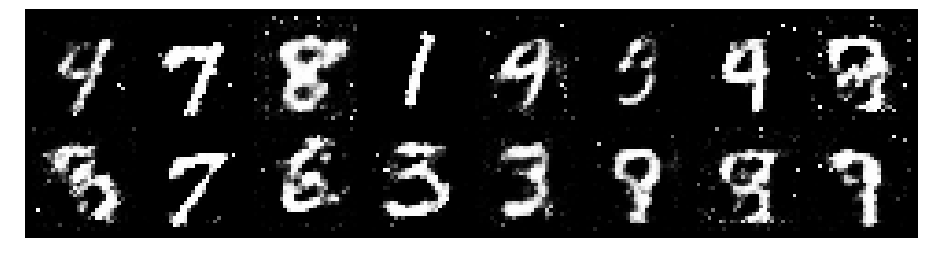

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.2541, Generator Loss: 1.0746
D(x): 0.6428, D(G(z)): 0.4459


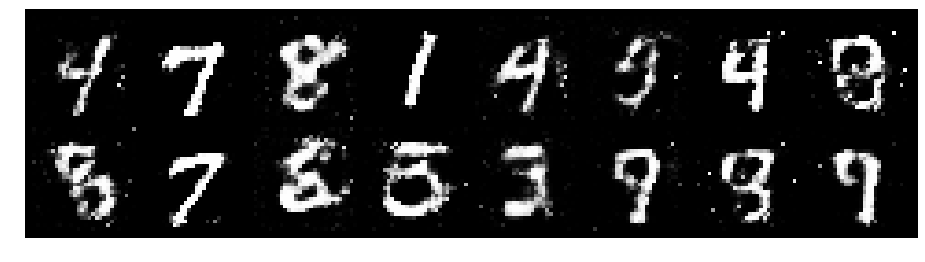

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.2529, Generator Loss: 0.8669
D(x): 0.6259, D(G(z)): 0.4523


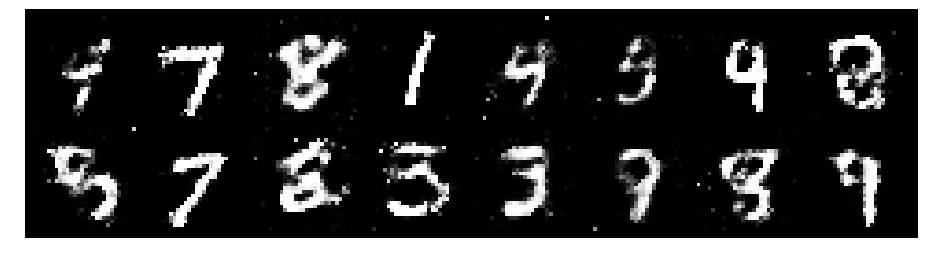

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.0194, Generator Loss: 1.2126
D(x): 0.6680, D(G(z)): 0.3658


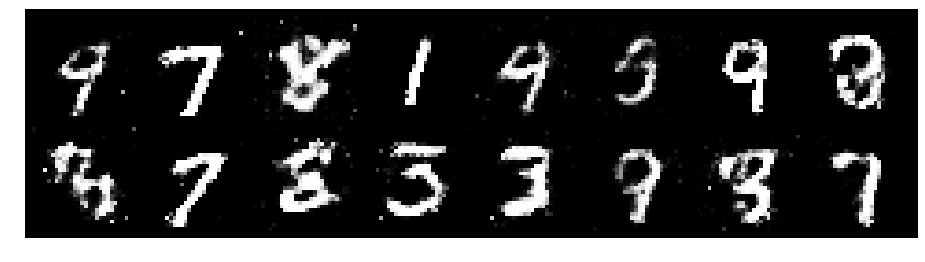

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.2153, Generator Loss: 1.2095
D(x): 0.6121, D(G(z)): 0.4042


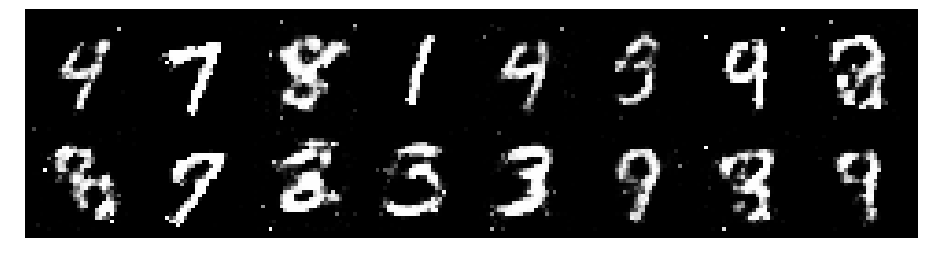

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.2490, Generator Loss: 1.1219
D(x): 0.5981, D(G(z)): 0.4256


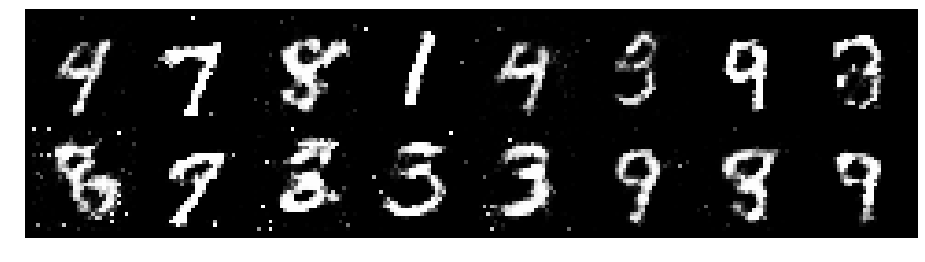

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.2149, Generator Loss: 1.0319
D(x): 0.5931, D(G(z)): 0.4025


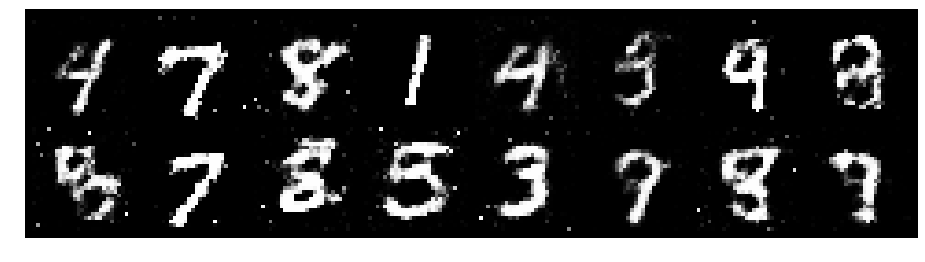

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.2533, Generator Loss: 1.1994
D(x): 0.5314, D(G(z)): 0.3607


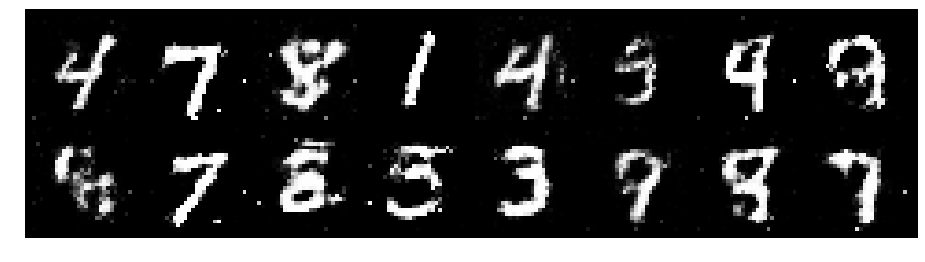

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.3035, Generator Loss: 1.2751
D(x): 0.5989, D(G(z)): 0.4278


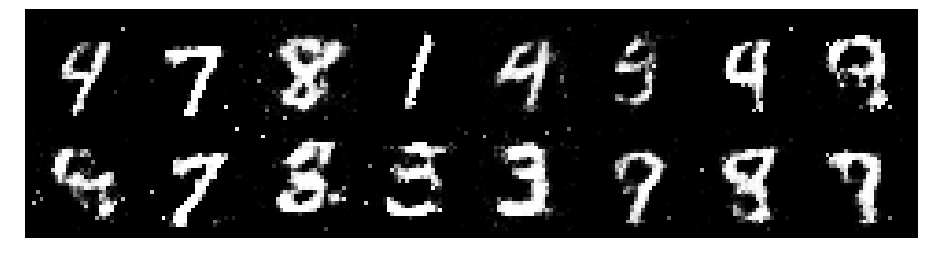

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.1186, Generator Loss: 1.2565
D(x): 0.5677, D(G(z)): 0.3421


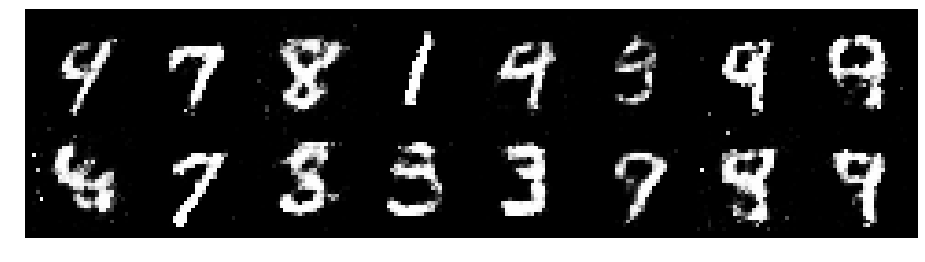

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.0670, Generator Loss: 1.2828
D(x): 0.6266, D(G(z)): 0.3706


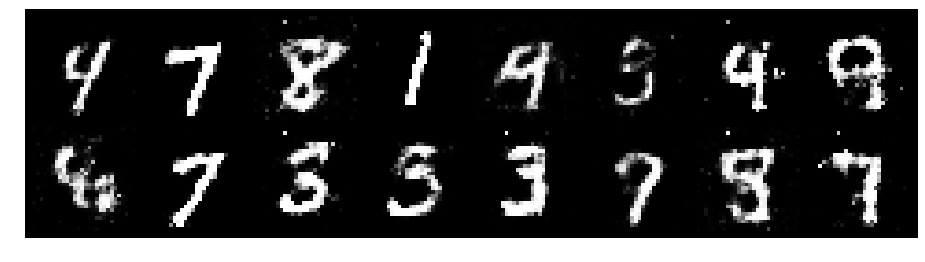

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.1794, Generator Loss: 1.2800
D(x): 0.6098, D(G(z)): 0.3899


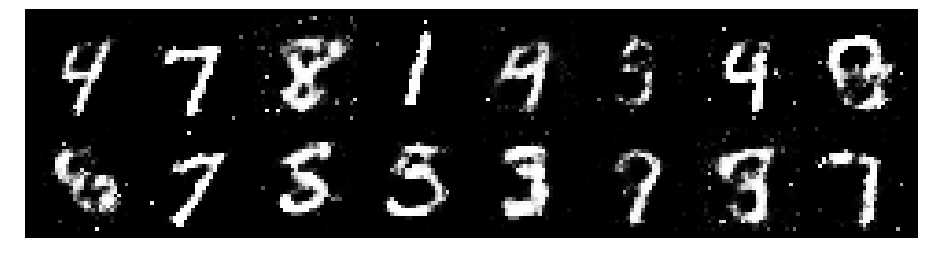

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.0945, Generator Loss: 1.2084
D(x): 0.6049, D(G(z)): 0.3496


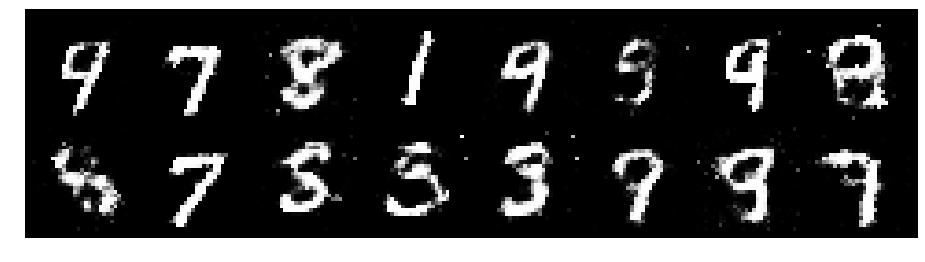

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.0505, Generator Loss: 1.3205
D(x): 0.6176, D(G(z)): 0.3470


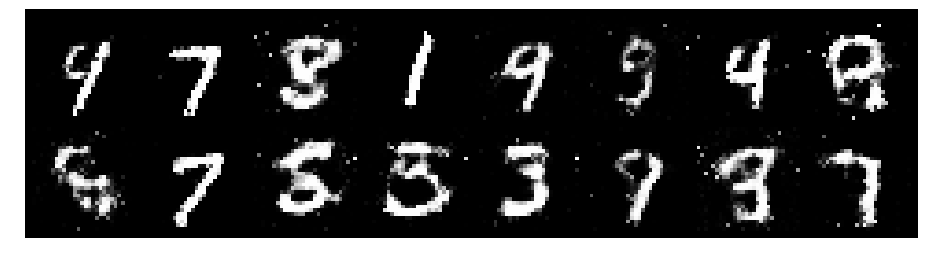

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.0455, Generator Loss: 1.4790
D(x): 0.6306, D(G(z)): 0.3520


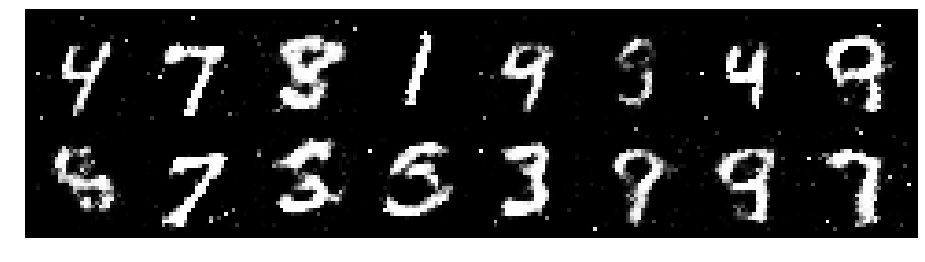

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.1429, Generator Loss: 1.2408
D(x): 0.6437, D(G(z)): 0.3679


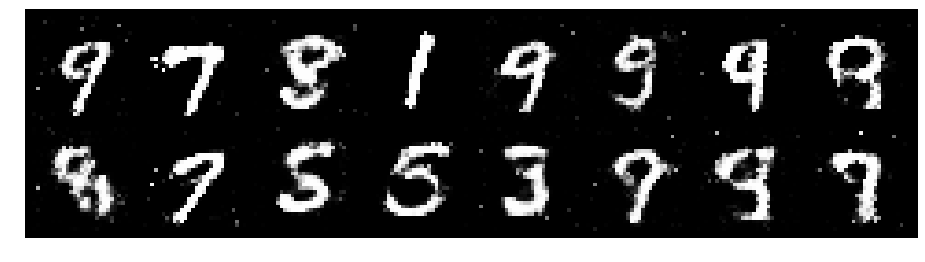

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.1522, Generator Loss: 0.9790
D(x): 0.5972, D(G(z)): 0.3649


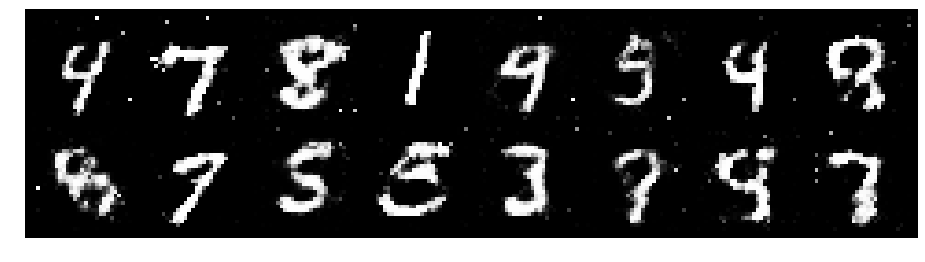

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.1538, Generator Loss: 1.1808
D(x): 0.6288, D(G(z)): 0.3942


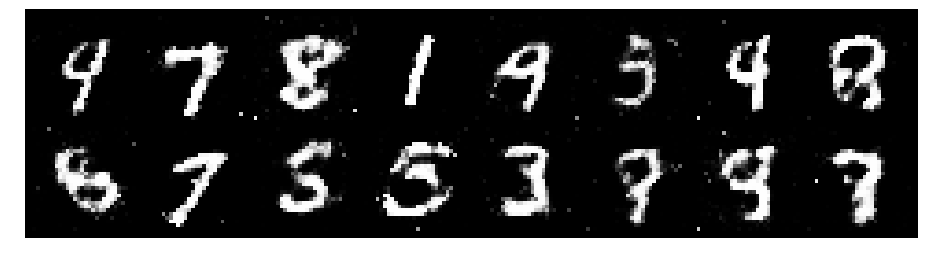

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.0564, Generator Loss: 1.3612
D(x): 0.6579, D(G(z)): 0.3663


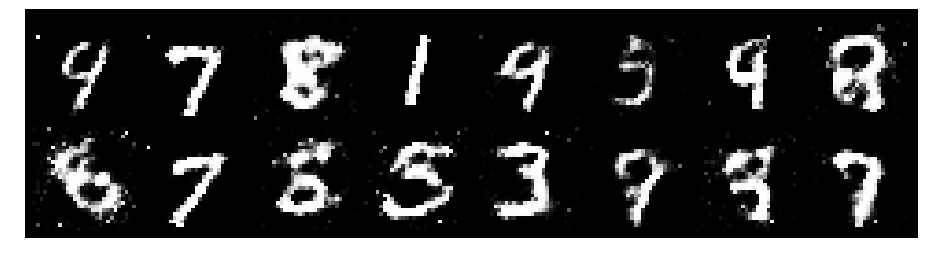

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.2040, Generator Loss: 0.8766
D(x): 0.6113, D(G(z)): 0.4461


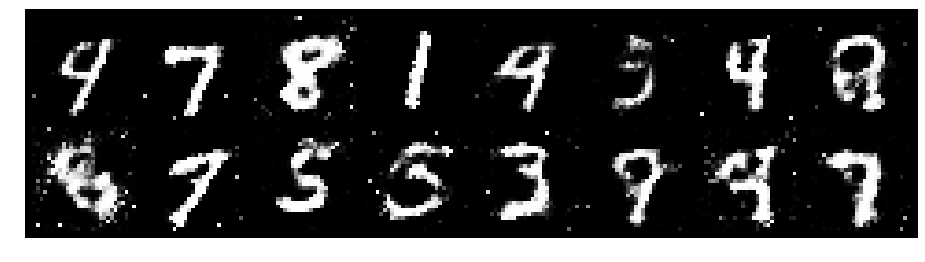

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.2820, Generator Loss: 1.0911
D(x): 0.5872, D(G(z)): 0.4355


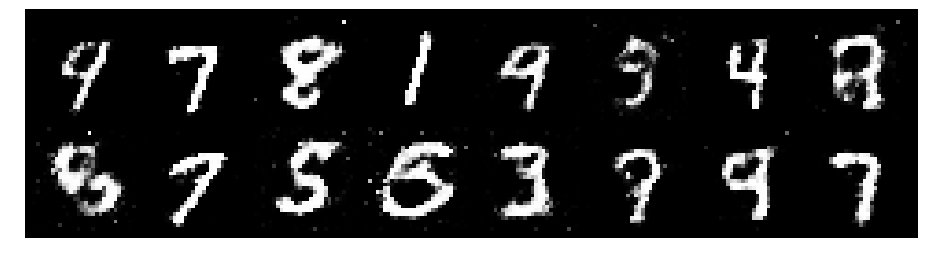

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.2045, Generator Loss: 1.0011
D(x): 0.6008, D(G(z)): 0.4309


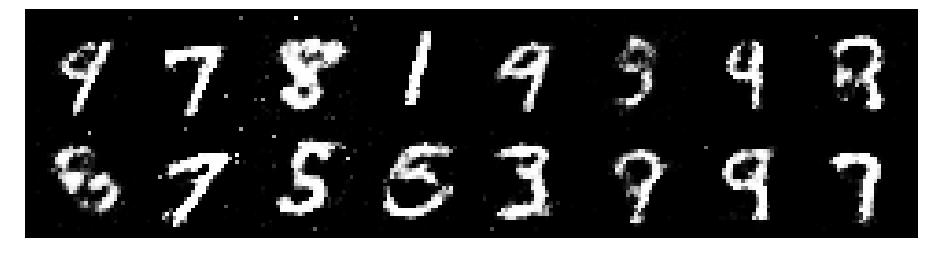

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.1932, Generator Loss: 0.9265
D(x): 0.6050, D(G(z)): 0.4210


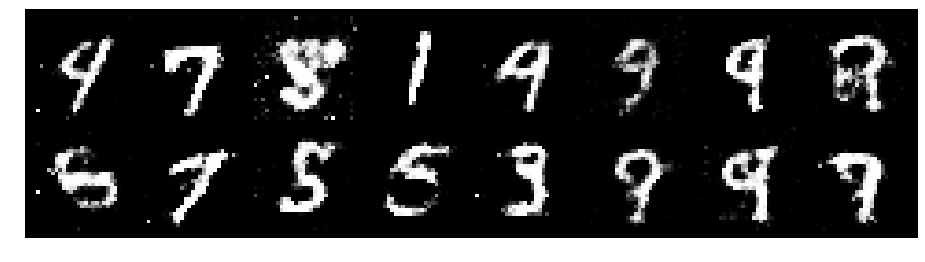

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.2006, Generator Loss: 0.9554
D(x): 0.5856, D(G(z)): 0.4251


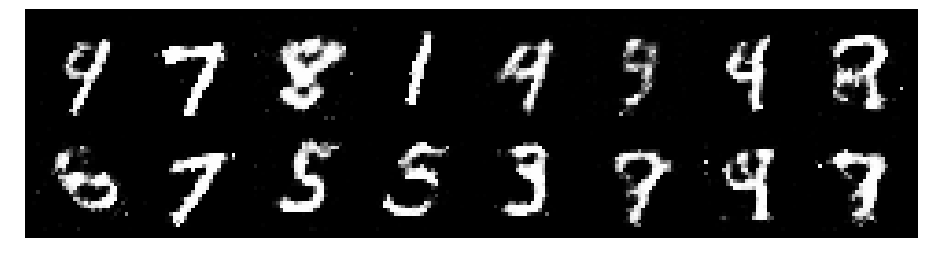

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.2658, Generator Loss: 1.0090
D(x): 0.6074, D(G(z)): 0.4689


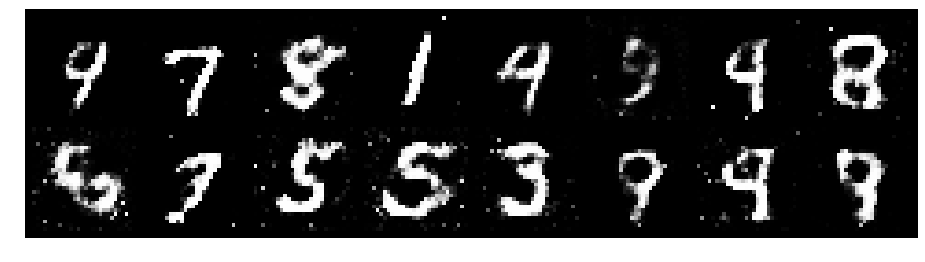

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.1387, Generator Loss: 1.0417
D(x): 0.6007, D(G(z)): 0.4147


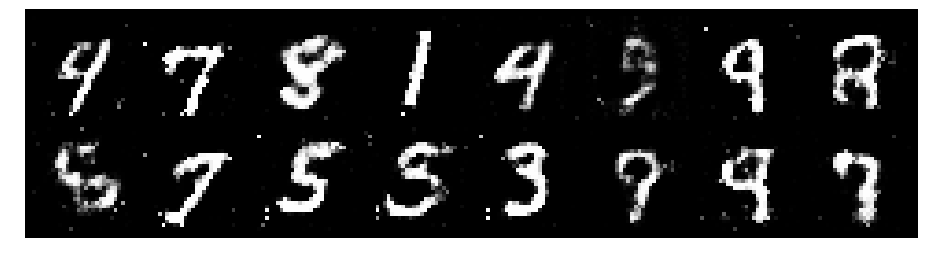

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.2293, Generator Loss: 1.0200
D(x): 0.5503, D(G(z)): 0.4121


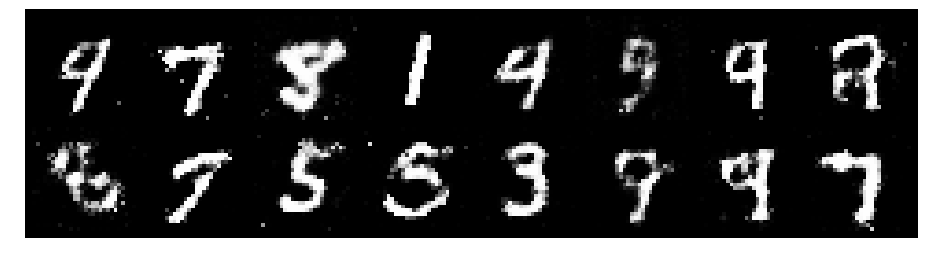

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.2189, Generator Loss: 0.9212
D(x): 0.6379, D(G(z)): 0.4707


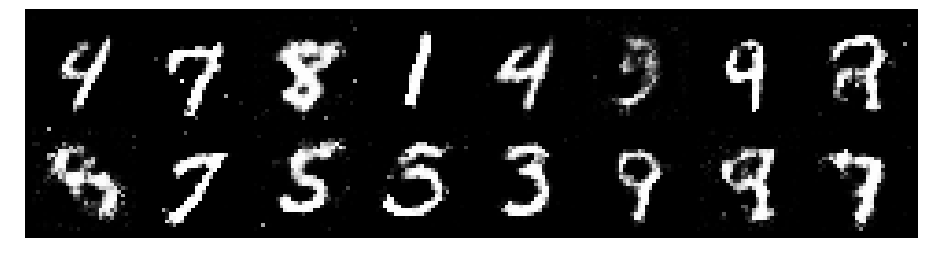

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.2291, Generator Loss: 0.9743
D(x): 0.5866, D(G(z)): 0.4190


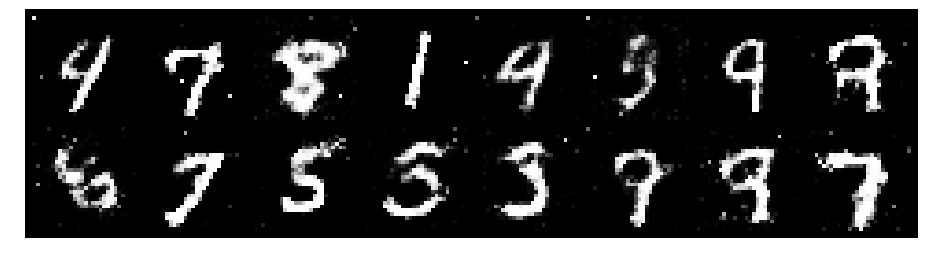

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.2315, Generator Loss: 0.8617
D(x): 0.5786, D(G(z)): 0.4251


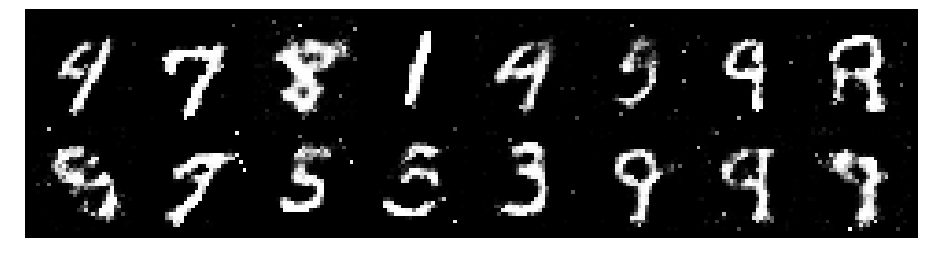

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.1277, Generator Loss: 1.2784
D(x): 0.5820, D(G(z)): 0.3671


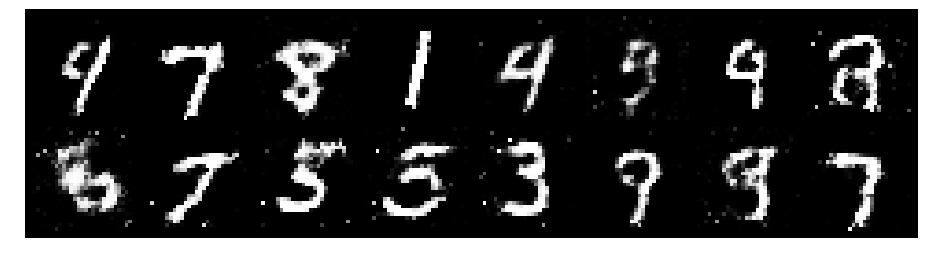

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.1314, Generator Loss: 1.0513
D(x): 0.6142, D(G(z)): 0.3969


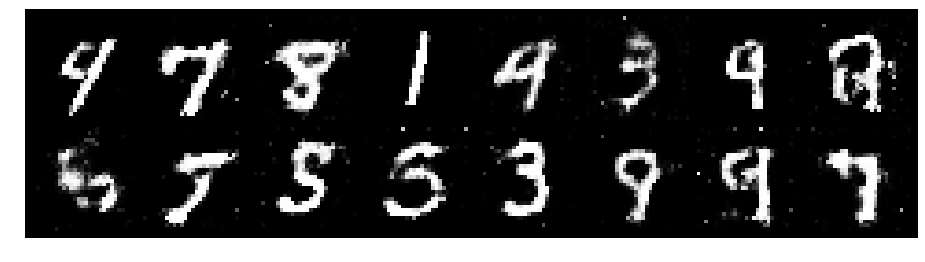

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.2033, Generator Loss: 0.9630
D(x): 0.6065, D(G(z)): 0.4363


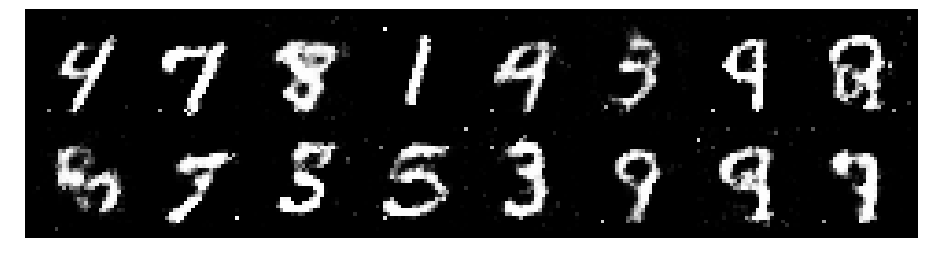

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.2062, Generator Loss: 0.9580
D(x): 0.5982, D(G(z)): 0.4182


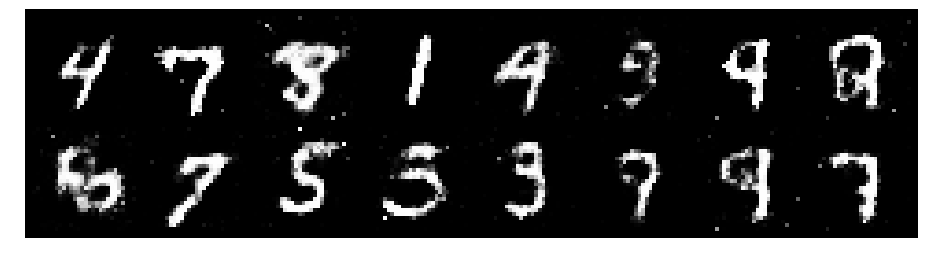

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.2599, Generator Loss: 0.7689
D(x): 0.6255, D(G(z)): 0.4764


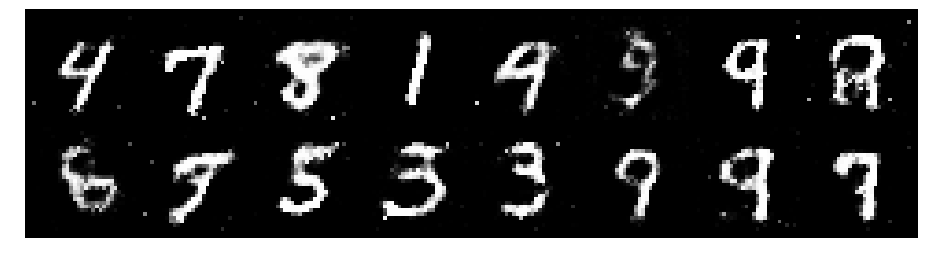

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.3219, Generator Loss: 1.0521
D(x): 0.5520, D(G(z)): 0.4175


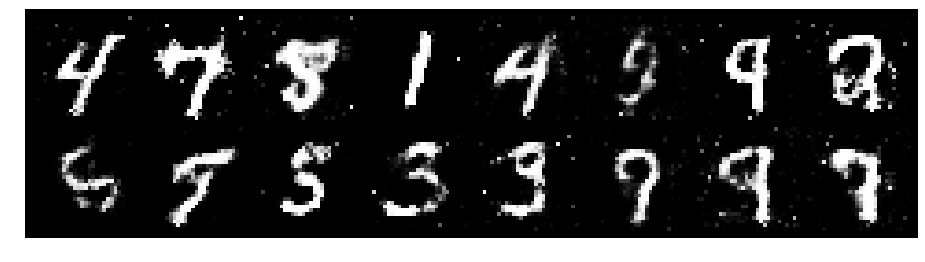

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.2725, Generator Loss: 0.9988
D(x): 0.5376, D(G(z)): 0.3917


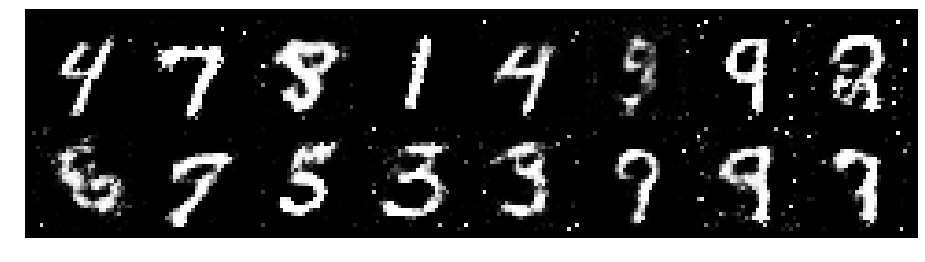

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.3212, Generator Loss: 1.0470
D(x): 0.5606, D(G(z)): 0.4227


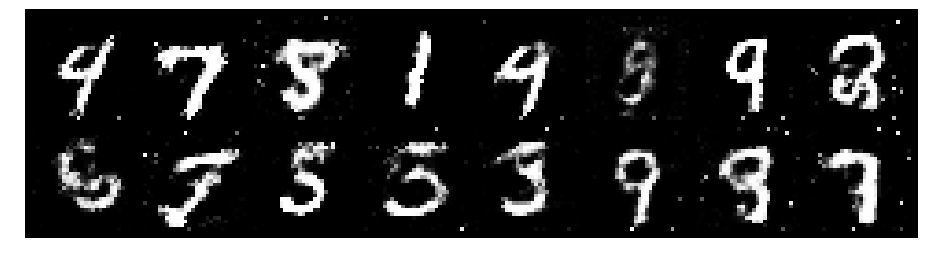

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.3373, Generator Loss: 1.0596
D(x): 0.5783, D(G(z)): 0.4447


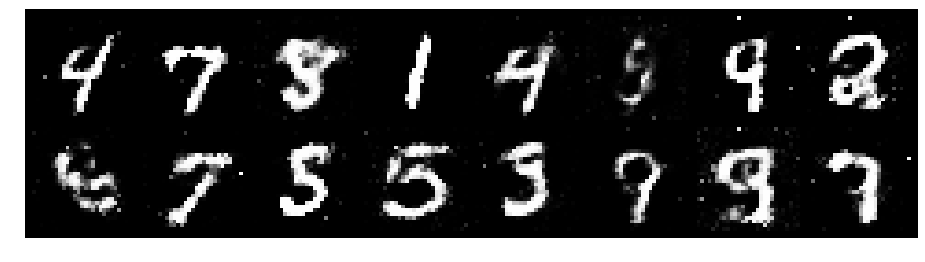

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.2609, Generator Loss: 0.9866
D(x): 0.5937, D(G(z)): 0.4479


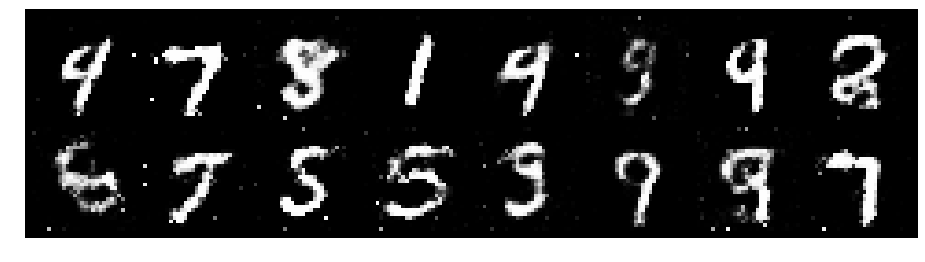

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.0775, Generator Loss: 1.2975
D(x): 0.6393, D(G(z)): 0.3899


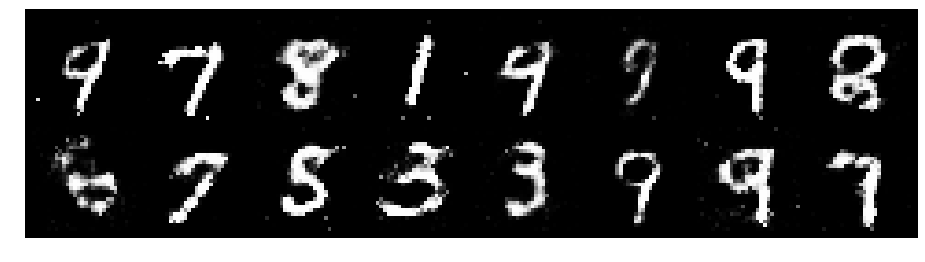

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.1571, Generator Loss: 1.1352
D(x): 0.6301, D(G(z)): 0.4142


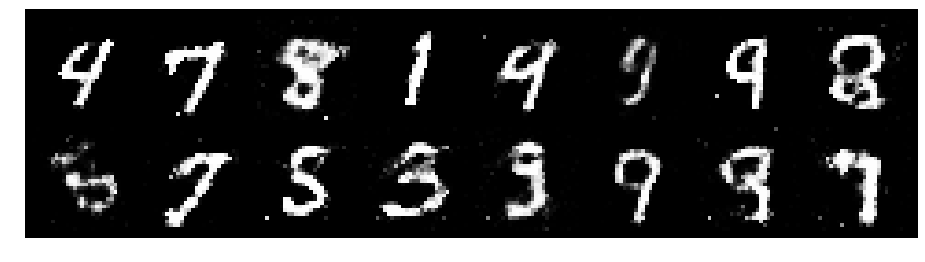

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.1725, Generator Loss: 1.0991
D(x): 0.5740, D(G(z)): 0.3964


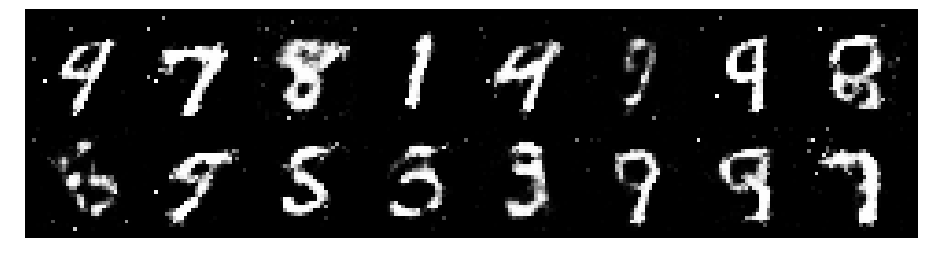

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.2102, Generator Loss: 1.1897
D(x): 0.6180, D(G(z)): 0.4238


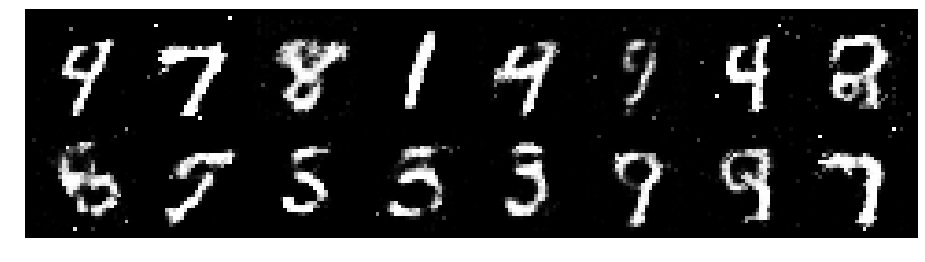

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.2713, Generator Loss: 0.8476
D(x): 0.5676, D(G(z)): 0.4515


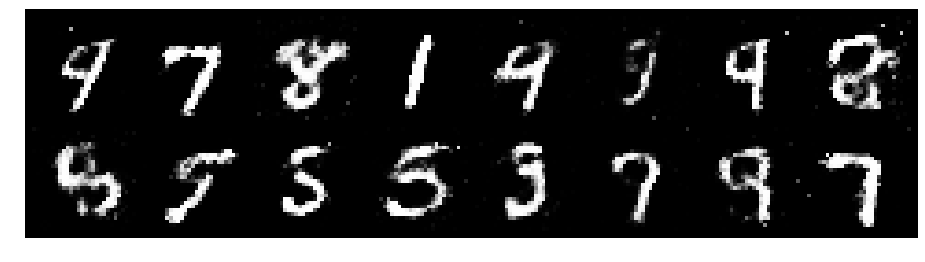

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.1911, Generator Loss: 0.8572
D(x): 0.5911, D(G(z)): 0.4373


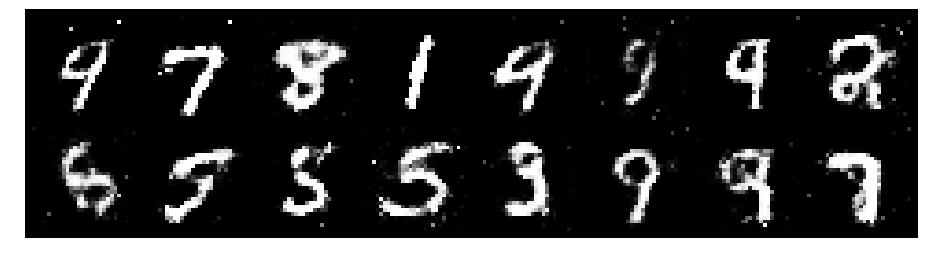

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.2800, Generator Loss: 0.8053
D(x): 0.5362, D(G(z)): 0.4469


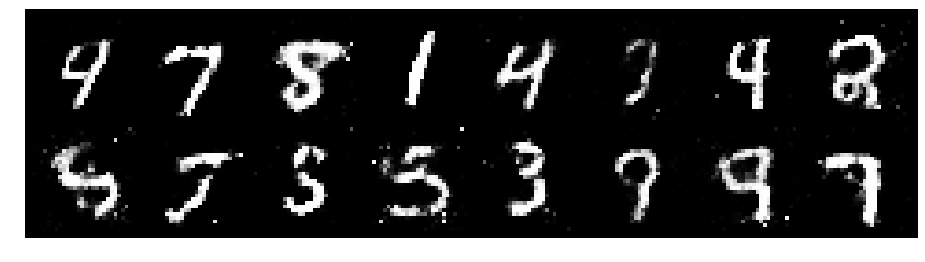

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.2233, Generator Loss: 1.0327
D(x): 0.5803, D(G(z)): 0.4486


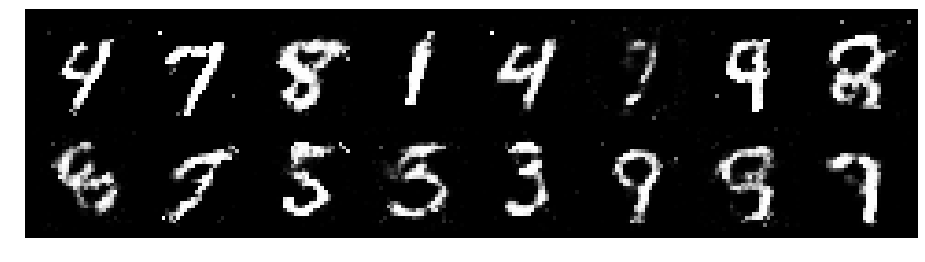

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.2966, Generator Loss: 0.7924
D(x): 0.6033, D(G(z)): 0.4969


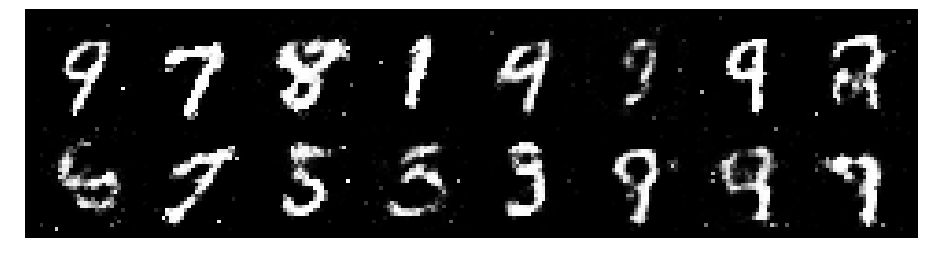

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.2338, Generator Loss: 0.9955
D(x): 0.6134, D(G(z)): 0.4422


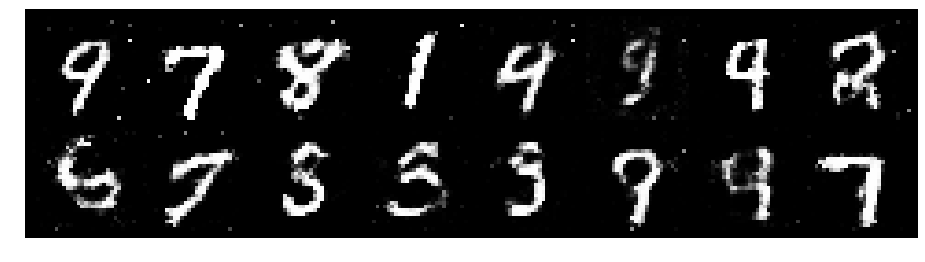

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 1.1858, Generator Loss: 1.0696
D(x): 0.5564, D(G(z)): 0.3772


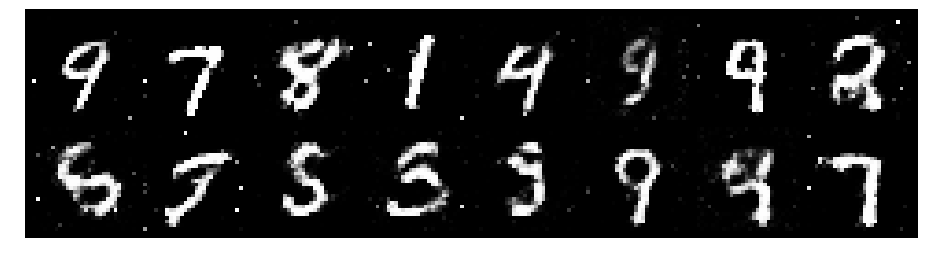

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.2176, Generator Loss: 0.9521
D(x): 0.5531, D(G(z)): 0.4076


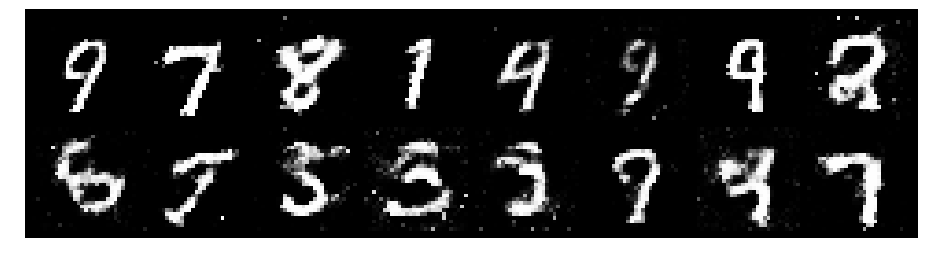

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.2542, Generator Loss: 1.0506
D(x): 0.6141, D(G(z)): 0.4440


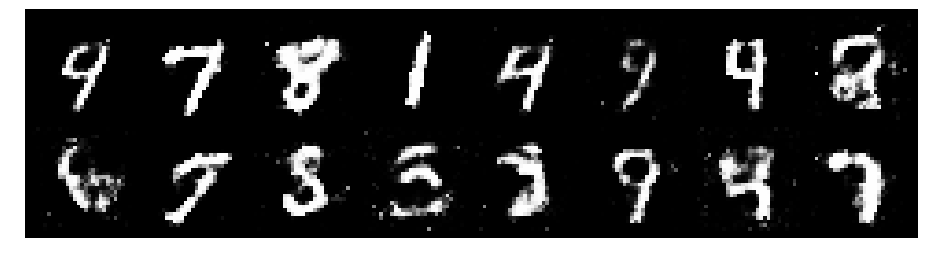

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.1421, Generator Loss: 0.9761
D(x): 0.6035, D(G(z)): 0.4155


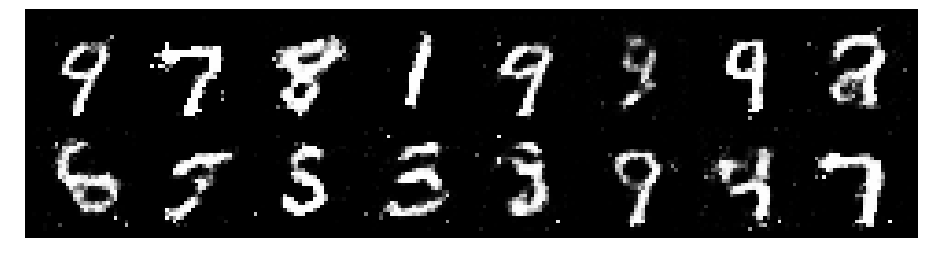

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.3217, Generator Loss: 1.0024
D(x): 0.6008, D(G(z)): 0.4712


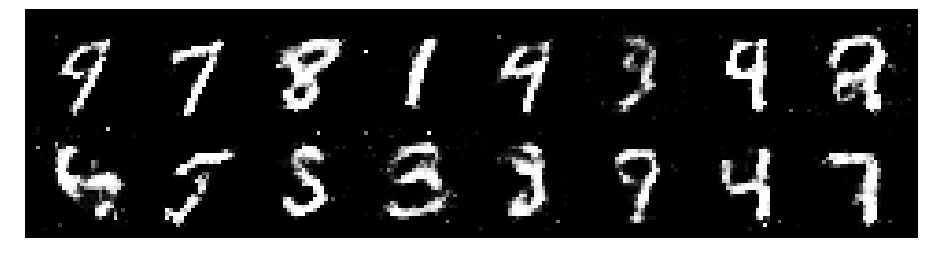

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.0858, Generator Loss: 0.8979
D(x): 0.6499, D(G(z)): 0.4100


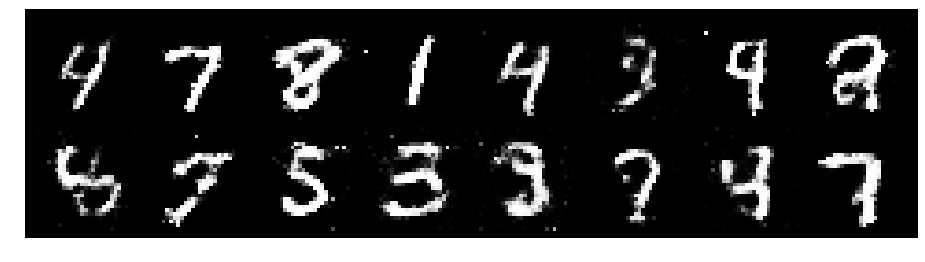

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.1113, Generator Loss: 1.0838
D(x): 0.6276, D(G(z)): 0.4187


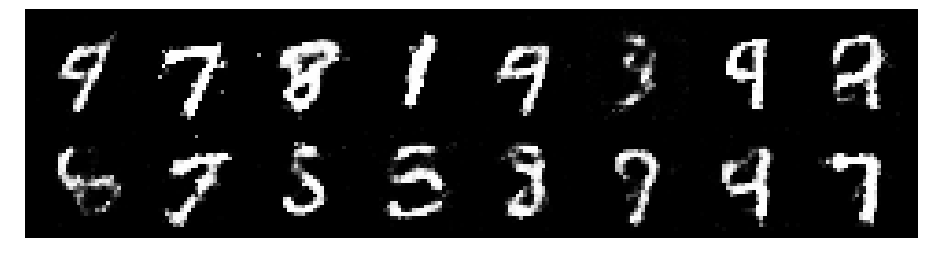

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.2294, Generator Loss: 0.9236
D(x): 0.6220, D(G(z)): 0.4646


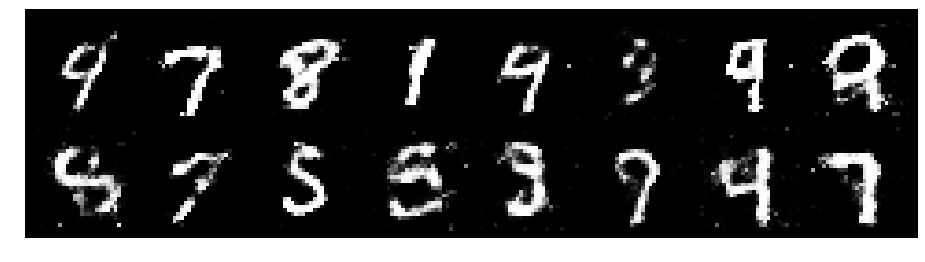

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.2098, Generator Loss: 1.0033
D(x): 0.5818, D(G(z)): 0.4135


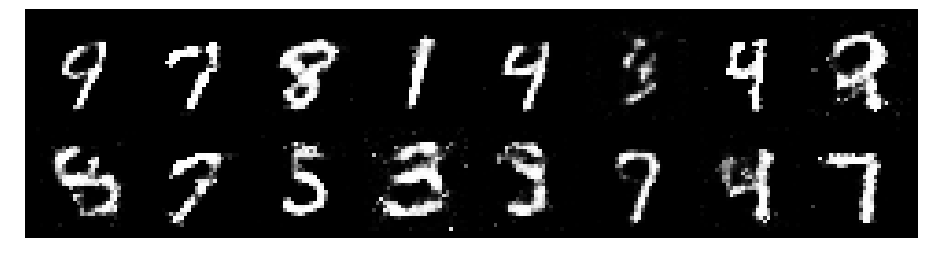

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.3477, Generator Loss: 0.7319
D(x): 0.5844, D(G(z)): 0.4956


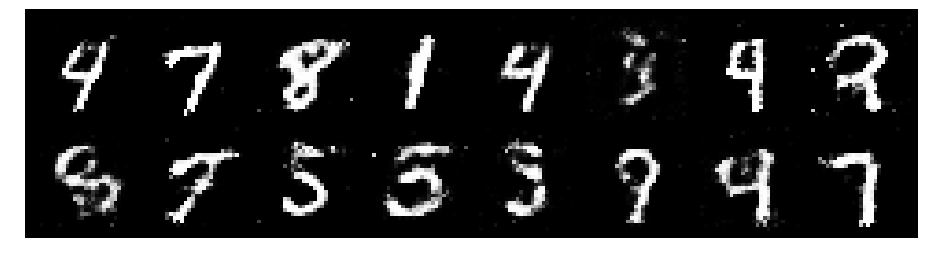

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.2575, Generator Loss: 0.8772
D(x): 0.5685, D(G(z)): 0.4215


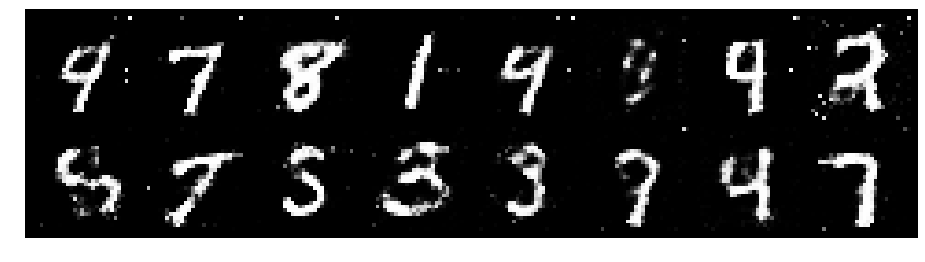

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.2119, Generator Loss: 1.0541
D(x): 0.5700, D(G(z)): 0.3983


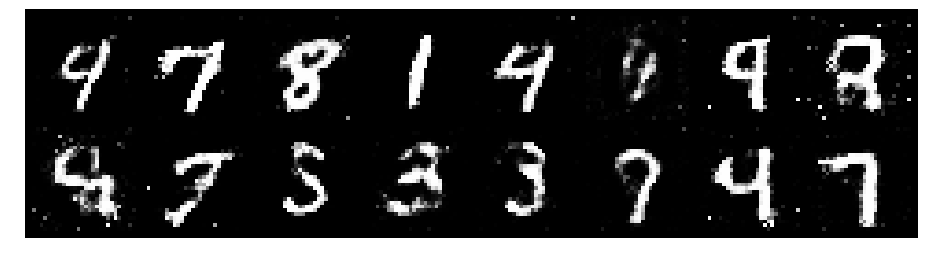

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.3316, Generator Loss: 0.9874
D(x): 0.5167, D(G(z)): 0.4333


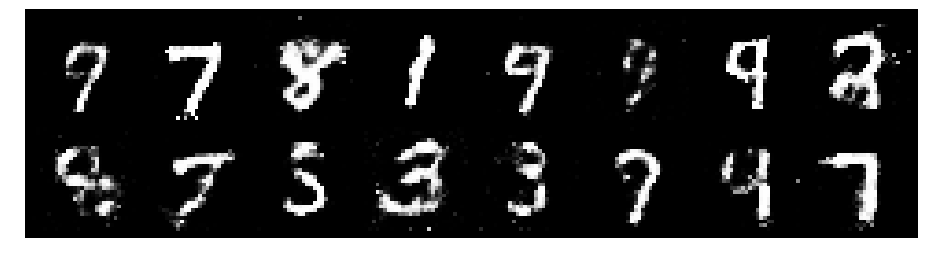

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.1255, Generator Loss: 0.9617
D(x): 0.6163, D(G(z)): 0.4136


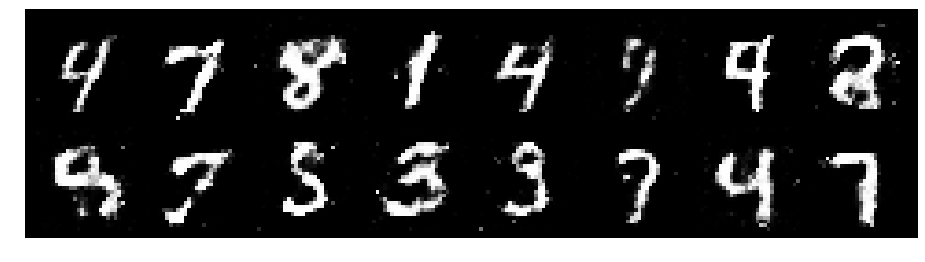

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.2712, Generator Loss: 1.0841
D(x): 0.5501, D(G(z)): 0.4036


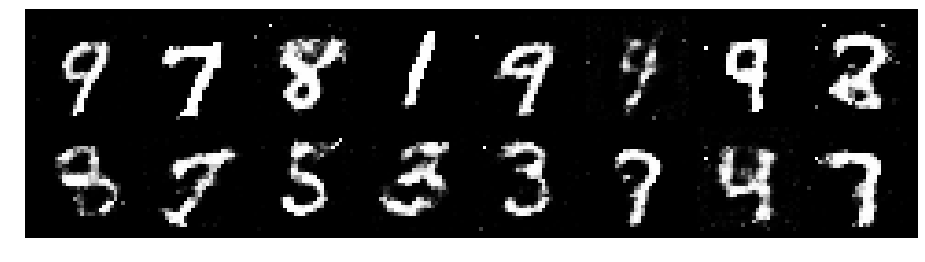

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.3033, Generator Loss: 0.9572
D(x): 0.4991, D(G(z)): 0.3965


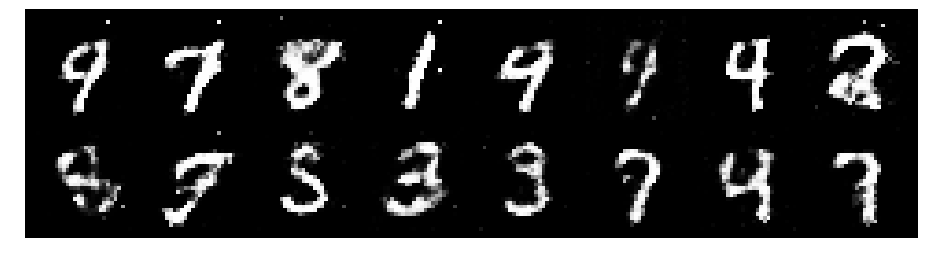

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.3097, Generator Loss: 0.9349
D(x): 0.5691, D(G(z)): 0.4571


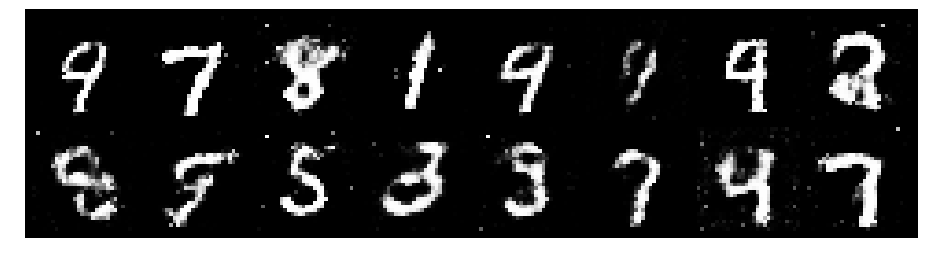

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.2017, Generator Loss: 1.0847
D(x): 0.6052, D(G(z)): 0.4358


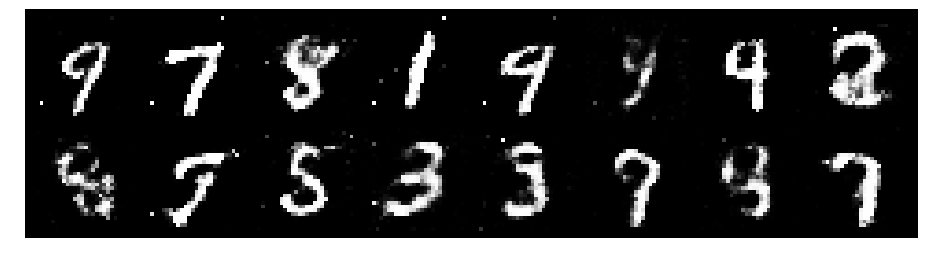

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.1784, Generator Loss: 1.2399
D(x): 0.5767, D(G(z)): 0.3680


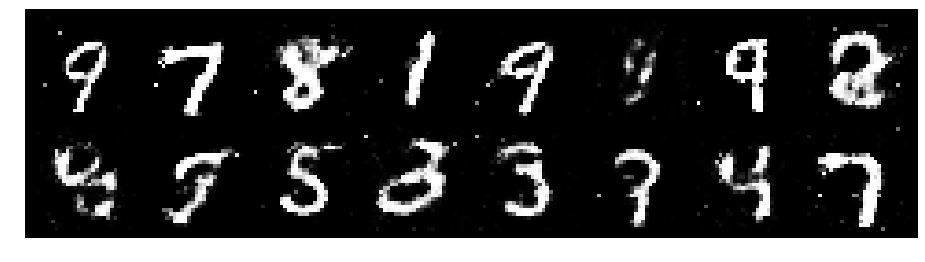

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.3129, Generator Loss: 1.0627
D(x): 0.5040, D(G(z)): 0.3764


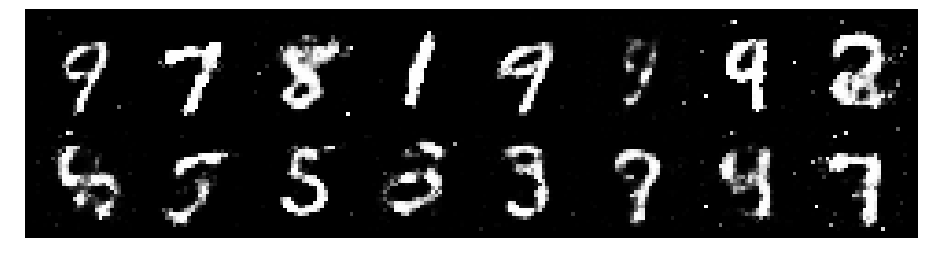

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.3351, Generator Loss: 1.1392
D(x): 0.5453, D(G(z)): 0.4383


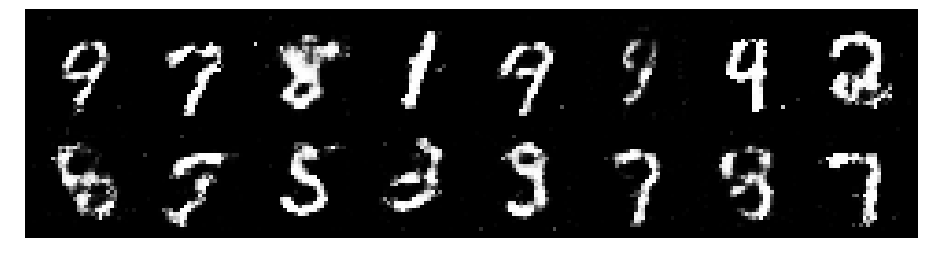

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.3052, Generator Loss: 0.9020
D(x): 0.5580, D(G(z)): 0.4523


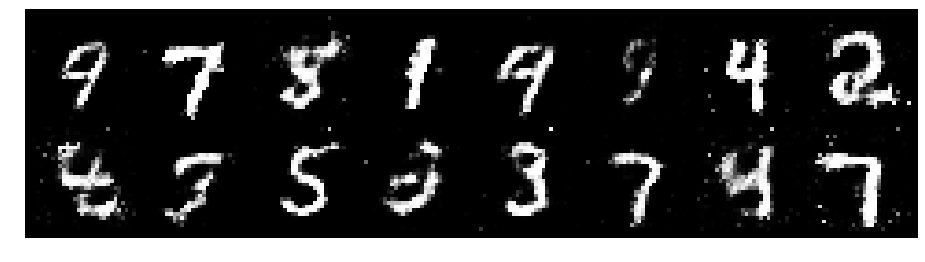

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.3257, Generator Loss: 0.8931
D(x): 0.5885, D(G(z)): 0.4749


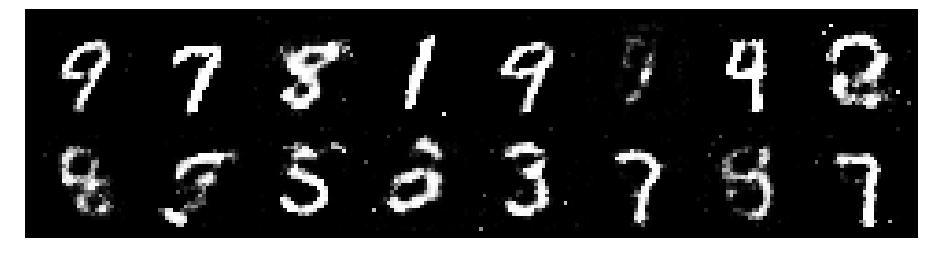

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.3413, Generator Loss: 1.0010
D(x): 0.4942, D(G(z)): 0.3801


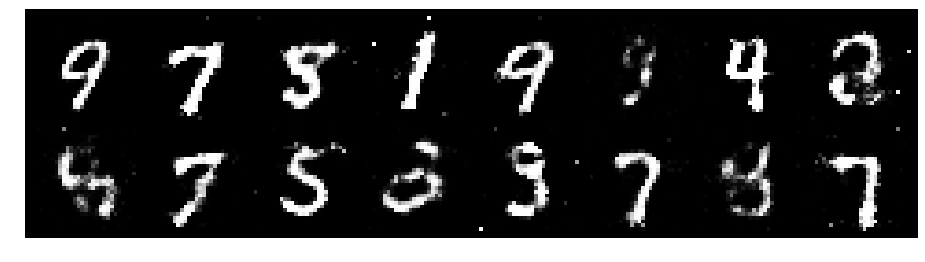

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 1.3235, Generator Loss: 1.1645
D(x): 0.5936, D(G(z)): 0.4450


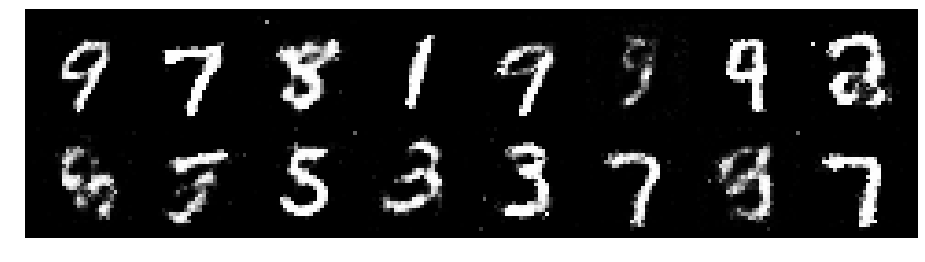

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.2151, Generator Loss: 1.0358
D(x): 0.6195, D(G(z)): 0.4428


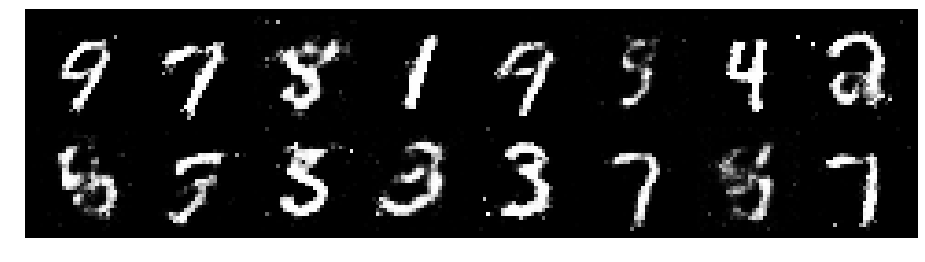

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.2833, Generator Loss: 0.8675
D(x): 0.5898, D(G(z)): 0.4528


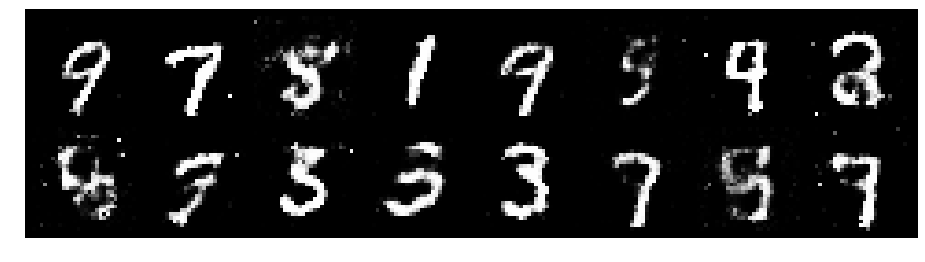

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.1074, Generator Loss: 0.9391
D(x): 0.6498, D(G(z)): 0.4382


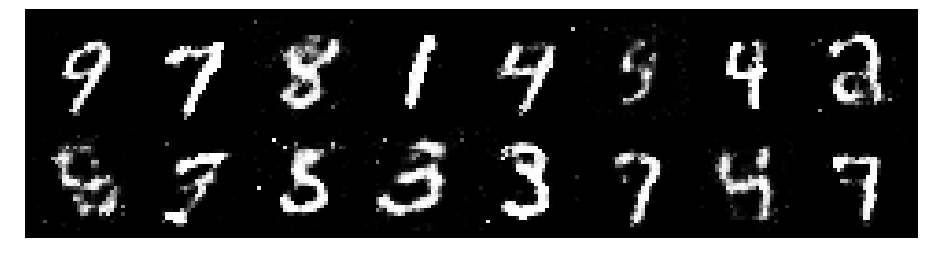

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.1089, Generator Loss: 1.1249
D(x): 0.6022, D(G(z)): 0.3871


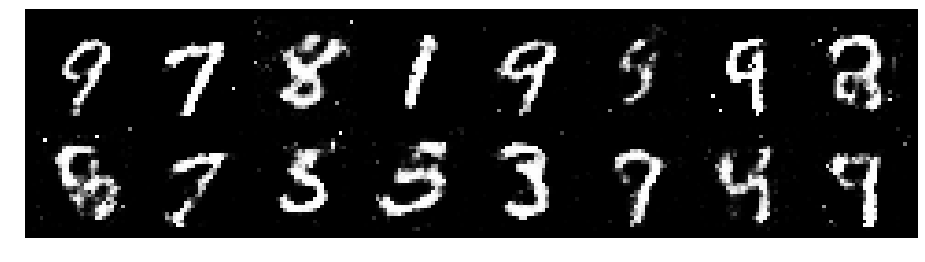

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.1180, Generator Loss: 0.9321
D(x): 0.5979, D(G(z)): 0.3991


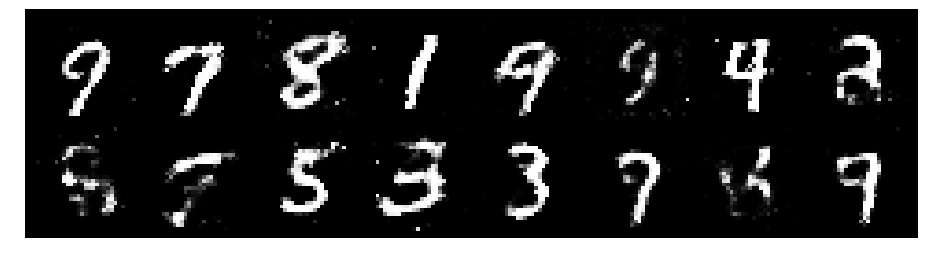

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.2132, Generator Loss: 1.0781
D(x): 0.5278, D(G(z)): 0.3732


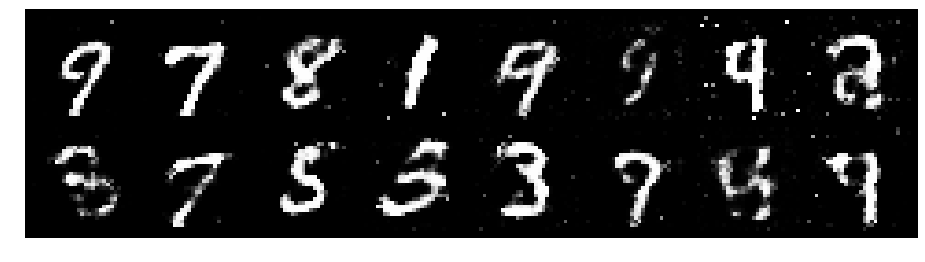

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.2600, Generator Loss: 0.9306
D(x): 0.5567, D(G(z)): 0.4388


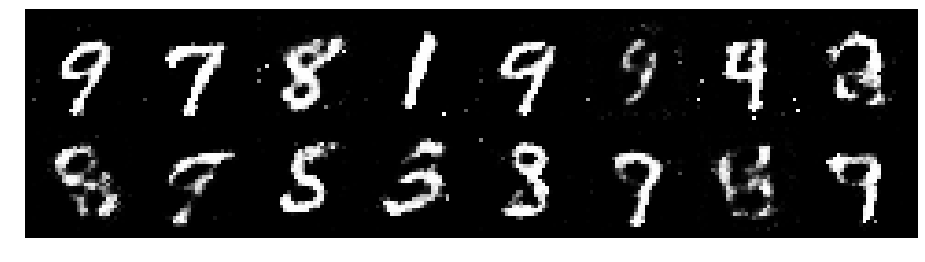

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.1823, Generator Loss: 0.9530
D(x): 0.6190, D(G(z)): 0.4582


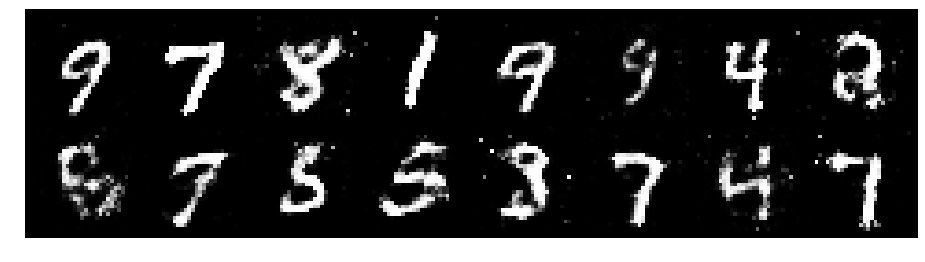

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.1745, Generator Loss: 1.1426
D(x): 0.5718, D(G(z)): 0.3780


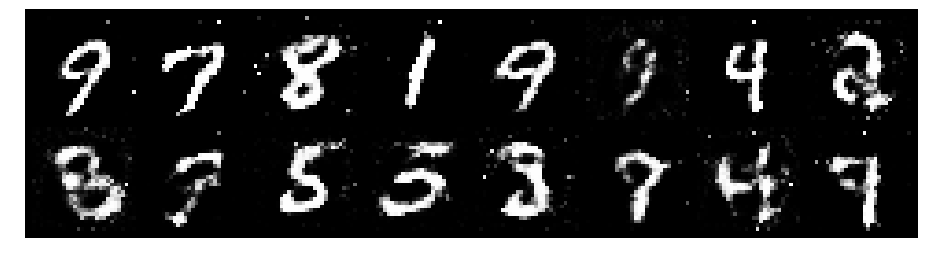

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.2090, Generator Loss: 1.1781
D(x): 0.6138, D(G(z)): 0.4293


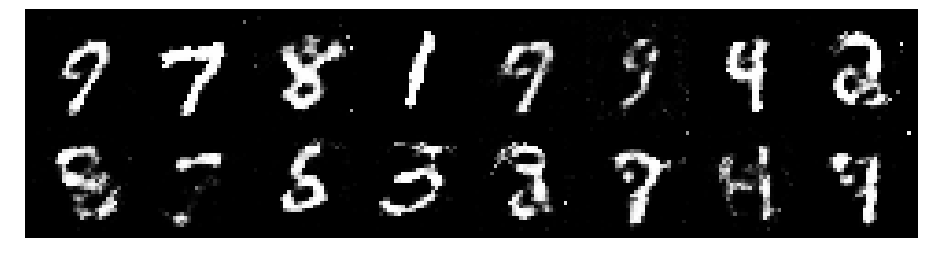

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.2620, Generator Loss: 0.9462
D(x): 0.5438, D(G(z)): 0.4041


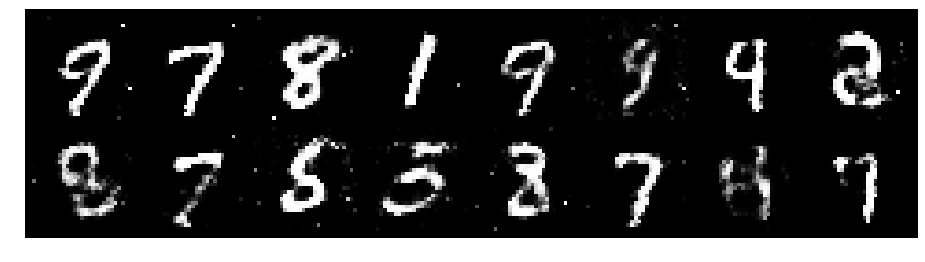

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.1542, Generator Loss: 1.1615
D(x): 0.5920, D(G(z)): 0.3761


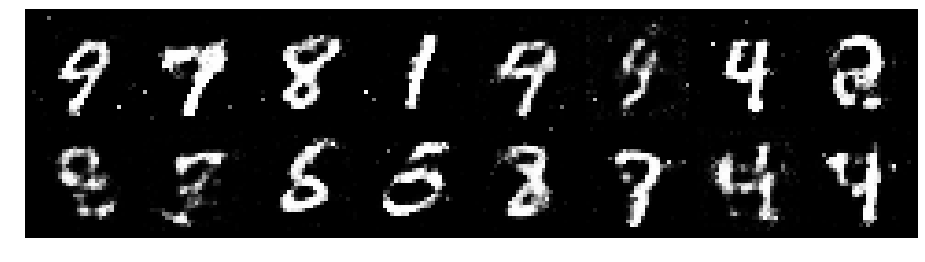

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.1750, Generator Loss: 1.1017
D(x): 0.6554, D(G(z)): 0.4432


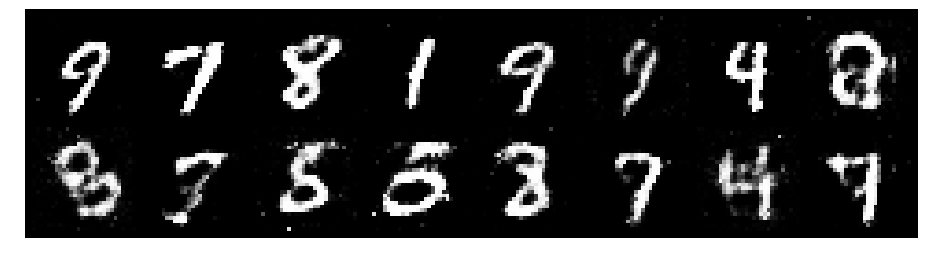

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.1481, Generator Loss: 0.9575
D(x): 0.5753, D(G(z)): 0.3660


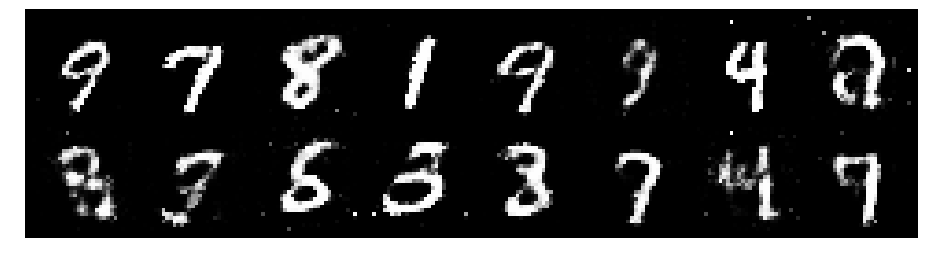

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.1159, Generator Loss: 1.0367
D(x): 0.5853, D(G(z)): 0.3784


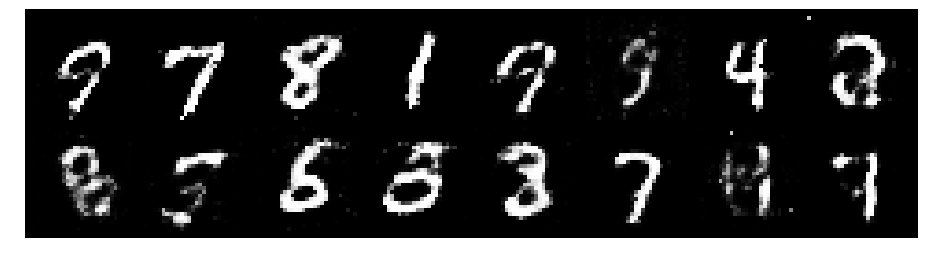

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.3304, Generator Loss: 1.1863
D(x): 0.5210, D(G(z)): 0.3969


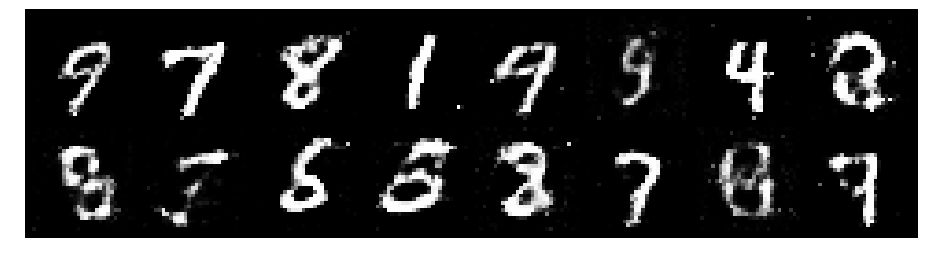

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.2709, Generator Loss: 1.0073
D(x): 0.5581, D(G(z)): 0.4286


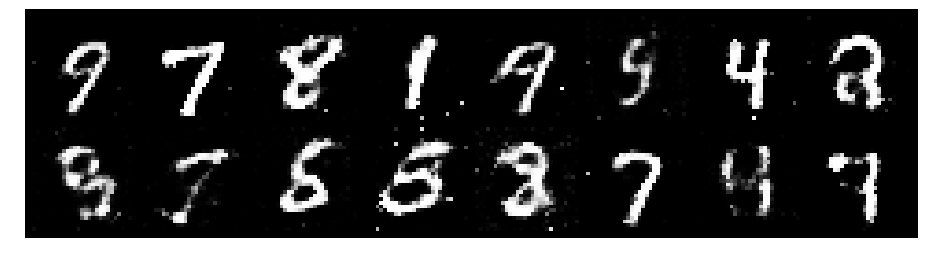

Epoch: [59/200], Batch Num: [500/600]
Discriminator Loss: 1.3649, Generator Loss: 0.8945
D(x): 0.5374, D(G(z)): 0.4656


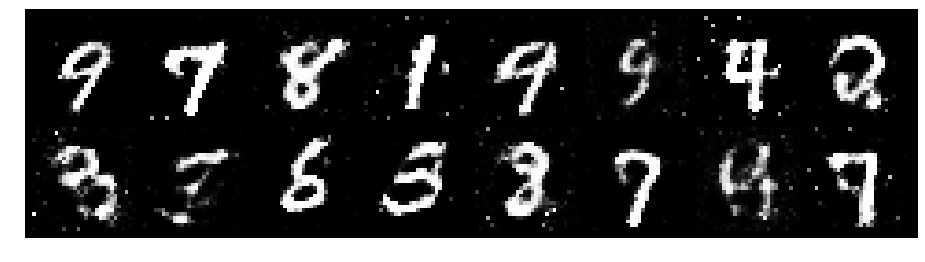

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.1083, Generator Loss: 1.0411
D(x): 0.6159, D(G(z)): 0.4060


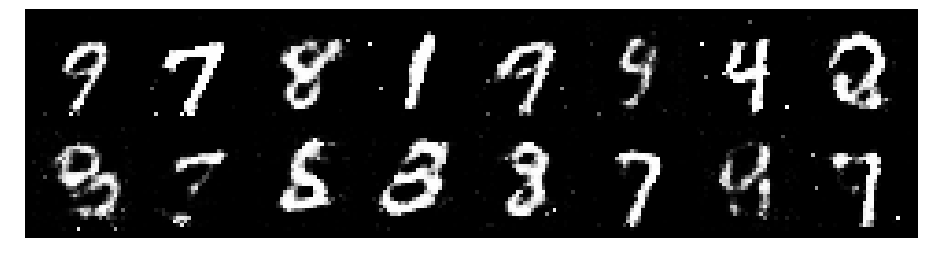

Epoch: [60/200], Batch Num: [100/600]
Discriminator Loss: 1.2317, Generator Loss: 0.9734
D(x): 0.5960, D(G(z)): 0.4350


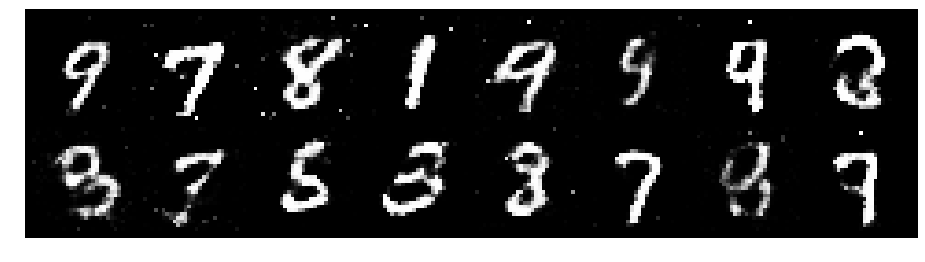

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.1535, Generator Loss: 1.1343
D(x): 0.5874, D(G(z)): 0.3899


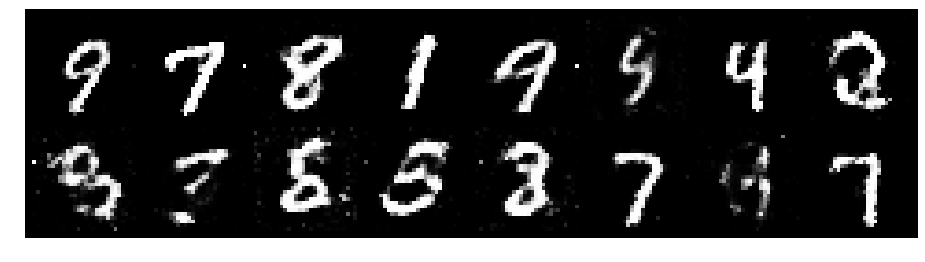

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.1633, Generator Loss: 1.2722
D(x): 0.6016, D(G(z)): 0.3495


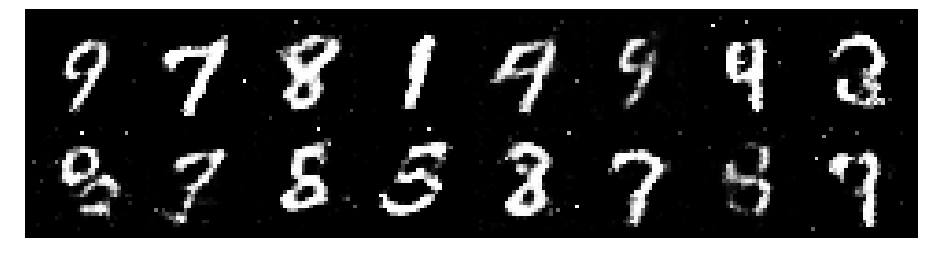

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.0875, Generator Loss: 1.0981
D(x): 0.6150, D(G(z)): 0.3516


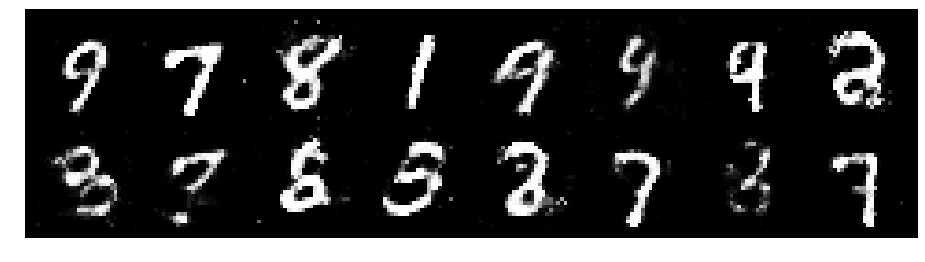

Epoch: [60/200], Batch Num: [500/600]
Discriminator Loss: 1.1312, Generator Loss: 1.2035
D(x): 0.5934, D(G(z)): 0.3845


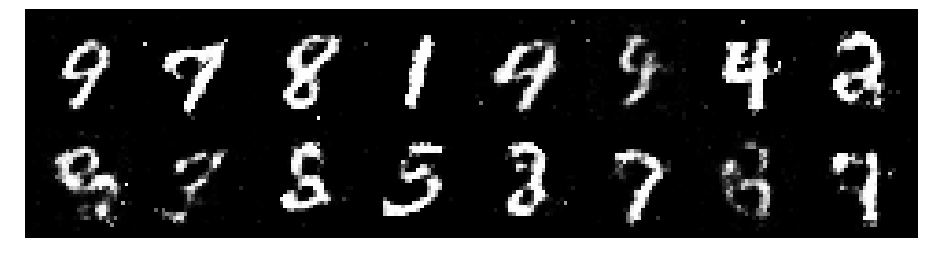

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.1232, Generator Loss: 1.1088
D(x): 0.6041, D(G(z)): 0.4039


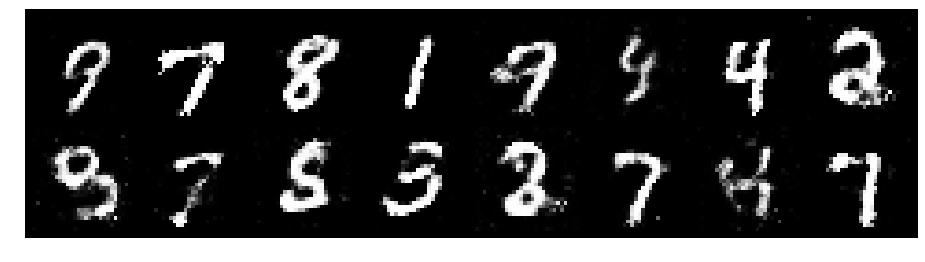

Epoch: [61/200], Batch Num: [100/600]
Discriminator Loss: 1.0873, Generator Loss: 1.0713
D(x): 0.5673, D(G(z)): 0.3409


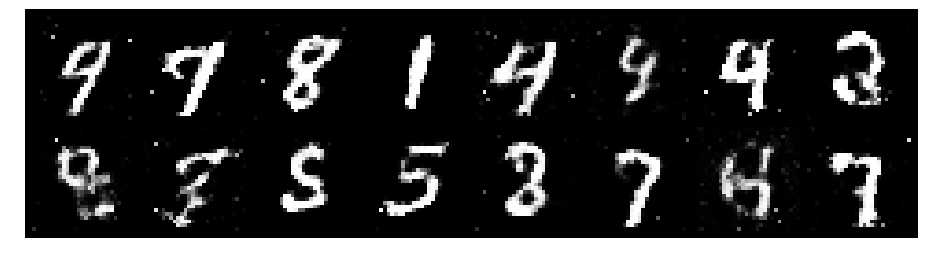

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.2488, Generator Loss: 1.1008
D(x): 0.5868, D(G(z)): 0.4183


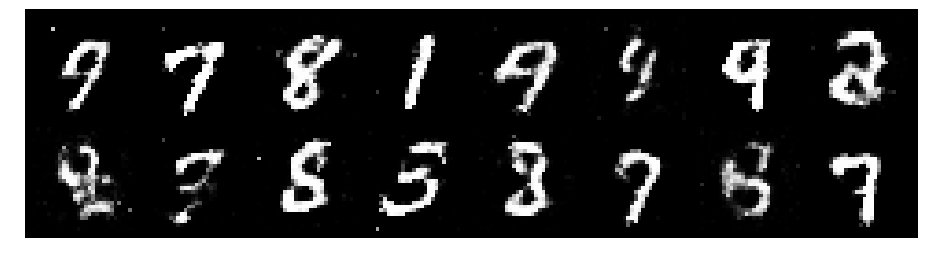

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.2155, Generator Loss: 0.9817
D(x): 0.5512, D(G(z)): 0.3639


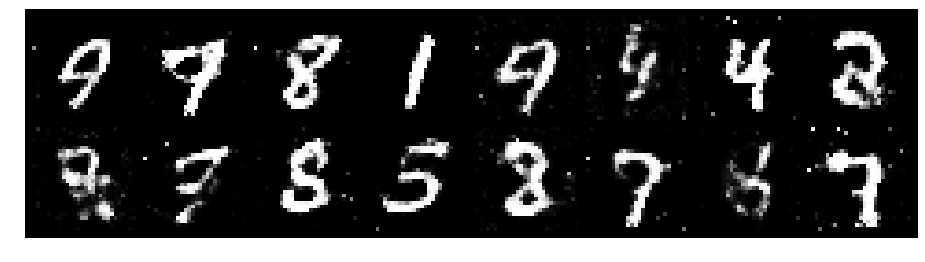

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.1268, Generator Loss: 1.0212
D(x): 0.6074, D(G(z)): 0.3797


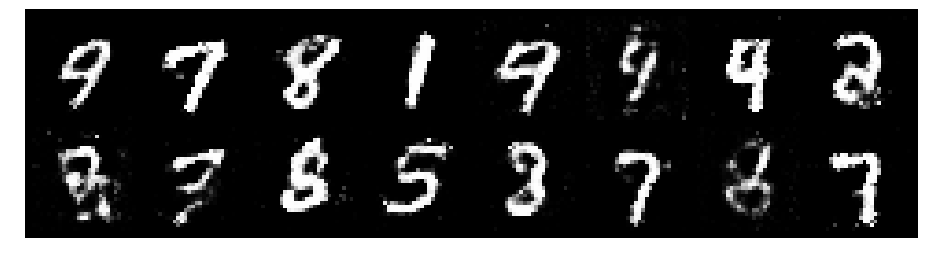

Epoch: [61/200], Batch Num: [500/600]
Discriminator Loss: 1.1037, Generator Loss: 1.1499
D(x): 0.6100, D(G(z)): 0.3833


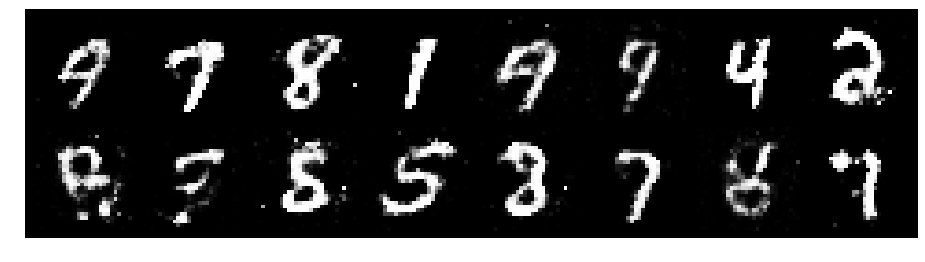

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.3524, Generator Loss: 0.8394
D(x): 0.5532, D(G(z)): 0.4526


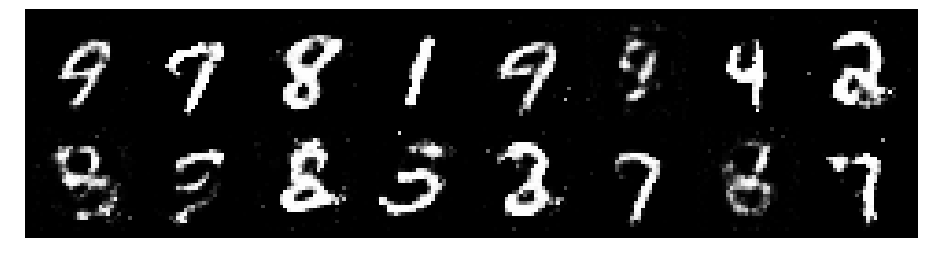

Epoch: [62/200], Batch Num: [100/600]
Discriminator Loss: 1.1361, Generator Loss: 0.9325
D(x): 0.6070, D(G(z)): 0.4153


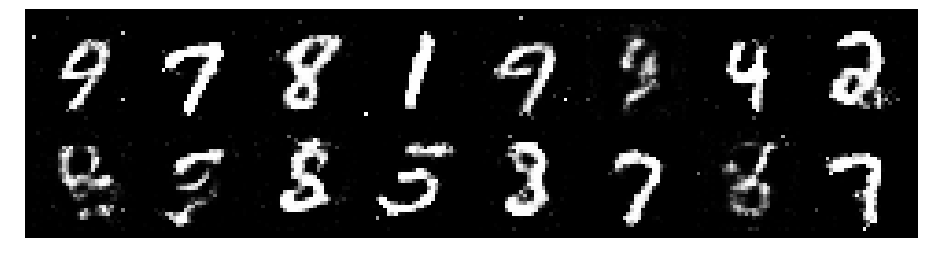

Epoch: [62/200], Batch Num: [200/600]
Discriminator Loss: 1.2271, Generator Loss: 1.1718
D(x): 0.5800, D(G(z)): 0.4071


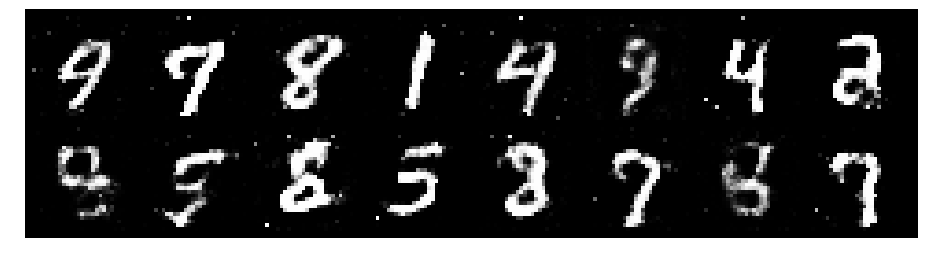

Epoch: [62/200], Batch Num: [300/600]
Discriminator Loss: 1.2072, Generator Loss: 1.1183
D(x): 0.5708, D(G(z)): 0.3984


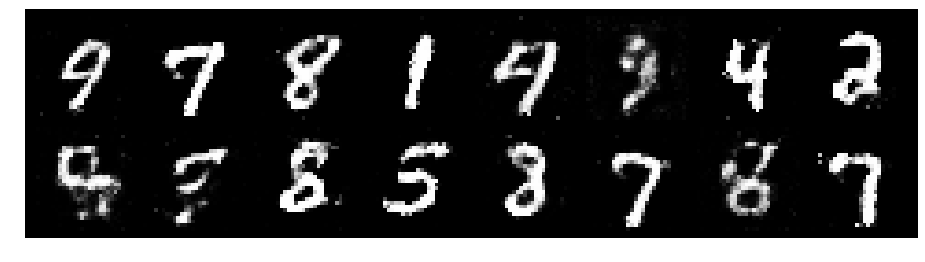

Epoch: [62/200], Batch Num: [400/600]
Discriminator Loss: 1.2784, Generator Loss: 0.9991
D(x): 0.5467, D(G(z)): 0.4028


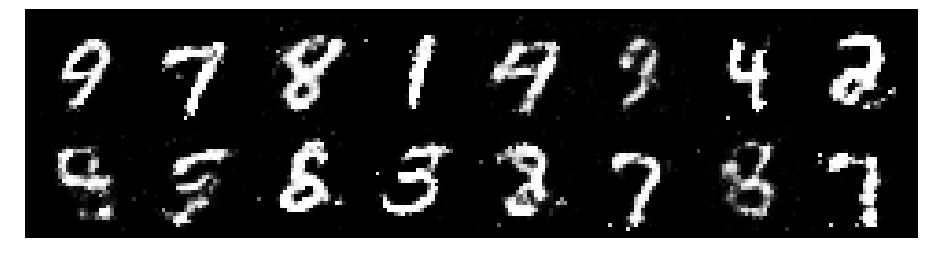

Epoch: [62/200], Batch Num: [500/600]
Discriminator Loss: 1.2898, Generator Loss: 0.9117
D(x): 0.5505, D(G(z)): 0.4385


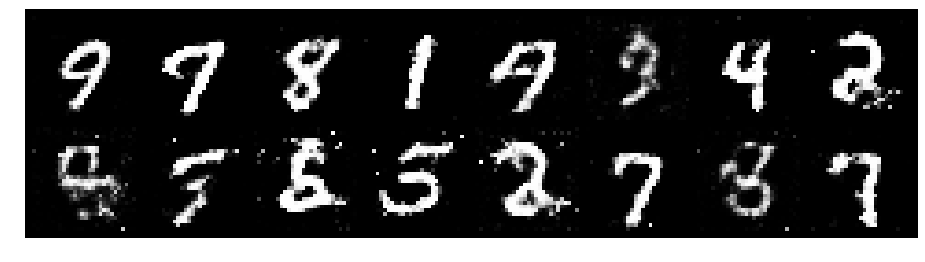

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.2771, Generator Loss: 0.9525
D(x): 0.5633, D(G(z)): 0.4528


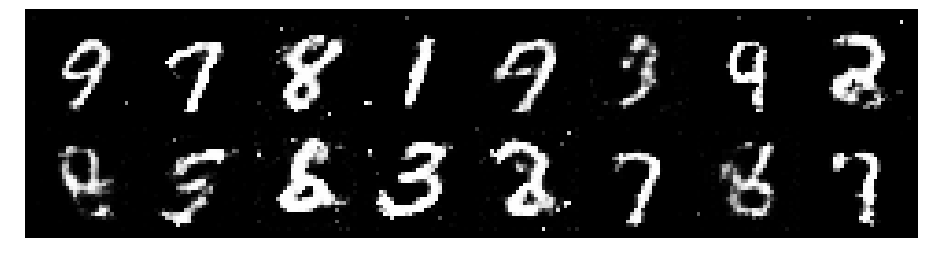

Epoch: [63/200], Batch Num: [100/600]
Discriminator Loss: 1.2883, Generator Loss: 0.9164
D(x): 0.5252, D(G(z)): 0.4052


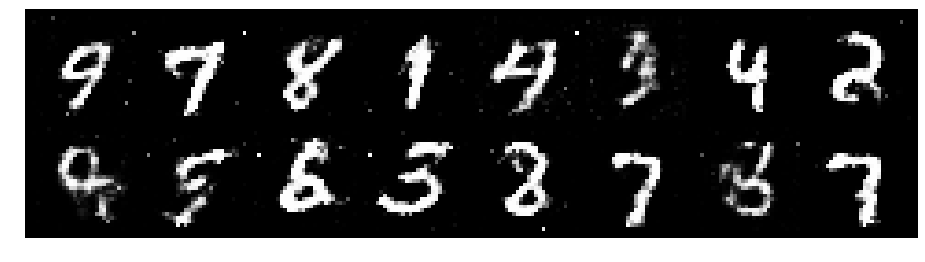

Epoch: [63/200], Batch Num: [200/600]
Discriminator Loss: 1.3447, Generator Loss: 0.9629
D(x): 0.5167, D(G(z)): 0.4198


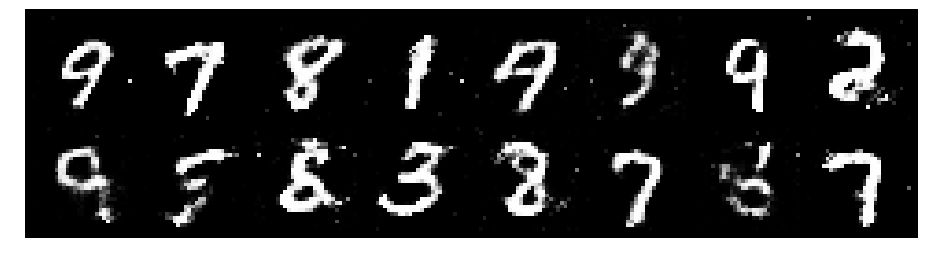

Epoch: [63/200], Batch Num: [300/600]
Discriminator Loss: 1.3025, Generator Loss: 0.9624
D(x): 0.4898, D(G(z)): 0.3901


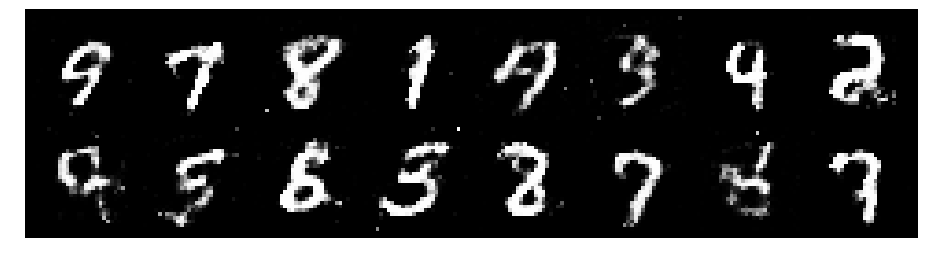

Epoch: [63/200], Batch Num: [400/600]
Discriminator Loss: 1.3382, Generator Loss: 0.8195
D(x): 0.5360, D(G(z)): 0.4763


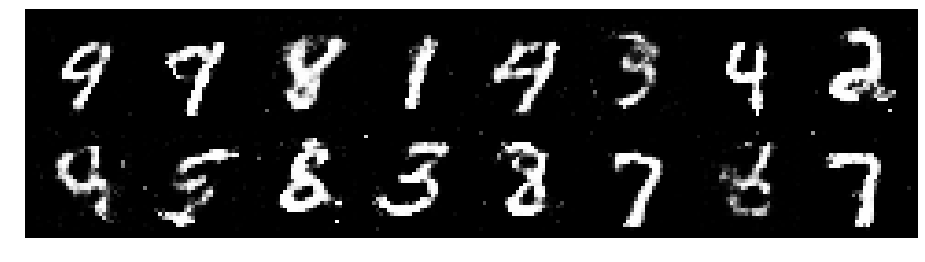

Epoch: [63/200], Batch Num: [500/600]
Discriminator Loss: 1.1594, Generator Loss: 1.0288
D(x): 0.5926, D(G(z)): 0.3978


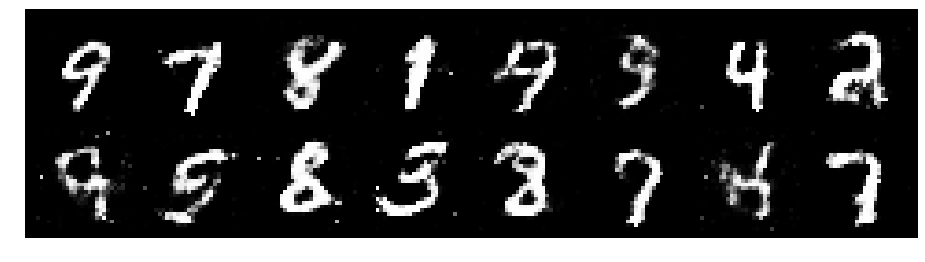

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 1.2189, Generator Loss: 0.8374
D(x): 0.6281, D(G(z)): 0.4779


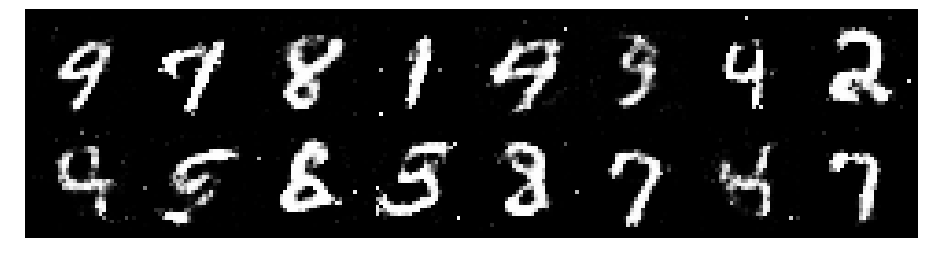

Epoch: [64/200], Batch Num: [100/600]
Discriminator Loss: 1.2901, Generator Loss: 0.8621
D(x): 0.5718, D(G(z)): 0.4753


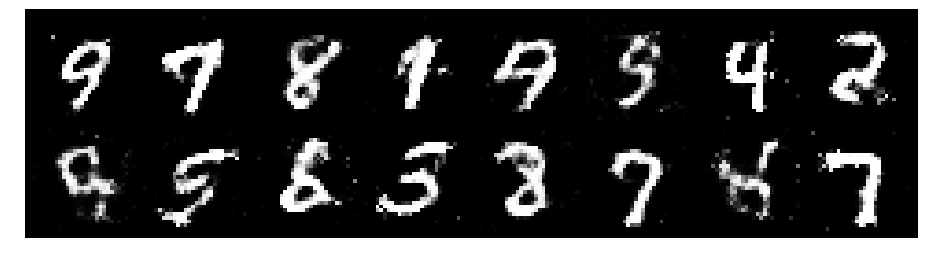

Epoch: [64/200], Batch Num: [200/600]
Discriminator Loss: 1.3169, Generator Loss: 0.8349
D(x): 0.5705, D(G(z)): 0.4867


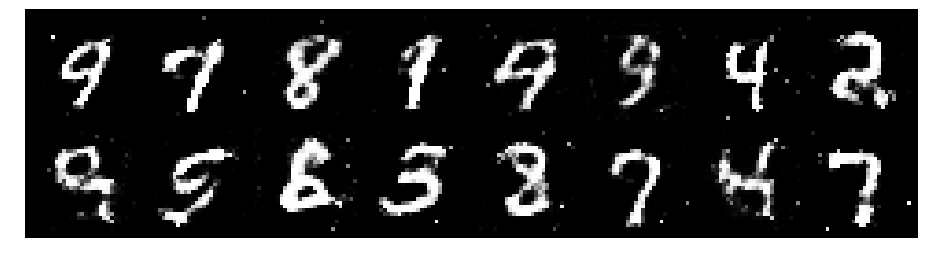

Epoch: [64/200], Batch Num: [300/600]
Discriminator Loss: 1.2388, Generator Loss: 1.0272
D(x): 0.5883, D(G(z)): 0.4376


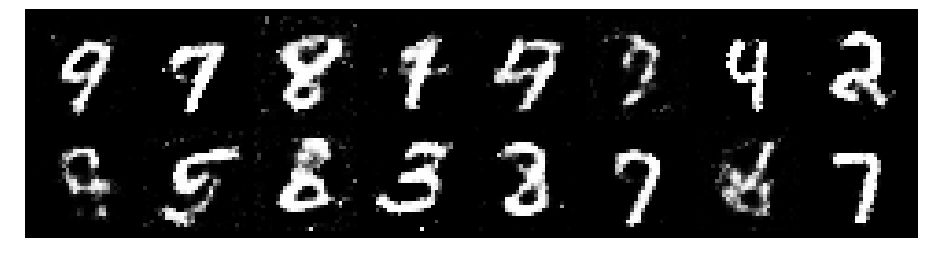

Epoch: [64/200], Batch Num: [400/600]
Discriminator Loss: 1.1220, Generator Loss: 1.0179
D(x): 0.5887, D(G(z)): 0.3650


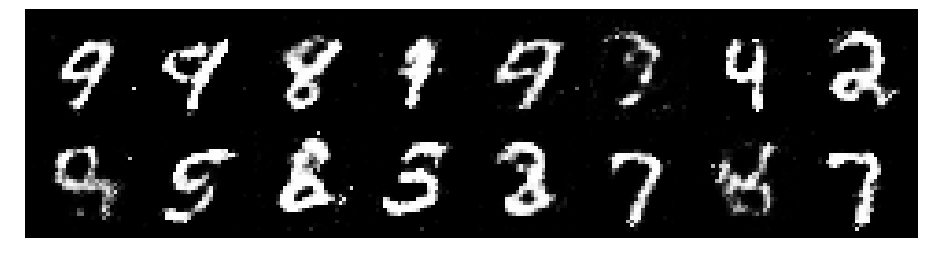

Epoch: [64/200], Batch Num: [500/600]
Discriminator Loss: 1.1325, Generator Loss: 1.0886
D(x): 0.6529, D(G(z)): 0.4048


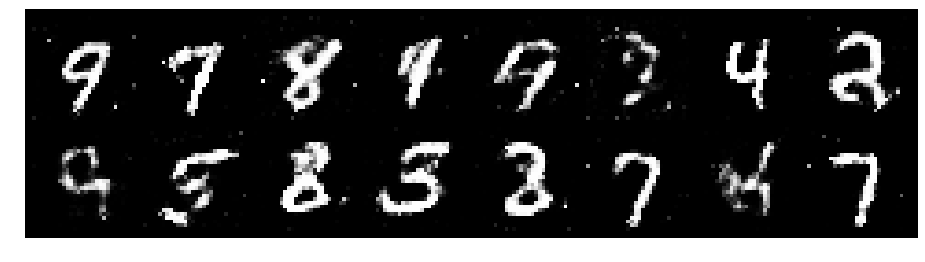

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.0900, Generator Loss: 1.2273
D(x): 0.6514, D(G(z)): 0.3850


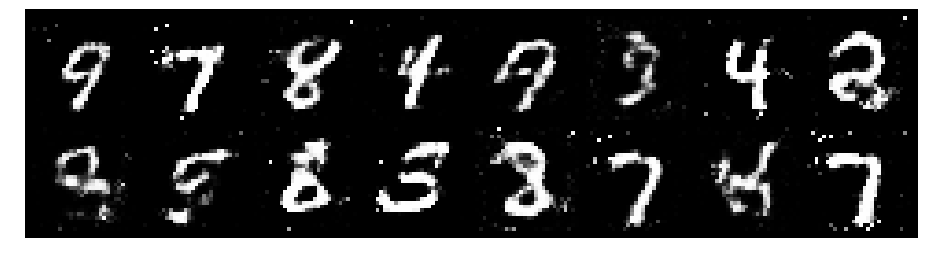

Epoch: [65/200], Batch Num: [100/600]
Discriminator Loss: 1.1229, Generator Loss: 1.0856
D(x): 0.6494, D(G(z)): 0.4081


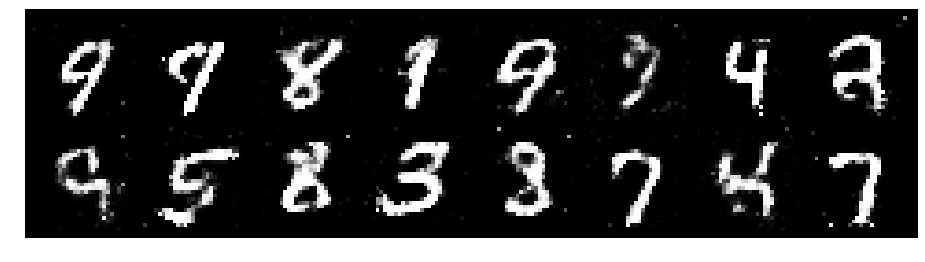

Epoch: [65/200], Batch Num: [200/600]
Discriminator Loss: 1.1698, Generator Loss: 0.9932
D(x): 0.5815, D(G(z)): 0.4100


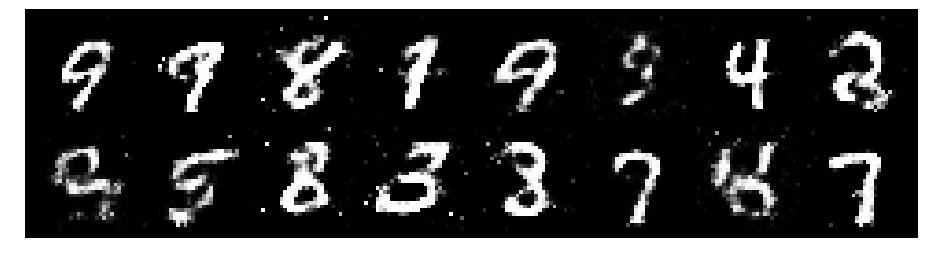

Epoch: [65/200], Batch Num: [300/600]
Discriminator Loss: 1.2730, Generator Loss: 0.9560
D(x): 0.5461, D(G(z)): 0.4131


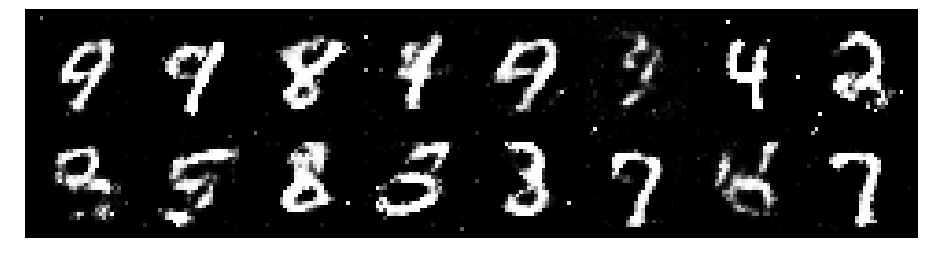

Epoch: [65/200], Batch Num: [400/600]
Discriminator Loss: 1.2582, Generator Loss: 0.9291
D(x): 0.6075, D(G(z)): 0.4794


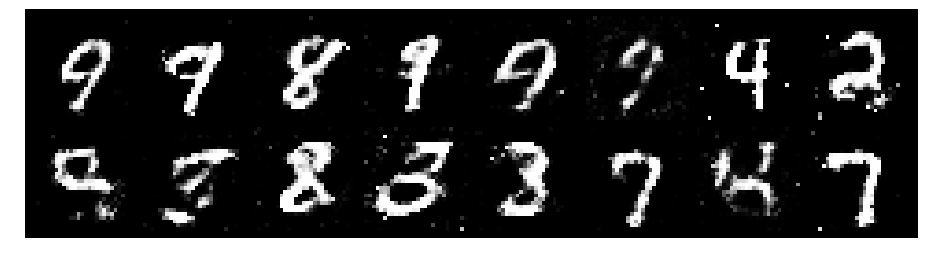

Epoch: [65/200], Batch Num: [500/600]
Discriminator Loss: 1.1639, Generator Loss: 1.0250
D(x): 0.5913, D(G(z)): 0.4058


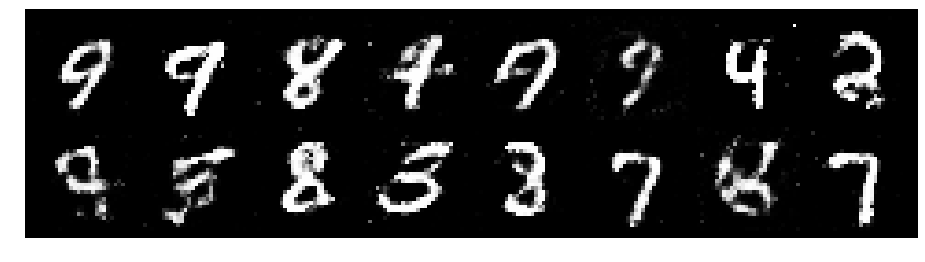

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.0614, Generator Loss: 1.1470
D(x): 0.6232, D(G(z)): 0.3764


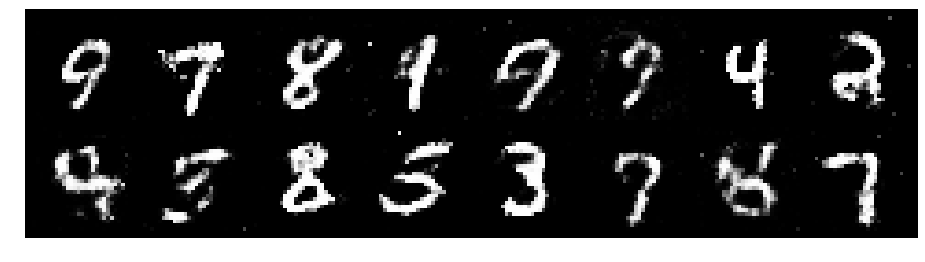

Epoch: [66/200], Batch Num: [100/600]
Discriminator Loss: 1.2120, Generator Loss: 0.8821
D(x): 0.5739, D(G(z)): 0.4469


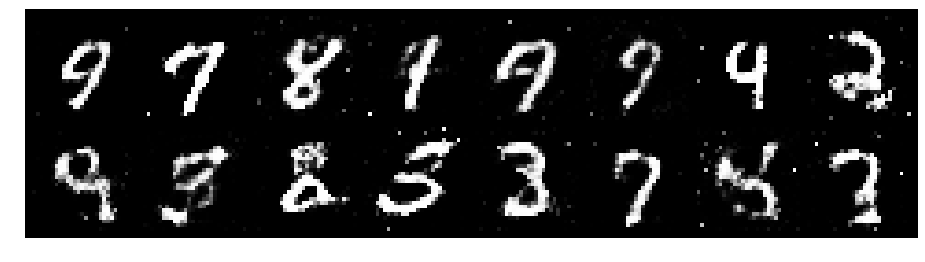

Epoch: [66/200], Batch Num: [200/600]
Discriminator Loss: 1.2033, Generator Loss: 0.9193
D(x): 0.5584, D(G(z)): 0.4217


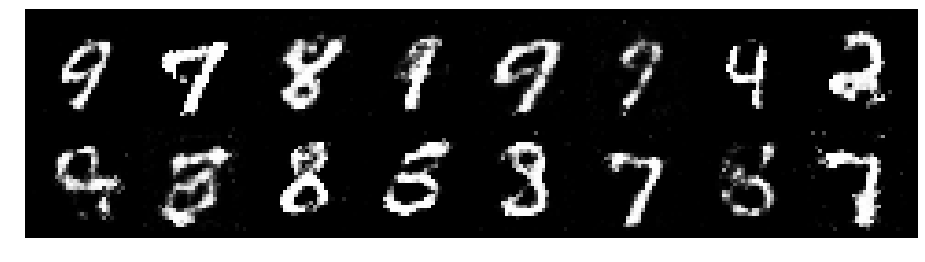

Epoch: [66/200], Batch Num: [300/600]
Discriminator Loss: 1.2358, Generator Loss: 0.9530
D(x): 0.5711, D(G(z)): 0.4322


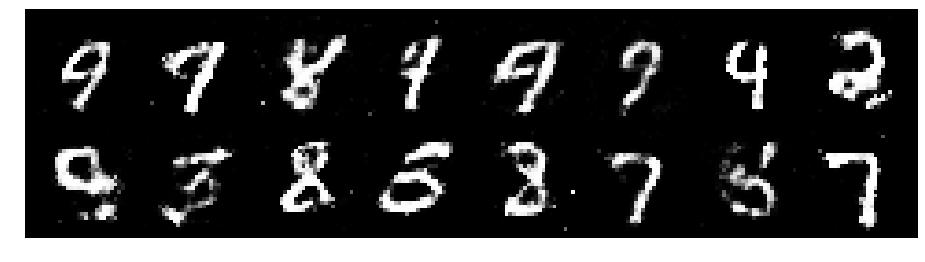

Epoch: [66/200], Batch Num: [400/600]
Discriminator Loss: 1.1874, Generator Loss: 1.0554
D(x): 0.5677, D(G(z)): 0.4036


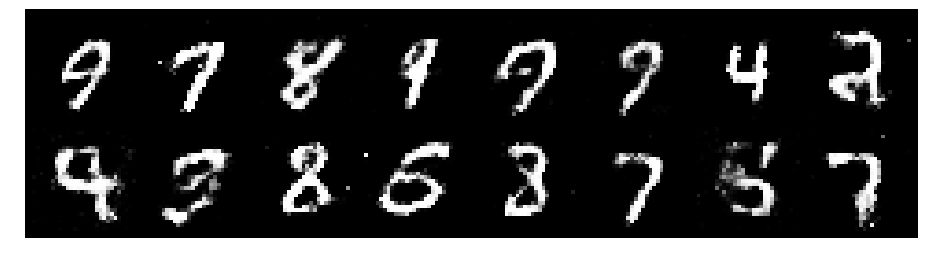

Epoch: [66/200], Batch Num: [500/600]
Discriminator Loss: 1.1817, Generator Loss: 0.8495
D(x): 0.6046, D(G(z)): 0.4538


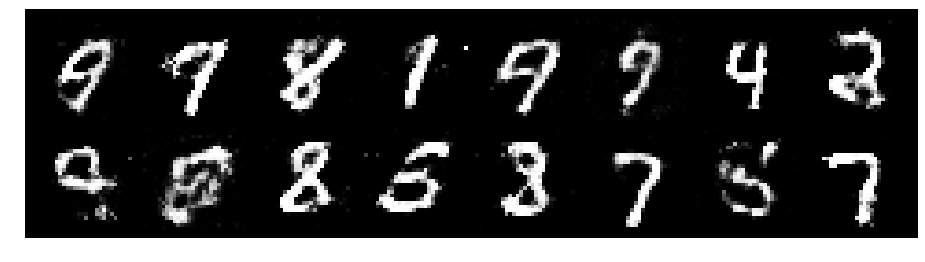

Epoch: [67/200], Batch Num: [0/600]
Discriminator Loss: 1.1847, Generator Loss: 1.2086
D(x): 0.5680, D(G(z)): 0.3886


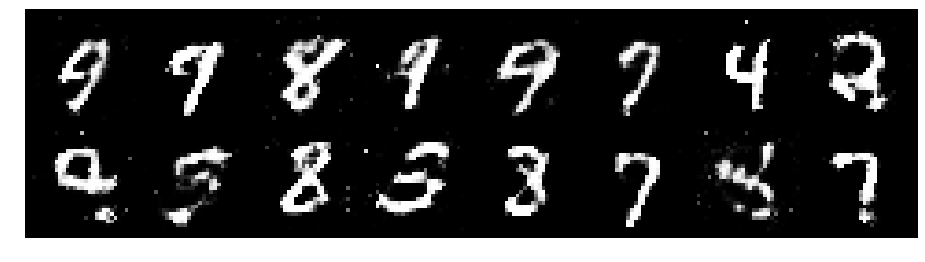

Epoch: [67/200], Batch Num: [100/600]
Discriminator Loss: 1.2402, Generator Loss: 0.8472
D(x): 0.5670, D(G(z)): 0.4486


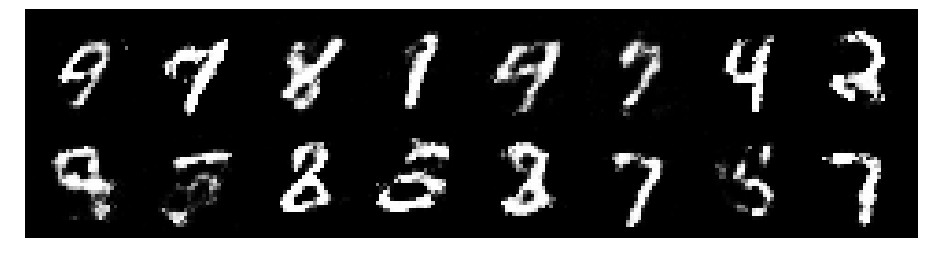

Epoch: [67/200], Batch Num: [200/600]
Discriminator Loss: 1.2455, Generator Loss: 1.0368
D(x): 0.5604, D(G(z)): 0.4237


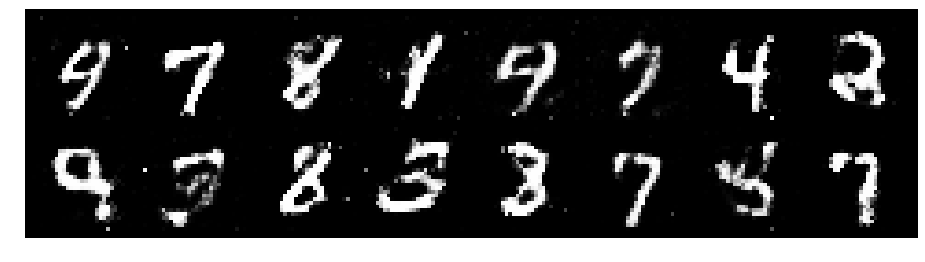

Epoch: [67/200], Batch Num: [300/600]
Discriminator Loss: 1.2244, Generator Loss: 0.9532
D(x): 0.5533, D(G(z)): 0.4237


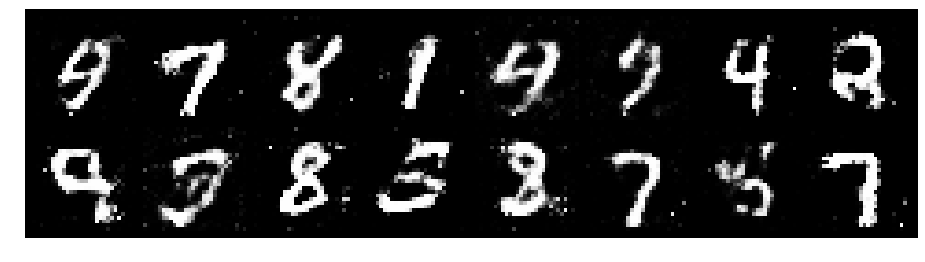

Epoch: [67/200], Batch Num: [400/600]
Discriminator Loss: 1.2215, Generator Loss: 0.8380
D(x): 0.5853, D(G(z)): 0.4544


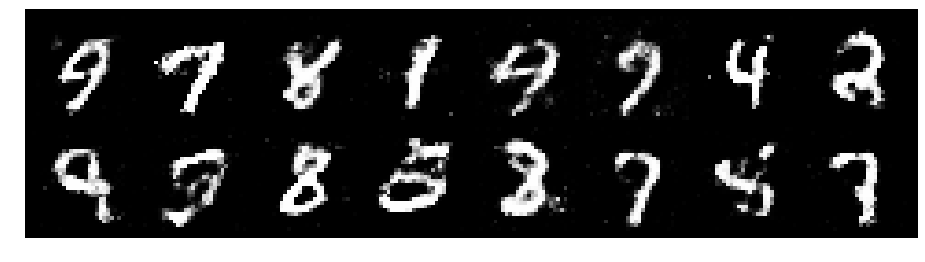

Epoch: [67/200], Batch Num: [500/600]
Discriminator Loss: 1.2210, Generator Loss: 0.9244
D(x): 0.5706, D(G(z)): 0.4354


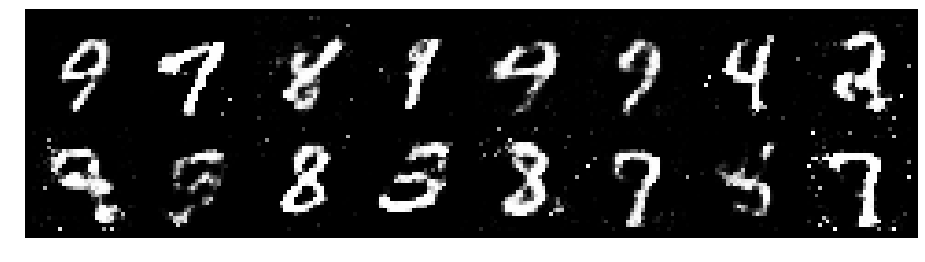

Epoch: [68/200], Batch Num: [0/600]
Discriminator Loss: 1.2805, Generator Loss: 0.9056
D(x): 0.5301, D(G(z)): 0.4171


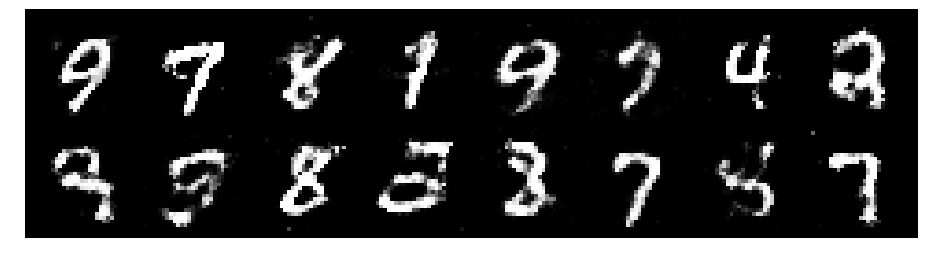

Epoch: [68/200], Batch Num: [100/600]
Discriminator Loss: 1.2443, Generator Loss: 0.9814
D(x): 0.5701, D(G(z)): 0.4311


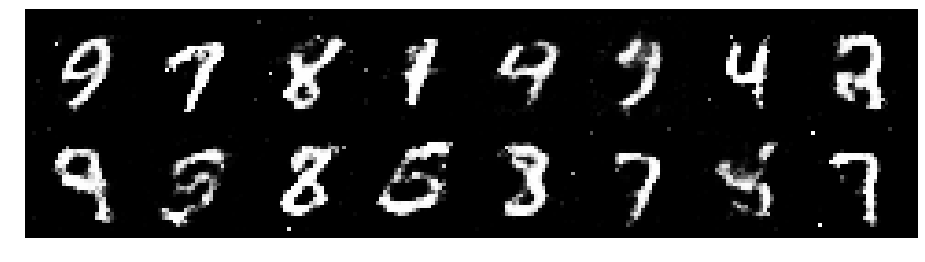

Epoch: [68/200], Batch Num: [200/600]
Discriminator Loss: 1.1591, Generator Loss: 1.0196
D(x): 0.6480, D(G(z)): 0.4437


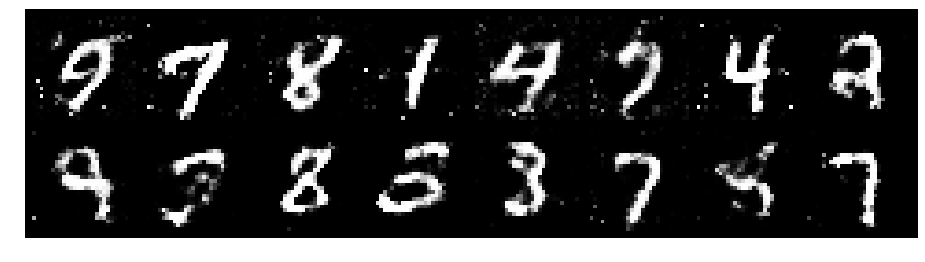

Epoch: [68/200], Batch Num: [300/600]
Discriminator Loss: 1.2816, Generator Loss: 1.0953
D(x): 0.5689, D(G(z)): 0.4491


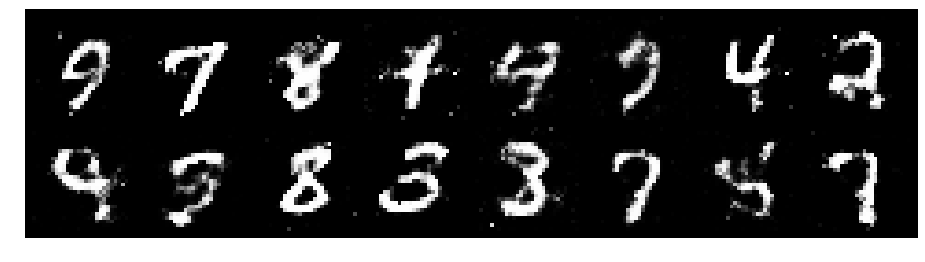

Epoch: [68/200], Batch Num: [400/600]
Discriminator Loss: 1.1558, Generator Loss: 0.9204
D(x): 0.6142, D(G(z)): 0.4163


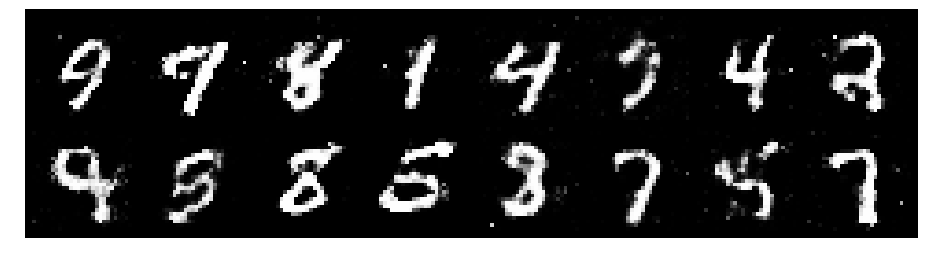

Epoch: [68/200], Batch Num: [500/600]
Discriminator Loss: 1.3038, Generator Loss: 0.8390
D(x): 0.5502, D(G(z)): 0.4673


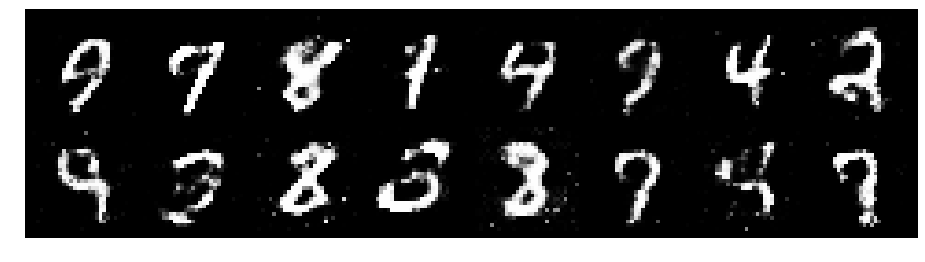

Epoch: [69/200], Batch Num: [0/600]
Discriminator Loss: 1.3872, Generator Loss: 0.7933
D(x): 0.5826, D(G(z)): 0.4874


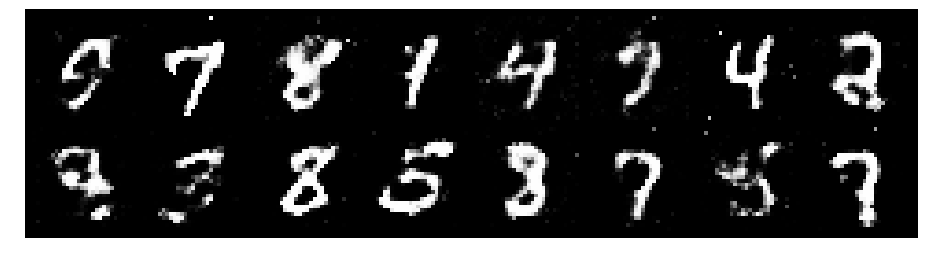

Epoch: [69/200], Batch Num: [100/600]
Discriminator Loss: 1.2578, Generator Loss: 0.9797
D(x): 0.5529, D(G(z)): 0.4187


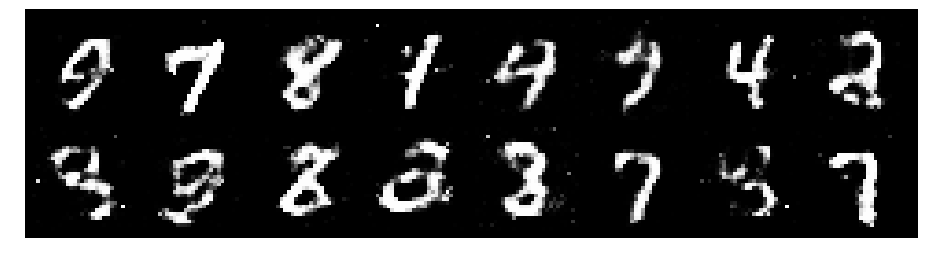

Epoch: [69/200], Batch Num: [200/600]
Discriminator Loss: 1.2316, Generator Loss: 1.0552
D(x): 0.5469, D(G(z)): 0.3813


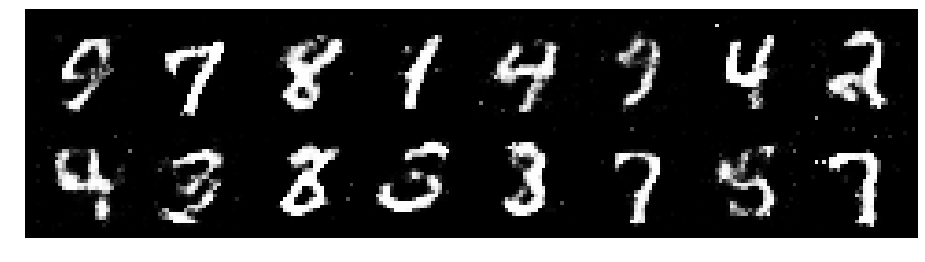

Epoch: [69/200], Batch Num: [300/600]
Discriminator Loss: 1.2270, Generator Loss: 1.1738
D(x): 0.5742, D(G(z)): 0.4079


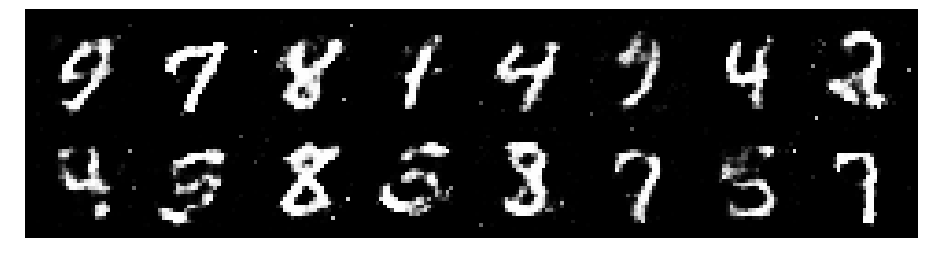

Epoch: [69/200], Batch Num: [400/600]
Discriminator Loss: 1.2724, Generator Loss: 1.1358
D(x): 0.5731, D(G(z)): 0.4310


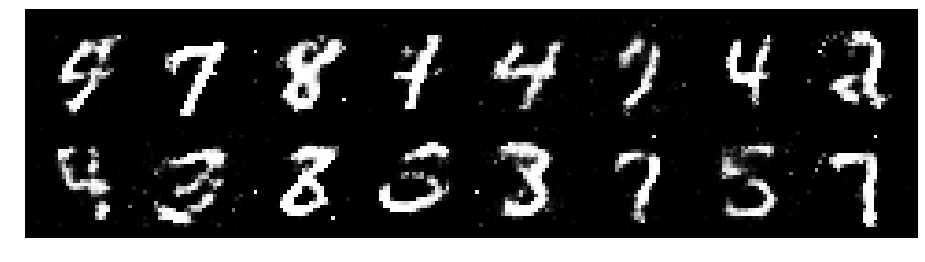

Epoch: [69/200], Batch Num: [500/600]
Discriminator Loss: 1.3650, Generator Loss: 0.8995
D(x): 0.5178, D(G(z)): 0.4254


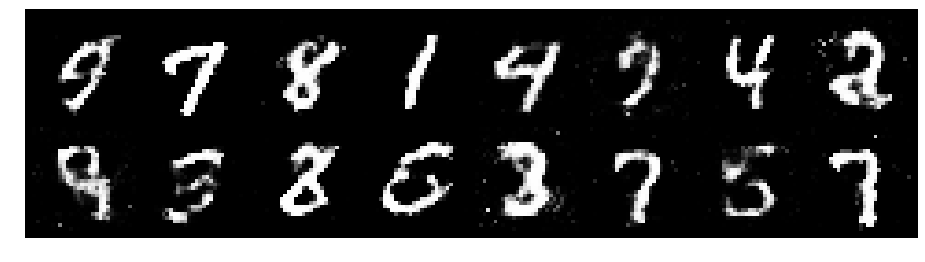

Epoch: [70/200], Batch Num: [0/600]
Discriminator Loss: 1.2273, Generator Loss: 1.0142
D(x): 0.5638, D(G(z)): 0.4166


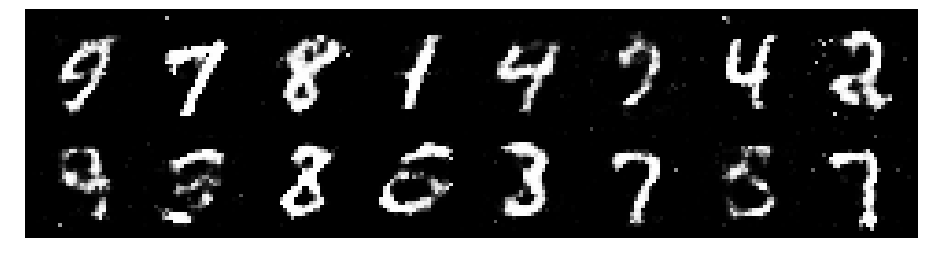

Epoch: [70/200], Batch Num: [100/600]
Discriminator Loss: 1.1596, Generator Loss: 0.9053
D(x): 0.6324, D(G(z)): 0.4503


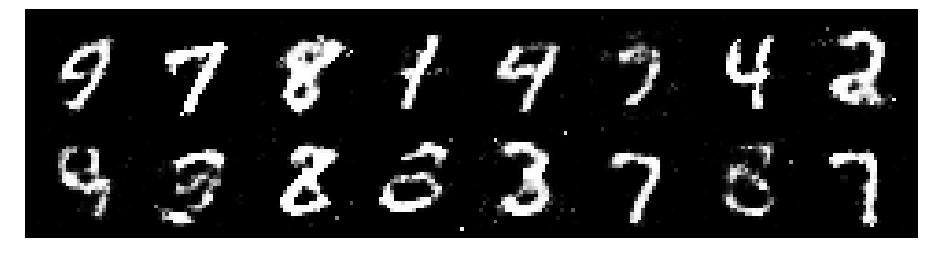

Epoch: [70/200], Batch Num: [200/600]
Discriminator Loss: 1.1548, Generator Loss: 0.9862
D(x): 0.6052, D(G(z)): 0.4140


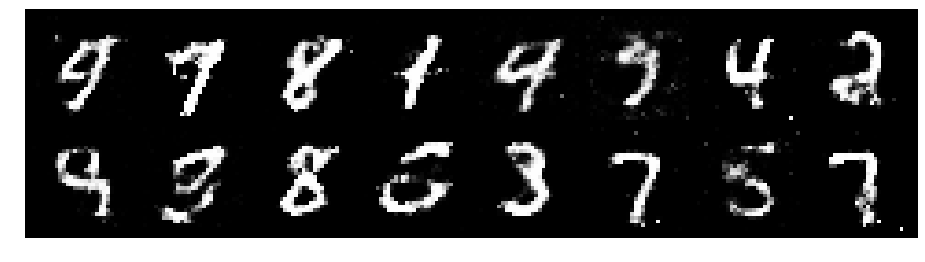

Epoch: [70/200], Batch Num: [300/600]
Discriminator Loss: 1.1678, Generator Loss: 0.9312
D(x): 0.5638, D(G(z)): 0.4106


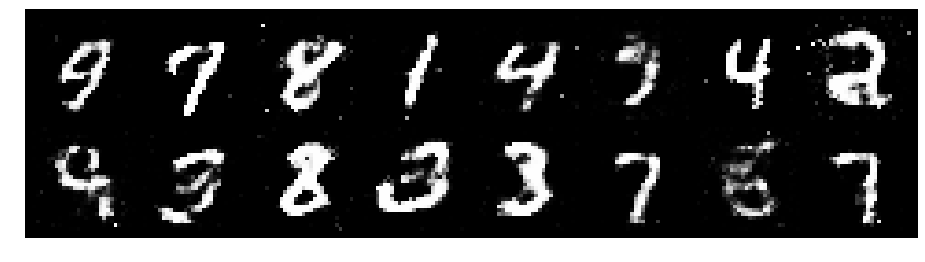

Epoch: [70/200], Batch Num: [400/600]
Discriminator Loss: 1.1984, Generator Loss: 0.8207
D(x): 0.5819, D(G(z)): 0.4459


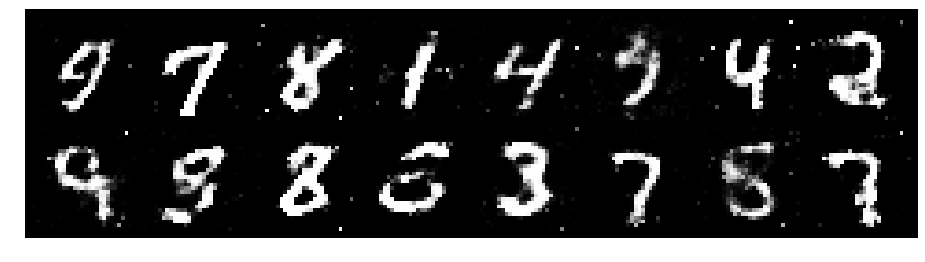

Epoch: [70/200], Batch Num: [500/600]
Discriminator Loss: 1.2384, Generator Loss: 0.9437
D(x): 0.5409, D(G(z)): 0.4246


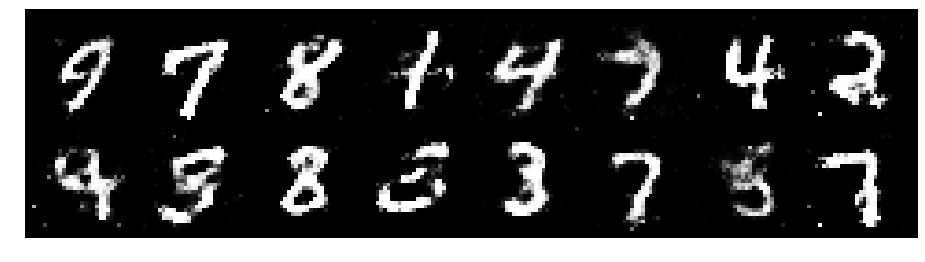

Epoch: [71/200], Batch Num: [0/600]
Discriminator Loss: 1.1956, Generator Loss: 0.9151
D(x): 0.5943, D(G(z)): 0.4404


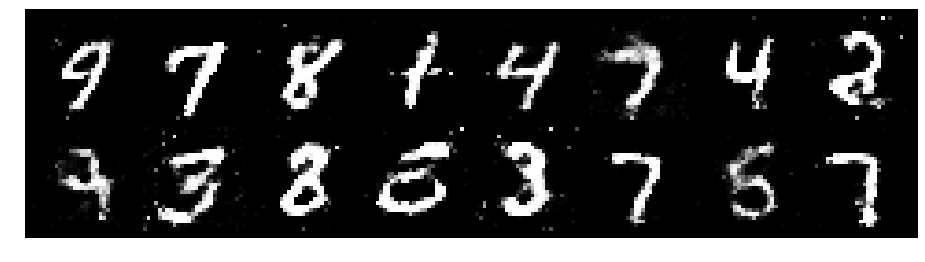

Epoch: [71/200], Batch Num: [100/600]
Discriminator Loss: 1.2871, Generator Loss: 0.8946
D(x): 0.6440, D(G(z)): 0.4941


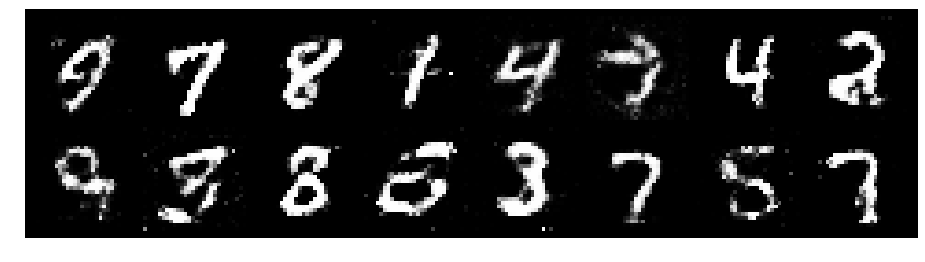

Epoch: [71/200], Batch Num: [200/600]
Discriminator Loss: 1.3058, Generator Loss: 0.8924
D(x): 0.5480, D(G(z)): 0.4628


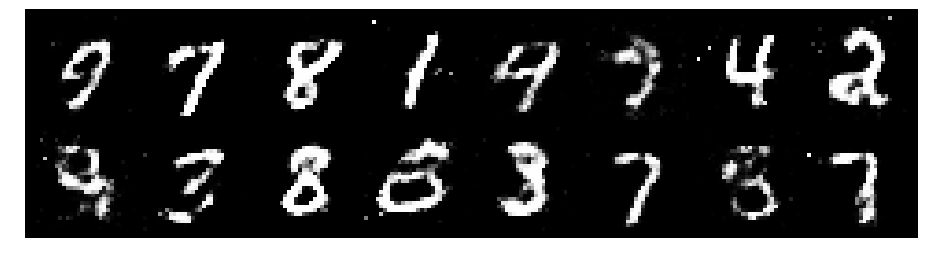

Epoch: [71/200], Batch Num: [300/600]
Discriminator Loss: 1.4281, Generator Loss: 1.2529
D(x): 0.4495, D(G(z)): 0.3256


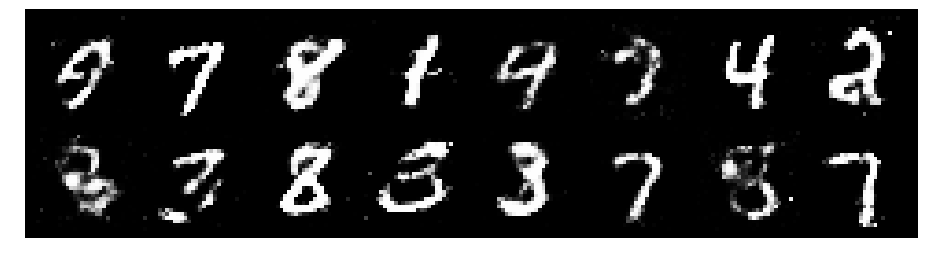

Epoch: [71/200], Batch Num: [400/600]
Discriminator Loss: 1.2299, Generator Loss: 0.9753
D(x): 0.6076, D(G(z)): 0.4392


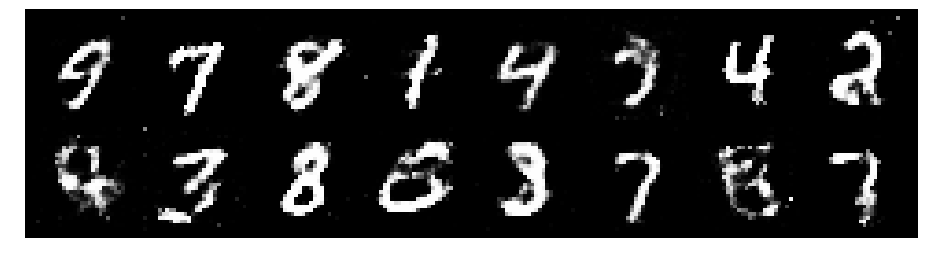

Epoch: [71/200], Batch Num: [500/600]
Discriminator Loss: 1.1180, Generator Loss: 0.8984
D(x): 0.6415, D(G(z)): 0.4489


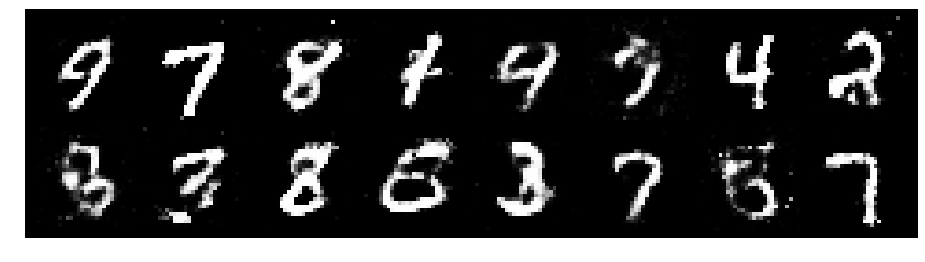

Epoch: [72/200], Batch Num: [0/600]
Discriminator Loss: 1.2966, Generator Loss: 0.9183
D(x): 0.5549, D(G(z)): 0.4303


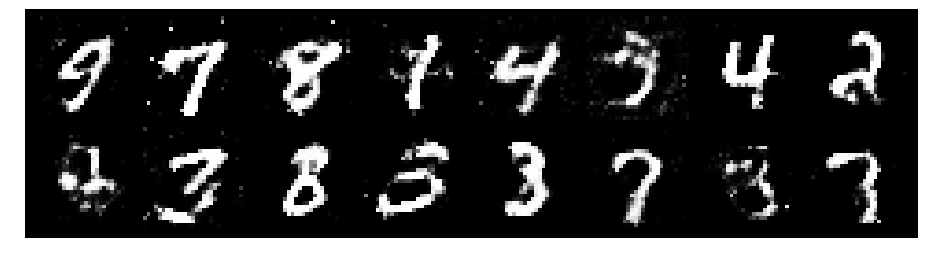

Epoch: [72/200], Batch Num: [100/600]
Discriminator Loss: 1.2468, Generator Loss: 1.0685
D(x): 0.5618, D(G(z)): 0.3954


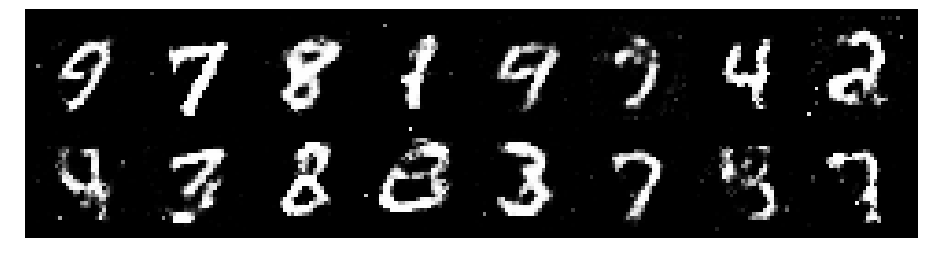

Epoch: [72/200], Batch Num: [200/600]
Discriminator Loss: 1.4351, Generator Loss: 0.7054
D(x): 0.5354, D(G(z)): 0.4889


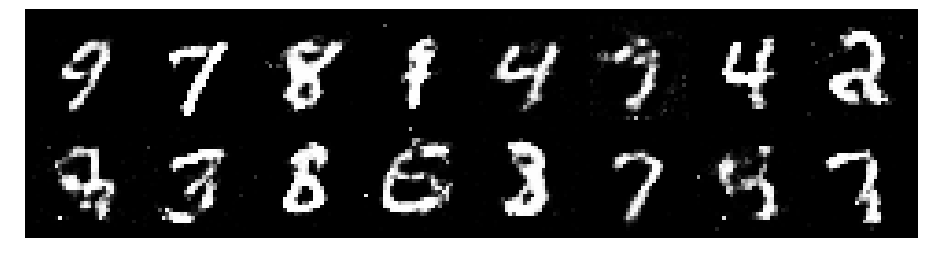

Epoch: [72/200], Batch Num: [300/600]
Discriminator Loss: 1.4618, Generator Loss: 0.8513
D(x): 0.5096, D(G(z)): 0.4793


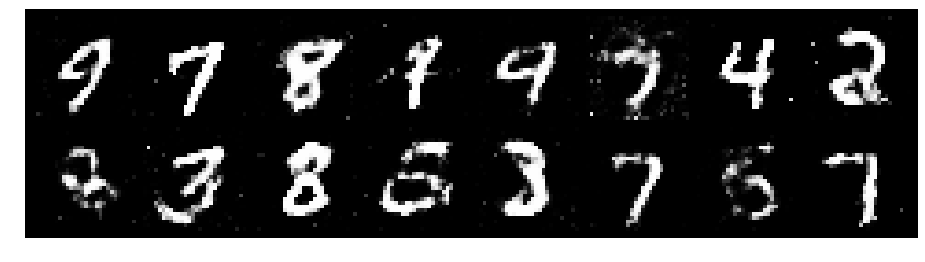

Epoch: [72/200], Batch Num: [400/600]
Discriminator Loss: 1.2446, Generator Loss: 1.0487
D(x): 0.5747, D(G(z)): 0.4099


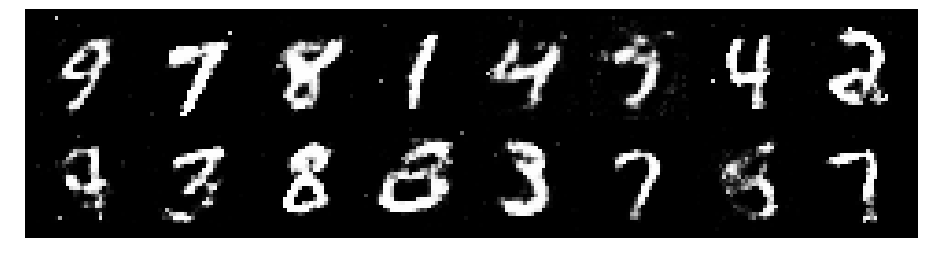

Epoch: [72/200], Batch Num: [500/600]
Discriminator Loss: 1.1410, Generator Loss: 1.0790
D(x): 0.5790, D(G(z)): 0.3745


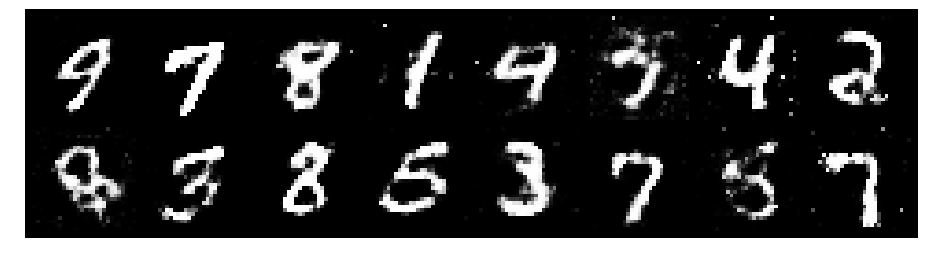

Epoch: [73/200], Batch Num: [0/600]
Discriminator Loss: 1.2810, Generator Loss: 1.0046
D(x): 0.5905, D(G(z)): 0.4250


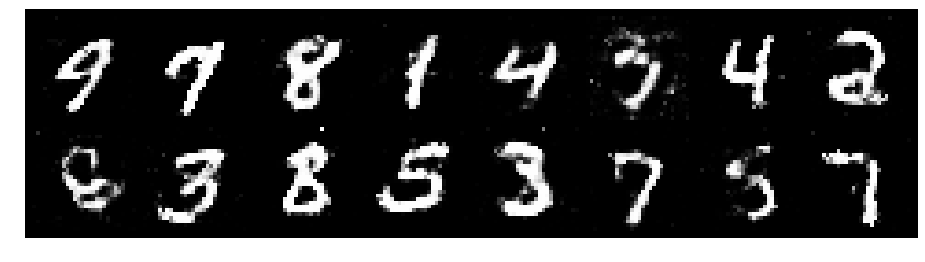

Epoch: [73/200], Batch Num: [100/600]
Discriminator Loss: 1.1017, Generator Loss: 1.0594
D(x): 0.6094, D(G(z)): 0.3928


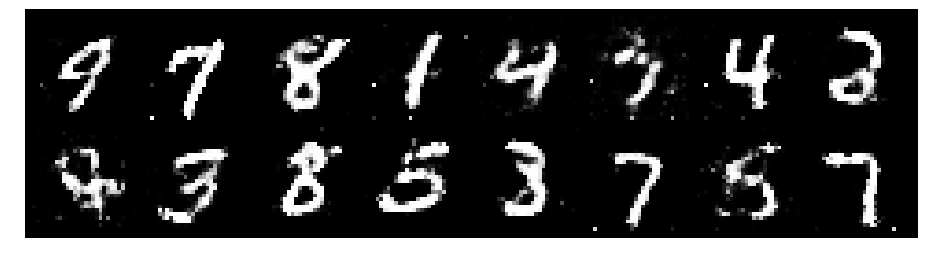

Epoch: [73/200], Batch Num: [200/600]
Discriminator Loss: 1.1358, Generator Loss: 1.1057
D(x): 0.5983, D(G(z)): 0.4018


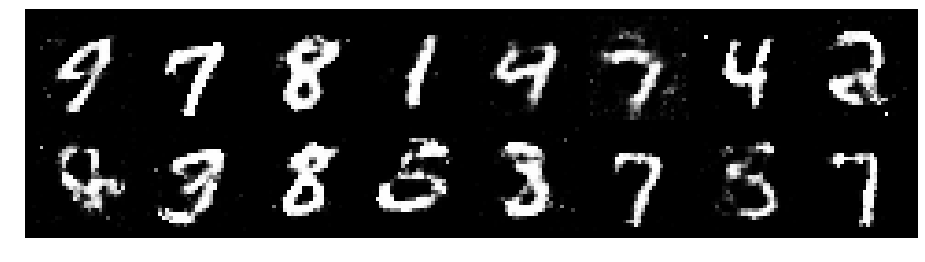

Epoch: [73/200], Batch Num: [300/600]
Discriminator Loss: 1.4501, Generator Loss: 0.8587
D(x): 0.5772, D(G(z)): 0.5170


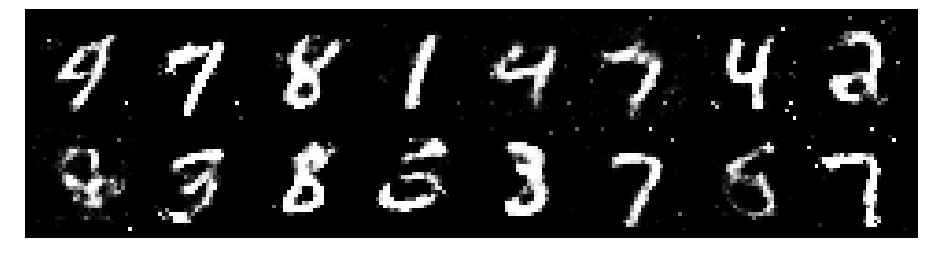

Epoch: [73/200], Batch Num: [400/600]
Discriminator Loss: 1.3665, Generator Loss: 0.9324
D(x): 0.5860, D(G(z)): 0.4790


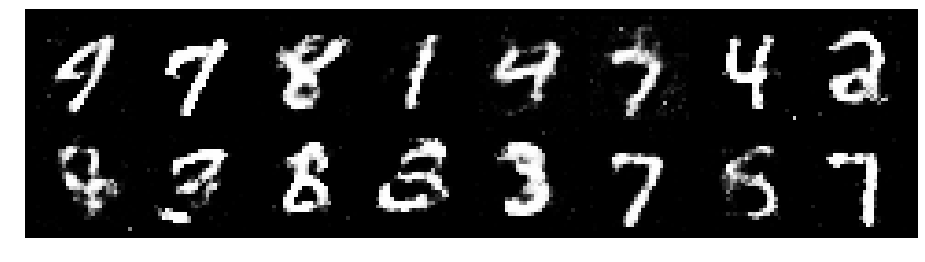

Epoch: [73/200], Batch Num: [500/600]
Discriminator Loss: 1.3834, Generator Loss: 0.8951
D(x): 0.5654, D(G(z)): 0.4787


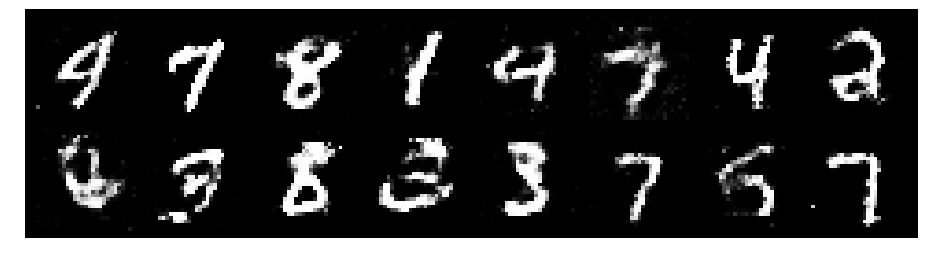

Epoch: [74/200], Batch Num: [0/600]
Discriminator Loss: 1.3029, Generator Loss: 0.8890
D(x): 0.5577, D(G(z)): 0.4544


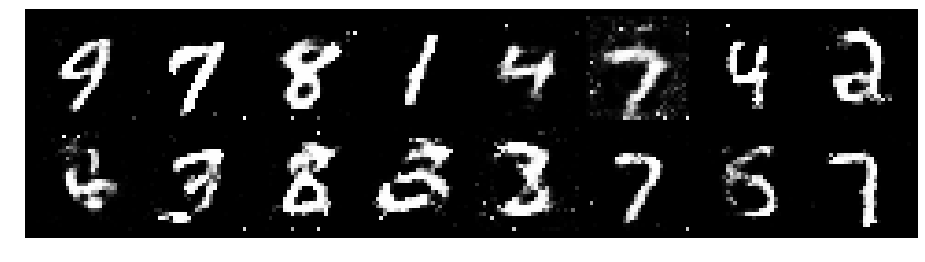

Epoch: [74/200], Batch Num: [100/600]
Discriminator Loss: 1.2923, Generator Loss: 0.9199
D(x): 0.5597, D(G(z)): 0.4686


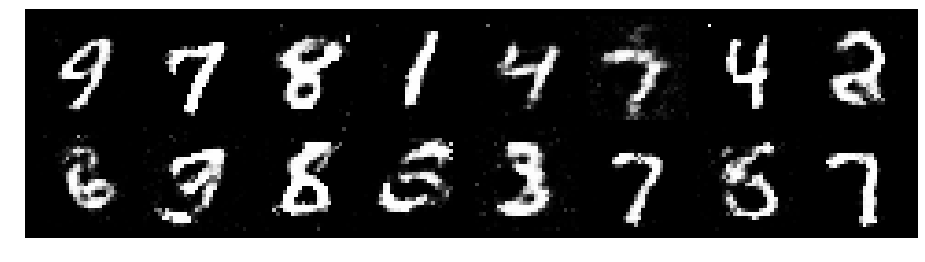

Epoch: [74/200], Batch Num: [200/600]
Discriminator Loss: 1.2513, Generator Loss: 0.8627
D(x): 0.5884, D(G(z)): 0.4622


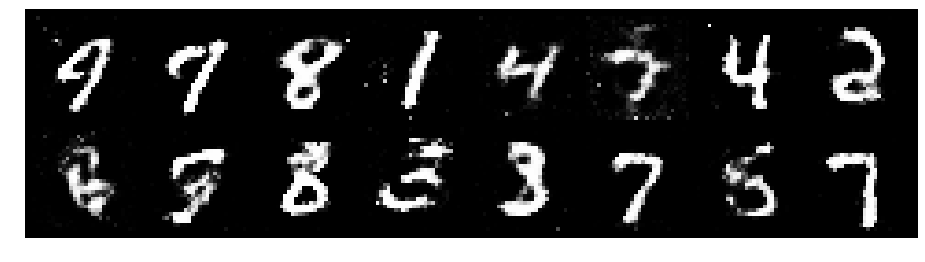

Epoch: [74/200], Batch Num: [300/600]
Discriminator Loss: 1.3525, Generator Loss: 0.7916
D(x): 0.5338, D(G(z)): 0.4780


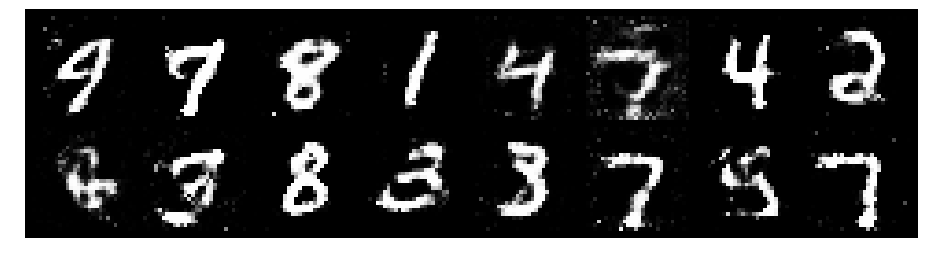

Epoch: [74/200], Batch Num: [400/600]
Discriminator Loss: 1.2915, Generator Loss: 1.0218
D(x): 0.5274, D(G(z)): 0.4113


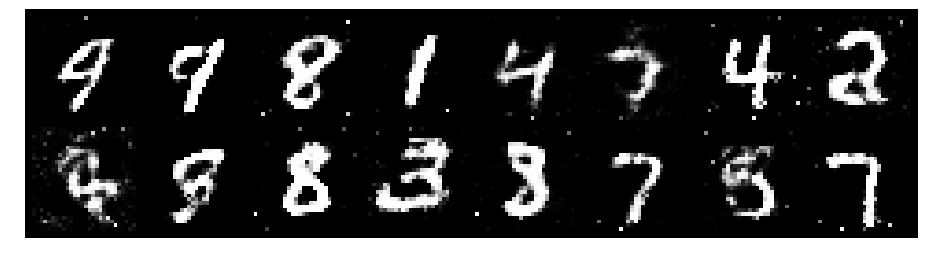

Epoch: [74/200], Batch Num: [500/600]
Discriminator Loss: 1.2534, Generator Loss: 0.9263
D(x): 0.5856, D(G(z)): 0.4522


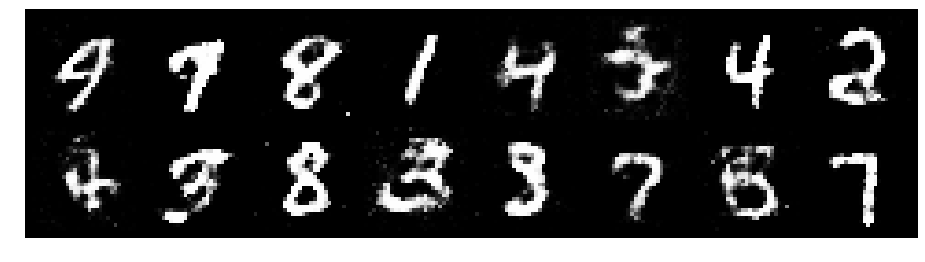

Epoch: [75/200], Batch Num: [0/600]
Discriminator Loss: 1.2472, Generator Loss: 0.8911
D(x): 0.5785, D(G(z)): 0.4353


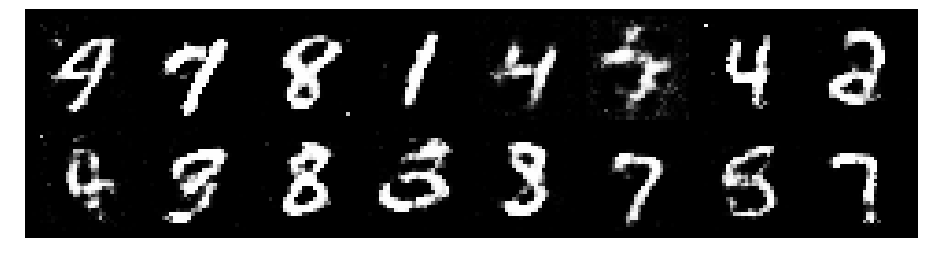

Epoch: [75/200], Batch Num: [100/600]
Discriminator Loss: 1.3172, Generator Loss: 0.9330
D(x): 0.5782, D(G(z)): 0.4818


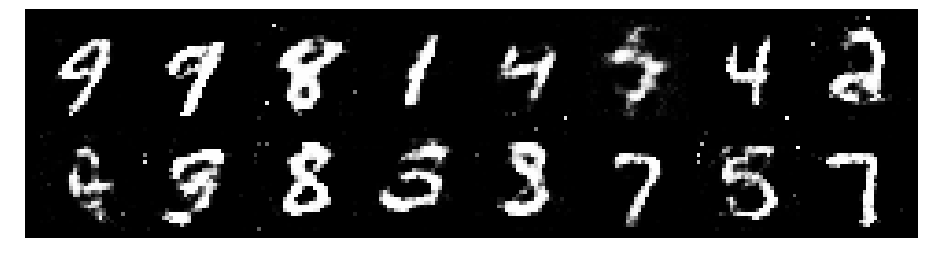

Epoch: [75/200], Batch Num: [200/600]
Discriminator Loss: 1.1777, Generator Loss: 0.9110
D(x): 0.5804, D(G(z)): 0.4165


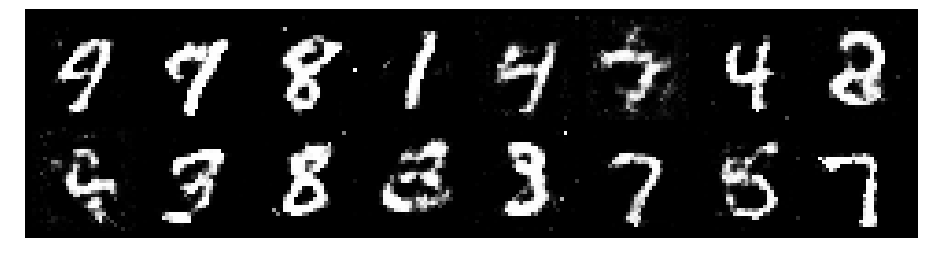

Epoch: [75/200], Batch Num: [300/600]
Discriminator Loss: 1.2653, Generator Loss: 0.9032
D(x): 0.5655, D(G(z)): 0.4319


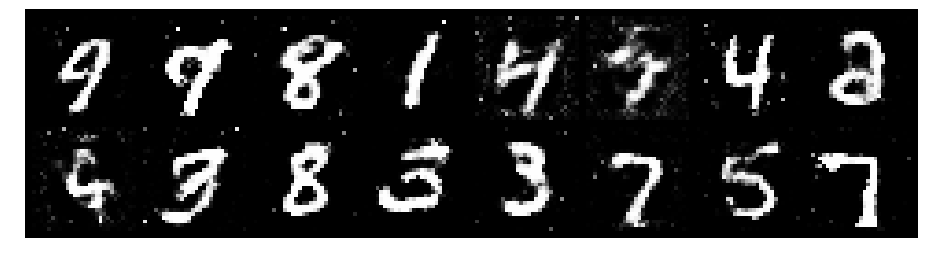

Epoch: [75/200], Batch Num: [400/600]
Discriminator Loss: 1.3127, Generator Loss: 0.8289
D(x): 0.5646, D(G(z)): 0.4819


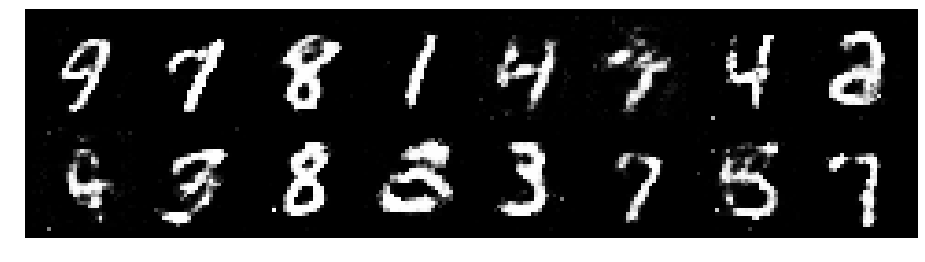

Epoch: [75/200], Batch Num: [500/600]
Discriminator Loss: 1.2978, Generator Loss: 0.9343
D(x): 0.5598, D(G(z)): 0.4494


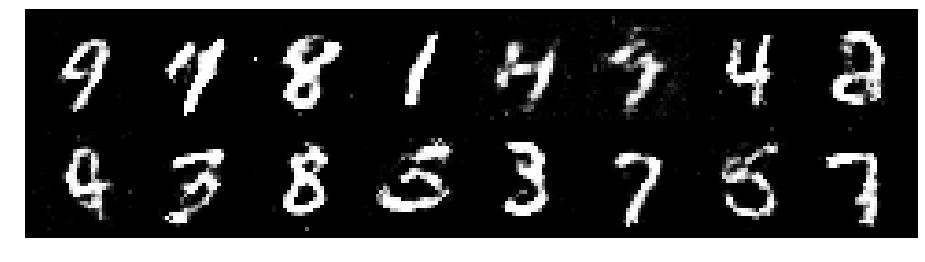

Epoch: [76/200], Batch Num: [0/600]
Discriminator Loss: 1.3807, Generator Loss: 1.1619
D(x): 0.4912, D(G(z)): 0.3810


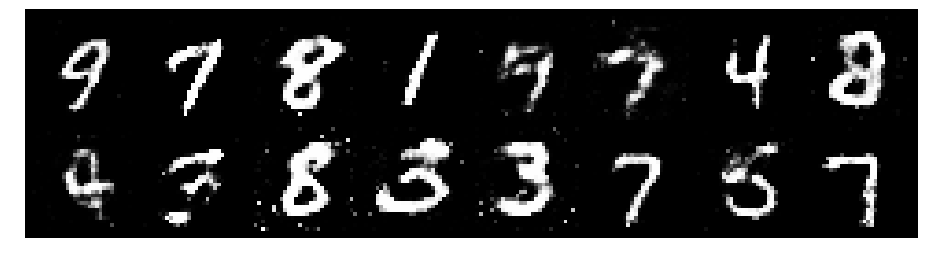

Epoch: [76/200], Batch Num: [100/600]
Discriminator Loss: 1.3808, Generator Loss: 0.9918
D(x): 0.5576, D(G(z)): 0.4403


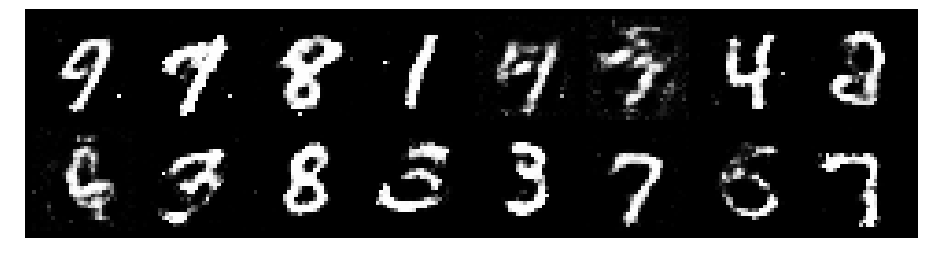

Epoch: [76/200], Batch Num: [200/600]
Discriminator Loss: 1.2021, Generator Loss: 1.0504
D(x): 0.6449, D(G(z)): 0.4415


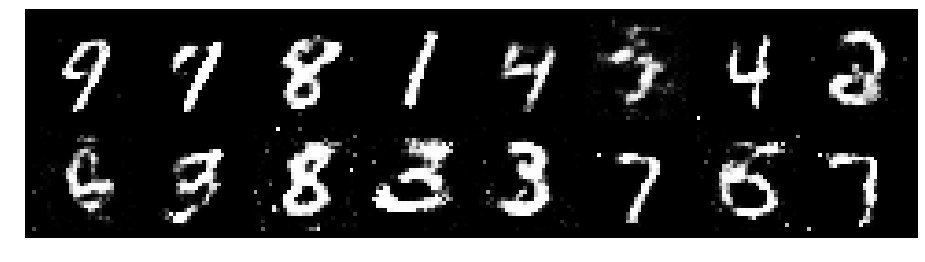

Epoch: [76/200], Batch Num: [300/600]
Discriminator Loss: 1.1365, Generator Loss: 1.0658
D(x): 0.6037, D(G(z)): 0.4035


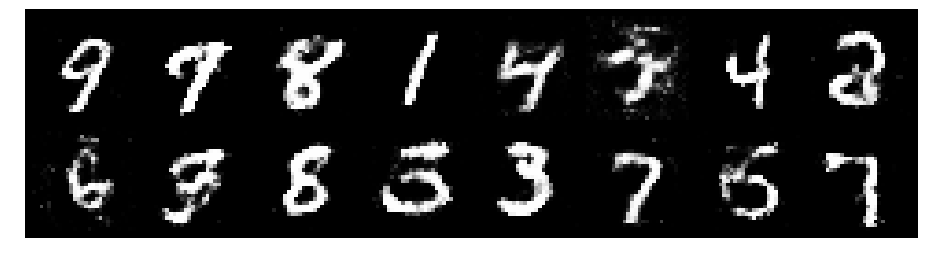

Epoch: [76/200], Batch Num: [400/600]
Discriminator Loss: 1.0924, Generator Loss: 1.0297
D(x): 0.5963, D(G(z)): 0.3984


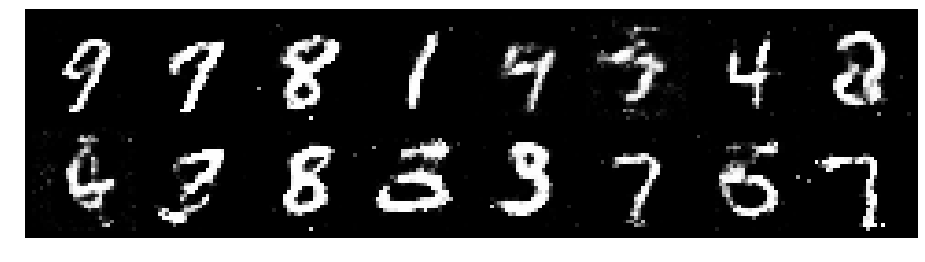

Epoch: [76/200], Batch Num: [500/600]
Discriminator Loss: 1.1470, Generator Loss: 0.9872
D(x): 0.5637, D(G(z)): 0.3916


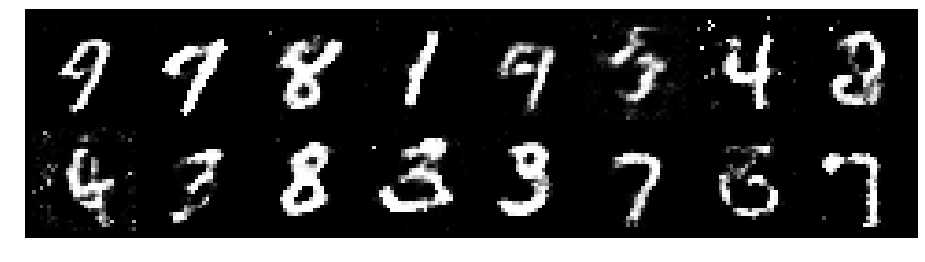

Epoch: [77/200], Batch Num: [0/600]
Discriminator Loss: 1.3389, Generator Loss: 0.9743
D(x): 0.5021, D(G(z)): 0.4144


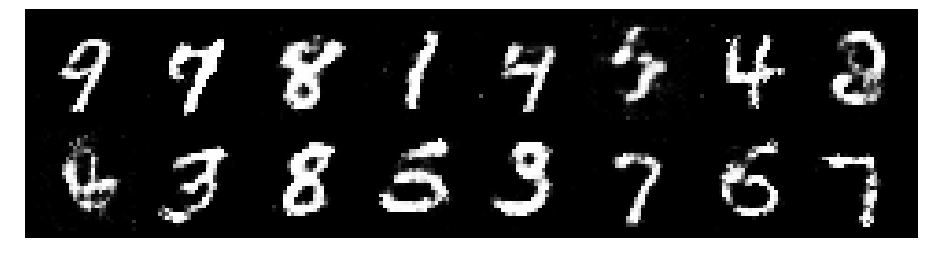

Epoch: [77/200], Batch Num: [100/600]
Discriminator Loss: 1.2924, Generator Loss: 0.7866
D(x): 0.5410, D(G(z)): 0.4651


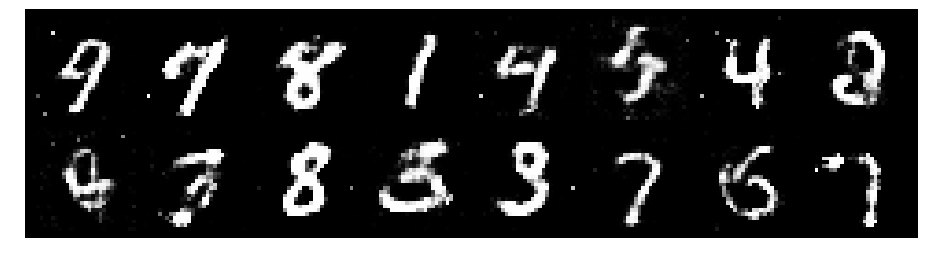

Epoch: [77/200], Batch Num: [200/600]
Discriminator Loss: 1.2585, Generator Loss: 1.1632
D(x): 0.5293, D(G(z)): 0.3707


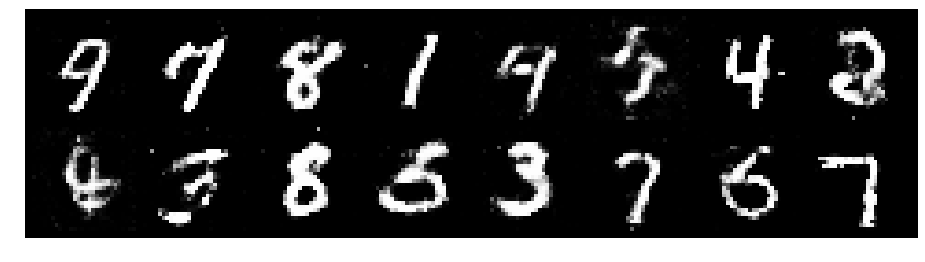

Epoch: [77/200], Batch Num: [300/600]
Discriminator Loss: 1.1074, Generator Loss: 0.9067
D(x): 0.6049, D(G(z)): 0.3757


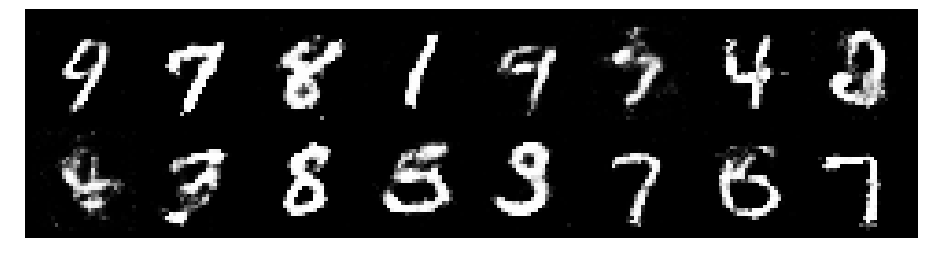

Epoch: [77/200], Batch Num: [400/600]
Discriminator Loss: 1.1774, Generator Loss: 0.9603
D(x): 0.6696, D(G(z)): 0.4862


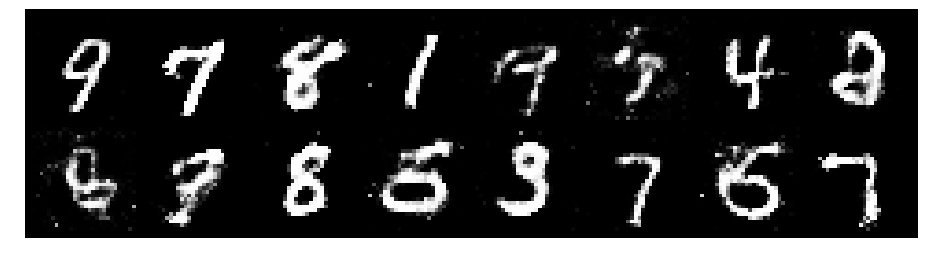

Epoch: [77/200], Batch Num: [500/600]
Discriminator Loss: 1.2287, Generator Loss: 1.0796
D(x): 0.5974, D(G(z)): 0.4162


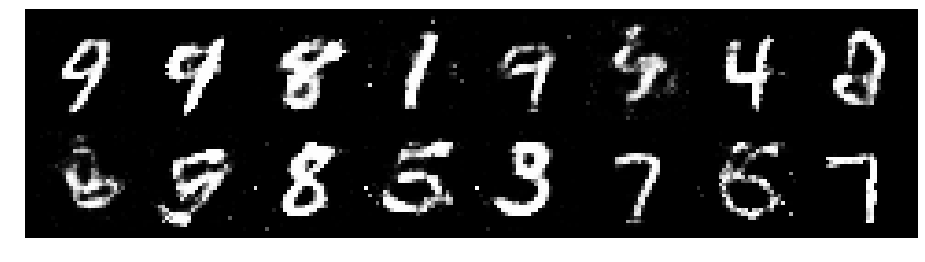

Epoch: [78/200], Batch Num: [0/600]
Discriminator Loss: 1.2243, Generator Loss: 1.0210
D(x): 0.5639, D(G(z)): 0.4206


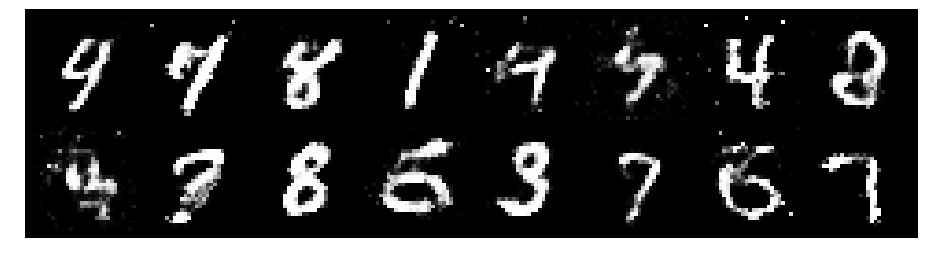

Epoch: [78/200], Batch Num: [100/600]
Discriminator Loss: 1.2959, Generator Loss: 0.8478
D(x): 0.5696, D(G(z)): 0.4767


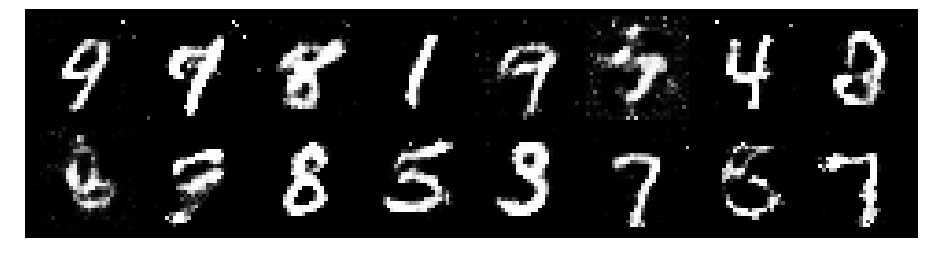

Epoch: [78/200], Batch Num: [200/600]
Discriminator Loss: 1.2350, Generator Loss: 0.8930
D(x): 0.5732, D(G(z)): 0.4391


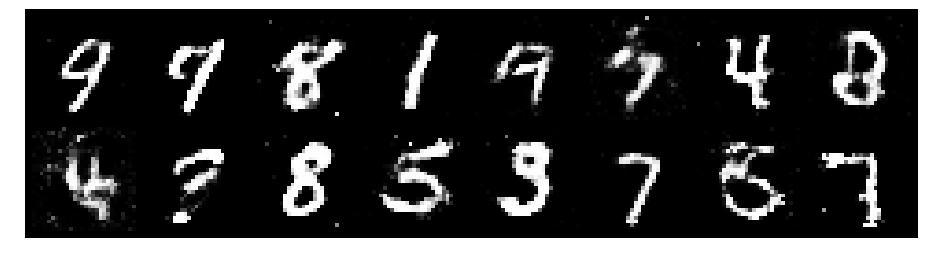

Epoch: [78/200], Batch Num: [300/600]
Discriminator Loss: 1.3176, Generator Loss: 0.8492
D(x): 0.6066, D(G(z)): 0.4896


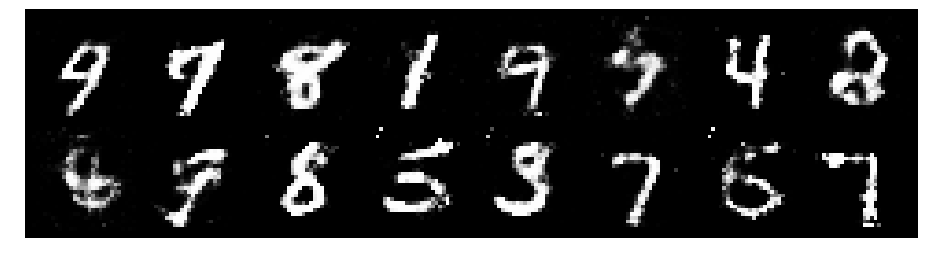

Epoch: [78/200], Batch Num: [400/600]
Discriminator Loss: 1.2790, Generator Loss: 0.8412
D(x): 0.5717, D(G(z)): 0.4700


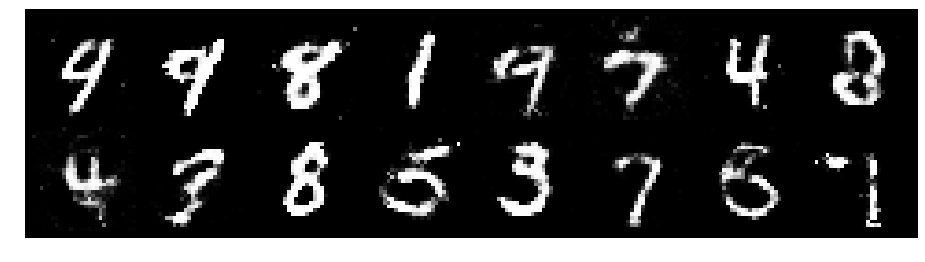

Epoch: [78/200], Batch Num: [500/600]
Discriminator Loss: 1.2881, Generator Loss: 0.8572
D(x): 0.6112, D(G(z)): 0.4726


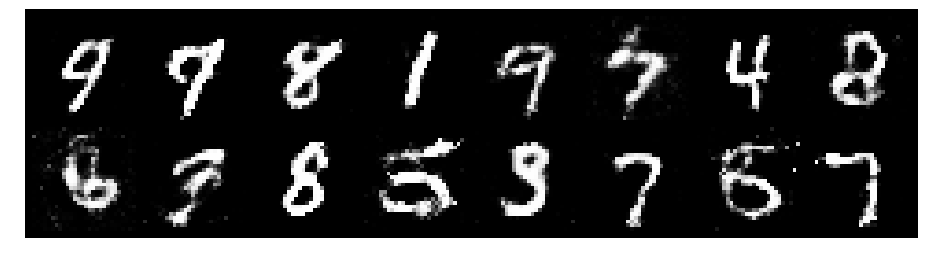

Epoch: [79/200], Batch Num: [0/600]
Discriminator Loss: 1.2239, Generator Loss: 0.9279
D(x): 0.6132, D(G(z)): 0.4380


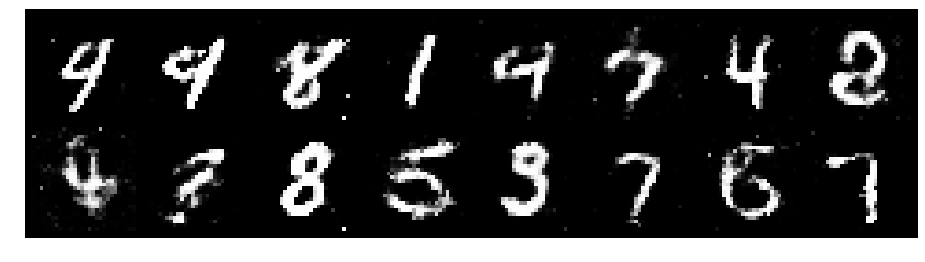

Epoch: [79/200], Batch Num: [100/600]
Discriminator Loss: 1.2153, Generator Loss: 1.0078
D(x): 0.5977, D(G(z)): 0.4275


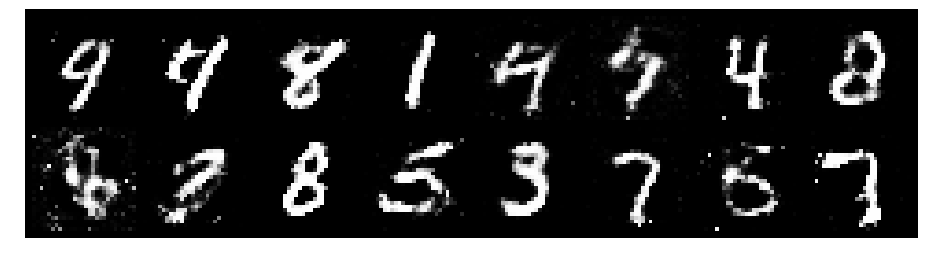

Epoch: [79/200], Batch Num: [200/600]
Discriminator Loss: 1.2395, Generator Loss: 1.0376
D(x): 0.5039, D(G(z)): 0.3694


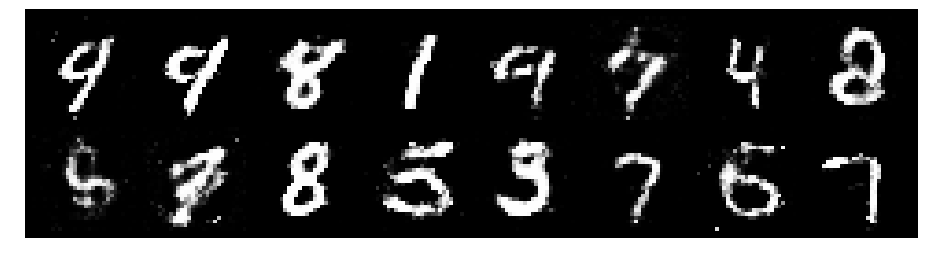

Epoch: [79/200], Batch Num: [300/600]
Discriminator Loss: 1.1505, Generator Loss: 1.2433
D(x): 0.5804, D(G(z)): 0.3600


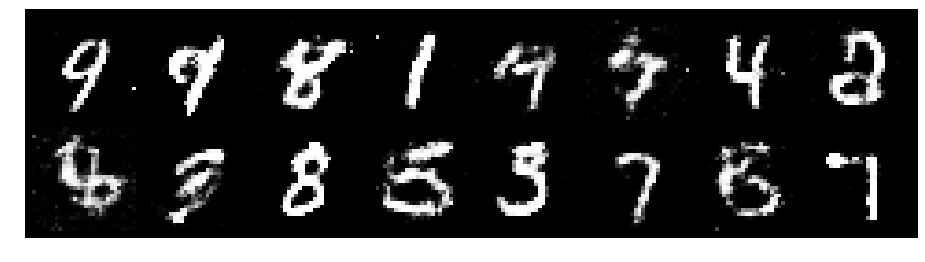

Epoch: [79/200], Batch Num: [400/600]
Discriminator Loss: 1.1361, Generator Loss: 0.8535
D(x): 0.6256, D(G(z)): 0.4446


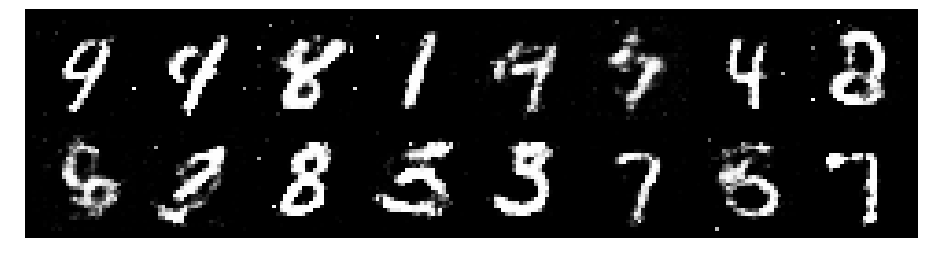

Epoch: [79/200], Batch Num: [500/600]
Discriminator Loss: 1.2376, Generator Loss: 0.8865
D(x): 0.5906, D(G(z)): 0.4395


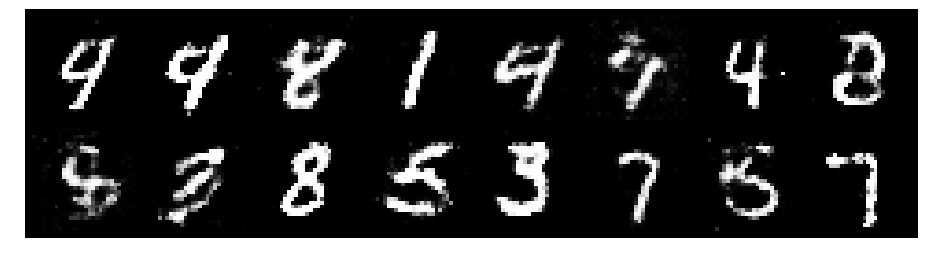

Epoch: [80/200], Batch Num: [0/600]
Discriminator Loss: 1.3127, Generator Loss: 0.9898
D(x): 0.5601, D(G(z)): 0.4135


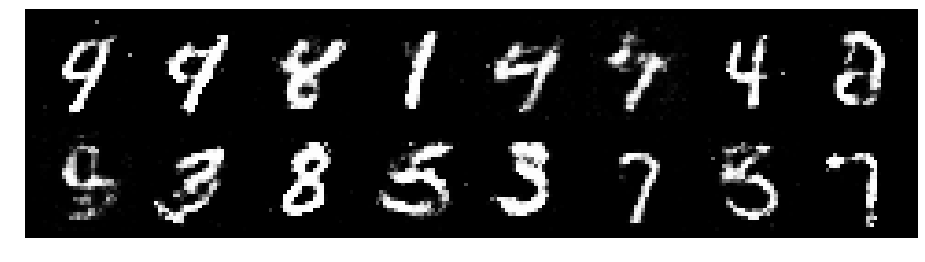

Epoch: [80/200], Batch Num: [100/600]
Discriminator Loss: 1.2975, Generator Loss: 0.7496
D(x): 0.6447, D(G(z)): 0.5245


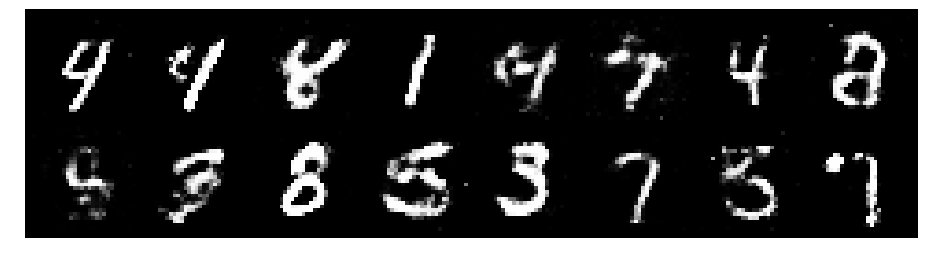

Epoch: [80/200], Batch Num: [200/600]
Discriminator Loss: 1.1680, Generator Loss: 1.0958
D(x): 0.5685, D(G(z)): 0.3818


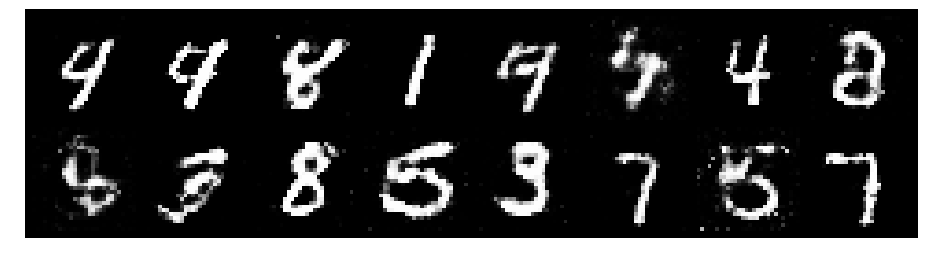

Epoch: [80/200], Batch Num: [300/600]
Discriminator Loss: 1.3145, Generator Loss: 1.1126
D(x): 0.5570, D(G(z)): 0.4402


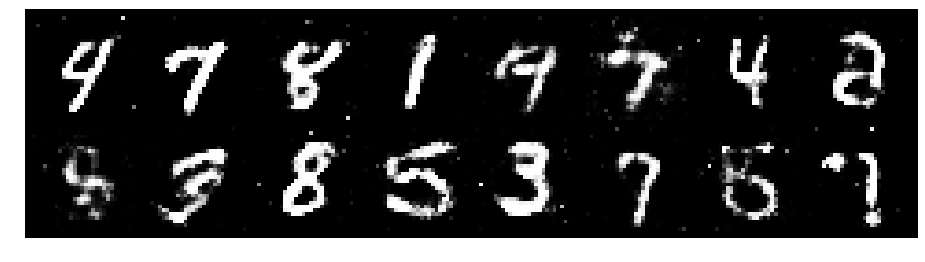

Epoch: [80/200], Batch Num: [400/600]
Discriminator Loss: 1.2197, Generator Loss: 0.9018
D(x): 0.5670, D(G(z)): 0.4023


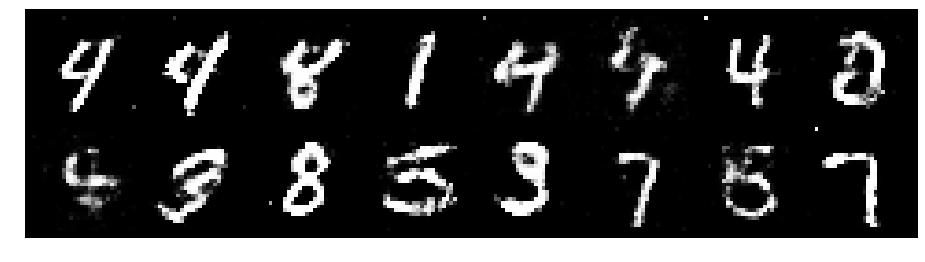

Epoch: [80/200], Batch Num: [500/600]
Discriminator Loss: 1.0950, Generator Loss: 1.0704
D(x): 0.6057, D(G(z)): 0.3853


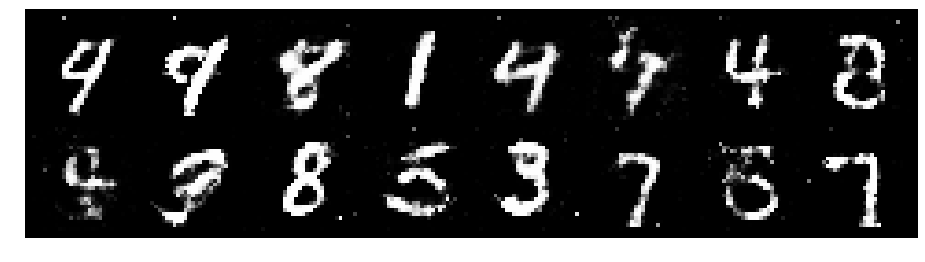

Epoch: [81/200], Batch Num: [0/600]
Discriminator Loss: 1.2062, Generator Loss: 1.0378
D(x): 0.5695, D(G(z)): 0.3975


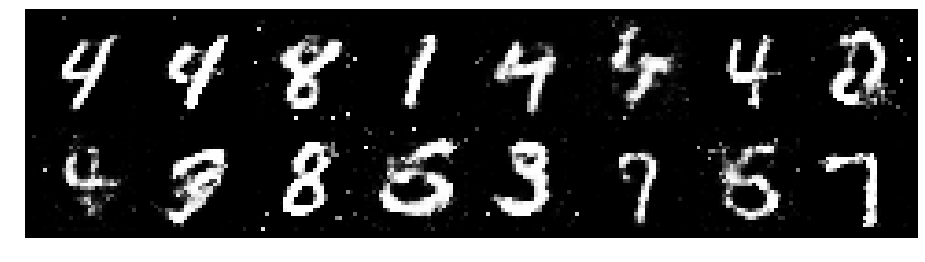

Epoch: [81/200], Batch Num: [100/600]
Discriminator Loss: 1.2512, Generator Loss: 1.1537
D(x): 0.5345, D(G(z)): 0.3951


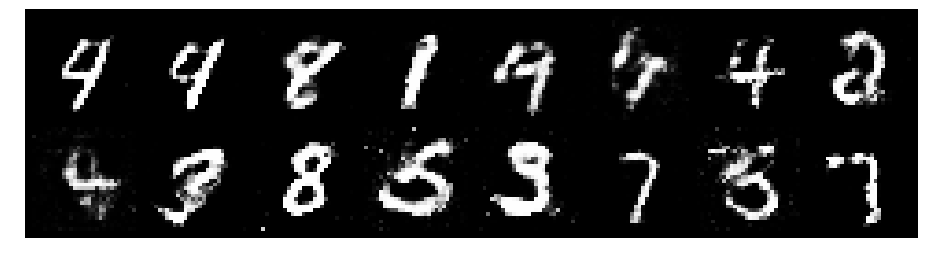

Epoch: [81/200], Batch Num: [200/600]
Discriminator Loss: 1.2614, Generator Loss: 0.9829
D(x): 0.5182, D(G(z)): 0.3952


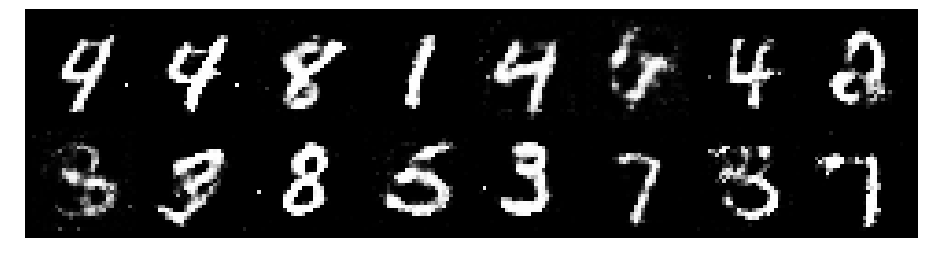

Epoch: [81/200], Batch Num: [300/600]
Discriminator Loss: 1.2660, Generator Loss: 0.7908
D(x): 0.5747, D(G(z)): 0.4695


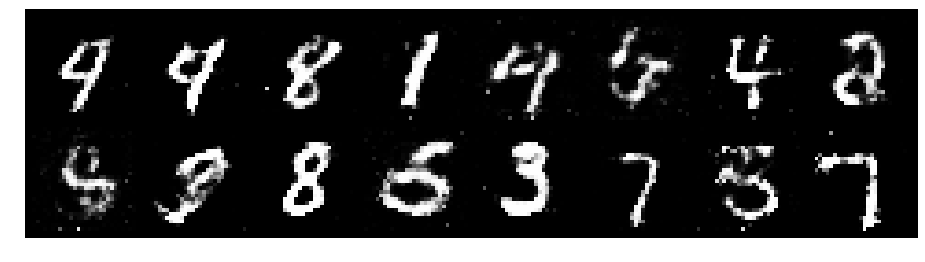

Epoch: [81/200], Batch Num: [400/600]
Discriminator Loss: 1.3425, Generator Loss: 0.7257
D(x): 0.5733, D(G(z)): 0.4990


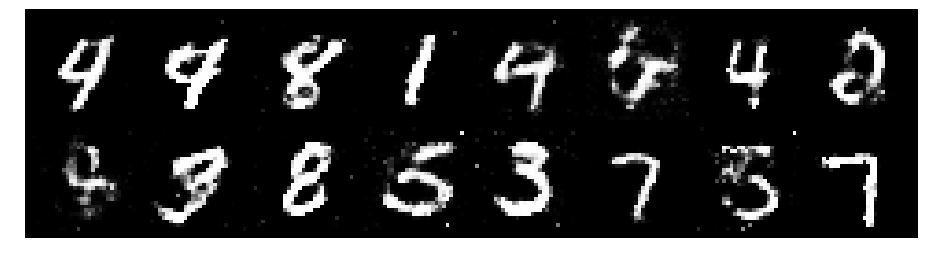

Epoch: [81/200], Batch Num: [500/600]
Discriminator Loss: 1.3225, Generator Loss: 0.9694
D(x): 0.5530, D(G(z)): 0.4359


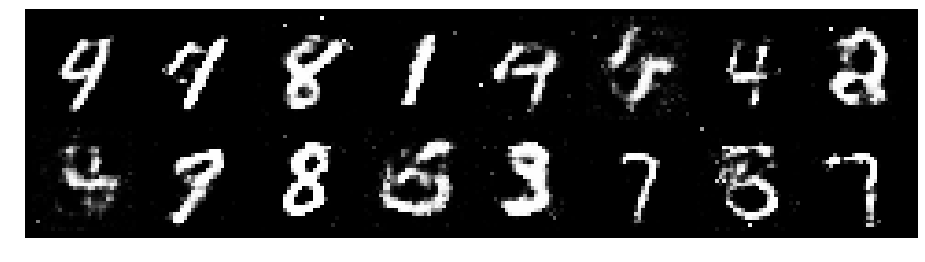

Epoch: [82/200], Batch Num: [0/600]
Discriminator Loss: 1.1424, Generator Loss: 1.0977
D(x): 0.5904, D(G(z)): 0.3694


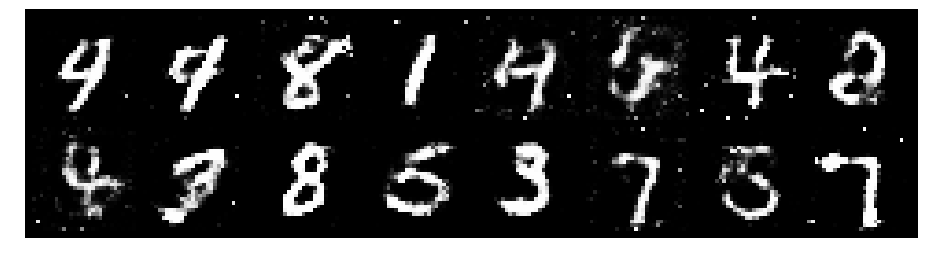

Epoch: [82/200], Batch Num: [100/600]
Discriminator Loss: 1.0230, Generator Loss: 1.1538
D(x): 0.6446, D(G(z)): 0.3832


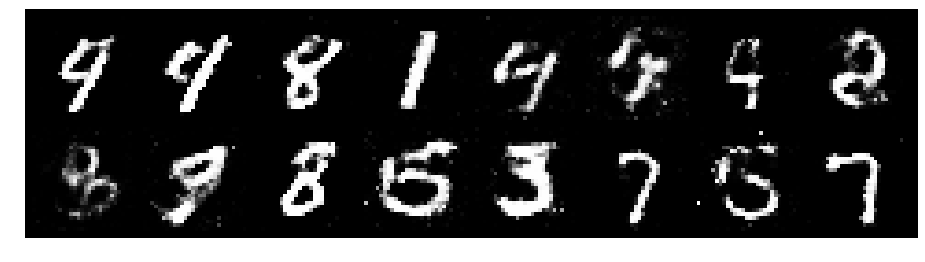

Epoch: [82/200], Batch Num: [200/600]
Discriminator Loss: 1.1124, Generator Loss: 1.2402
D(x): 0.6010, D(G(z)): 0.3920


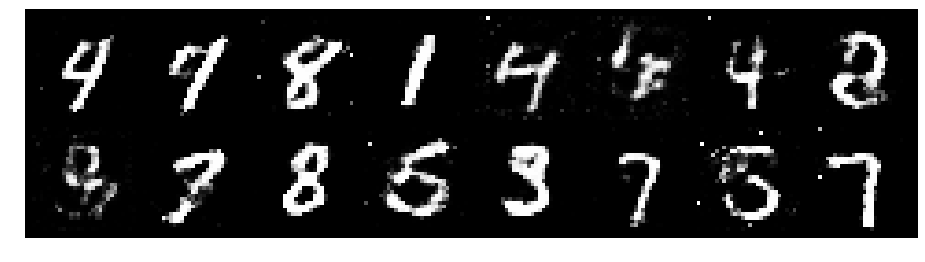

Epoch: [82/200], Batch Num: [300/600]
Discriminator Loss: 1.2811, Generator Loss: 0.9604
D(x): 0.5656, D(G(z)): 0.4392


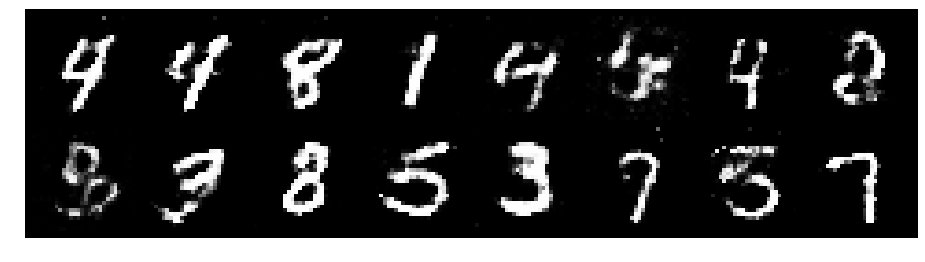

Epoch: [82/200], Batch Num: [400/600]
Discriminator Loss: 1.2137, Generator Loss: 0.9261
D(x): 0.5544, D(G(z)): 0.4242


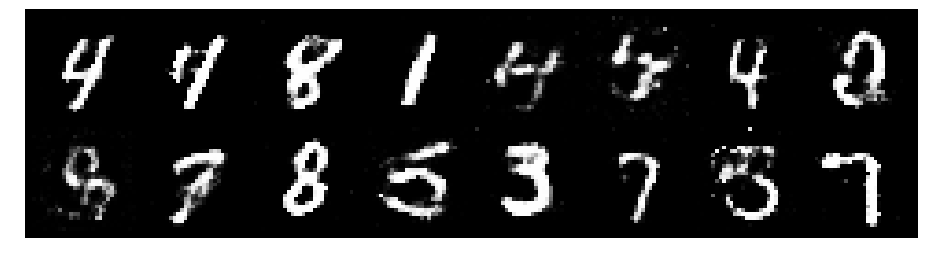

Epoch: [82/200], Batch Num: [500/600]
Discriminator Loss: 1.2304, Generator Loss: 0.9281
D(x): 0.5759, D(G(z)): 0.4409


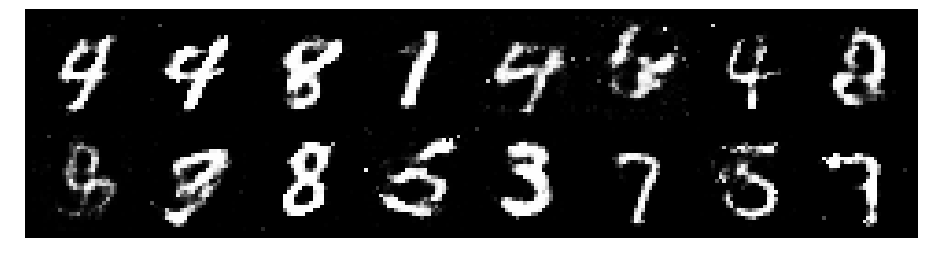

Epoch: [83/200], Batch Num: [0/600]
Discriminator Loss: 1.2585, Generator Loss: 0.9315
D(x): 0.5971, D(G(z)): 0.4576


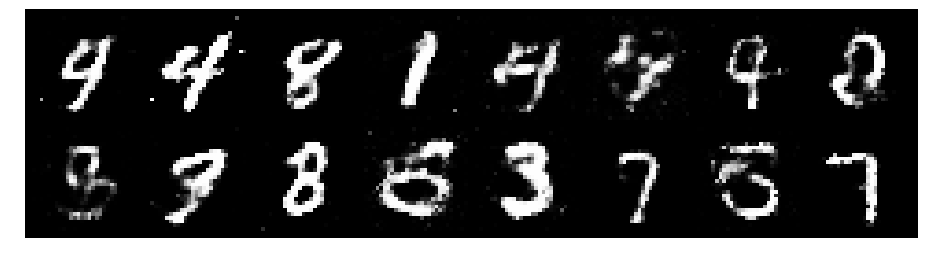

Epoch: [83/200], Batch Num: [100/600]
Discriminator Loss: 1.2341, Generator Loss: 0.7078
D(x): 0.6083, D(G(z)): 0.4441


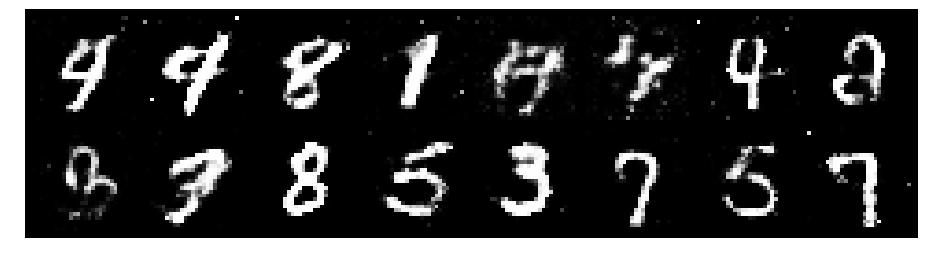

Epoch: [83/200], Batch Num: [200/600]
Discriminator Loss: 1.3523, Generator Loss: 0.9708
D(x): 0.5981, D(G(z)): 0.4822


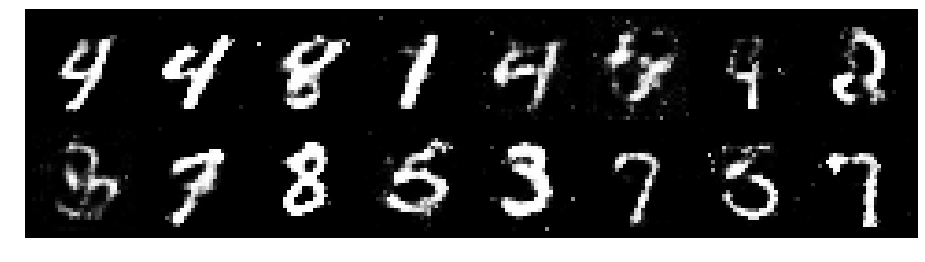

Epoch: [83/200], Batch Num: [300/600]
Discriminator Loss: 1.2644, Generator Loss: 1.0034
D(x): 0.5941, D(G(z)): 0.4289


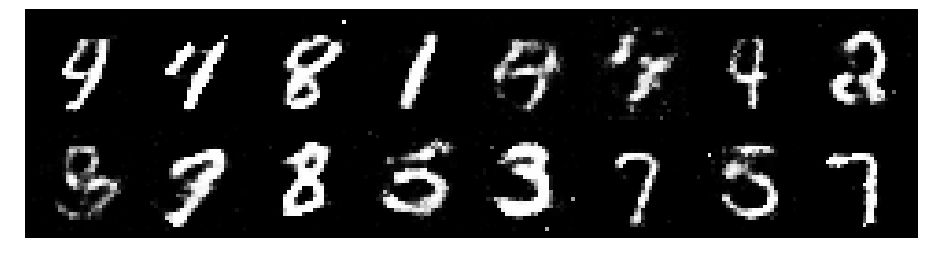

Epoch: [83/200], Batch Num: [400/600]
Discriminator Loss: 1.3180, Generator Loss: 1.1717
D(x): 0.6027, D(G(z)): 0.4565


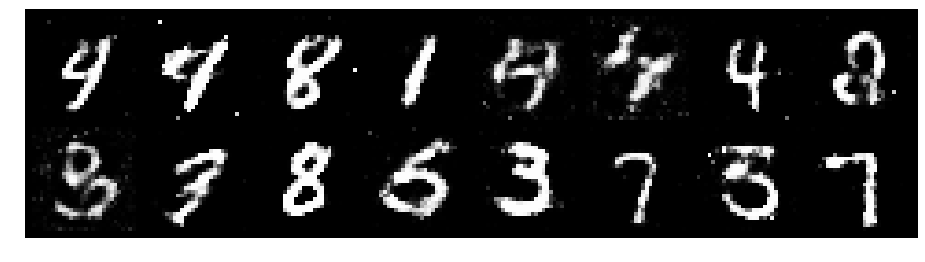

Epoch: [83/200], Batch Num: [500/600]
Discriminator Loss: 1.2168, Generator Loss: 0.9055
D(x): 0.5673, D(G(z)): 0.4182


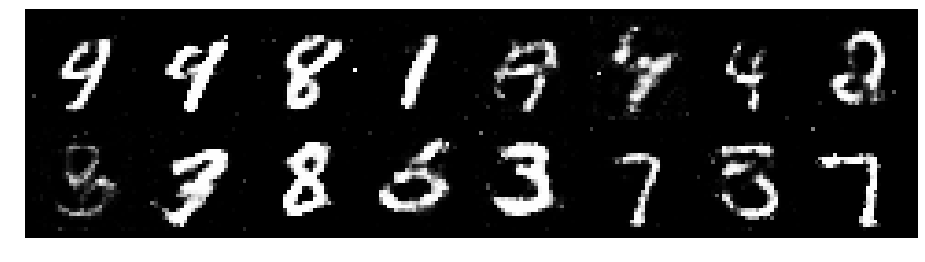

Epoch: [84/200], Batch Num: [0/600]
Discriminator Loss: 1.3834, Generator Loss: 0.8937
D(x): 0.5591, D(G(z)): 0.4926


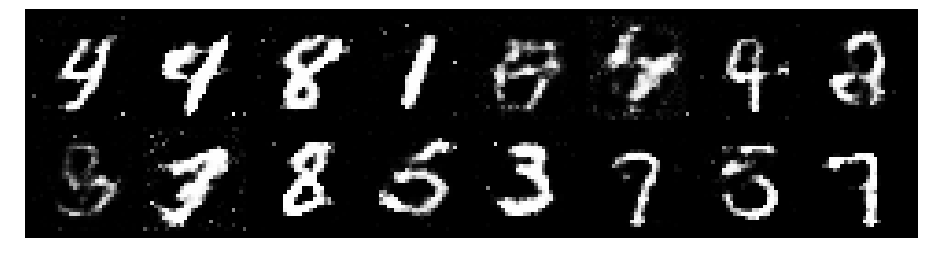

Epoch: [84/200], Batch Num: [100/600]
Discriminator Loss: 1.2710, Generator Loss: 0.9755
D(x): 0.5211, D(G(z)): 0.3960


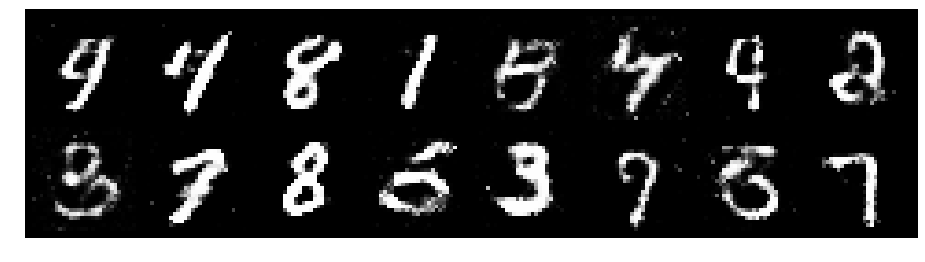

Epoch: [84/200], Batch Num: [200/600]
Discriminator Loss: 1.2974, Generator Loss: 0.9285
D(x): 0.5244, D(G(z)): 0.4387


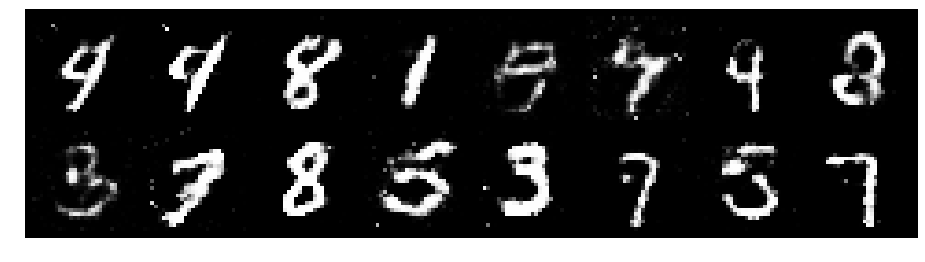

Epoch: [84/200], Batch Num: [300/600]
Discriminator Loss: 1.2063, Generator Loss: 0.7672
D(x): 0.5932, D(G(z)): 0.4524


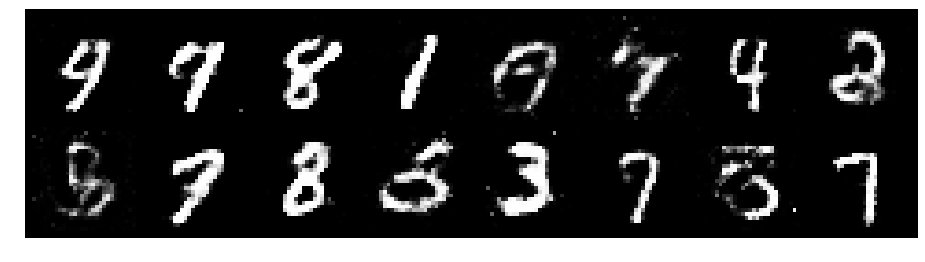

Epoch: [84/200], Batch Num: [400/600]
Discriminator Loss: 1.1622, Generator Loss: 0.8733
D(x): 0.6130, D(G(z)): 0.4373


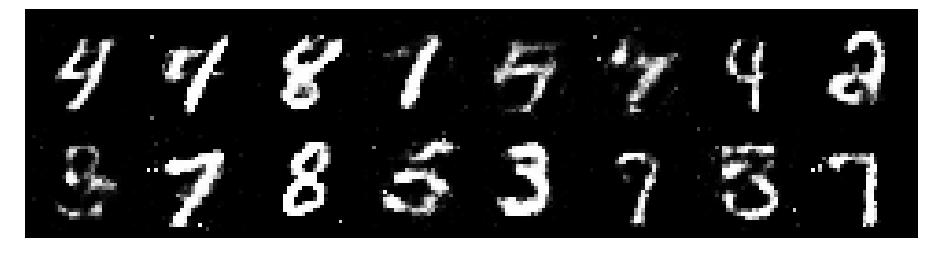

Epoch: [84/200], Batch Num: [500/600]
Discriminator Loss: 1.3575, Generator Loss: 0.8548
D(x): 0.5521, D(G(z)): 0.4783


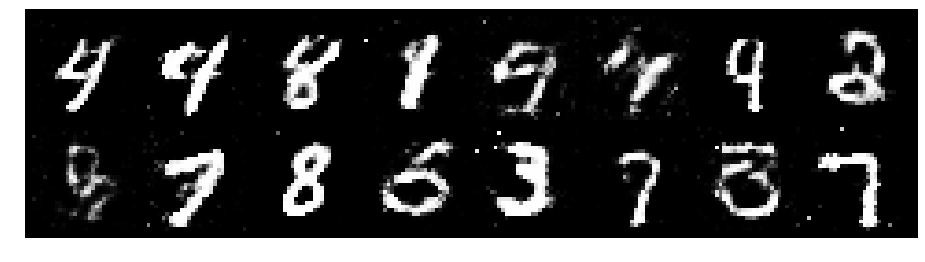

Epoch: [85/200], Batch Num: [0/600]
Discriminator Loss: 1.3127, Generator Loss: 0.8474
D(x): 0.5293, D(G(z)): 0.4580


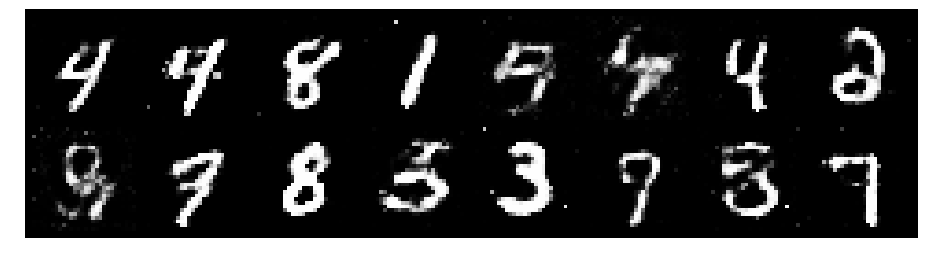

Epoch: [85/200], Batch Num: [100/600]
Discriminator Loss: 1.3436, Generator Loss: 0.9260
D(x): 0.5499, D(G(z)): 0.4661


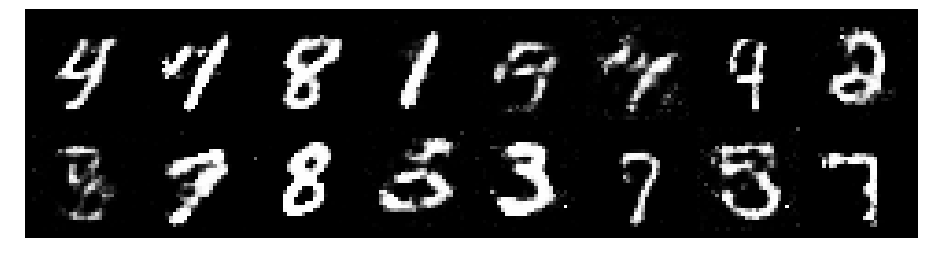

Epoch: [85/200], Batch Num: [200/600]
Discriminator Loss: 1.3472, Generator Loss: 1.0842
D(x): 0.5272, D(G(z)): 0.4354


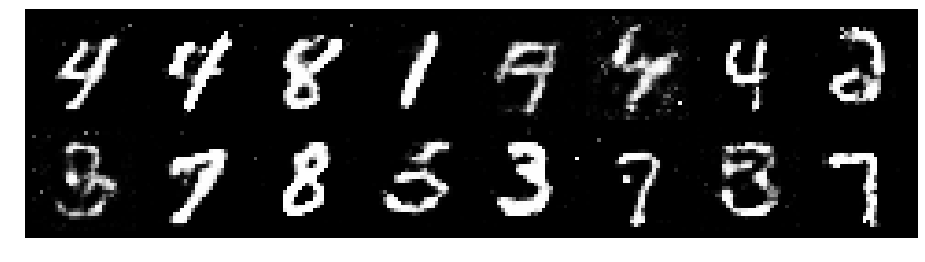

Epoch: [85/200], Batch Num: [300/600]
Discriminator Loss: 1.2081, Generator Loss: 1.0120
D(x): 0.5933, D(G(z)): 0.4180


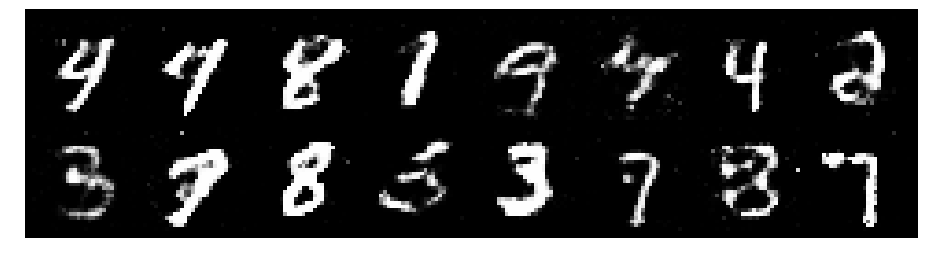

Epoch: [85/200], Batch Num: [400/600]
Discriminator Loss: 1.2946, Generator Loss: 1.2507
D(x): 0.5654, D(G(z)): 0.4147


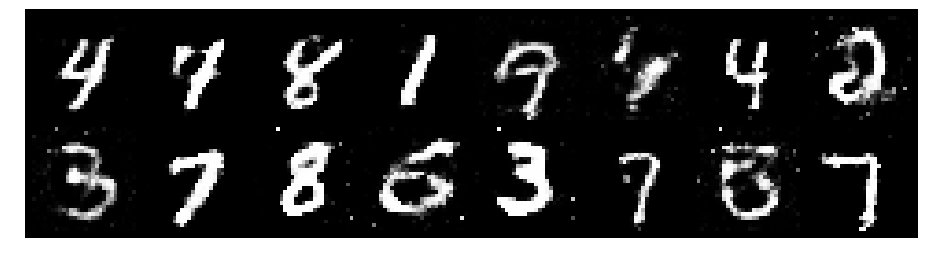

Epoch: [85/200], Batch Num: [500/600]
Discriminator Loss: 1.1528, Generator Loss: 1.0288
D(x): 0.5835, D(G(z)): 0.3864


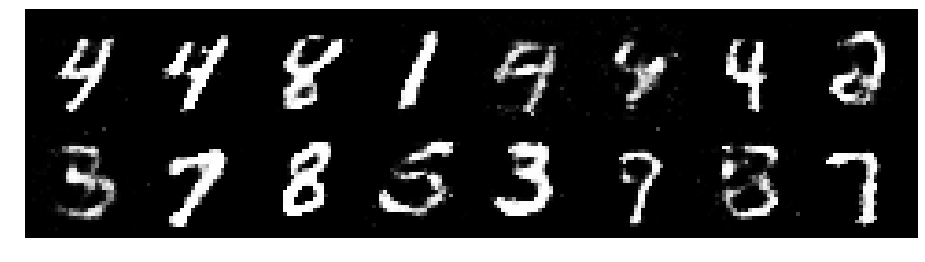

Epoch: [86/200], Batch Num: [0/600]
Discriminator Loss: 1.2416, Generator Loss: 0.9334
D(x): 0.5820, D(G(z)): 0.4409


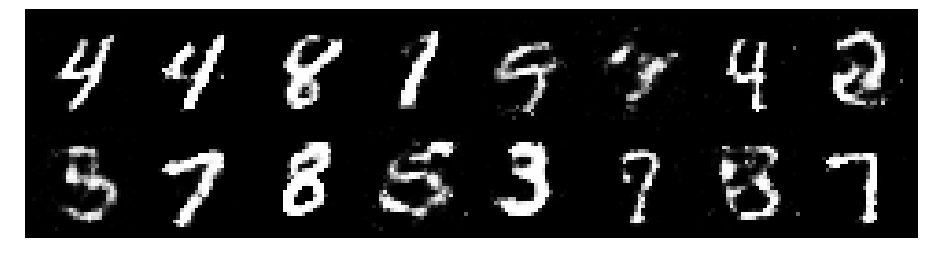

Epoch: [86/200], Batch Num: [100/600]
Discriminator Loss: 1.2058, Generator Loss: 1.0253
D(x): 0.5715, D(G(z)): 0.4315


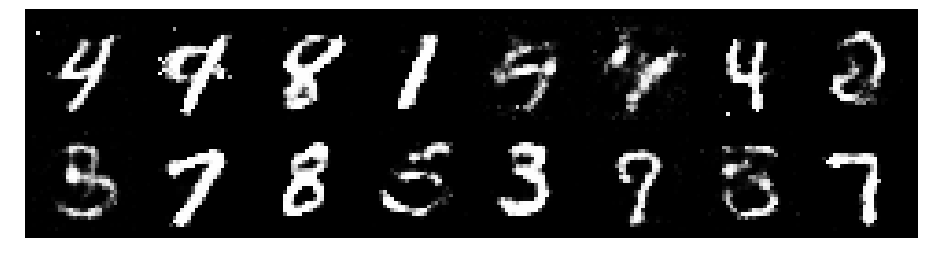

Epoch: [86/200], Batch Num: [200/600]
Discriminator Loss: 1.1450, Generator Loss: 1.0319
D(x): 0.5879, D(G(z)): 0.4156


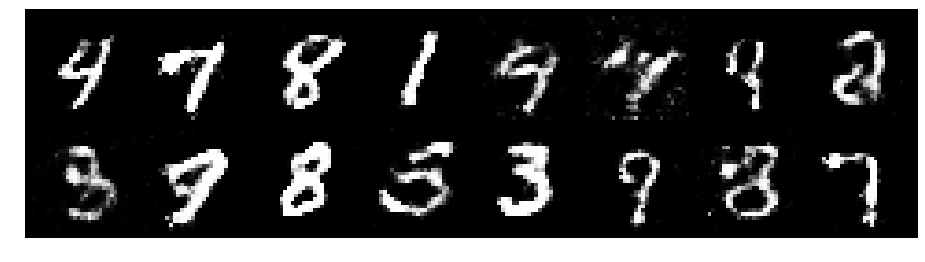

Epoch: [86/200], Batch Num: [300/600]
Discriminator Loss: 1.3408, Generator Loss: 0.9978
D(x): 0.5285, D(G(z)): 0.4450


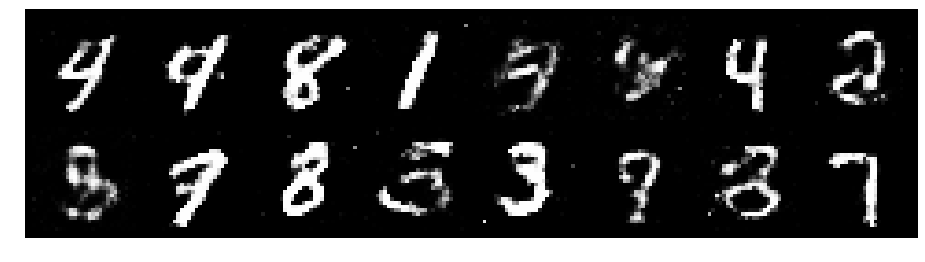

Epoch: [86/200], Batch Num: [400/600]
Discriminator Loss: 1.3730, Generator Loss: 0.8380
D(x): 0.5331, D(G(z)): 0.4747


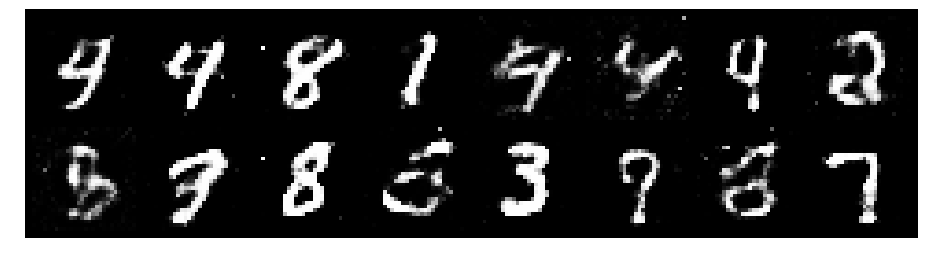

Epoch: [86/200], Batch Num: [500/600]
Discriminator Loss: 1.3540, Generator Loss: 0.8303
D(x): 0.5432, D(G(z)): 0.4688


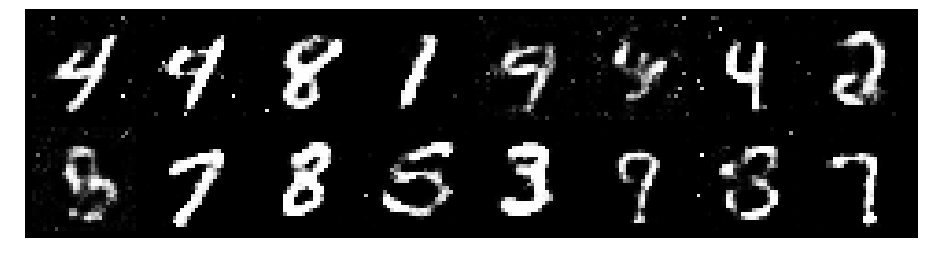

In [0]:
# Create logger instance
logger = Logger(model_name='VGAN', data_name='MNIST')

# Total number of epochs to train
num_epochs = 200

for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)

        # 1. Train Discriminator
        real_data = Variable(images_to_vectors(real_batch))

        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N)).detach()

        # Train D
        d_error, d_pred_real, d_pred_fake = \
              train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator

        # Generate fake data
        fake_data = generator(noise(N))

        # Train G
        g_error = train_generator(g_optimizer, fake_data)

        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)

        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data

            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )